# Setup

In [1]:
# @title Setup

! pip install stats
! pip install tensorflow_io

import os, numpy as np, pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import stats
import math
import warnings
warnings.simplefilter('ignore')
from datetime import datetime as dt
from datetime import timedelta
from tqdm import tqdm
# from google.colab import drive
# drive.mount('/content/drive')
import os
# os.mkdir('/content/drive/MyDrive/dsp')
# os.chdir('/content/drive/MyDrive/EnergyResearch/WeatherResearch')


def plot_custom(fx,fy):
    fig = plt.figure(figsize = (fx,fy))
    ax = plt.axes()
    ax.spines['bottom'].set_color((0.9,0.9,0.9))
    ax.spines['top'].set_color((0.9,0.9,0.9))
    ax.spines['left'].set_color((0.9,0.9,0.9))
    ax.spines['right'].set_color((0.9,0.9,0.9))
    ax.grid(color='lightgrey', linestyle='-', linewidth=0.3)
    ax.set_facecolor((1.0,1.0,1.0))
    fig.patch.set_facecolor((0.9,0.9,0.9))
    fig.patch.set_alpha(0.05)
    return ax,fig

def plot_cosmos(x,xlabel,ylabel,title):
    x.spines['bottom'].set_color((0.9,0.9,0.9))
    x.spines['top'].set_color((0.9,0.9,0.9))
    x.spines['left'].set_color((0.9,0.9,0.9))
    x.spines['right'].set_color((0.9,0.9,0.9))
    x.grid(color='lightgrey', linestyle='-', linewidth=0.3)
    x.set_facecolor((1.0,1.0,1.0))
    x.set_xlabel(xlabel)
    x.set_ylabel(ylabel)
    x.set_title(title)
    fig.patch.set_facecolor((0.9,0.9,0.9))
    fig.patch.set_alpha(0.05)

def plot_texts(xlabel,ylabel,title):
  plt.xlabel(xlabel,fontsize = 13)
  plt.ylabel(ylabel,fontsize = 13)
  plt.title(title,fontsize = 25)
  plt.legend()

# os.chdir('M:\Research\EnergyImbalance\data')



from tensorflow.python.framework import dtypes
from tensorflow_io.bigquery import BigQueryClient
from tensorflow_io.bigquery import BigQueryReadSession
from google.cloud import bigquery
from google.oauth2 import service_account

project = 'revx-259410' # Project ID inserted based on the query results selected to explore
location = 'US' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)


from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table

project = 'revx-259410' # Project ID inserted based on the query results selected to explore
location = 'US' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

# from google.colab import drive
# drive.mount('/content/drive')

import os

import pickle
from google.cloud import storage
import numpy as np
from numpy.linalg import norm
from tqdm import tqdm
import tempfile
# Replace with your bucket name and desired destination path
# bucket_name = 'affle-ds'
# destination_blob_name = '/avishek/body/prod/site_similarities/site_bgmi_similarities.pkl'
# source_file_name = 'site_bgmi_similarities.pkl'

def upload_to_gcs(bucket_name, source_file_name, destination_blob_name):
    # Initialize a client
    storage_client = storage.Client()

    # Get the bucket
    bucket = storage_client.bucket(bucket_name)

    # Create a blob object
    blob = bucket.blob(destination_blob_name)

    print(blob)

    # Upload the file to GCS
    blob.upload_from_filename(source_file_name)

    print(f"File {source_file_name} uploaded to {destination_blob_name}.")

# # Upload the pickle file to GCS
# upload_to_gcs(bucket_name, source_file_name, destination_blob_name)

# Replace with your bucket name and file path in the bucket
# bucket_name = 'affle-ds'
# source_blob_name = '/avishek/body/prod/site_similarities/site_bgmi_similarities.pkl'
# source_file_name = 'site_bgmi_similarities.pkl'

def download_and_load_pickle(bucket_name, source_blob_name):
    # Initialize a client
    storage_client = storage.Client()

    # Get the bucket
    bucket = storage_client.bucket(bucket_name)

    # Create a blob object
    blob = bucket.blob(source_blob_name)

    # Use a temporary file
    with tempfile.NamedTemporaryFile() as temp_file:
        # Download the file from GCS
        blob.download_to_filename(temp_file.name)

        # Load the pickle file
        with open(temp_file.name, 'rb') as file:
            data = pickle.load(file)

    return data

# # Download and load the pickle file from GCS
# site_embedding = download_and_load_pickle(bucket_name, source_blob_name)
# print(site_embedding)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.6/127.6 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for stats: filename=stats-0.1.2a0-py3-none-any.whl size=24282 sha256=c7de3978d743a0ab8df0d3ba4edb357670ae39ebe8b23f9fd08385b8e6a23465
  Stored in directory: /root/.cache/pip/wheels/c9/85/bc/3371b9bce1e4f7b8b638e8c968a4dbd74db171ee180c48f808
Successfully built stats
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 32.2 MB/s eta 0:00:00


# SEQUENCE GENERATOR

In [29]:
# @title Sequence Generator For LSTM

def timeseries_generator_by_category_24w(data,residual_features,primary_feature, target_col, sequence_length, batch_size, category_col,out_seq, epochs,cat_split, sample_size = None,steps = 1,target_repeater = 1):

    """
    Generator function to yield batches of sequences and labels based on a specific category.

    Parameters:
    data (DataFrame): The entire dataset including a categorical column.
    sequence_length (int): The length of each sequence.
    batch_size (int): The number of sequences per batch.
    category (str): The category to filter by.

    Yields:
    (numpy array, numpy array): A batch of sequences and their corresponding labels.
    """

    if len(residual_features) == 1:
        residual_features = residual_features[0]

    if len(primary_feature) == 1:
        primary_feature = primary_feature[0]

    if len(category_col) == 1:
        category_col = category_col[0]

    for e in range(epochs):
        for c in data[cat_split].unique():
            filtered_data = data[data[cat_split] == c].sort_values('date_hour',ascending = True).reset_index().fillna(0)
            filtered_indices = filtered_data.index
            batch = 0
            X_batch = []
            y_batch = []
            c_batch = []
            h_batch = []
            t_batch = []

            if sample_size == None:
                for idx in range(0,len(filtered_indices) - sequence_length - out_seq,steps):
                    start_idx = idx
                    end_idx = start_idx + sequence_length
                    if end_idx < len(filtered_indices):
                        X_batch.append(filtered_data[residual_features].iloc[start_idx:end_idx].values)
                        t_batch.append(filtered_data[primary_feature].iloc[start_idx:end_idx].values)
                        c_batch.append(filtered_data[category_col].iloc[start_idx:end_idx].values)
                        y_batch.append(filtered_data[target_col].iloc[end_idx: end_idx + out_seq].values)
                        h_batch.append(filtered_data[category_col].iloc[end_idx: end_idx + out_seq].values)
                        batch += 1
                        if batch >= batch_size:
                            batch = 0
                            if target_repeater == 1:
                              yield (np.array(X_batch),np.array(t_batch), np.array(c_batch),np.array(h_batch)), np.array(y_batch)
                            else:
                              yield (np.array(X_batch),np.array(t_batch), np.array(c_batch),np.array(h_batch)), tuple([np.array(y_batch)]*target_repeater)
                            X_batch = []
                            y_batch = []
                            t_batch = []
                            c_batch = []
                            h_batch = []
            else:
                for idx in range(len(filtered_indices) - sequence_length - out_seq - sample_size, len(filtered_indices) - sequence_length - out_seq,steps):
                    start_idx = idx
                    end_idx = start_idx + sequence_length
                    if end_idx < len(filtered_indices):
                        X_batch.append(filtered_data[residual_features].iloc[start_idx:end_idx].values)
                        t_batch.append(filtered_data[primary_feature].iloc[start_idx:end_idx].values)
                        c_batch.append(filtered_data[category_col].iloc[start_idx:end_idx].values)
                        y_batch.append(filtered_data[target_col].iloc[end_idx: end_idx + out_seq].values)
                        h_batch.append(filtered_data[category_col].iloc[end_idx: end_idx + out_seq].values)
                        batch += 1
                        if batch >= batch_size:
                            batch = 0
                            if target_repeater == 1:
                              yield (np.array(X_batch),np.array(t_batch), np.array(c_batch),np.array(h_batch)), np.array(y_batch)
                            else:
                              yield (np.array(X_batch),np.array(t_batch), np.array(c_batch),np.array(h_batch)), tuple([np.array(y_batch)]*target_repeater)
                            X_batch = []
                            y_batch = []
                            t_batch = []
                            c_batch = []
                            h_batch = []


def get_steps_per_epoch(data,residual_features,primary_feature, target_col, sequence_length, batch_size, category_col,out_seq, epochs,cat_split, sample_size = None,steps = 1):

    """
    Generator function to yield batches of sequences and labels based on a specific category.

    Parameters:
    data (DataFrame): The entire dataset including a categorical column.
    sequence_length (int): The length of each sequence.
    batch_size (int): The number of sequences per batch.
    category (str): The category to filter by.

    Yields:
    (numpy array, numpy array): A batch of sequences and their corresponding labels.
    """

    if len(residual_features) == 1:
        residual_features = residual_features[0]

    if len(primary_feature) == 1:
        primary_feature = primary_feature[0]

    if len(category_col) == 1:
        category_col = category_col[0]

    steps_per_epoch = 0

    for c in data[cat_split].unique():
        filtered_data = data[data[cat_split] == c].sort_values('date_hour',ascending = True).reset_index().fillna(0)
        filtered_indices = filtered_data.index
        batch = 0

        if sample_size == None:
            for idx in range(0,len(filtered_indices) - sequence_length - out_seq,steps):
                start_idx = idx
                end_idx = start_idx + sequence_length
                if end_idx < len(filtered_indices):
                    batch += 1
                    if batch >= batch_size:
                        steps_per_epoch += 1
                        batch = 0

        else:
            for idx in range(len(filtered_indices) - sequence_length - out_seq - sample_size,len(filtered_indices) - sequence_length - out_seq,steps ):
                start_idx = idx
                end_idx = start_idx + sequence_length
                if end_idx < len(filtered_indices):
                    batch += 1
                    if batch >= batch_size:
                        steps_per_epoch += 1
                        batch = 0

    return steps_per_epoch

def timeseries_generator_by_category_24w_test(data,residual_features,primary_feature, target_col, sequence_length, batch_size, category_col,out_seq, epochs,cat_split,steps = 24):

    """
    Generator function to yield batches of sequences and labels based on a specific category.

    Parameters:
    data (DataFrame): The entire dataset including a categorical column.
    sequence_length (int): The length of each sequence.
    batch_size (int): The number of sequences per batch.
    category (str): The category to filter by.

    Yields:
    (numpy array, numpy array): A batch of sequences and their corresponding labels.
    """

    if len(residual_features) == 1:
        residual_features = residual_features[0]

    if len(primary_feature) == 1:
        primary_feature = primary_feature[0]

    if len(category_col) == 1:
        category_col = category_col[0]

    for e in range(epochs):
        for c in data[cat_split].unique():
            filtered_data = data[data[cat_split] == c].sort_values('date_hour',ascending = True).reset_index().fillna(0)
            filtered_indices = filtered_data.index
            batch = 0
            X_batch = []
            y_batch = []
            c_batch = []
            t_batch = []
            h_batch = []
            d_batch = []
            for idx in tqdm(range(0,len(filtered_indices) - sequence_length - out_seq,out_seq)):
                start_idx = idx
                end_idx = start_idx + sequence_length
                if end_idx < len(filtered_indices):
                    X_batch.append(filtered_data[residual_features].iloc[start_idx:end_idx].values)
                    t_batch.append(filtered_data[primary_feature].iloc[start_idx:end_idx].values)
                    c_batch.append(filtered_data[category_col].iloc[start_idx:end_idx].values)
                    y_batch.append(filtered_data[target_col].iloc[end_idx: end_idx + out_seq].values)
                    h_batch.append(filtered_data[category_col].iloc[end_idx: end_idx + out_seq].values)
                    d_batch.append(filtered_data['date_hour'].iloc[end_idx: end_idx + out_seq].values)
                    batch += 1
#                     if batch >= batch_size:
#                         batch = 0
        return (np.array(X_batch),np.array(t_batch), np.array(c_batch),np.array(h_batch)), np.array(y_batch),np.array(d_batch)

# Hyperparameter Tuning and Time Series K Fold Validation Functions

In [ ]:
# @title Time Series K Fold Validation

def time_series_k_fold_validation(k,weather_data,feature_keys,features_residual_smooth,features_primary_smooth,
                                  TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,
                                  N_FUTURE,EPOCHS,CAT_SPLIT,
                                  VOCABULARY_SIZE,EMBEDDING_SIZE,LATENT_DIM,
                                  NUMERICAL_FEATURE_SIZE,PRIMARY_FEATURE_SIZE,NUM_VARS,
                                  OUTPUT_DIM,LEARNING_RATE,dense_unit,steps = STEPS):

  from datetime import datetime as dt
  from datetime import timedelta

  train_start_date = '2023-11-01'
  start_date = dt.strptime('2023-11-01', '%Y-%m-%d')

  rmse_list = []

  for i in range(1,k+1):

    new_date_string = start_date + timedelta(days=i*30)
    new_date_string = new_date_string.strftime('%Y-%m-%d')
    # print(new_date_string)
    train_end_date = new_date_string
    eval_end_date = '2024-05-01'
    weather_data['ll_label'] = weather_data['ll_label'].astype(int)
    weather_data['hour'] = weather_data['hour'].astype(int)
    train_df, eval_df = weather_data[(weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date)][feature_keys+['ll_label','date_hour']], \
                                          weather_data[(weather_data['date_hour'] > train_end_date) & (weather_data['date_hour'] <= eval_end_date)][feature_keys+['ll_label','date_hour']]

    eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

    train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

    validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

    steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)


    model_bpp_1 = create_global_ghi_forecast_24w_model_v1(
                                                            VOCABULARY_SIZE,
                                                            EMBEDDING_SIZE,
                                                            LATENT_DIM,
                                                            SEQ,
                                                            NUMERICAL_FEATURE_SIZE,
                                                            PRIMARY_FEATURE_SIZE,
                                                            NUM_VARS,
                                                            OUTPUT_DIM,
                                                            LEARNING_RATE,
                                                            N_FUTURE,
                                                            dense_unit
                                                                )

    history_bpp_1 = model_bpp_1.fit(
                train_loader,
                epochs=EPOCHS,
                verbose=2,
                validation_data = eval_loader,
                steps_per_epoch=steps_per_epoch,
                validation_steps=validation_steps,
                callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
                )

    X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
    y_pred_24we = model_bpp_1.predict(X_eval)
    y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
    y_pred_24we = y_pred_24we.reshape(len(y_pred_24we)*N_FUTURE,1)

    rmse = np.sqrt(np.mean(np.square(y_pred_24we - y_eval)))

    rmse_list.append(rmse)

  return np.mean(np.array(rmse_list))

In [73]:
# @title GridRandomSearchCV

import random

def gridrandomsearchcv(data,param_partition, dense_unit_range, latent_dim_range,sequence_range,batch_range,kfold, population,epochs):

  # Parameter population creation

  params_popu = []

  dense_unit_partition = np.linspace(dense_unit_range[0],dense_unit_range[1],param_partition)
  latent_dim_partition = np.linspace(latent_dim_range[0],latent_dim_range[1],param_partition)
  sequence_partition = np.linspace(sequence_range[0],sequence_range[1],param_partition)
  batch_partition = np.linspace(batch_range[0],batch_range[1],param_partition)

  for i in range(population):
    temp = []
    partitions = list(range(0,param_partition-1))
    p =random.choice(partitions)
    temp.append(random.randint(int(sequence_partition[p]),int(sequence_partition[p+1])))
    p =random.choice(partitions)
    temp.append(random.randint(int(batch_partition[p]),int(batch_partition[p+1])))
    p =random.choice(partitions)
    temp.append(random.randint(int(latent_dim_partition[p]),int(latent_dim_partition[p+1])))
    p =random.choice(partitions)
    temp.append(random.randint(int(dense_unit_partition[p]),int(dense_unit_partition[p+1])))

    params_popu.append(temp)

  eval_list = []

  for popam in tqdm(params_popu,desc = 'Hyperparamet tuning in progess'):

    print(f'sequence : {popam[0]}, batch : {popam[1]}, latent dim : {popam[1]}, dense unit : {popam[2]}')

    rmse = time_series_k_fold_validation(kfold,data,feature_keys,features_residual_smooth,features_primary_smooth,
                                          TARGET_smooth , popam[0] ,popam[1], features_category_smooth,
                                          N_FUTURE,epochs,CAT_SPLIT,
                                          VOCABULARY_SIZE,EMBEDDING_SIZE,popam[2],
                                          NUMERICAL_FEATURE_SIZE,PRIMARY_FEATURE_SIZE,NUM_VARS,
                                          OUTPUT_DIM,LEARNING_RATE,popam[3],steps = STEPS)

    eval_list.extend(popam)
    eval_list.append(kfold)
    eval_list.append(rmse)

  return eval_list

# Temperature Forecasting

## Data Loading

In [53]:
QUERY = f'''SELECT
            0 AS ll_label,
            date_hour,
            hour,
            temperature_2m,
            LAG(temperature_2m,1) OVER(ORDER BY date_hour ASC) as temp_lag_1,
            LAG(temperature_2m,2) OVER(ORDER BY date_hour ASC) as temp_lag_2,
            LAG(temperature_2m,3) OVER(ORDER BY date_hour ASC) as temp_lag_3,
            LAG(temperature_2m,4) OVER(ORDER BY date_hour ASC) as temp_lag_4,
            LAG(temperature_2m,5) OVER(ORDER BY date_hour ASC) as temp_lag_5,
            LAG(temperature_2m,6) OVER(ORDER BY date_hour ASC) as temp_lag_6,
            LAG(temperature_2m,24) OVER(ORDER BY date_hour ASC) as temp_lag_d1,
            LAG(temperature_2m,48) OVER(ORDER BY date_hour ASC) as temp_lag_d2,
            LAG(temperature_2m,72) OVER(ORDER BY date_hour ASC) as temp_lag_d3,
            LAG(temperature_2m,96) OVER(ORDER BY date_hour ASC) as temp_lag_d4,
            LAG(temperature_2m,120) OVER(ORDER BY date_hour ASC) as temp_lag_d5,
            LAG(temperature_2m,144) OVER(ORDER BY date_hour ASC) as temp_lag_d6,
            LAG(temperature_2m,168) OVER(ORDER BY date_hour ASC) as temp_lag_d7,
            LAG(temperature_2m,336) OVER(ORDER BY date_hour ASC) as temp_lag_w2,
            LAG(temperature_2m,504) OVER(ORDER BY date_hour ASC) as temp_lag_w3,
            LAG(temperature_2m,672) OVER(ORDER BY date_hour ASC) as temp_lag_w4, shortwave_radiation,vapour_pressure_deficit,relative_humidity_2m
            FROM (SELECT DISTINCT date_hour,hour,temperature_2m, shortwave_radiation,vapour_pressure_deficit,relative_humidity_2m FROM Avishek_Explore.weather_data_UK_overall); '''
query_job = client.query(QUERY)  # API request
weather_data = query_job.result().to_dataframe()
weather_data.sort_values('date_hour', ascending = True, inplace = True)
weather_data.drop_duplicates(inplace = True)
weather_data.dropna(inplace = True)

## Data Preprocessing

In [54]:
weather_data['rolling_temp_average_d'] = (weather_data['temperature_2m'] + weather_data['temp_lag_d1'] + weather_data['temp_lag_d2'] + weather_data['temp_lag_d3'] + weather_data['temp_lag_d4'] + weather_data['temp_lag_d5'] + weather_data['temp_lag_d6']  + weather_data['temp_lag_d7'])/8
weather_data['rolling_temp_average_dh'] = ( weather_data['temp_lag_d1'] + weather_data['temp_lag_d2'] + weather_data['temp_lag_d3'] + weather_data['temp_lag_d4'] + weather_data['temp_lag_d5'] + weather_data['temp_lag_d6']  + weather_data['temp_lag_d7'])/7

weather_data['residual_01'] = weather_data['temperature_2m'] - weather_data['temp_lag_1']
weather_data['residual_12'] = weather_data['temp_lag_1'] - weather_data['temp_lag_2']
weather_data['residual_23'] = weather_data['temp_lag_2'] - weather_data['temp_lag_3']
weather_data['residual_34'] = weather_data['temp_lag_3'] - weather_data['temp_lag_4']
weather_data['residual_45'] = weather_data['temp_lag_4'] - weather_data['temp_lag_5']
weather_data['rolling_residual_average'] = (weather_data['residual_01'] + weather_data['residual_12'] + weather_data['residual_23'] + weather_data['residual_34'] + weather_data['residual_45'])/5

weather_data['residual_d01'] = weather_data['temperature_2m'] - weather_data['temp_lag_d1']
weather_data['residual_d12'] = weather_data['temp_lag_d1'] - weather_data['temp_lag_d2']
weather_data['residual_d23'] = weather_data['temp_lag_d2'] - weather_data['temp_lag_d3']
weather_data['residual_d34'] = weather_data['temp_lag_d3'] - weather_data['temp_lag_d4']
weather_data['residual_d45'] = weather_data['temp_lag_d4'] - weather_data['temp_lag_d5']
weather_data['residual_d56'] = weather_data['temp_lag_d5'] - weather_data['temp_lag_d6']
weather_data['residual_d67'] = weather_data['temp_lag_d6'] - weather_data['temp_lag_d7']
weather_data['d_rolling_residual_average'] = (weather_data['residual_d01'] + \
                                              weather_data['residual_d12'] + \
                                              weather_data['residual_d23'] + \
                                              weather_data['residual_d34'] + \
                                              weather_data['residual_d45'] + \
                                              weather_data['residual_d56'] + \
                                              weather_data['residual_d67'])/7

weather_data['dh_rolling_residual_average'] = (weather_data['residual_d12'] + \
                                              weather_data['residual_d23'] + \
                                              weather_data['residual_d34'] + \
                                              weather_data['residual_d45'] + \
                                              weather_data['residual_d56'] + \
                                              weather_data['residual_d67'])/6

weather_data['residual_w12'] = weather_data['temp_lag_d7'] - weather_data['temp_lag_w2']
weather_data['residual_w23'] = weather_data['temp_lag_w2'] - weather_data['temp_lag_w3']
weather_data['residual_w34'] = weather_data['temp_lag_w3'] - weather_data['temp_lag_w4']

In [55]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# feature_ss_r = dict()

for col in [c for c in weather_data.columns]:
  if col in ['date_hour','hour']:
    pass
  else:
    t_ss_r = StandardScaler()
    # feature_ss_r[col] = t_ss_r
    t_ss_r.fit(np.array(weather_data[f"{col}"]).reshape(-1,1))
    scaled_data = t_ss_r.transform(np.array(weather_data[f"{col}"]).reshape(-1,1))
    weather_data[f"{col}_normalized"] = scaled_data

In [56]:
window_length = 24  # Must be an odd number
polyorder = 1  # The degree of the polynomial used to fit the samples
# smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Fit the model
for f in weather_data.columns:
  if f.find('smooth') == -1:
    if f in ['temp_mean','temp_std','date_hour','date','hour','ll_label']:
      pass
    else:
      weather_data[f"{f}_smooth"] = savgol_filter(weather_data[f], window_length, polyorder)

In [58]:
# @title Initial Features
initial_features =  ['temperature_2m', 'temp_lag_1',
       'temp_lag_2', 'temp_lag_3', 'temp_lag_4', 'temp_lag_5', 'temp_lag_6',
       'temp_lag_d1', 'temp_lag_d2', 'temp_lag_d3', 'temp_lag_d4',
       'temp_lag_d5', 'temp_lag_d6', 'temp_lag_d7', 'temp_lag_w2',
       'temp_lag_w3', 'temp_lag_w4', 'rolling_temp_average_d',
       'rolling_temp_average_dh', 'residual_01', 'residual_12', 'residual_23',
       'residual_34', 'residual_45', 'rolling_residual_average',
       'residual_d01', 'residual_d12', 'residual_d23', 'residual_d34',
       'residual_d45', 'residual_d56', 'residual_d67',
       'd_rolling_residual_average', 'dh_rolling_residual_average',
       'residual_w12', 'residual_w23', 'residual_w34', 'll_label_normalized',
       'temperature_2m_normalized', 'temp_lag_1_normalized',
       'temp_lag_2_normalized', 'temp_lag_3_normalized',
       'temp_lag_4_normalized', 'temp_lag_5_normalized',
       'temp_lag_6_normalized', 'temp_lag_d1_normalized',
       'temp_lag_d2_normalized', 'temp_lag_d3_normalized',
       'temp_lag_d4_normalized', 'temp_lag_d5_normalized',
       'temp_lag_d6_normalized', 'temp_lag_d7_normalized',
       'temp_lag_w2_normalized', 'temp_lag_w3_normalized',
       'temp_lag_w4_normalized', 'rolling_temp_average_d_normalized',
       'rolling_temp_average_dh_normalized', 'residual_01_normalized',
       'residual_12_normalized', 'residual_23_normalized',
       'residual_34_normalized', 'residual_45_normalized',
       'rolling_residual_average_normalized', 'residual_d01_normalized',
       'residual_d12_normalized', 'residual_d23_normalized',
       'residual_d34_normalized', 'residual_d45_normalized',
       'residual_d56_normalized', 'residual_d67_normalized',
       'd_rolling_residual_average_normalized',
       'dh_rolling_residual_average_normalized', 'residual_w12_normalized',
       'residual_w23_normalized', 'residual_w34_normalized']

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in initial_features:
  corr_list.append(pearsonr(weather_data[col],weather_data['temperature_2m'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Temperature'])
corr_df.sort_values('Correlation with Temperature',ascending = True,inplace = True)
corr_df['Correlation with Temperature'] = corr_df['Correlation with Temperature'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Temperature'], color = 'tomato')
plot_cosmos(ax,'Correlation with Temperature','Features','GHI Correlation Analysis')

In [ ]:
# @title Residual Percentage Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in [c for c in weather_data.columns if c.find('percentage') > -1]:
  corr_list.append(pearsonr(weather_data[col],weather_data['temperature_2m_normalized'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Temperature'])
corr_df.sort_values('Correlation with Temperature',ascending = True,inplace = True)
corr_df['Correlation with Temperature'] = corr_df['Correlation with Temperature'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Temperature'], color = '#B2BABB')
plot_cosmos(ax,'Correlation with Temperature','Features','GHI Correlation Analysis')

## Model Development

In [75]:
features_residual = ['temp_lag_d1_normalized_smooth',
                      'temp_lag_d2_normalized_smooth', 'temp_lag_d3_normalized_smooth',
                      'temp_lag_d4_normalized_smooth', 'temp_lag_d5_normalized_smooth',
                      'temp_lag_d6_normalized_smooth', 'temp_lag_d7_normalized_smooth']
features_category =[ 'temp_lag_d1_normalized_smooth',
                      'temp_lag_d2_normalized_smooth', 'temp_lag_d3_normalized_smooth',
                      'temp_lag_d4_normalized_smooth', 'temp_lag_d5_normalized_smooth',
                      'temp_lag_d6_normalized_smooth', 'temp_lag_d7_normalized_smooth']
features_primary = [
                      'temperature_2m_normalized_smooth'
                      ]
TARGET = [
                      'temperature_2m_normalized_smooth'
                      ]
feature_keys = list(set(features_category + features_residual + features_primary+TARGET))
VOCABULARY_SIZE = 10
EMBEDDING_SIZE = 3
LATENT_DIM = 12
SEQ = 168
NUMERICAL_FEATURE_SIZE = len(features_residual)
PRIMARY_FEATURE_SIZE = len(features_primary)
NUM_VARS = len(features_category)
OUTPUT_DIM = len(TARGET)
LEARNING_RATE = 0.001
N_FUTURE = 24
TARGET_REPEAT = 1

BATCH_SIZE = 7
EPOCHS = 20
SAMPLE_SIZE = None
STEPS = 1

TABLE_NAME = 'weather_data_UK_overall'
CAT_SPLIT = 'll_label'
GCP_BUCKET = 'affle-ds'

In [63]:
# @title LSTM Model Temperature


def create_global_temperature_forecast_24w_model_v1(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'temperature_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1, activation = 'tanh'), name = 'Historic_dense')
        time_series_projection = dense_historic(time_series_projection)

        # time_series_futuristic = BatchNormalization(name = 'Batch_Normalization_2')(inputs[3])
        # time_series_futuristic = LSTM(latent_dim, return_sequences=True, name="LSTM_Futuristic")(time_series_futuristic)
        # dense_futuristic = TimeDistributed(Dense(1), name = 'dense_futuristic')
        # time_series_futuristic = dense_futuristic(time_series_futuristic)

        hf_concat= Concatenate(name = 'Concatenate_Historic_and_Futuristic_Inputs')([time_series_projection,inputs[3]])
        final_dense = TimeDistributed(Dense(1), name = 'output')
        output = final_dense(hf_concat)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'temperature_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

In [64]:
# QUERY = f'''SELECT * FROM Avishek_Explore.{TABLE_NAME} ORDER BY ll_label,date_hour; '''
# query_job = client.query(QUERY)  # API request
# weather_data = query_job.result().to_dataframe()

In [66]:
train_start_date = '2022-11-01'
train_end_date = '2023-11-01'
eval_end_date = '2023-12-01'
weather_data['ll_label'] = weather_data['ll_label'].astype(int)
weather_data['hour'] = weather_data['hour'].astype(int)
train_df, eval_df = weather_data[(weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date)][feature_keys+['ll_label','date_hour']], \
                                       weather_data[(weather_data['date_hour'] > train_end_date) & (weather_data['date_hour'] <= eval_end_date)][feature_keys+['ll_label','date_hour']]

test_df = weather_data[weather_data['date_hour'] > eval_end_date][feature_keys+['ll_label','date_hour']]

In [67]:
# from statsmodels.tsa.holtwinters import ExponentialSmoothing

# # Fit the model
# model_exp_train = ExponentialSmoothing(train_df[TARGET[0]], trend='add')
# fit = model_exp_train.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[TARGET[0]] = fit.fittedvalues

# model_exp_train_norm = ExponentialSmoothing(train_df[features_primary[0]], trend='add')
# fit = model_exp_train_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[features_primary[0]] = fit.fittedvalues

# model_exp_eval = ExponentialSmoothing(eval_df[TARGET[0]], trend='add')
# fit = model_exp_eval.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[TARGET[0]] = fit.fittedvalues

# model_exp_eval_norm = ExponentialSmoothing(eval_df[features_primary[0]], trend='add')
# fit = model_exp_eval_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[features_primary[0]] = fit.fittedvalues

# model_exp_test = ExponentialSmoothing(test_df[TARGET[0]], trend='add')
# fit = model_exp_test.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[TARGET[0]] = fit.fittedvalues

# model_exp_test_norm = ExponentialSmoothing(test_df[features_primary[0]], trend='add')
# fit = model_exp_test_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[features_primary[0]] = fit.fittedvalues

In [68]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8761 entries, 705 to 2757
Data columns (total 10 columns):
 #   Column                            Non-Null Count  Dtype              
---  ------                            --------------  -----              
 0   temp_lag_d7_normalized_smooth     8761 non-null   float64            
 1   temp_lag_d1_normalized_smooth     8761 non-null   float64            
 2   temperature_2m_normalized_smooth  8761 non-null   float64            
 3   temp_lag_d3_normalized_smooth     8761 non-null   float64            
 4   temp_lag_d2_normalized_smooth     8761 non-null   float64            
 5   temp_lag_d6_normalized_smooth     8761 non-null   float64            
 6   temp_lag_d4_normalized_smooth     8761 non-null   float64            
 7   temp_lag_d5_normalized_smooth     8761 non-null   float64            
 8   ll_label                          8761 non-null   int64              
 9   date_hour                         8761 non-null   datetime64[us, U

In [69]:
# ,4,5,6,7,8,9

eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS,target_repeater = TARGET_REPEAT)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

X_test,y_test,_ = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

# y_test = y_test.reshape(len(y_test)*N_FUTURE,1)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 206/206 [00:00<00:00, 355.61it/s]


(1224, 75, 706)

In [70]:
def set_cloud_dirs(GCP_BUCKET, job_dir):
    relative_path = job_dir.split(GCP_BUCKET+"/")[1]
    output_path = relative_path+'/outputs/'
    log_path = relative_path+'/logs/profile/'
    return output_path, log_path
cloud_output_dir, cloud_log_dir = set_cloud_dirs(GCP_BUCKET, 'gs://affle-ds/avishek/body/Research/weather_forecast/experiment/temperature_global_all_campaign/local')

In [71]:
def get_callbacks(log_path, GCP_BUCKET):
    import tensorflow as tf

    def scheduler(epoch, lr):

        if epoch % 2 == 0:

            if lr >= 0.00001:

                return lr

            else:

                return 0.001

        else:

            return lr

    cloud_log_dir = os.path.join("gs://", GCP_BUCKET, log_path)

    checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="outputs/best_temp_model.keras", verbose=1, save_best_only=True, monitor="val_rmse", mode="min")

    earlyStopper  = tf.keras.callbacks.EarlyStopping(
                                    monitor="loss",
                                    min_delta=0.001,
                                    patience=5,
                                    verbose=0,
                                    mode="min",
                                    restore_best_weights = True
                                )

    LRScheduler = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=0)

    plateau = tf.keras.callbacks.ReduceLROnPlateau(
                                                                                                    monitor="val_rmse",
                                                                                                    factor=0.5,
                                                                                                    patience=1,
                                                                                                    verbose=0,
                                                                                                    mode="min",
                                                                                                    min_delta=0.01,
                                                                                                    cooldown=0,
                                                                                                    min_lr=0.00001,
                                                                                                )
#     csv_logger = tf.keras.callbacks.CSVLogger("outputs/history.log")

    return [checkpointer,earlyStopper,LRScheduler,plateau]


## Hyperparameter Training

In [77]:
features_residual_smooth = ['temp_lag_d1_normalized_smooth',
                      'temp_lag_d2_normalized_smooth', 'temp_lag_d3_normalized_smooth',
                      'temp_lag_d4_normalized_smooth', 'temp_lag_d5_normalized_smooth',
                      'temp_lag_d6_normalized_smooth', 'temp_lag_d7_normalized_smooth']
features_category_smooth =[ 'temp_lag_d1_normalized_smooth',
                      'temp_lag_d2_normalized_smooth', 'temp_lag_d3_normalized_smooth',
                      'temp_lag_d4_normalized_smooth', 'temp_lag_d5_normalized_smooth',
                      'temp_lag_d6_normalized_smooth', 'temp_lag_d7_normalized_smooth']
features_primary_smooth = [
                      'temperature_2m_normalized_smooth'
                      ]
TARGET_smooth = [
                      'temperature_2m_normalized_smooth'
                      ]

temp_hpt = gridrandomsearchcv(weather_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)
hp_df = pd.DataFrame(np.array(temp_hpt).reshape(20,6), columns = ['sequence','batch','latent dim','dense unit','kfold','RMSE'])
hp_df[hp_df['RMSE'] == hp_df['RMSE'].min()]

Hyperparamet tuning in progess:   0%|          | 0/20 [00:00<?, ?it/s]

sequence : 163, batch : 22, latent dim : 22, dense unit : 122
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.31339, saving model to outputs/best_temp_model.keras
24/24 - 25s - 1s/step - loss: 0.1237 - rmse: 0.3518 - val_loss: 0.0982 - val_rmse: 0.3134 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.31339 to 0.26818, saving model to outputs/best_temp_model.keras
24/24 - 18s - 739ms/step - loss: 0.1283 - rmse: 0.3582 - val_loss: 0.0719 - val_rmse: 0.2682 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.26818 to 0.26547, saving model to outputs/best_temp_model.keras
24/24 - 17s - 705ms/step - loss: 0.0990 - rmse: 0.3146 - val_loss: 0.0705 - val_rmse: 0.2655 - learning_rate: 0.0010



100%|██████████| 145/145 [00:00<00:00, 359.45it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 299ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.42838, saving model to outputs/best_temp_model.keras
57/57 - 29s - 503ms/step - loss: 0.1458 - rmse: 0.3818 - val_loss: 0.1835 - val_rmse: 0.4284 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.42838
57/57 - 23s - 405ms/step - loss: 0.1833 - rmse: 0.4282 - val_loss: 0.2337 - val_rmse: 0.4834 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.42838
57/57 - 21s - 362ms/step - loss: 0.1912 - rmse: 0.4373 - val_loss: 0.2937 - val_rmse: 0.5420 - learning_rate: 5.0000e-04



100%|██████████| 115/115 [00:00<00:00, 379.96it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 352ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.29025, saving model to outputs/best_temp_model.keras
89/89 - 33s - 374ms/step - loss: 0.1986 - rmse: 0.4456 - val_loss: 0.0842 - val_rmse: 0.2903 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.29025 to 0.22085, saving model to outputs/best_temp_model.keras
89/89 - 24s - 267ms/step - loss: 0.1131 - rmse: 0.3362 - val_loss: 0.0488 - val_rmse: 0.2209 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.22085
89/89 - 23s - 253ms/step - loss: 0.1000 - rmse: 0.3163 - val_loss: 0.0682 - val_rmse: 0.2612 - learning_rate: 0.0010



100%|██████████| 85/85 [00:00<00:00, 357.26it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 485ms/step


Hyperparamet tuning in progess:   5%|▌         | 1/20 [04:07<1:18:14, 247.10s/it]

sequence : 26, batch : 10, latent dim : 10, dense unit : 40
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.41826, saving model to outputs/best_temp_model.keras
67/67 - 20s - 302ms/step - loss: 0.1561 - rmse: 0.3951 - val_loss: 0.1749 - val_rmse: 0.4183 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.41826
67/67 - 13s - 188ms/step - loss: 0.3174 - rmse: 0.5634 - val_loss: 0.4418 - val_rmse: 0.6647 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.41826
67/67 - 13s - 189ms/step - loss: 0.1389 - rmse: 0.3726 - val_loss: 0.3464 - val_rmse: 0.5885 - learning_rate: 5.0000e-04



100%|██████████| 150/150 [00:00<00:00, 360.49it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.59919, saving model to outputs/best_temp_model.keras
139/139 - 20s - 144ms/step - loss: 0.2087 - rmse: 0.4569 - val_loss: 0.3590 - val_rmse: 0.5992 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.59919
139/139 - 13s - 91ms/step - loss: 0.2247 - rmse: 0.4740 - val_loss: 0.4533 - val_rmse: 0.6733 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.59919 to 0.44794, saving model to outputs/best_temp_model.keras
139/139 - 12s - 89ms/step - loss: 0.2664 - rmse: 0.5161 - val_loss: 0.2006 - val_rmse: 0.4479 - learning_rate: 5.0000e-04



100%|██████████| 120/120 [00:00<00:00, 395.56it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 286ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.49982, saving model to outputs/best_temp_model.keras
211/211 - 20s - 93ms/step - loss: 0.2046 - rmse: 0.4523 - val_loss: 0.2498 - val_rmse: 0.4998 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.49982 to 0.49703, saving model to outputs/best_temp_model.keras
211/211 - 13s - 61ms/step - loss: 0.1750 - rmse: 0.4183 - val_loss: 0.2470 - val_rmse: 0.4970 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.49703 to 0.22211, saving model to outputs/best_temp_model.keras
211/211 - 13s - 60ms/step - loss: 0.1532 - rmse: 0.3914 - val_loss: 0.0493 - val_rmse: 0.2221 - learning_rate: 5.0000e-04



100%|██████████| 90/90 [00:00<00:00, 375.93it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 415ms/step


Hyperparamet tuning in progess:  10%|█         | 2/20 [06:29<55:40, 185.60s/it]  

sequence : 61, batch : 8, latent dim : 8, dense unit : 91
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.89199, saving model to outputs/best_temp_model.keras
79/79 - 21s - 265ms/step - loss: 0.4376 - rmse: 0.6615 - val_loss: 0.7957 - val_rmse: 0.8920 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.89199 to 0.76700, saving model to outputs/best_temp_model.keras
79/79 - 14s - 179ms/step - loss: 0.5588 - rmse: 0.7475 - val_loss: 0.5883 - val_rmse: 0.7670 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.76700 to 0.70554, saving model to outputs/best_temp_model.keras
79/79 - 14s - 177ms/step - loss: 0.5389 - rmse: 0.7341 - val_loss: 0.4978 - val_rmse: 0.7055 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 335.70it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.66306, saving model to outputs/best_temp_model.keras
169/169 - 26s - 154ms/step - loss: 0.3887 - rmse: 0.6234 - val_loss: 0.4396 - val_rmse: 0.6631 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.66306 to 0.56890, saving model to outputs/best_temp_model.keras
169/169 - 15s - 91ms/step - loss: 0.2525 - rmse: 0.5025 - val_loss: 0.3236 - val_rmse: 0.5689 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.56890 to 0.53037, saving model to outputs/best_temp_model.keras
169/169 - 15s - 90ms/step - loss: 0.2734 - rmse: 0.5229 - val_loss: 0.2813 - val_rmse: 0.5304 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 387.24it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 312ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.52372, saving model to outputs/best_temp_model.keras
259/259 - 24s - 91ms/step - loss: 2.0176 - rmse: 1.4204 - val_loss: 0.2743 - val_rmse: 0.5237 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.52372 to 0.40652, saving model to outputs/best_temp_model.keras
259/259 - 16s - 64ms/step - loss: 0.7409 - rmse: 0.8607 - val_loss: 0.1653 - val_rmse: 0.4065 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.40652
259/259 - 16s - 63ms/step - loss: 0.5967 - rmse: 0.7725 - val_loss: 0.1738 - val_rmse: 0.4169 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 368.83it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 443ms/step


Hyperparamet tuning in progess:  15%|█▌        | 3/20 [09:19<50:30, 178.24s/it]

sequence : 41, batch : 18, latent dim : 18, dense unit : 45
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.42931, saving model to outputs/best_temp_model.keras
36/36 - 18s - 514ms/step - loss: 0.1357 - rmse: 0.3684 - val_loss: 0.1843 - val_rmse: 0.4293 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.42931
36/36 - 11s - 317ms/step - loss: 0.2530 - rmse: 0.5030 - val_loss: 0.5994 - val_rmse: 0.7742 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.42931 to 0.39717, saving model to outputs/best_temp_model.keras
36/36 - 11s - 316ms/step - loss: 0.0886 - rmse: 0.2977 - val_loss: 0.1577 - val_rmse: 0.3972 - learning_rate: 5.0000e-04



100%|██████████| 150/150 [00:00<00:00, 381.86it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 219ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.40000, saving model to outputs/best_temp_model.keras
76/76 - 18s - 241ms/step - loss: 0.1408 - rmse: 0.3752 - val_loss: 0.1600 - val_rmse: 0.4000 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.40000 to 0.35787, saving model to outputs/best_temp_model.keras
76/76 - 12s - 153ms/step - loss: 0.1373 - rmse: 0.3705 - val_loss: 0.1281 - val_rmse: 0.3579 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.35787
76/76 - 11s - 145ms/step - loss: 0.1086 - rmse: 0.3296 - val_loss: 0.1790 - val_rmse: 0.4231 - learning_rate: 0.0010



100%|██████████| 120/120 [00:00<00:00, 391.05it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 294ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.22023, saving model to outputs/best_temp_model.keras
116/116 - 19s - 161ms/step - loss: 0.1435 - rmse: 0.3788 - val_loss: 0.0485 - val_rmse: 0.2202 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.22023
116/116 - 12s - 101ms/step - loss: 0.0922 - rmse: 0.3036 - val_loss: 0.0619 - val_rmse: 0.2487 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.22023 to 0.20008, saving model to outputs/best_temp_model.keras
116/116 - 11s - 99ms/step - loss: 0.0849 - rmse: 0.2914 - val_loss: 0.0400 - val_rmse: 0.2001 - learning_rate: 5.0000e-04



100%|██████████| 90/90 [00:00<00:00, 357.26it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 461ms/step


Hyperparamet tuning in progess:  20%|██        | 4/20 [11:30<42:36, 159.77s/it]

sequence : 56, batch : 11, latent dim : 11, dense unit : 3
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.33834, saving model to outputs/best_temp_model.keras
58/58 - 19s - 329ms/step - loss: 0.2158 - rmse: 0.4646 - val_loss: 0.1145 - val_rmse: 0.3383 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.33834 to 0.30232, saving model to outputs/best_temp_model.keras
58/58 - 12s - 211ms/step - loss: 0.1718 - rmse: 0.4145 - val_loss: 0.0914 - val_rmse: 0.3023 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.30232 to 0.28477, saving model to outputs/best_temp_model.keras
58/58 - 12s - 205ms/step - loss: 0.1512 - rmse: 0.3889 - val_loss: 0.0811 - val_rmse: 0.2848 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 343.31it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.71959, saving model to outputs/best_temp_model.keras
123/123 - 19s - 157ms/step - loss: 2.5846 - rmse: 1.6077 - val_loss: 2.9570 - val_rmse: 1.7196 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 1.71959 to 0.99887, saving model to outputs/best_temp_model.keras
123/123 - 13s - 102ms/step - loss: 0.8893 - rmse: 0.9430 - val_loss: 0.9977 - val_rmse: 0.9989 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.99887 to 0.76957, saving model to outputs/best_temp_model.keras
123/123 - 12s - 99ms/step - loss: 0.5565 - rmse: 0.7460 - val_loss: 0.5922 - val_rmse: 0.7696 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 365.33it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.43291, saving model to outputs/best_temp_model.keras
189/189 - 20s - 105ms/step - loss: 0.3353 - rmse: 0.5791 - val_loss: 0.1874 - val_rmse: 0.4329 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.43291 to 0.36406, saving model to outputs/best_temp_model.keras
189/189 - 13s - 69ms/step - loss: 0.1955 - rmse: 0.4421 - val_loss: 0.1325 - val_rmse: 0.3641 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.36406 to 0.32678, saving model to outputs/best_temp_model.keras
189/189 - 13s - 67ms/step - loss: 0.1454 - rmse: 0.3813 - val_loss: 0.1068 - val_rmse: 0.3268 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 379.16it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 438ms/step


Hyperparamet tuning in progess:  25%|██▌       | 5/20 [13:57<38:44, 154.97s/it]

sequence : 48, batch : 13, latent dim : 13, dense unit : 73
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.56358, saving model to outputs/best_temp_model.keras
49/49 - 19s - 389ms/step - loss: 0.1113 - rmse: 0.3336 - val_loss: 0.3176 - val_rmse: 0.5636 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.56358 to 0.33000, saving model to outputs/best_temp_model.keras
49/49 - 12s - 248ms/step - loss: 0.2108 - rmse: 0.4591 - val_loss: 0.1089 - val_rmse: 0.3300 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.33000
49/49 - 12s - 241ms/step - loss: 0.1853 - rmse: 0.4304 - val_loss: 0.2091 - val_rmse: 0.4573 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 331.48it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 220ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.38537, saving model to outputs/best_temp_model.keras
105/105 - 20s - 187ms/step - loss: 0.1894 - rmse: 0.4352 - val_loss: 0.1485 - val_rmse: 0.3854 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.38537 to 0.37933, saving model to outputs/best_temp_model.keras
105/105 - 13s - 123ms/step - loss: 0.1490 - rmse: 0.3860 - val_loss: 0.1439 - val_rmse: 0.3793 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.37933
105/105 - 12s - 117ms/step - loss: 0.1286 - rmse: 0.3587 - val_loss: 0.1970 - val_rmse: 0.4439 - learning_rate: 5.0000e-04



100%|██████████| 119/119 [00:00<00:00, 364.00it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 286ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.29501, saving model to outputs/best_temp_model.keras
160/160 - 20s - 124ms/step - loss: 0.1103 - rmse: 0.3321 - val_loss: 0.0870 - val_rmse: 0.2950 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.29501 to 0.24318, saving model to outputs/best_temp_model.keras
160/160 - 13s - 82ms/step - loss: 0.0994 - rmse: 0.3153 - val_loss: 0.0591 - val_rmse: 0.2432 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.24318 to 0.22893, saving model to outputs/best_temp_model.keras
160/160 - 13s - 79ms/step - loss: 0.0924 - rmse: 0.3041 - val_loss: 0.0524 - val_rmse: 0.2289 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 376.56it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 430ms/step


Hyperparamet tuning in progess:  30%|███       | 6/20 [16:17<35:00, 150.07s/it]

sequence : 91, batch : 9, latent dim : 9, dense unit : 119
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.81431, saving model to outputs/best_temp_model.keras
67/67 - 23s - 338ms/step - loss: 0.1267 - rmse: 0.3559 - val_loss: 0.6631 - val_rmse: 0.8143 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.81431 to 0.74313, saving model to outputs/best_temp_model.keras
67/67 - 16s - 238ms/step - loss: 0.1111 - rmse: 0.3333 - val_loss: 0.5522 - val_rmse: 0.7431 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.74313 to 0.72288, saving model to outputs/best_temp_model.keras
67/67 - 16s - 234ms/step - loss: 0.1469 - rmse: 0.3832 - val_loss: 0.5226 - val_rmse: 0.7229 - learning_rate: 0.0010



100%|██████████| 148/148 [00:00<00:00, 343.51it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.34923, saving model to outputs/best_temp_model.keras
147/147 - 25s - 171ms/step - loss: 0.1346 - rmse: 0.3669 - val_loss: 0.1220 - val_rmse: 0.3492 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.34923 to 0.31475, saving model to outputs/best_temp_model.keras
147/147 - 18s - 125ms/step - loss: 0.1153 - rmse: 0.3396 - val_loss: 0.0991 - val_rmse: 0.3147 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.31475 to 0.29897, saving model to outputs/best_temp_model.keras
147/147 - 18s - 123ms/step - loss: 0.1198 - rmse: 0.3461 - val_loss: 0.0894 - val_rmse: 0.2990 - learning_rate: 0.0010



100%|██████████| 118/118 [00:00<00:00, 362.89it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 309ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.36149, saving model to outputs/best_temp_model.keras
227/227 - 33s - 145ms/step - loss: 0.1672 - rmse: 0.4090 - val_loss: 0.1307 - val_rmse: 0.3615 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.36149
227/227 - 21s - 91ms/step - loss: 0.2240 - rmse: 0.4733 - val_loss: 0.2081 - val_rmse: 0.4562 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.36149 to 0.22248, saving model to outputs/best_temp_model.keras
227/227 - 21s - 90ms/step - loss: 0.1932 - rmse: 0.4395 - val_loss: 0.0495 - val_rmse: 0.2225 - learning_rate: 5.0000e-04



100%|██████████| 88/88 [00:00<00:00, 380.89it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 481ms/step


Hyperparamet tuning in progess:  35%|███▌      | 7/20 [19:35<35:52, 165.55s/it]

sequence : 110, batch : 9, latent dim : 9, dense unit : 21
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.37128, saving model to outputs/best_temp_model.keras
65/65 - 21s - 323ms/step - loss: 0.1659 - rmse: 0.4073 - val_loss: 0.1379 - val_rmse: 0.3713 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.37128 to 0.29403, saving model to outputs/best_temp_model.keras
65/65 - 14s - 213ms/step - loss: 0.2920 - rmse: 0.5404 - val_loss: 0.0865 - val_rmse: 0.2940 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.29403
65/65 - 14s - 212ms/step - loss: 0.1546 - rmse: 0.3932 - val_loss: 0.0917 - val_rmse: 0.3028 - learning_rate: 0.0010



100%|██████████| 147/147 [00:00<00:00, 372.70it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.37594, saving model to outputs/best_temp_model.keras
145/145 - 22s - 152ms/step - loss: 0.1134 - rmse: 0.3368 - val_loss: 0.1413 - val_rmse: 0.3759 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.37594
145/145 - 15s - 103ms/step - loss: 0.1254 - rmse: 0.3541 - val_loss: 0.1590 - val_rmse: 0.3987 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.37594
145/145 - 15s - 103ms/step - loss: 0.1269 - rmse: 0.3563 - val_loss: 0.1458 - val_rmse: 0.3818 - learning_rate: 5.0000e-04



100%|██████████| 117/117 [00:00<00:00, 383.15it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 298ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.26033, saving model to outputs/best_temp_model.keras
225/225 - 23s - 104ms/step - loss: 0.1366 - rmse: 0.3695 - val_loss: 0.0678 - val_rmse: 0.2603 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.26033 to 0.24455, saving model to outputs/best_temp_model.keras
225/225 - 17s - 73ms/step - loss: 0.1122 - rmse: 0.3349 - val_loss: 0.0598 - val_rmse: 0.2446 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.24455 to 0.23436, saving model to outputs/best_temp_model.keras
225/225 - 16s - 73ms/step - loss: 0.1008 - rmse: 0.3176 - val_loss: 0.0549 - val_rmse: 0.2344 - learning_rate: 0.0010



100%|██████████| 87/87 [00:00<00:00, 388.35it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 432ms/step


Hyperparamet tuning in progess:  40%|████      | 8/20 [22:19<33:00, 165.06s/it]

sequence : 114, batch : 22, latent dim : 22, dense unit : 60
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.42958, saving model to outputs/best_temp_model.keras
26/26 - 18s - 710ms/step - loss: 0.1389 - rmse: 0.3728 - val_loss: 0.1845 - val_rmse: 0.4296 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.42958
26/26 - 11s - 441ms/step - loss: 0.3720 - rmse: 0.6099 - val_loss: 0.4600 - val_rmse: 0.6782 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.42958 to 0.37875, saving model to outputs/best_temp_model.keras
26/26 - 11s - 436ms/step - loss: 0.1320 - rmse: 0.3634 - val_loss: 0.1435 - val_rmse: 0.3788 - learning_rate: 5.0000e-04



100%|██████████| 147/147 [00:00<00:00, 381.65it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 234ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.49309, saving model to outputs/best_temp_model.keras
59/59 - 19s - 319ms/step - loss: 0.1354 - rmse: 0.3679 - val_loss: 0.2431 - val_rmse: 0.4931 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.49309 to 0.48603, saving model to outputs/best_temp_model.keras
59/59 - 12s - 204ms/step - loss: 0.1848 - rmse: 0.4299 - val_loss: 0.2362 - val_rmse: 0.4860 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.48603 to 0.37566, saving model to outputs/best_temp_model.keras
59/59 - 12s - 195ms/step - loss: 0.1419 - rmse: 0.3766 - val_loss: 0.1411 - val_rmse: 0.3757 - learning_rate: 5.0000e-04



100%|██████████| 117/117 [00:00<00:00, 389.93it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 316ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.38073, saving model to outputs/best_temp_model.keras
91/91 - 19s - 214ms/step - loss: 0.5855 - rmse: 0.7652 - val_loss: 1.9064 - val_rmse: 1.3807 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 1.38073 to 1.09143, saving model to outputs/best_temp_model.keras
91/91 - 13s - 139ms/step - loss: 1.0341 - rmse: 1.0169 - val_loss: 1.1912 - val_rmse: 1.0914 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 1.09143 to 0.92726, saving model to outputs/best_temp_model.keras
91/91 - 12s - 131ms/step - loss: 0.8768 - rmse: 0.9364 - val_loss: 0.8598 - val_rmse: 0.9273 - learning_rate: 0.0010



100%|██████████| 87/87 [00:00<00:00, 386.54it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 437ms/step


Hyperparamet tuning in progess:  45%|████▌     | 9/20 [24:34<28:32, 155.67s/it]

sequence : 76, batch : 16, latent dim : 16, dense unit : 26
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.74933, saving model to outputs/best_temp_model.keras
38/38 - 18s - 486ms/step - loss: 0.2002 - rmse: 0.4474 - val_loss: 0.5615 - val_rmse: 0.7493 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.74933
38/38 - 11s - 300ms/step - loss: 0.2354 - rmse: 0.4852 - val_loss: 0.7119 - val_rmse: 0.8438 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.74933 to 0.63045, saving model to outputs/best_temp_model.keras
38/38 - 11s - 299ms/step - loss: 0.1074 - rmse: 0.3277 - val_loss: 0.3975 - val_rmse: 0.6305 - learning_rate: 5.0000e-04



100%|██████████| 148/148 [00:00<00:00, 389.76it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 222ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.49177, saving model to outputs/best_temp_model.keras
83/83 - 19s - 227ms/step - loss: 0.2218 - rmse: 0.4710 - val_loss: 0.2418 - val_rmse: 0.4918 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.49177 to 0.43304, saving model to outputs/best_temp_model.keras
83/83 - 12s - 146ms/step - loss: 0.1432 - rmse: 0.3784 - val_loss: 0.1875 - val_rmse: 0.4330 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.43304
83/83 - 12s - 140ms/step - loss: 0.1133 - rmse: 0.3366 - val_loss: 0.2080 - val_rmse: 0.4561 - learning_rate: 0.0010



100%|██████████| 118/118 [00:00<00:00, 356.72it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 289ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.31634, saving model to outputs/best_temp_model.keras
128/128 - 19s - 150ms/step - loss: 0.1654 - rmse: 0.4067 - val_loss: 0.1001 - val_rmse: 0.3163 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.31634
128/128 - 12s - 94ms/step - loss: 0.1014 - rmse: 0.3184 - val_loss: 0.1285 - val_rmse: 0.3585 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.31634 to 0.22492, saving model to outputs/best_temp_model.keras
128/128 - 12s - 93ms/step - loss: 0.0969 - rmse: 0.3113 - val_loss: 0.0506 - val_rmse: 0.2249 - learning_rate: 5.0000e-04



100%|██████████| 88/88 [00:00<00:00, 386.31it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 423ms/step


Hyperparamet tuning in progess:  50%|█████     | 10/20 [26:48<24:49, 148.96s/it]

sequence : 133, batch : 8, latent dim : 8, dense unit : 30
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.31413, saving model to outputs/best_temp_model.keras
70/70 - 22s - 309ms/step - loss: 0.1482 - rmse: 0.3849 - val_loss: 0.0987 - val_rmse: 0.3141 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.31413
70/70 - 15s - 211ms/step - loss: 0.1842 - rmse: 0.4292 - val_loss: 0.1325 - val_rmse: 0.3641 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.31413 to 0.27367, saving model to outputs/best_temp_model.keras
70/70 - 15s - 210ms/step - loss: 0.1325 - rmse: 0.3640 - val_loss: 0.0749 - val_rmse: 0.2737 - learning_rate: 5.0000e-04



100%|██████████| 146/146 [00:00<00:00, 333.93it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.35343, saving model to outputs/best_temp_model.keras
160/160 - 24s - 150ms/step - loss: 0.1666 - rmse: 0.4082 - val_loss: 0.1249 - val_rmse: 0.3534 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.35343 to 0.34637, saving model to outputs/best_temp_model.keras
160/160 - 17s - 107ms/step - loss: 0.1439 - rmse: 0.3793 - val_loss: 0.1200 - val_rmse: 0.3464 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.34637
160/160 - 17s - 108ms/step - loss: 0.1122 - rmse: 0.3349 - val_loss: 0.1614 - val_rmse: 0.4018 - learning_rate: 5.0000e-04



100%|██████████| 116/116 [00:00<00:00, 353.84it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 307ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.29499, saving model to outputs/best_temp_model.keras
250/250 - 27s - 107ms/step - loss: 0.1361 - rmse: 0.3690 - val_loss: 0.0870 - val_rmse: 0.2950 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.29499 to 0.28162, saving model to outputs/best_temp_model.keras
250/250 - 19s - 78ms/step - loss: 0.1113 - rmse: 0.3336 - val_loss: 0.0793 - val_rmse: 0.2816 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.28162 to 0.27698, saving model to outputs/best_temp_model.keras
250/250 - 19s - 77ms/step - loss: 0.1205 - rmse: 0.3472 - val_loss: 0.0767 - val_rmse: 0.2770 - learning_rate: 0.0010



100%|██████████| 86/86 [00:00<00:00, 374.68it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 431ms/step


Hyperparamet tuning in progess:  55%|█████▌    | 11/20 [29:49<23:51, 159.01s/it]

sequence : 47, batch : 19, latent dim : 19, dense unit : 75
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.49337, saving model to outputs/best_temp_model.keras
34/34 - 19s - 549ms/step - loss: 0.1340 - rmse: 0.3661 - val_loss: 0.2434 - val_rmse: 0.4934 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.49337 to 0.37217, saving model to outputs/best_temp_model.keras
34/34 - 12s - 349ms/step - loss: 0.3942 - rmse: 0.6279 - val_loss: 0.1385 - val_rmse: 0.3722 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.37217
34/34 - 11s - 332ms/step - loss: 0.1677 - rmse: 0.4095 - val_loss: 0.1764 - val_rmse: 0.4200 - learning_rate: 0.0010



100%|██████████| 150/150 [00:00<00:00, 327.23it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.45232, saving model to outputs/best_temp_model.keras
72/72 - 19s - 260ms/step - loss: 0.1833 - rmse: 0.4282 - val_loss: 0.2046 - val_rmse: 0.4523 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.45232 to 0.41798, saving model to outputs/best_temp_model.keras
72/72 - 12s - 167ms/step - loss: 0.1832 - rmse: 0.4280 - val_loss: 0.1747 - val_rmse: 0.4180 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.41798
72/72 - 11s - 158ms/step - loss: 0.1169 - rmse: 0.3419 - val_loss: 0.1947 - val_rmse: 0.4413 - learning_rate: 0.0010



100%|██████████| 120/120 [00:00<00:00, 354.83it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.31693, saving model to outputs/best_temp_model.keras
110/110 - 20s - 179ms/step - loss: 0.1814 - rmse: 0.4259 - val_loss: 0.1004 - val_rmse: 0.3169 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.31693
110/110 - 12s - 110ms/step - loss: 0.1752 - rmse: 0.4186 - val_loss: 0.1109 - val_rmse: 0.3330 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.31693 to 0.30962, saving model to outputs/best_temp_model.keras
110/110 - 12s - 109ms/step - loss: 0.1190 - rmse: 0.3449 - val_loss: 0.0959 - val_rmse: 0.3096 - learning_rate: 5.0000e-04



100%|██████████| 90/90 [00:00<00:00, 364.47it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 463ms/step


Hyperparamet tuning in progess:  60%|██████    | 12/20 [32:10<20:27, 153.48s/it]

sequence : 83, batch : 14, latent dim : 14, dense unit : 6
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.31732, saving model to outputs/best_temp_model.keras
43/43 - 19s - 451ms/step - loss: 0.1697 - rmse: 0.4119 - val_loss: 0.1007 - val_rmse: 0.3173 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.31732
43/43 - 12s - 280ms/step - loss: 0.1226 - rmse: 0.3501 - val_loss: 0.1103 - val_rmse: 0.3322 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.31732
43/43 - 12s - 278ms/step - loss: 0.1106 - rmse: 0.3325 - val_loss: 0.1160 - val_rmse: 0.3405 - learning_rate: 5.0000e-04



100%|██████████| 148/148 [00:00<00:00, 358.98it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.35153, saving model to outputs/best_temp_model.keras
95/95 - 20s - 206ms/step - loss: 0.2194 - rmse: 0.4684 - val_loss: 0.1236 - val_rmse: 0.3515 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.35153 to 0.33419, saving model to outputs/best_temp_model.keras
95/95 - 12s - 131ms/step - loss: 0.1421 - rmse: 0.3770 - val_loss: 0.1117 - val_rmse: 0.3342 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.33419 to 0.32120, saving model to outputs/best_temp_model.keras
95/95 - 12s - 128ms/step - loss: 0.1236 - rmse: 0.3516 - val_loss: 0.1032 - val_rmse: 0.3212 - learning_rate: 0.0010



100%|██████████| 118/118 [00:00<00:00, 382.03it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 300ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.28746, saving model to outputs/best_temp_model.keras
146/146 - 20s - 135ms/step - loss: 0.2956 - rmse: 0.5437 - val_loss: 0.0826 - val_rmse: 0.2875 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.28746 to 0.25282, saving model to outputs/best_temp_model.keras
146/146 - 13s - 88ms/step - loss: 0.1714 - rmse: 0.4140 - val_loss: 0.0639 - val_rmse: 0.2528 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.25282 to 0.22787, saving model to outputs/best_temp_model.keras
146/146 - 12s - 85ms/step - loss: 0.1209 - rmse: 0.3478 - val_loss: 0.0519 - val_rmse: 0.2279 - learning_rate: 0.0010



100%|██████████| 88/88 [00:00<00:00, 389.92it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 436ms/step


Hyperparamet tuning in progess:  65%|██████▌   | 13/20 [34:30<17:25, 149.32s/it]

sequence : 163, batch : 11, latent dim : 11, dense unit : 28
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.65736, saving model to outputs/best_temp_model.keras
48/48 - 21s - 433ms/step - loss: 0.1434 - rmse: 0.3787 - val_loss: 0.4321 - val_rmse: 0.6574 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.65736 to 0.44692, saving model to outputs/best_temp_model.keras
48/48 - 14s - 288ms/step - loss: 0.2880 - rmse: 0.5367 - val_loss: 0.1997 - val_rmse: 0.4469 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.44692
48/48 - 14s - 282ms/step - loss: 0.2112 - rmse: 0.4596 - val_loss: 0.3142 - val_rmse: 0.5605 - learning_rate: 0.0010



100%|██████████| 145/145 [00:00<00:00, 378.54it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.41861, saving model to outputs/best_temp_model.keras
114/114 - 22s - 197ms/step - loss: 0.1904 - rmse: 0.4364 - val_loss: 0.1752 - val_rmse: 0.4186 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.41861
114/114 - 15s - 134ms/step - loss: 0.2312 - rmse: 0.4808 - val_loss: 0.2855 - val_rmse: 0.5343 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.41861
114/114 - 15s - 134ms/step - loss: 0.1560 - rmse: 0.3950 - val_loss: 0.2351 - val_rmse: 0.4848 - learning_rate: 5.0000e-04



100%|██████████| 115/115 [00:00<00:00, 402.73it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 291ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.34846, saving model to outputs/best_temp_model.keras
179/179 - 24s - 134ms/step - loss: 0.1448 - rmse: 0.3805 - val_loss: 0.1214 - val_rmse: 0.3485 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.34846 to 0.29786, saving model to outputs/best_temp_model.keras
179/179 - 17s - 96ms/step - loss: 0.1707 - rmse: 0.4131 - val_loss: 0.0887 - val_rmse: 0.2979 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.29786 to 0.22783, saving model to outputs/best_temp_model.keras
179/179 - 17s - 95ms/step - loss: 0.1528 - rmse: 0.3909 - val_loss: 0.0519 - val_rmse: 0.2278 - learning_rate: 0.0010



100%|██████████| 85/85 [00:00<00:00, 382.23it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 419ms/step


Hyperparamet tuning in progess:  70%|███████   | 14/20 [37:16<15:26, 154.39s/it]

sequence : 106, batch : 10, latent dim : 10, dense unit : 66
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.42505, saving model to outputs/best_temp_model.keras
59/59 - 20s - 345ms/step - loss: 0.1288 - rmse: 0.3590 - val_loss: 0.1807 - val_rmse: 0.4250 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.42505
59/59 - 14s - 229ms/step - loss: 0.1202 - rmse: 0.3467 - val_loss: 0.2595 - val_rmse: 0.5095 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.42505 to 0.33693, saving model to outputs/best_temp_model.keras
59/59 - 14s - 229ms/step - loss: 0.1138 - rmse: 0.3373 - val_loss: 0.1135 - val_rmse: 0.3369 - learning_rate: 5.0000e-04



100%|██████████| 147/147 [00:00<00:00, 392.18it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 235ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.43094, saving model to outputs/best_temp_model.keras
131/131 - 22s - 167ms/step - loss: 0.1569 - rmse: 0.3960 - val_loss: 0.1857 - val_rmse: 0.4309 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.43094
131/131 - 15s - 113ms/step - loss: 0.1889 - rmse: 0.4346 - val_loss: 0.2495 - val_rmse: 0.4995 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.43094 to 0.39933, saving model to outputs/best_temp_model.keras
131/131 - 15s - 114ms/step - loss: 0.1826 - rmse: 0.4273 - val_loss: 0.1595 - val_rmse: 0.3993 - learning_rate: 5.0000e-04



100%|██████████| 117/117 [00:00<00:00, 405.04it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 305ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.35056, saving model to outputs/best_temp_model.keras
203/203 - 23s - 115ms/step - loss: 0.1917 - rmse: 0.4378 - val_loss: 0.1229 - val_rmse: 0.3506 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.35056 to 0.32710, saving model to outputs/best_temp_model.keras
203/203 - 16s - 80ms/step - loss: 0.1768 - rmse: 0.4205 - val_loss: 0.1070 - val_rmse: 0.3271 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.32710
203/203 - 16s - 80ms/step - loss: 0.1762 - rmse: 0.4198 - val_loss: 0.1167 - val_rmse: 0.3416 - learning_rate: 0.0010



100%|██████████| 87/87 [00:00<00:00, 388.89it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 432ms/step


Hyperparamet tuning in progess:  75%|███████▌  | 15/20 [39:58<13:03, 156.70s/it]

sequence : 117, batch : 10, latent dim : 10, dense unit : 59
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.45688, saving model to outputs/best_temp_model.keras
58/58 - 21s - 356ms/step - loss: 0.1659 - rmse: 0.4073 - val_loss: 0.2087 - val_rmse: 0.4569 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.45688
58/58 - 14s - 236ms/step - loss: 0.2035 - rmse: 0.4512 - val_loss: 0.3574 - val_rmse: 0.5978 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.45688
58/58 - 14s - 239ms/step - loss: 0.1506 - rmse: 0.3881 - val_loss: 0.2199 - val_rmse: 0.4690 - learning_rate: 5.0000e-04



100%|██████████| 147/147 [00:00<00:00, 319.34it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 231ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.37869, saving model to outputs/best_temp_model.keras
130/130 - 22s - 171ms/step - loss: 0.1354 - rmse: 0.3680 - val_loss: 0.1434 - val_rmse: 0.3787 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.37869
130/130 - 15s - 117ms/step - loss: 0.1536 - rmse: 0.3920 - val_loss: 0.2144 - val_rmse: 0.4631 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.37869
130/130 - 15s - 117ms/step - loss: 0.1813 - rmse: 0.4258 - val_loss: 0.2495 - val_rmse: 0.4995 - learning_rate: 5.0000e-04



100%|██████████| 117/117 [00:00<00:00, 358.63it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 304ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.30826, saving model to outputs/best_temp_model.keras
202/202 - 24s - 118ms/step - loss: 0.1547 - rmse: 0.3933 - val_loss: 0.0950 - val_rmse: 0.3083 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.30826
202/202 - 17s - 83ms/step - loss: 0.1103 - rmse: 0.3320 - val_loss: 0.2799 - val_rmse: 0.5291 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.30826 to 0.21149, saving model to outputs/best_temp_model.keras
202/202 - 17s - 83ms/step - loss: 0.1100 - rmse: 0.3316 - val_loss: 0.0447 - val_rmse: 0.2115 - learning_rate: 5.0000e-04



100%|██████████| 87/87 [00:00<00:00, 373.65it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 424ms/step


Hyperparamet tuning in progess:  80%|████████  | 16/20 [42:43<10:37, 159.33s/it]

sequence : 54, batch : 15, latent dim : 15, dense unit : 71
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.52747, saving model to outputs/best_temp_model.keras
42/42 - 19s - 444ms/step - loss: 0.1564 - rmse: 0.3955 - val_loss: 0.2782 - val_rmse: 0.5275 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.52747 to 0.39288, saving model to outputs/best_temp_model.keras
42/42 - 12s - 281ms/step - loss: 0.3856 - rmse: 0.6210 - val_loss: 0.1544 - val_rmse: 0.3929 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.39288 to 0.31311, saving model to outputs/best_temp_model.keras
42/42 - 11s - 273ms/step - loss: 0.1522 - rmse: 0.3902 - val_loss: 0.0980 - val_rmse: 0.3131 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 342.14it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 218ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.42610, saving model to outputs/best_temp_model.keras
90/90 - 19s - 210ms/step - loss: 0.1348 - rmse: 0.3671 - val_loss: 0.1816 - val_rmse: 0.4261 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.42610
90/90 - 12s - 133ms/step - loss: 0.1926 - rmse: 0.4388 - val_loss: 0.2422 - val_rmse: 0.4921 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.42610 to 0.38294, saving model to outputs/best_temp_model.keras
90/90 - 12s - 131ms/step - loss: 0.1510 - rmse: 0.3886 - val_loss: 0.1466 - val_rmse: 0.3829 - learning_rate: 5.0000e-04



100%|██████████| 119/119 [00:00<00:00, 356.12it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 289ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.32518, saving model to outputs/best_temp_model.keras
138/138 - 19s - 140ms/step - loss: 0.2021 - rmse: 0.4496 - val_loss: 0.1057 - val_rmse: 0.3252 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.32518
138/138 - 12s - 90ms/step - loss: 0.1708 - rmse: 0.4133 - val_loss: 0.1896 - val_rmse: 0.4354 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.32518 to 0.19908, saving model to outputs/best_temp_model.keras
138/138 - 12s - 89ms/step - loss: 0.1233 - rmse: 0.3512 - val_loss: 0.0396 - val_rmse: 0.1991 - learning_rate: 5.0000e-04



100%|██████████| 89/89 [00:00<00:00, 412.45it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 429ms/step


Hyperparamet tuning in progess:  85%|████████▌ | 17/20 [44:59<07:36, 152.20s/it]

sequence : 56, batch : 10, latent dim : 10, dense unit : 127
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.61308, saving model to outputs/best_temp_model.keras
64/64 - 21s - 329ms/step - loss: 0.1270 - rmse: 0.3564 - val_loss: 0.3759 - val_rmse: 0.6131 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.61308
64/64 - 14s - 218ms/step - loss: 0.1840 - rmse: 0.4290 - val_loss: 0.5470 - val_rmse: 0.7396 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.61308
64/64 - 14s - 219ms/step - loss: 0.1722 - rmse: 0.4150 - val_loss: 0.7210 - val_rmse: 0.8491 - learning_rate: 5.0000e-04



100%|██████████| 149/149 [00:00<00:00, 318.43it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.65106, saving model to outputs/best_temp_model.keras
136/136 - 23s - 168ms/step - loss: 0.1834 - rmse: 0.4282 - val_loss: 0.4239 - val_rmse: 0.6511 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.65106
136/136 - 15s - 111ms/step - loss: 0.1714 - rmse: 0.4140 - val_loss: 0.4318 - val_rmse: 0.6571 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.65106 to 0.51085, saving model to outputs/best_temp_model.keras
136/136 - 15s - 112ms/step - loss: 0.2940 - rmse: 0.5422 - val_loss: 0.2610 - val_rmse: 0.5109 - learning_rate: 5.0000e-04



100%|██████████| 119/119 [00:00<00:00, 376.71it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 329ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.33723, saving model to outputs/best_temp_model.keras
208/208 - 24s - 113ms/step - loss: 0.2904 - rmse: 0.5389 - val_loss: 0.1137 - val_rmse: 0.3372 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.33723
208/208 - 16s - 79ms/step - loss: 0.2490 - rmse: 0.4990 - val_loss: 0.2644 - val_rmse: 0.5142 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.33723
208/208 - 16s - 78ms/step - loss: 0.2096 - rmse: 0.4578 - val_loss: 0.2335 - val_rmse: 0.4833 - learning_rate: 5.0000e-04



100%|██████████| 89/89 [00:00<00:00, 378.26it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 487ms/step


Hyperparamet tuning in progess:  90%|█████████ | 18/20 [47:52<05:16, 158.39s/it]

sequence : 116, batch : 21, latent dim : 21, dense unit : 123
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.33077, saving model to outputs/best_temp_model.keras
27/27 - 21s - 765ms/step - loss: 0.1407 - rmse: 0.3751 - val_loss: 0.1094 - val_rmse: 0.3308 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.33077 to 0.28305, saving model to outputs/best_temp_model.keras
27/27 - 14s - 504ms/step - loss: 0.1287 - rmse: 0.3587 - val_loss: 0.0801 - val_rmse: 0.2830 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.28305 to 0.27587, saving model to outputs/best_temp_model.keras
27/27 - 14s - 500ms/step - loss: 0.0932 - rmse: 0.3052 - val_loss: 0.0761 - val_rmse: 0.2759 - learning_rate: 0.0010



100%|██████████| 147/147 [00:00<00:00, 372.42it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.30662, saving model to outputs/best_temp_model.keras
61/61 - 22s - 360ms/step - loss: 0.1194 - rmse: 0.3456 - val_loss: 0.0940 - val_rmse: 0.3066 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.30662 to 0.29888, saving model to outputs/best_temp_model.keras
61/61 - 15s - 244ms/step - loss: 0.1132 - rmse: 0.3364 - val_loss: 0.0893 - val_rmse: 0.2989 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.29888
61/61 - 14s - 237ms/step - loss: 0.1043 - rmse: 0.3229 - val_loss: 0.1392 - val_rmse: 0.3731 - learning_rate: 5.0000e-04



100%|██████████| 117/117 [00:00<00:00, 384.80it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 323ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.33904, saving model to outputs/best_temp_model.keras
96/96 - 23s - 240ms/step - loss: 0.2061 - rmse: 0.4540 - val_loss: 0.1149 - val_rmse: 0.3390 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.33904
96/96 - 16s - 166ms/step - loss: 0.1814 - rmse: 0.4259 - val_loss: 0.1320 - val_rmse: 0.3633 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.33904 to 0.18700, saving model to outputs/best_temp_model.keras
96/96 - 16s - 167ms/step - loss: 0.1539 - rmse: 0.3923 - val_loss: 0.0350 - val_rmse: 0.1870 - learning_rate: 5.0000e-04



100%|██████████| 87/87 [00:00<00:00, 401.26it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 455ms/step


Hyperparamet tuning in progess:  95%|█████████▌| 19/20 [50:34<02:39, 159.40s/it]

sequence : 60, batch : 15, latent dim : 15, dense unit : 112
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.58462, saving model to outputs/best_temp_model.keras
42/42 - 20s - 476ms/step - loss: 0.1317 - rmse: 0.3628 - val_loss: 0.3418 - val_rmse: 0.5846 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.58462 to 0.52286, saving model to outputs/best_temp_model.keras
42/42 - 13s - 317ms/step - loss: 0.2243 - rmse: 0.4736 - val_loss: 0.2734 - val_rmse: 0.5229 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.52286
42/42 - 13s - 312ms/step - loss: 0.2776 - rmse: 0.5269 - val_loss: 0.5340 - val_rmse: 0.7308 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 382.83it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.08830, saving model to outputs/best_temp_model.keras
90/90 - 21s - 229ms/step - loss: 0.2196 - rmse: 0.4687 - val_loss: 1.1844 - val_rmse: 1.0883 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 1.08830
90/90 - 14s - 151ms/step - loss: 0.3872 - rmse: 0.6223 - val_loss: 1.3896 - val_rmse: 1.1788 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 1.08830 to 0.93339, saving model to outputs/best_temp_model.keras
90/90 - 14s - 152ms/step - loss: 0.5475 - rmse: 0.7399 - val_loss: 0.8712 - val_rmse: 0.9334 - learning_rate: 5.0000e-04



100%|██████████| 119/119 [00:00<00:00, 399.28it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 303ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.30245, saving model to outputs/best_temp_model.keras
138/138 - 21s - 153ms/step - loss: 0.1302 - rmse: 0.3609 - val_loss: 0.0915 - val_rmse: 0.3024 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.30245 to 0.29988, saving model to outputs/best_temp_model.keras
138/138 - 14s - 104ms/step - loss: 0.0929 - rmse: 0.3047 - val_loss: 0.0899 - val_rmse: 0.2999 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.29988 to 0.18984, saving model to outputs/best_temp_model.keras
138/138 - 14s - 102ms/step - loss: 0.0894 - rmse: 0.2990 - val_loss: 0.0360 - val_rmse: 0.1898 - learning_rate: 5.0000e-04



100%|██████████| 89/89 [00:00<00:00, 400.79it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 434ms/step


Hyperparamet tuning in progess: 100%|██████████| 20/20 [53:05<00:00, 159.26s/it]


,sequence,batch,latent dim,dense unit,kfold,RMSE
18,116.0,21.0,123.0,22.0,3.0,0.276215


In [79]:
hp_df[hp_df['RMSE'] == hp_df['RMSE'].min()]

,sequence,batch,latent dim,dense unit,kfold,RMSE
0,168.0,7.0,12.0,1.0,3.0,0.260557


## Model Training

In [184]:
# try:
#   del history_bpp
# except Exception as e:
#   print("Model does not exist")

Model: "temperature_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ temperature_input         │ (None, 168, 1)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 12)             │            672 │ temperature_input[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 12)         │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 12)         │          1,200 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_dense            │ (None, 24, 1)          │             13 │ LSTM_Historic_Future_… │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 7)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Historic_and… │ (None, 24, 8)          │              0 │ Historic_dense[0][0],  │
│ (Concatenate)             │                        │                │ forecast_aggregated_i… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 168, 7)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 7)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              9 │ Concatenate_Historic_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,894 (7.40 KB)

 Trainable params: 1,894 (7.40 KB)

 Non-trainable params: 0 (0.00 B)

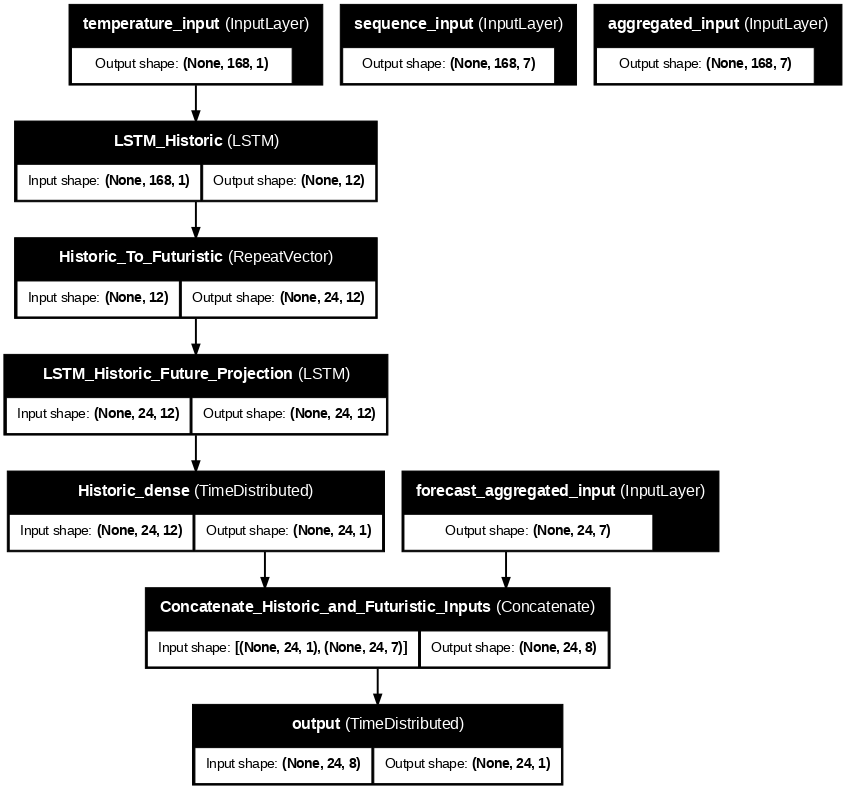

In [185]:
import tensorflow as tf

model_bpp_2 = create_global_temperature_forecast_24w_model_v1(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE
                                                            )

model_bpp_2.summary()

tf.keras.utils.plot_model(
    model_bpp_2,
    to_file='model.png',
    show_layer_names=True,
    show_shapes=True,
    dpi=70)

In [186]:
history_temp = model_bpp_2.fit(
            train_loader,
            epochs=EPOCHS,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/20
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.2525 - rmse: 0.4941
Epoch 1: val_rmse improved from inf to 0.54665, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 69s 52ms/step - loss: 0.2524 - rmse: 0.4940 - val_loss: 0.2988 - val_rmse: 0.5467 - learning_rate: 0.0010
Epoch 2/20
1223/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.1334 - rmse: 0.3635
Epoch 2: val_rmse improved from 0.54665 to 0.45819, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 61s 50ms/step - loss: 0.1334 - rmse: 0.3634 - val_loss: 0.2099 - val_rmse: 0.4582 - learning_rate: 0.0010
Epoch 3/20
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0903 - rmse: 0.3000
Epoch 3: val_rmse improved from 0.45819 to 0.39269, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 59s 48ms/step - loss: 0.0903 - rmse: 0.2999 - val_loss: 0.1542 - val_rmse: 0.3927 - learning_rate: 0.0010
Epoch 4/20
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s

## Model Evaluation

100%|██████████| 358/358 [00:01<00:00, 214.24it/s]


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step


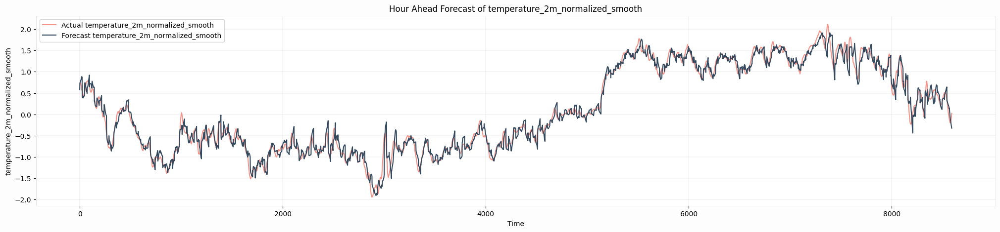

In [187]:
X_train,y_train,_ = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wt = model_bpp_2.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



100%|██████████| 22/22 [00:00<00:00, 415.11it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


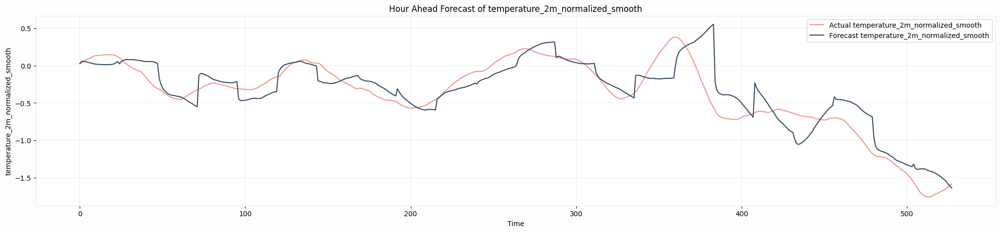

In [188]:
X_eval,y_eval,_ = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24we = model_bpp_2.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24we = y_pred_24we.reshape(len(y_pred_24we)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 206/206 [00:00<00:00, 299.24it/s]


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


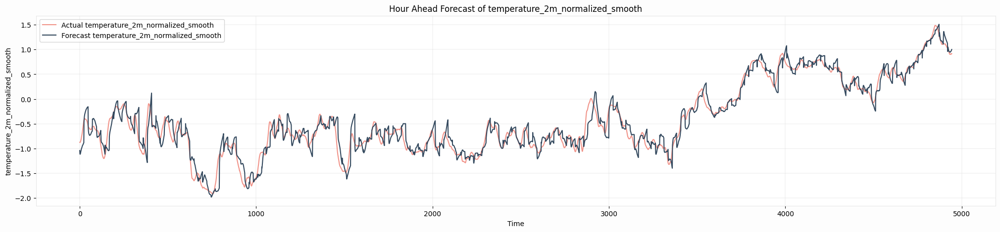

In [189]:
X_test,y_test,_ = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24we = model_bpp_2.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wt = y_pred_24we.reshape(len(y_pred_24we)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 358/358 [00:01<00:00, 307.74it/s]


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


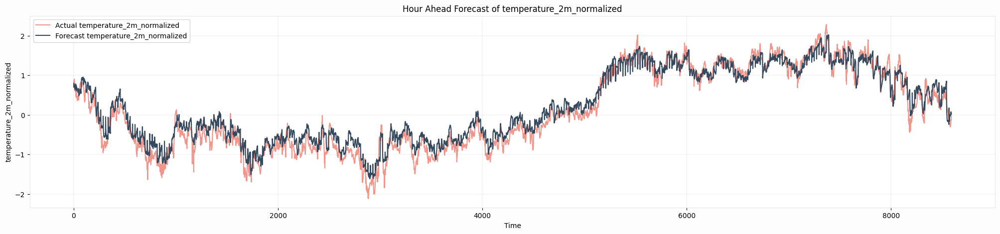

In [ ]:
X_train,y_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wt = model_bpp_2.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,OUTPUT_DIM)
y_pred_24wte = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wte)),y_pred_24wte, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



## Model Comparison

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/Temp/models/Temp_0_forecast_ARIMA.pkl, None>
File Temp_0_forecast_ARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/Temp/models/Temp_0_forecast_ARIMA.pkl.


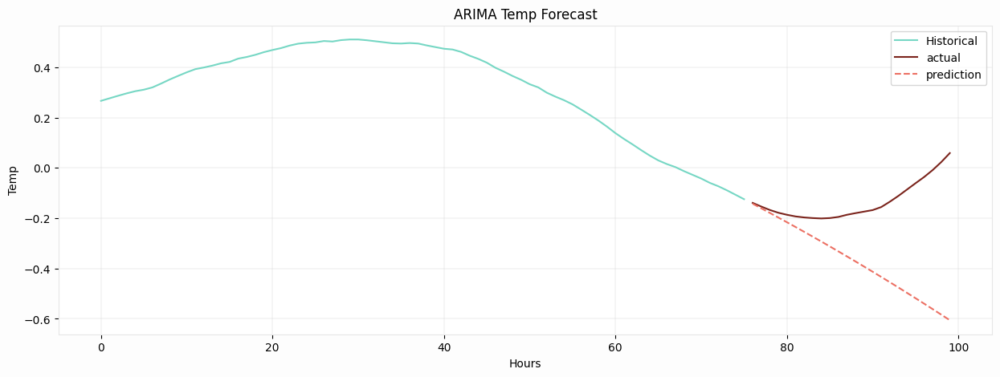

In [ ]:
# @title ARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
train_start_date_stats = "2023-06-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date_stats)]
  arima_model = sm.tsa.SARIMAX(np.array(temp['temperature_2m_normalized_smooth'].iloc[:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 0)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_arima = arima_model.fit(disp=True)

  with open(f'Temp_{ll}_forecast_ARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/Temp/models/Temp_{ll}_forecast_ARIMA.pkl'

  source_file_name = f'Temp_{ll}_forecast_ARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_arima.summary()
# Make predictions
predictions_arima = sarimax_fit_arima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])), temp['temperature_2m_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24]),len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])+len(temp['temperature_2m_normalized_smooth'].iloc[-24:])), temp['temperature_2m_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24]),len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])+len(temp['temperature_2m_normalized_smooth'].iloc[-24:])), predictions_arima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Temp','ARIMA Temp Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/temp/models/temp_0_forecast_SARIMAA.pkl, None>
File temp_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/temp/models/temp_0_forecast_SARIMAA.pkl.


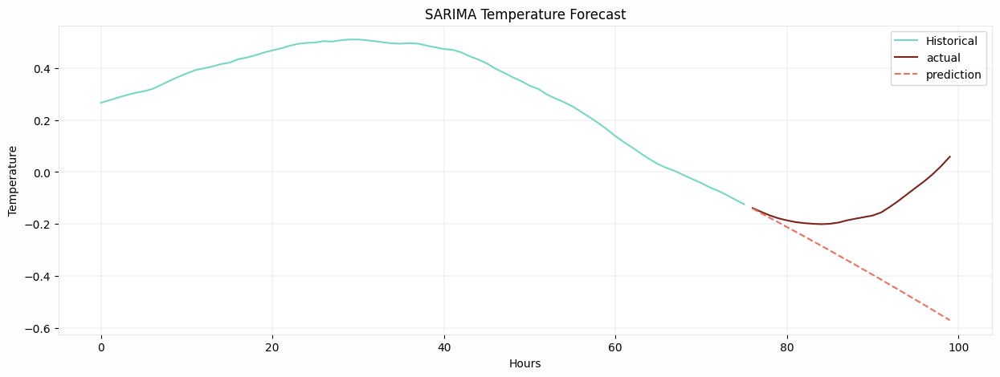

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
train_start_date_stats = "2023-01-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date_stats)]
  sarima_model = sm.tsa.SARIMAX(np.array(temp['temperature_2m_normalized_smooth'].iloc[:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 365*24)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'temp_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/temp/models/temp_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'temp_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])), temp['temperature_2m_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24]),len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])+len(temp['temperature_2m_normalized_smooth'].iloc[-24:])), temp['temperature_2m_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24]),len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])+len(temp['temperature_2m_normalized_smooth'].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Temperature','SARIMA Temperature Forecast')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/Temperature/models/Temperature_0_forecast.pkl, None>
File Temperature_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/Temperature/models/Temperature_0_forecast.pkl.


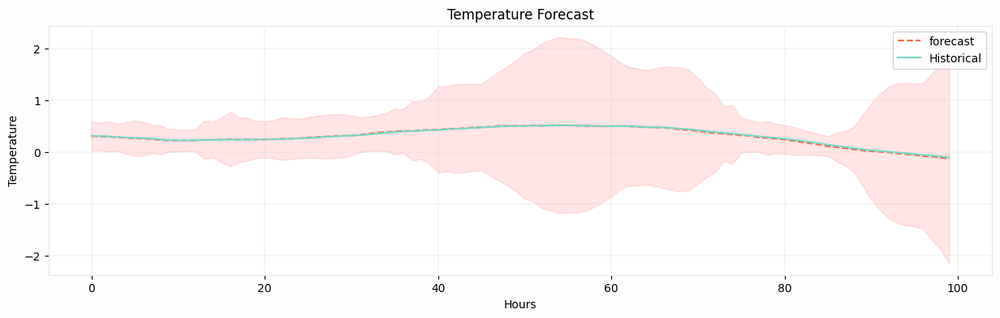

KeyError: "['dew_point_2m_normalized_smooth'] not in index"

In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date)]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp['temperature_2m_normalized_smooth'].iloc[1:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 365*24),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m_normalized_smooth','shortwave_radiation_normalized_smooth','vapour_pressure_deficit_normalized_smooth']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'Temperature_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/Temperature/models/Temperature_{ll}_forecast.pkl'

  source_file_name = f'Temperature_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit.summary()
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:])), temp['temperature_2m_normalized_smooth'].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','Temperature','Temperature Forecast')
plt.legend()
plt.show()
# Make predictions


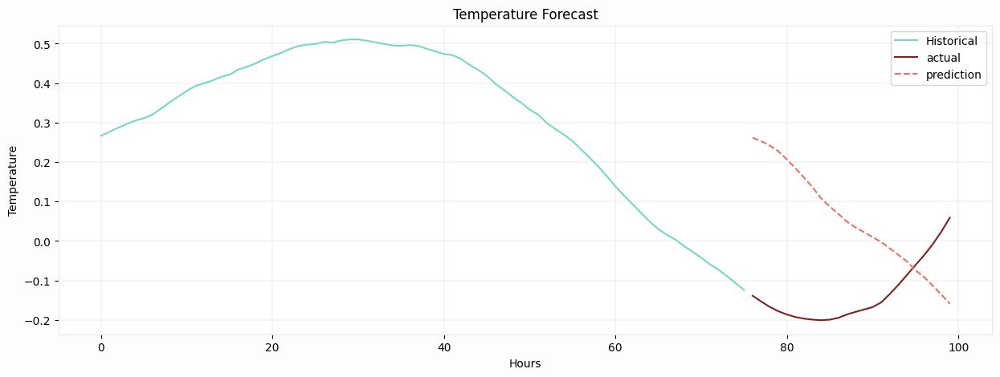

In [ ]:
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m_normalized_smooth','shortwave_radiation_normalized_smooth','vapour_pressure_deficit_normalized_smooth']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m_normalized_smooth','shortwave_radiation_normalized_smooth','vapour_pressure_deficit_normalized_smooth']].iloc[-48:-24,:])
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])), temp['temperature_2m_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24]),len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])+len(temp['temperature_2m_normalized_smooth'].iloc[-24:])), temp['temperature_2m_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24]),len(temp['temperature_2m_normalized_smooth'].iloc[-100:-24])+len(temp['temperature_2m_normalized_smooth'].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Temperature','Temperature Forecast')
plt.legend()
plt.show()

In [ ]:
# @title LSTM Model Temperature Base


def create_lstm_temp(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'temp_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        # time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(inputs[1])
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'temp_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "temp_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ temp_input (InputLayer)   │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 12)             │            672 │ temp_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 12)         │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 12)         │          1,200 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 168, 35)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 5)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 5)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             13 │ LSTM_Historic_Future_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 1,885 (7.36 KB)

 Trainable params: 1,885 (7.36 KB)

 Non-trainable params: 0 (0.00 B)

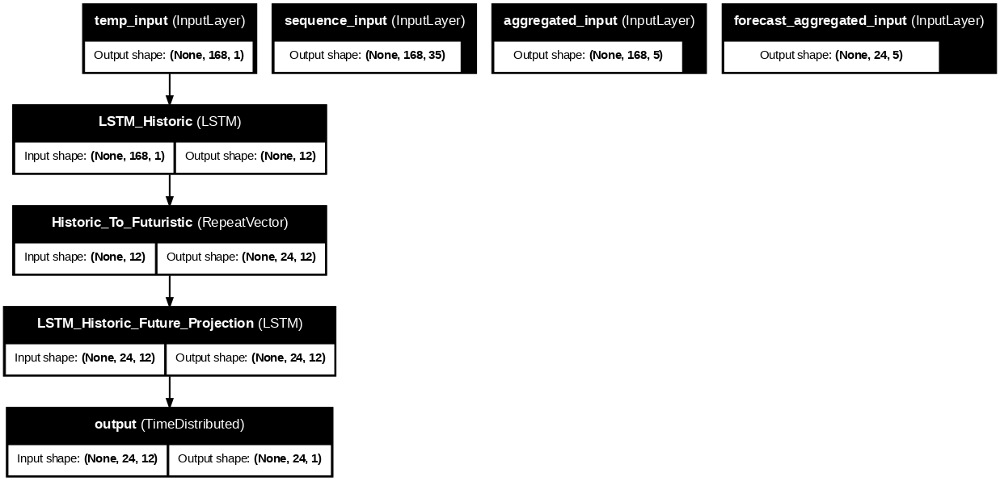

In [ ]:
import tensorflow as tf

model_bpp_lstm = create_lstm_temp(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_lstm.summary()

tf.keras.utils.plot_model(
    model_bpp_lstm,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0,4,5,6,7,8,9])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 206/206 [00:00<00:00, 307.45it/s]


(1224, 75, 706)

In [ ]:
history_bpp_lstm = model_bpp_lstm.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0717 - rmse: 0.2650
Epoch 1: val_rmse improved from inf to 0.46311, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 91s 70ms/step - loss: 0.0717 - rmse: 0.2650 - val_loss: 0.2145 - val_rmse: 0.4631 - learning_rate: 0.0010
Epoch 2/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0522 - rmse: 0.2280
Epoch 2: val_rmse improved from 0.46311 to 0.36162, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 80s 65ms/step - loss: 0.0522 - rmse: 0.2280 - val_loss: 0.1308 - val_rmse: 0.3616 - learning_rate: 0.0010
Epoch 3/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0397 - rmse: 0.1989
Epoch 3: val_rmse improved from 0.36162 to 0.32805, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 80s 65ms/step - loss: 0.0397 - rmse: 0.1989 - val_loss: 0.1076 - val_rmse: 0.3280 - learning_rate: 0.0010
Epoch 4/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s

100%|██████████| 358/358 [00:01<00:00, 295.80it/s]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step


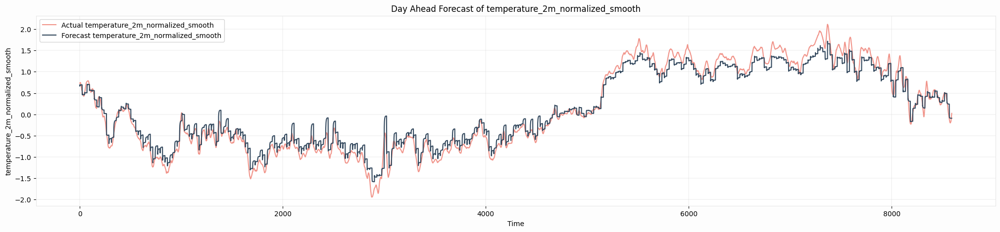

In [ ]:
X_train,y_train,d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtl = model_bpp_lstm.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,1)
y_pred_24wtl = y_pred_24wtl.reshape(len(y_pred_24wtl)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtl)),y_pred_24wtl, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Temperature',f'Temperature Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 22/22 [00:00<00:00, 388.91it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


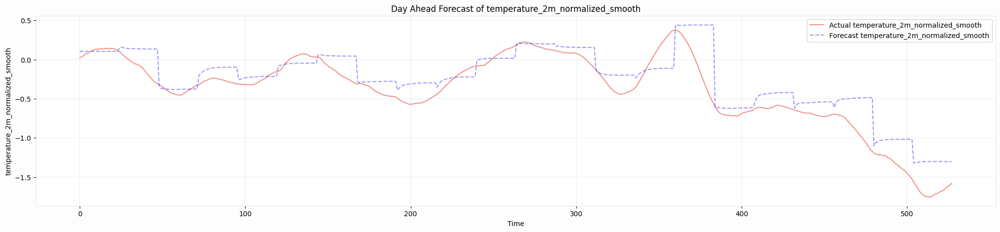

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wel = model_bpp_lstm.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24wel = y_pred_24wel.reshape(len(y_pred_24wel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wel)),y_pred_24wel, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','Temperature',f'Temperature Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24wel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

100%|██████████| 206/206 [00:00<00:00, 313.11it/s]


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


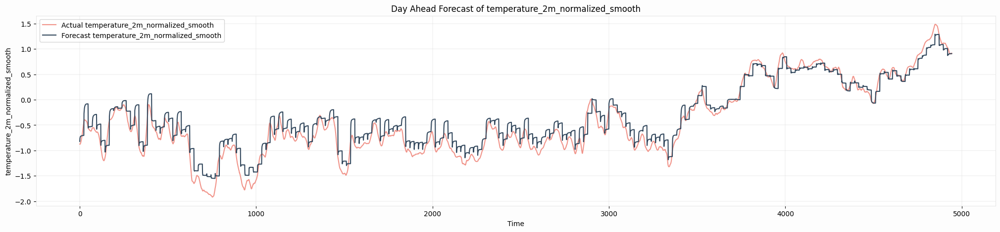

In [ ]:
X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtel = model_bpp_lstm.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wtel = y_pred_24wtel.reshape(len(y_pred_24wtel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtel)),y_pred_24wtel, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Temperature',f'Temperature Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

test_prediction_df = pd.DataFrame(np.array([d_test.reshape(1,-1).tolist()[0],y_pred_24wtel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

In [ ]:
# @title Temperature Model GRU Base


def create_gru_temp(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'temp_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = GRU(latent_dim, return_sequences=False, name="GRU_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = GRU(latent_dim, return_sequences=True, name="GRU_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'temp_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "temp_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 35)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ temp_input (InputLayer)   │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 5)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 41)        │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ temp_input[0][0],      │
│                           │                        │                │ aggregated_input[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic (GRU)        │ (None, 12)             │          1,980 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 12)         │              0 │ GRU_Historic[0][0]     │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic_Future_Proj… │ (None, 24, 12)         │            936 │ Historic_To_Futuristi… │
│ (GRU)                     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 5)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             13 │ GRU_Historic_Future_P… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,929 (11.44 KB)

 Trainable params: 2,929 (11.44 KB)

 Non-trainable params: 0 (0.00 B)

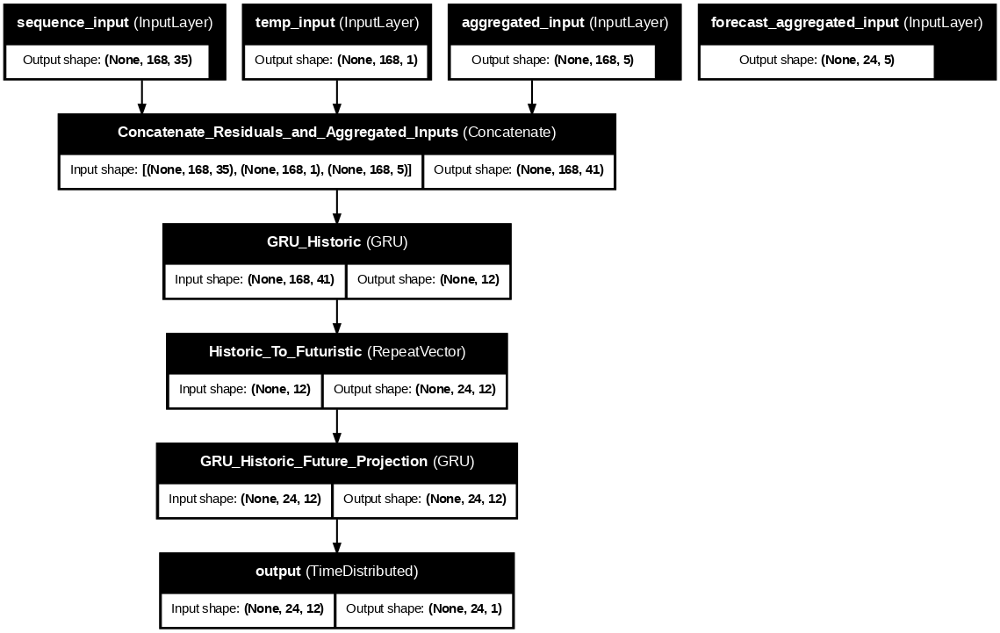

In [ ]:
import tensorflow as tf

model_bpp_gru = create_gru_temp(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_gru.summary()

tf.keras.utils.plot_model(
    model_bpp_gru,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
history_bpp_gru = model_bpp_gru.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.0998 - rmse: 0.3008
Epoch 1: val_rmse improved from inf to 0.31911, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 108s 84ms/step - loss: 0.0998 - rmse: 0.3008 - val_loss: 0.1018 - val_rmse: 0.3191 - learning_rate: 0.0010
Epoch 2/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 0.0234 - rmse: 0.1526
Epoch 2: val_rmse improved from 0.31911 to 0.28588, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 89s 73ms/step - loss: 0.0234 - rmse: 0.1526 - val_loss: 0.0817 - val_rmse: 0.2859 - learning_rate: 0.0010
Epoch 3/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.0206 - rmse: 0.1432
Epoch 3: val_rmse improved from 0.28588 to 0.22732, saving model to outputs/best_temp_model.keras
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 102s 83ms/step - loss: 0.0206 - rmse: 0.1432 - val_loss: 0.0517 - val_rmse: 0.2273 - learning_rate: 0.0010
Epoch 4/10
1224/1224 ━━━━━━━━━━━━━━━━━━━━ 

100%|██████████| 22/22 [00:00<00:00, 389.34it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


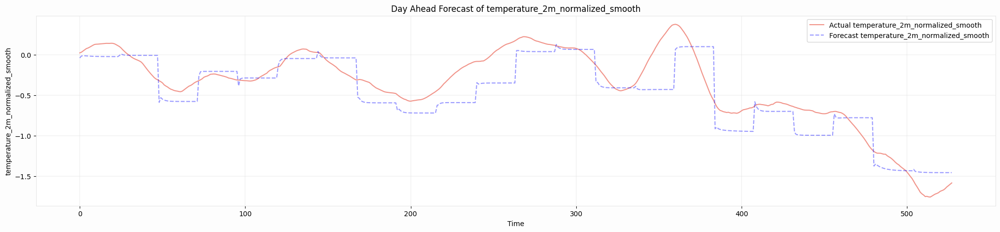

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24weg = model_bpp_gru.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24weg = y_pred_24weg.reshape(len(y_pred_24weg)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24weg)),y_pred_24weg, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','Temperature',f'Temperature Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24weg.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

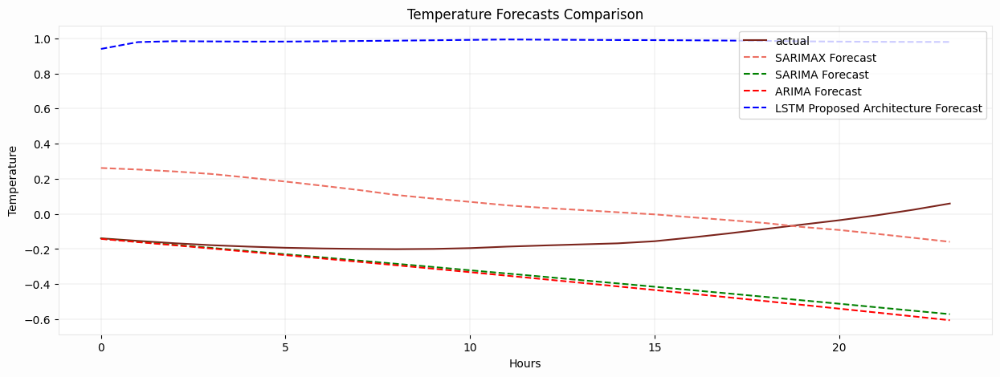

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(24), temp['temperature_2m_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(24), predictions, color = '#EC7063',  linestyle = '--', label = 'SARIMAX Forecast')
plt.plot(range(24), predictions_sarima, color = 'green', linestyle = '--', label = 'SARIMA Forecast')
plt.plot(range(24), predictions_arima, color = 'red', linestyle = '--', label = 'ARIMA Forecast')
plt.plot(range(24), y_pred_24wt[-24:], color = 'blue', linestyle = '--', label = 'LSTM Proposed Architecture Forecast')
plot_cosmos(ax,'Hours','Temperature','Temperature Forecasts Comparison')
plt.legend()
plt.show()

In [ ]:
# @title Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24we)
print(f'MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24we)
print(f'MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24we) / y_eval)) * 100
print(f'MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE: {nrmse}')

MSE: 0.09173418181256637
RMSE: 0.3028765124808564
MAE: 0.24332314748124012
MAPE: 328.69743093030615%
NRMSE: 0.1419448502099877


In [ ]:
# @title Statistical Models Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['temperature_2m_normalized_smooth'].iloc[-24:], predictions)
print(f'SARIMAX MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMAX RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['temperature_2m_normalized_smooth'].iloc[-24:], predictions)
print(f'SARIMAX MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['temperature_2m_normalized_smooth'].iloc[-24:] - predictions) / temp['temperature_2m_normalized_smooth'].iloc[-24:])) * 100
print(f'SARIMAX MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['temperature_2m_normalized_smooth'].iloc[-24:]) - np.min(temp['temperature_2m_normalized_smooth'].iloc[-24:]))
print(f'SARIMAX NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['temperature_2m_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['temperature_2m_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['temperature_2m_normalized_smooth'].iloc[-24:] - predictions_sarima) / temp['temperature_2m_normalized_smooth'].iloc[-24:])) * 100
print(f'SARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['temperature_2m_normalized_smooth'].iloc[-24:]) - np.min(temp['temperature_2m_normalized_smooth'].iloc[-24:]))
print(f'NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['temperature_2m_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'ARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['temperature_2m_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['temperature_2m_normalized_smooth'].iloc[-24:] - predictions_arima) / temp['temperature_2m_normalized_smooth'].iloc[-24:])) * 100
print(f'ARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['temperature_2m_normalized_smooth'].iloc[-24:]) - np.min(temp['temperature_2m_normalized_smooth'].iloc[-24:]))
print(f'ARIMA NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24wel)
print(f'MSE LSTM Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE LSTM Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24wel)
print(f'MAE LSTM Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24wel) / y_eval)) * 100
print(f'MAPE LSTM Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE LSTM Base: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24weg)
print(f'MSE GRU Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE GRU Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24weg)
print(f'MAE GRU Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24weg) / y_eval)) * 100
print(f'MAPE GRU Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE GRU Base: {nrmse}')

SARIMAX MSE: 0.07258304146091911
SARIMAX RMSE: 0.26941240034734687
SARIMAX MAE: 0.237226563436812
SARIMAX MAPE: 226.83074635836888%
SARIMAX NRMSE: 1.0360310158839932
SARIMA MSE: 0.08451471239023772
SARIMA RMSE: 0.2907141420540764
SARIMA MAE: 0.21709218817246248
SARIMA MAPE: 568.316769149177%
NRMSE: 1.1179473087942975
ARIMA MSE: 0.09514740062688916
ARIMA RMSE: 0.3084597228600343
ARIMA MAE: 0.23184654362688464
ARIMA MAPE: 602.1896177356434%
ARIMA NRMSE: 1.1861883106418174
MSE LSTM Base: 0.05241224133715975
RMSE LSTM Base: 0.22893719954860928
MAE LSTM Base: 0.16896898201585006
MAPE LSTM Base: 170.0298495731493%
NRMSE LSTM Base: 0.10729275846199986
MSE GRU Base: 0.053260274138819286
RMSE GRU Base: 0.23078187567228775
MAE GRU Base: 0.18037190050491986
MAPE GRU Base: 160.48468700292196%
NRMSE GRU Base: 0.10815727672363967


In [ ]:
forecasted_temp = y_pred_24wt.reshape(1,-1).tolist()[0]
forecasted_temp.extend(y_pred_24we.reshape(1,-1).tolist()[0])
forecasted_temp.extend(y_pred_24wte.reshape(1,-1).tolist()[0])

In [ ]:
weather_data.shape,len(forecasted_temp)

((100128, 78), 22128)

In [ ]:
weather_data['date_hour'].min(),weather_data['date_hour'].max()

(Timestamp('2013-01-29 00:00:00+0000', tz='UTC'),
 Timestamp('2024-07-01 23:00:00+0000', tz='UTC'))

In [ ]:
weather_data['forecasted_temp'] = np.nan

In [ ]:
weather_data['forecasted_temp'].iloc[-22128:] = forecasted_temp

In [ ]:
import pandas as pd
import pandas_gbq
from google.cloud import bigquery

# Set your BigQuery project ID and destination table
project_id = 'revx-259410'
destination_table = 'Avishek_Explore.temperature_forecast_data_UK_overall'

# Upload DataFrame to BigQuery
pandas_gbq.to_gbq(weather_data, destination_table, project_id=project_id, if_exists='replace')

100%|██████████| 1/1 [00:00<00:00, 4100.00it/s]


# Electricity Load Prediction

## Data Loading

In [2]:
QUERY = f'''SELECT TIMESTAMP(a.utc_timestamp) AS utc_timestamp,
                    0 AS ll_label,
                    date_hour,
                    hour,
                    GB_GBN_load_actual_entsoe_transparency,
                    GB_GBN_load_forecast_entsoe_transparency,
                    GB_GBN_price_day_ahead,
                    GB_GBN_solar_capacity,
                    GB_GBN_solar_generation_actual,
                    GB_GBN_solar_profile,
                    GB_GBN_wind_capacity,
                    GB_GBN_wind_generation_actual,
                    GB_GBN_wind_profile,
                    GB_GBN_wind_offshore_capacity,
                    GB_GBN_wind_offshore_generation_actual,
                    GB_GBN_wind_offshore_profile,
                    GB_GBN_wind_onshore_capacity,
                    GB_GBN_wind_onshore_generation_actual,
                    GB_GBN_wind_onshore_profile,
                    LAG(GB_GBN_load_actual_entsoe_transparency,1) OVER(ORDER BY date_hour ASC) as l_lag_1,
                    LAG(GB_GBN_load_actual_entsoe_transparency,2) OVER(ORDER BY date_hour ASC) as l_lag_2,
                    LAG(GB_GBN_load_actual_entsoe_transparency,3) OVER(ORDER BY date_hour ASC) as l_lag_3,
                    LAG(GB_GBN_load_actual_entsoe_transparency,4) OVER(ORDER BY date_hour ASC) as l_lag_4,
                    LAG(GB_GBN_load_actual_entsoe_transparency,5) OVER(ORDER BY date_hour ASC) as l_lag_5,
                    LAG(GB_GBN_load_actual_entsoe_transparency,6) OVER(ORDER BY date_hour ASC) as l_lag_6,
                    LAG(GB_GBN_load_actual_entsoe_transparency,24) OVER(ORDER BY date_hour ASC) as l_lag_d1,
                    LAG(GB_GBN_load_actual_entsoe_transparency,48) OVER(ORDER BY date_hour ASC) as l_lag_d2,
                    LAG(GB_GBN_load_actual_entsoe_transparency,72) OVER(ORDER BY date_hour ASC) as l_lag_d3,
                    LAG(GB_GBN_load_actual_entsoe_transparency,96) OVER(ORDER BY date_hour ASC) as l_lag_d4,
                    LAG(GB_GBN_load_actual_entsoe_transparency,120) OVER(ORDER BY date_hour ASC) as l_lag_d5,
                    LAG(GB_GBN_load_actual_entsoe_transparency,144) OVER(ORDER BY date_hour ASC) as l_lag_d6,
                    LAG(GB_GBN_load_actual_entsoe_transparency,168) OVER(ORDER BY date_hour ASC) as l_lag_d7,
                    LAG(GB_GBN_load_actual_entsoe_transparency,336) OVER(ORDER BY date_hour ASC) as l_lag_w2,
                    LAG(GB_GBN_load_actual_entsoe_transparency,504) OVER(ORDER BY date_hour ASC) as l_lag_w3,
                    LAG(GB_GBN_load_actual_entsoe_transparency,672) OVER(ORDER BY date_hour ASC) as l_lag_w4,
                    b.temperature_2m
FROM revx-259410.Avishek_Explore.load_supply_timeseries a
LEFT JOIN revx-259410.Avishek_Explore.weather_data_UK_overall b
ON TIMESTAMP(a.utc_timestamp) = b.date_hour; '''
query_job = client.query(QUERY)  # API request
lsw_data = query_job.result().to_dataframe()

In [3]:
lsw_data.head()

,utc_timestamp,ll_label,date_hour,hour,GB_GBN_load_actual_entsoe_transparency,GB_GBN_load_forecast_entsoe_transparency,GB_GBN_price_day_ahead,GB_GBN_solar_capacity,GB_GBN_solar_generation_actual,GB_GBN_solar_profile,...,l_lag_d2,l_lag_d3,l_lag_d4,l_lag_d5,l_lag_d6,l_lag_d7,l_lag_w2,l_lag_w3,l_lag_w4,temperature_2m
0,2018-01-15 21:00:00+00:00,0,2018-01-15 21:00:00+00:00,21,41748.0,38202.0,50.01,8172.0,0.0,0.0000,...,38504.0,41680.0,42536.0,42219.0,42498.0,44098.0,34727.0,31394.0,41680.0,7.15
1,2016-02-26 09:00:00+00:00,0,2016-02-26 09:00:00+00:00,9,50315.0,46828.0,43.91,5961.0,808.0,0.1356,...,49838.0,47928.0,47898.0,38506.0,42258.0,49358.0,49738.0,47514.0,47592.0,4.00
2,2017-01-21 02:00:00+00:00,0,2017-01-21 02:00:00+00:00,2,28810.0,29160.0,44.98,7569.0,0.0,0.0000,...,29032.0,28654.0,28136.0,28476.0,28018.0,29096.0,27956.0,28764.0,28236.0,6.15
3,2016-07-03 11:00:00+00:00,0,2016-07-03 11:00:00+00:00,11,35851.0,32761.0,35.03,7299.0,5535.0,0.7583,...,40680.0,41100.0,42126.0,40975.0,40452.0,36800.0,36403.0,38584.0,35484.0,13.15
4,2016-09-24 00:00:00+00:00,0,2016-09-24 00:00:00+00:00,0,23842.0,23162.0,32.86,7344.0,0.0,0.0000,...,24866.0,25188.0,24376.0,22637.0,24852.0,23692.0,24620.0,25030.0,26062.0,16.40


In [4]:
lsw_data.shape

(50401, 36)

In [5]:
lsw_data.columns

Index(['utc_timestamp', 'll_label', 'date_hour', 'hour',
       'GB_GBN_load_actual_entsoe_transparency',
       'GB_GBN_load_forecast_entsoe_transparency', 'GB_GBN_price_day_ahead',
       'GB_GBN_solar_capacity', 'GB_GBN_solar_generation_actual',
       'GB_GBN_solar_profile', 'GB_GBN_wind_capacity',
       'GB_GBN_wind_generation_actual', 'GB_GBN_wind_profile',
       'GB_GBN_wind_offshore_capacity',
       'GB_GBN_wind_offshore_generation_actual',
       'GB_GBN_wind_offshore_profile', 'GB_GBN_wind_onshore_capacity',
       'GB_GBN_wind_onshore_generation_actual', 'GB_GBN_wind_onshore_profile',
       'l_lag_1', 'l_lag_2', 'l_lag_3', 'l_lag_4', 'l_lag_5', 'l_lag_6',
       'l_lag_d1', 'l_lag_d2', 'l_lag_d3', 'l_lag_d4', 'l_lag_d5', 'l_lag_d6',
       'l_lag_d7', 'l_lag_w2', 'l_lag_w3', 'l_lag_w4', 'temperature_2m'],
      dtype='object')

## Data Preprocessing

In [6]:
lsw_data.sort_values('utc_timestamp', ascending = True, inplace = True)
lsw_data.drop_duplicates(inplace = True)
lsw_data.dropna(inplace = True)
lsw_data.fillna(method='ffill', inplace=True)
lsw_data.sort_values('utc_timestamp', ascending = True, inplace = True)

In [7]:
# @title Data Aggregation

lsw_data['rolling_l_average_d'] = (lsw_data['GB_GBN_load_actual_entsoe_transparency'] + lsw_data['l_lag_d1'] + lsw_data['l_lag_d2'] + lsw_data['l_lag_d3'] + lsw_data['l_lag_d4'] + lsw_data['l_lag_d5'] + lsw_data['l_lag_d6']  + lsw_data['l_lag_d7'])/8
lsw_data['rolling_l_average_dh'] = ( lsw_data['l_lag_d1'] + lsw_data['l_lag_d2'] + lsw_data['l_lag_d3'] + lsw_data['l_lag_d4'] + lsw_data['l_lag_d5'] + lsw_data['l_lag_d6']  + lsw_data['l_lag_d7'])/7

lsw_data['residual_01'] = lsw_data['GB_GBN_load_actual_entsoe_transparency'] - lsw_data['l_lag_1']
lsw_data['residual_12'] = lsw_data['l_lag_1'] - lsw_data['l_lag_2']
lsw_data['residual_23'] = lsw_data['l_lag_2'] - lsw_data['l_lag_3']
lsw_data['residual_34'] = lsw_data['l_lag_3'] - lsw_data['l_lag_4']
lsw_data['residual_45'] = lsw_data['l_lag_4'] - lsw_data['l_lag_5']
lsw_data['rolling_residual_average'] = (lsw_data['residual_01'] + lsw_data['residual_12'] + lsw_data['residual_23'] + lsw_data['residual_34'] + lsw_data['residual_45'])/5

lsw_data['residual_d01'] = lsw_data['GB_GBN_load_actual_entsoe_transparency'] - lsw_data['l_lag_d1']
lsw_data['residual_d12'] = lsw_data['l_lag_d1'] - lsw_data['l_lag_d2']
lsw_data['residual_d23'] = lsw_data['l_lag_d2'] - lsw_data['l_lag_d3']
lsw_data['residual_d34'] = lsw_data['l_lag_d3'] - lsw_data['l_lag_d4']
lsw_data['residual_d45'] = lsw_data['l_lag_d4'] - lsw_data['l_lag_d5']
lsw_data['residual_d56'] = lsw_data['l_lag_d5'] - lsw_data['l_lag_d6']
lsw_data['residual_d67'] = lsw_data['l_lag_d6'] - lsw_data['l_lag_d7']
lsw_data['d_rolling_residual_average'] = (lsw_data['residual_d01'] + \
                                              lsw_data['residual_d12'] + \
                                              lsw_data['residual_d23'] + \
                                              lsw_data['residual_d34'] + \
                                              lsw_data['residual_d45'] + \
                                              lsw_data['residual_d56'] + \
                                              lsw_data['residual_d67'])/7

lsw_data['dh_rolling_residual_average'] = (lsw_data['residual_d12'] + \
                                              lsw_data['residual_d23'] + \
                                              lsw_data['residual_d34'] + \
                                              lsw_data['residual_d45'] + \
                                              lsw_data['residual_d56'] + \
                                              lsw_data['residual_d67'])/6

lsw_data['residual_w12'] = lsw_data['l_lag_d7'] - lsw_data['l_lag_w2']
lsw_data['residual_w23'] = lsw_data['l_lag_w2'] - lsw_data['l_lag_w3']
lsw_data['residual_w34'] = lsw_data['l_lag_w3'] - lsw_data['l_lag_w4']

In [8]:
from sklearn.preprocessing import StandardScaler

feature_ss = dict()

for col in lsw_data.columns:
  try:
    t_ss = StandardScaler()
    feature_ss[col] = t_ss
    t_ss.fit(np.array(lsw_data[col]).reshape(-1,1))
    scaled_data = t_ss.transform(np.array(lsw_data[col]).reshape(-1,1))
    lsw_data[f"{col}_normalized"] = scaled_data
  except Exception as e:
    pass

In [9]:
lsw_data['utc_timestamp'].max()

Timestamp('2019-12-30 23:00:00+0000', tz='UTC')

In [ ]:
lsw_data['forecasted_temperature'] = forecasted_temp

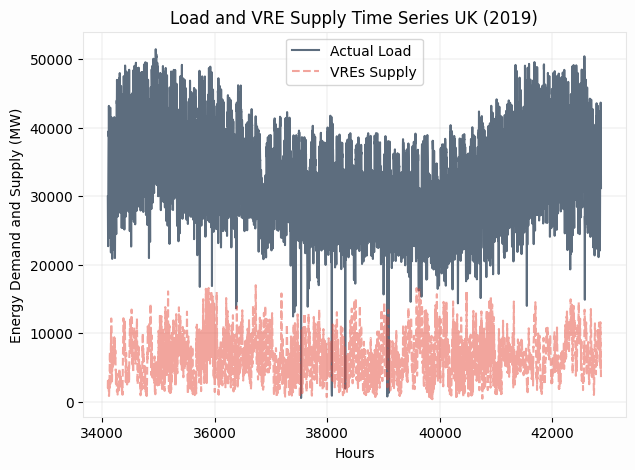

In [13]:
# @title Exploratory Data Analysis

fig = plt.figure(figsize = (7,5))
ax = plt.axes()
plt.plot(range(len(lsw_data))[-24*365:],lsw_data['GB_GBN_load_actual_entsoe_transparency'][-24*365:], label = 'Actual Load',color = '#5D6D7E')
plt.plot(range(len(lsw_data))[-24*365:],lsw_data['GB_GBN_solar_generation_actual'][-24*365:] + lsw_data['GB_GBN_wind_generation_actual'][-24*365:], label = 'VREs Supply',  linestyle = '--', color = '#E74C3C', alpha = 0.5)
plt.legend()
plot_cosmos(ax,'Hours','Energy Demand and Supply (MW)','Load and VRE Supply Time Series UK (2019)')
plt.show()

In [83]:
# @title Load

# Lags Residuals


# Create lagged features
for col in ['temperature_2m']:
    lsw_data[f'{col}_lag1'] = lsw_data[col].shift(24)
    lsw_data[f'{col}_residual'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag1']

    lsw_data[f'{col}_lag2'] = lsw_data[col].shift(48)
    lsw_data[f'{col}_residual_1'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag2']

    lsw_data[f'{col}_lag3'] = lsw_data[col].shift(72)
    lsw_data[f'{col}_residual_2'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag3']

    lsw_data[f'{col}_residual_01'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag2'] - lsw_data[f'{col}'] - lsw_data[f'{col}_lag1']
    lsw_data[f'{col}_residual_12'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag3'] - lsw_data[f'{col}'] - lsw_data[f'{col}_lag2']

    lsw_data[f'{col}_lag7'] = lsw_data[col].shift(168)
    lsw_data[f'{col}_residual_7'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag7']

    lsw_data[f'{col}_lag30'] = lsw_data[col].shift(720)
    lsw_data[f'{col}_residual_30'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag30']

    lsw_data[f'{col}_lag90'] = lsw_data[col].shift(2160)
    lsw_data[f'{col}_residual_90'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag90']

    lsw_data[f'{col}_lag180'] = lsw_data[col].shift(4320)
    lsw_data[f'{col}_residual_180'] = lsw_data[f'{col}'] - lsw_data[f'{col}_lag180']


lsw_data.fillna(0, inplace = True)

In [84]:
for col in lsw_data.columns:
  if col.find('temperature') > -1:
    try:
      t_ss = StandardScaler()
      feature_ss[col] = t_ss
      t_ss.fit(np.array(lsw_data[col]).reshape(-1,1))
      scaled_data = t_ss.transform(np.array(lsw_data[col]).reshape(-1,1))
      lsw_data[f"{col}_normalized"] = scaled_data
    except Exception as e:
      pass

In [ ]:
import pandas as pd
import pandas_gbq
from google.cloud import bigquery

# Set your BigQuery project ID and destination table
project_id = 'revx-259410'
destination_table = 'Avishek_Explore.load_supply_weather_normalized_residual'

# Upload DataFrame to BigQuery
pandas_gbq.to_gbq(lsw_data, destination_table, project_id=project_id, if_exists='replace')

100%|██████████| 1/1 [00:00<00:00, 6605.20it/s]


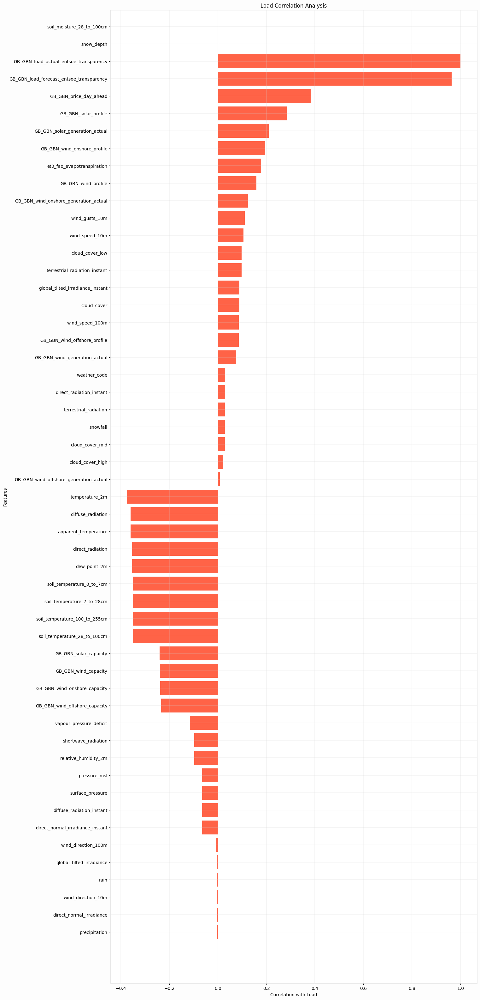

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES_LSW:
  corr_list.append(pearsonr(lsw_data[col],lsw_data['GB_GBN_load_actual_entsoe_transparency'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Load'])
corr_df.sort_values('Correlation with Load',ascending = True,inplace = True)
corr_df['Correlation with Load'] = corr_df['Correlation with Load'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Load'], color = 'tomato')
plot_cosmos(ax,'Correlation with Load','Features','Load Correlation Analysis')

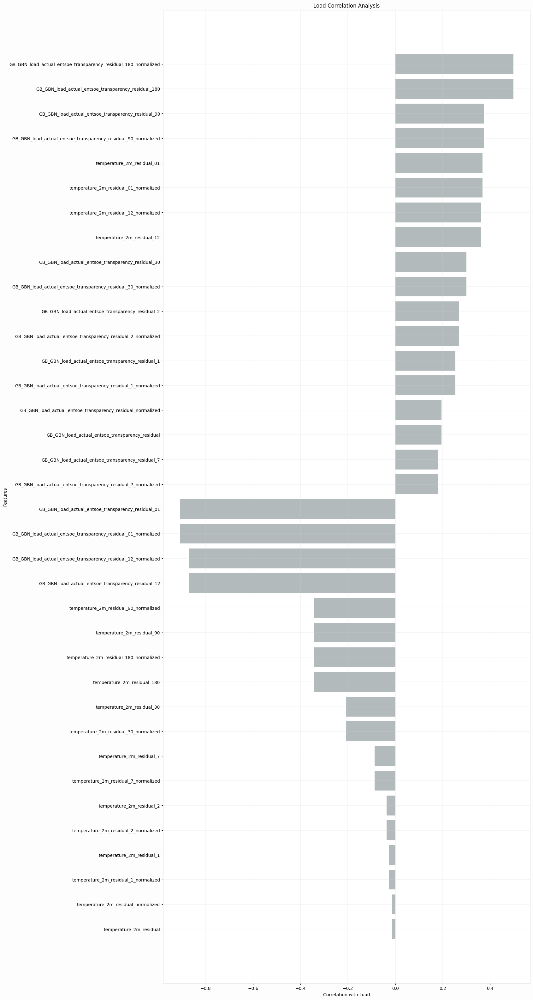

In [ ]:
# @title Residual Percentage Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in [c for c in lsw_data.columns if c.find('residual') > -1]:
  corr_list.append(pearsonr(lsw_data[col],lsw_data['GB_GBN_load_actual_entsoe_transparency'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Load'])
corr_df.sort_values('Correlation with Load',ascending = True,inplace = True)
corr_df['Correlation with Load'] = corr_df['Correlation with Load'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Load'], color = '#B2BABB')
plot_cosmos(ax,'Correlation with Load','Features','Load Correlation Analysis')

In [ ]:
QUERY = f'''SELECT * FROM revx-259410.Avishek_Explore.load_supply_weather_normalized_residual; '''
query_job = client.query(QUERY)  # API request
lsw_data = query_job.result().to_dataframe()

In [85]:
# Import label encoder
from sklearn import preprocessing

lsw_data['lat-lon'] = 0

# label_encoder object knows
# how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'species'.
lsw_data['ll_label']= label_encoder.fit_transform(lsw_data['lat-lon'])

In [86]:
lsw_data.shape

(42863, 144)

In [87]:
lsw_data.fillna(0, inplace = True)
lsw_data.replace([np.inf, -np.inf],0,inplace = True)
lsw_data_hour_mean = lsw_data.groupby(['ll_label','hour']).agg({'GB_GBN_load_actual_entsoe_transparency_normalized' : 'mean'}).reset_index().rename(columns = {'GB_GBN_load_actual_entsoe_transparency_normalized' : 'load_mean'})
lsw_data_hour_std = lsw_data.groupby(['ll_label','hour']).agg({'GB_GBN_load_actual_entsoe_transparency_normalized' : 'std'}).reset_index().rename(columns = {'GB_GBN_load_actual_entsoe_transparency_normalized' : 'load_std'})
lsw_data = pd.merge(lsw_data, lsw_data_hour_mean, on=['ll_label', 'hour'], how='left').fillna(0)
lsw_data = pd.merge(lsw_data, lsw_data_hour_std, on=['ll_label', 'hour'], how='left').fillna(0)

In [88]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

window_length = 24
polyorder = 1

for f in lsw_data.columns:
  if f.find('smooth') == -1:
    if f in ['load_mean','load_std','date_hour','date','hour','ll_label','utc_timestamp', 'country']:
      pass
    else:
      try:
        lsw_data[f"{f}_smooth"] = savgol_filter(lsw_data[f], window_length, polyorder)
      except Exception as e:
        pass

## Model Development

In [193]:
def set_cloud_dirs(GCP_BUCKET, job_dir):
    relative_path = job_dir.split(GCP_BUCKET+"/")[1]
    output_path = relative_path+'/outputs/'
    log_path = relative_path+'/logs/profile/'
    return output_path, log_path
cloud_output_dir, cloud_log_dir = set_cloud_dirs(GCP_BUCKET, 'gs://affle-ds/avishek/body/Research/load_forecast/experiment/load_global_all_campaign/local')

In [194]:
def get_callbacks(log_path, GCP_BUCKET):
    import tensorflow as tf

    def scheduler(epoch, lr):

        if epoch % 2 == 0:

            if lr >= 0.00001:

                return lr

            else:

                return 0.0001

        else:

            return lr

    cloud_log_dir = os.path.join("gs://", GCP_BUCKET, log_path)

    checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="outputs/best_model.keras", verbose=1, save_best_only=True, monitor="val_rmse", mode="min")

    earlyStopper  = tf.keras.callbacks.EarlyStopping(
                                    monitor="val_rmse",
                                    min_delta=0.001,
                                    patience=5,
                                    verbose=0,
                                    mode="min",
                                    restore_best_weights = True
                                )

    LRScheduler = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=0)

    plateau = tf.keras.callbacks.ReduceLROnPlateau(
                                                                                                    monitor="val_rmse",
                                                                                                    factor=0.5,
                                                                                                    patience=1,
                                                                                                    verbose=0,
                                                                                                    mode="min",
                                                                                                    min_delta=0.01,
                                                                                                    cooldown=0,
                                                                                                    min_lr=0.00001,
                                                                                                )
#     csv_logger = tf.keras.callbacks.CSVLogger("outputs/history.log")

    return [checkpointer,earlyStopper,plateau]


In [180]:
# @title LSTM Model Load

def create_global_load_forecast_24w_model_v1(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'load_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1]])
        time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(6, activation = 'tanh'), name = 'dense_historic')
        time_series_projection = dense_historic(time_series_projection)

        time_series_futuristic = BatchNormalization(name = 'Batch_Normalization_2')(inputs[3])
        time_series_futuristic = LSTM(latent_dim, return_sequences=True, name="LSTM_Futuristic")(time_series_futuristic)
        dense_futuristic = TimeDistributed(Dense(2, activation = 'tanh'), name = 'dense_futuristic')
        time_series_futuristic = dense_futuristic(time_series_futuristic)

        hf_concat= Concatenate(name = 'Concatenate_Historic_and_Futuristic_Inputs')([time_series_projection,inputs[3]])
        final_dense = TimeDistributed(Dense(1), name = 'output')
        output = final_dense(hf_concat)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'load_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

In [181]:
# QUERY = f'''SELECT * FROM Avishek_Explore.{TABLE_NAME} ORDER BY ll_label,date_hour; '''
# query_job = client.query(QUERY)  # API request
# weather_data = query_job.result().to_dataframe()

## Hyperparameter Tuning

In [84]:
features_residual_smooth = ['l_lag_d1_normalized',
                    'l_lag_d2_normalized',
                     'l_lag_d3_normalized',
                    'residual_d12_normalized',
                    'residual_d23_normalized']

features_category_smooth =[ 'l_lag_d1_normalized',
                    'l_lag_d2_normalized',
                    'l_lag_d3_normalized',
                    'residual_d12_normalized',
                    'residual_d23_normalized',
                    'residual_d34_normalized',
                     'temperature_2m_normalized']

features_primary_smooth = [
                      'GB_GBN_load_actual_entsoe_transparency_normalized'
                      ]

TARGET_smooth = [
                      'GB_GBN_load_actual_entsoe_transparency_normalized'
                      ]

feature_keys = list(set(features_residual_smooth + features_category_smooth + features_primary_smooth + TARGET_smooth))

load_hpt = gridrandomsearchcv(lsw_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

In [86]:
hp_df = pd.DataFrame(np.array(load_hpt).reshape(20,6), columns = ['sequence','batch','latent dim','dense unit','kfold','RMSE'])
hp_df[hp_df['RMSE'] == hp_df['RMSE'].min()]

,sequence,batch,latent dim,dense unit,kfold,RMSE
0,168.0,30.0,24.0,2.0,3.0,0.280286


## Model Training

In [182]:
feature_keys

['residual_d34_normalized',
 'temperature_2m_normalized',
 'residual_d12_normalized',
 'l_lag_d2_normalized',
 'l_lag_d1_normalized',
 'GB_GBN_load_actual_entsoe_transparency_normalized',
 'l_lag_d3_normalized',
 'residual_d23_normalized']

In [82]:
features_residual = ['l_lag_d1_normalized',
                    'l_lag_d2_normalized',
                     'l_lag_d3_normalized',
                    'residual_d12_normalized',
                    'residual_d23_normalized']

features_category =[ 'l_lag_d1_normalized',
                    'l_lag_d2_normalized',
                    'l_lag_d3_normalized',
                    'residual_d12_normalized',
                    'residual_d23_normalized',
                    'residual_d34_normalized',
                     'temperature_2m_normalized']

features_primary = [
                      'GB_GBN_load_actual_entsoe_transparency_normalized'
                      ]

TARGET = [
                      'GB_GBN_load_actual_entsoe_transparency_normalized'
                      ]

features_category_forecast =[ 'l_lag_d1_normalized',
                    'l_lag_d2_normalized',
                    'l_lag_d3_normalized',
                    'residual_d12_normalized',
                    'residual_d23_normalized',
                    'residual_d34_normalized',
                     'forecasted_temperature']

feature_keys = list(set(features_residual + features_category + features_primary + TARGET + features_category_forecast))

VOCABULARY_SIZE = 10
EMBEDDING_SIZE = 3
LATENT_DIM = 2
SEQ = 168
NUMERICAL_FEATURE_SIZE = len(features_residual)
PRIMARY_FEATURE_SIZE = len(features_primary)
NUM_VARS = len(features_category)
OUTPUT_DIM = len(TARGET)
LEARNING_RATE = 0.001
N_FUTURE = 24
TARGET_REPEAT = 1

BATCH_SIZE = 30
EPOCHS = 20
SAMPLE_SIZE = 180*3*24
STEPS = 1

TABLE_NAME = 'load_supply_weather_normalized_residual'
CAT_SPLIT = 'll_label'
GCP_BUCKET = 'affle-ds'

In [183]:
# list(weather_data.columns)

In [184]:
lsw_data['date_hour'].min(),lsw_data['date_hour'].max()

(Timestamp('2015-01-29 00:00:00+0000', tz='UTC'),
 Timestamp('2019-12-30 23:00:00+0000', tz='UTC'))

In [185]:
train_start_date = '2017-01-01'
train_end_date = '2019-07-31'
eval_end_date = '2019-08-31'
lsw_data['ll_label'] = lsw_data['ll_label'].astype(int)
lsw_data['hour'] = lsw_data['hour'].astype(int)
train_df, eval_df = lsw_data[(lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)][feature_keys+['ll_label','date_hour','GB_GBN_load_forecast_entsoe_transparency_normalized']], \
                                       lsw_data[(lsw_data['date_hour'] > train_end_date) & (lsw_data['date_hour'] <= eval_end_date)][feature_keys+['ll_label','date_hour','GB_GBN_load_forecast_entsoe_transparency_normalized']]

test_df = lsw_data[lsw_data['date_hour'] > eval_end_date][feature_keys+['ll_label','date_hour','GB_GBN_load_forecast_entsoe_transparency_normalized']]

In [186]:
# from statsmodels.tsa.holtwinters import ExponentialSmoothing

# # Fit the model
# model_exp_train = ExponentialSmoothing(train_df[TARGET[0]], trend='add')
# fit = model_exp_train.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[TARGET[0]] = fit.fittedvalues

# model_exp_train_norm = ExponentialSmoothing(train_df[features_primary[0]], trend='add')
# fit = model_exp_train_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[features_primary[0]] = fit.fittedvalues

# model_exp_eval = ExponentialSmoothing(eval_df[TARGET[0]], trend='add')
# fit = model_exp_eval.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[TARGET[0]] = fit.fittedvalues

# model_exp_eval_norm = ExponentialSmoothing(eval_df[features_primary[0]], trend='add')
# fit = model_exp_eval_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[features_primary[0]] = fit.fittedvalues

# model_exp_test = ExponentialSmoothing(test_df[TARGET[0]], trend='add')
# fit = model_exp_test.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[TARGET[0]] = fit.fittedvalues

# model_exp_test_norm = ExponentialSmoothing(test_df[features_primary[0]], trend='add')
# fit = model_exp_test_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[features_primary[0]] = fit.fittedvalues

In [187]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22441 entries, 16775 to 39215
Data columns (total 11 columns):
 #   Column                                               Non-Null Count  Dtype              
---  ------                                               --------------  -----              
 0   residual_d34_normalized                              22441 non-null  float64            
 1   temperature_2m_normalized                            22441 non-null  float64            
 2   residual_d12_normalized                              22441 non-null  float64            
 3   l_lag_d2_normalized                                  22441 non-null  float64            
 4   l_lag_d1_normalized                                  22441 non-null  float64            
 5   GB_GBN_load_actual_entsoe_transparency_normalized    22441 non-null  float64            
 6   l_lag_d3_normalized                                  22441 non-null  float64            
 7   residual_d23_normalized                  

In [188]:
eval_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 744 entries, 39216 to 39959
Data columns (total 11 columns):
 #   Column                                               Non-Null Count  Dtype              
---  ------                                               --------------  -----              
 0   residual_d34_normalized                              744 non-null    float64            
 1   temperature_2m_normalized                            744 non-null    float64            
 2   residual_d12_normalized                              744 non-null    float64            
 3   l_lag_d2_normalized                                  744 non-null    float64            
 4   l_lag_d1_normalized                                  744 non-null    float64            
 5   GB_GBN_load_actual_entsoe_transparency_normalized    744 non-null    float64            
 6   l_lag_d3_normalized                                  744 non-null    float64            
 7   residual_d23_normalized                    

In [189]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2903 entries, 39960 to 42862
Data columns (total 11 columns):
 #   Column                                               Non-Null Count  Dtype              
---  ------                                               --------------  -----              
 0   residual_d34_normalized                              2903 non-null   float64            
 1   temperature_2m_normalized                            2903 non-null   float64            
 2   residual_d12_normalized                              2903 non-null   float64            
 3   l_lag_d2_normalized                                  2903 non-null   float64            
 4   l_lag_d1_normalized                                  2903 non-null   float64            
 5   GB_GBN_load_actual_entsoe_transparency_normalized    2903 non-null   float64            
 6   l_lag_d3_normalized                                  2903 non-null   float64            
 7   residual_d23_normalized                   

In [190]:
# ,4,5,6,7,8,9

eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS,target_repeater = TARGET_REPEAT)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

# y_test = y_test.reshape(len(y_test)*N_FUTURE,1)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 113/113 [00:00<00:00, 453.40it/s]


(432, 18, 90)

In [191]:
X_test[0][0][0].shape

(5,)

In [192]:
len(features_residual)

5

In [ ]:
load_hpt = gridrandomsearchcv(weather_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

In [195]:
try:
  del history_lf
  del model_load_forecast
except Exception as e:
  print("Model does not exist")

Model: "load_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 5)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ load_input (InputLayer)   │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 6)         │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ load_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Batch_Normalization_1     │ (None, 168, 6)         │             24 │ Concatenate_Residuals… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 2)              │             72 │ Batch_Normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 2)          │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 2)          │             40 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_historic            │ (None, 24, 6)          │             18 │ LSTM_Historic_Future_… │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 7)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Historic_and… │ (None, 24, 13)         │              0 │ dense_historic[0][0],  │
│ (Concatenate)             │                        │                │ forecast_aggregated_i… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 7)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             14 │ Concatenate_Historic_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 168 (672.00 B)

 Trainable params: 156 (624.00 B)

 Non-trainable params: 12 (48.00 B)

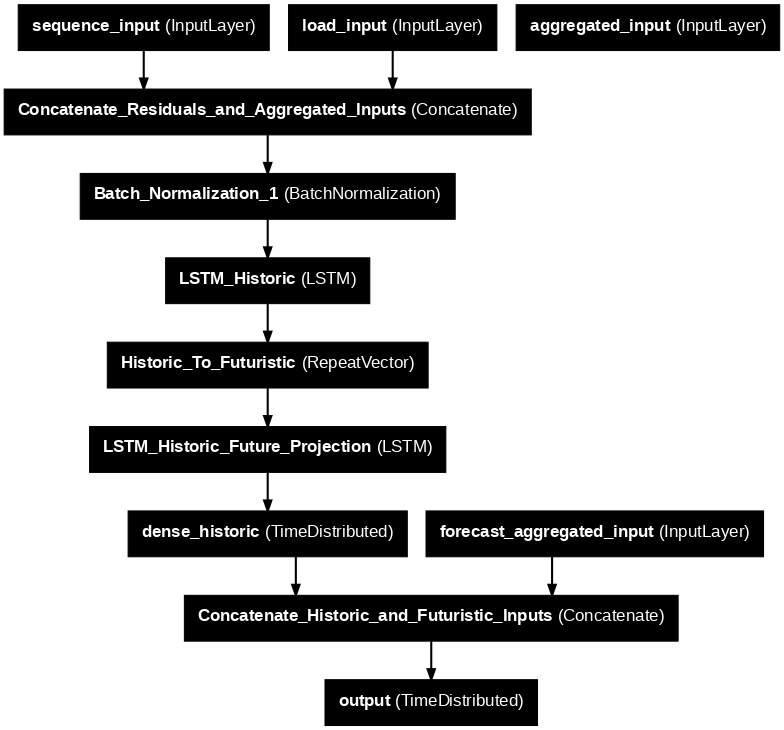

In [196]:
import tensorflow as tf

model_load_forecast = create_global_load_forecast_24w_model_v1(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE
                                                            )

model_load_forecast.summary()

tf.keras.utils.plot_model(
    model_load_forecast,
    to_file='model.png',
    show_layer_names=True,
    dpi=75)

In [197]:
history_lf = model_load_forecast.fit(
            train_loader,
            epochs=EPOCHS,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 0.7929 - rmse: 0.8864
Epoch 1: val_rmse improved from inf to 0.62672, saving model to outputs/best_model.keras
432/432 ━━━━━━━━━━━━━━━━━━━━ 49s 102ms/step - loss: 0.7926 - rmse: 0.8862 - val_loss: 0.3928 - val_rmse: 0.6267 - learning_rate: 0.0010
Epoch 2/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.2642 - rmse: 0.5134
Epoch 2: val_rmse improved from 0.62672 to 0.45882, saving model to outputs/best_model.keras
432/432 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.2642 - rmse: 0.5134 - val_loss: 0.2105 - val_rmse: 0.4588 - learning_rate: 0.0010
Epoch 3/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1562 - rmse: 0.3947
Epoch 3: val_rmse improved from 0.45882 to 0.38153, saving model to outputs/best_model.keras
432/432 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.1563 - rmse: 0.3948 - val_loss: 0.1456 - val_rmse: 0.3815 - learning_rate: 0.0010
Epoch 4/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.1211 - 

In [149]:
del X_train,y_train, d_train

## Model Evaluation

100%|██████████| 92/92 [00:00<00:00, 418.25it/s]


1/3 ━━━━━━━━━━━━━━━━━━━━ 1s 736ms/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 391ms/step


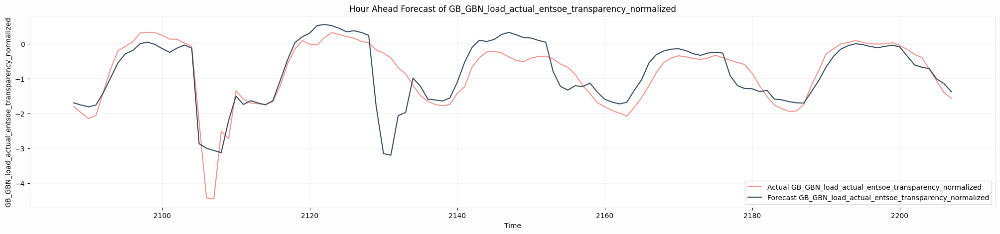

In [198]:
X_train,y_train, d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])].iloc[-2400:] ,
                                                            features_residual,
                                                            features_primary,
                                                            TARGET+['GB_GBN_load_forecast_entsoe_transparency_normalized'] ,
                                                            SEQ ,
                                                            BATCH_SIZE,
                                                            features_category_forecast,
                                                            N_FUTURE,
                                                            EPOCHS,
                                                            CAT_SPLIT)
y_pred_24wt = model_load_forecast.predict(X_train)
y_train_actual = y_train[:,:,0].reshape(len(y_train)*N_FUTURE,OUTPUT_DIM)
y_train_forecast = y_train[:,:,1].reshape(len(y_train)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_train_actual))[-120:],y_train_actual[-120:], label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt))[-120:],y_pred_24wt[-120:], label = f'Forecast {TARGET[0]}', color = '#34495E')


plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



100%|██████████| 23/23 [00:00<00:00, 498.37it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


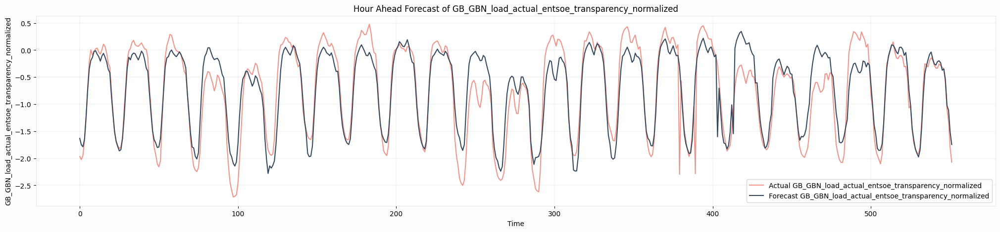

In [202]:
X_eval,y_eval,_ = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] ,
                                                            features_residual,
                                                            features_primary,
                                                            TARGET+['GB_GBN_load_forecast_entsoe_transparency_normalized'] ,
                                                            SEQ ,
                                                            BATCH_SIZE,
                                                            features_category_forecast,
                                                            N_FUTURE,
                                                            EPOCHS,
                                                            CAT_SPLIT)
y_pred_24wt = model_load_forecast.predict(X_eval)
y_eval_actual = y_eval[:,:,0].reshape(len(y_eval)*N_FUTURE,OUTPUT_DIM)
y_eval_forecast = y_eval[:,:,1].reshape(len(y_eval)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_eval_actual)),y_eval_actual, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')


plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



In [ ]:
y_eval_actual.shape

(552, 1)

100%|██████████| 113/113 [00:00<00:00, 491.99it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


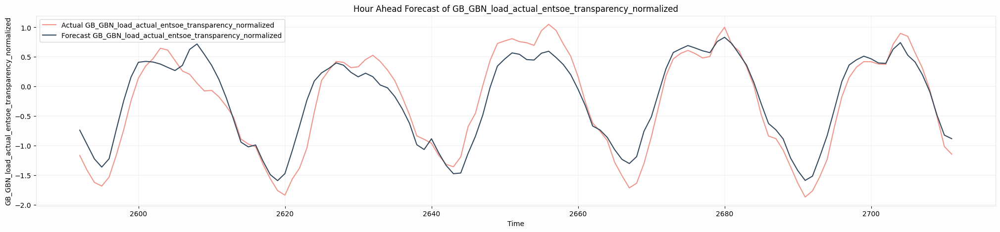

In [200]:
X_test,y_test,_ = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] ,
                                                            features_residual,
                                                            features_primary,
                                                            TARGET+['GB_GBN_load_forecast_entsoe_transparency_normalized'] ,
                                                            SEQ ,
                                                            BATCH_SIZE,
                                                            features_category_forecast,
                                                            N_FUTURE,
                                                            EPOCHS,
                                                            CAT_SPLIT)
y_pred_24wt = model_load_forecast.predict(X_test)
y_test_actual = y_test[:,:,0].reshape(len(y_test)*N_FUTURE,OUTPUT_DIM)
y_test_forecast = y_test[:,:,1].reshape(len(y_test)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_test_actual))[-120:],y_test_actual[-120:], label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt))[-120:],y_pred_24wt[-120:], label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



## Model Comparison

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/load/models/load_0_forecast_ARIMA.pkl, None>
File GHI_0_forecast_ARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/load/models/load_0_forecast_ARIMA.pkl.


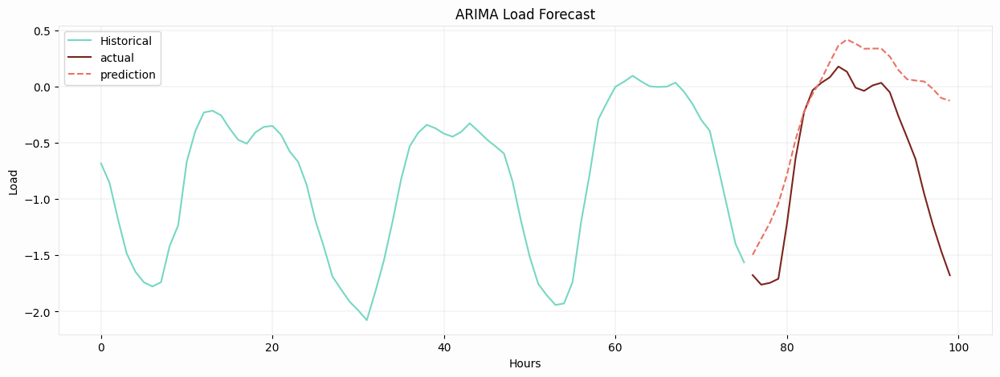

In [ ]:
# @title ARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
train_start_date_stats = "2017-06-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date_stats)]
  arima_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[:-24]),
                                order=(7, 0, 7),
                                seasonal_order=(0, 0, 0, 0)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_arima = arima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/load/models/load_{ll}_forecast_ARIMA.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_arima.summary()
# Make predictions
predictions_arima = sarimax_fit_arima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24]),len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])+len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24]),len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])+len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])), predictions_arima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Load','ARIMA Load Forecast')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/Load/models/Load_0_forecast_SARIMAA.pkl, None>
File Load_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/Load/models/Load_0_forecast_SARIMAA.pkl.


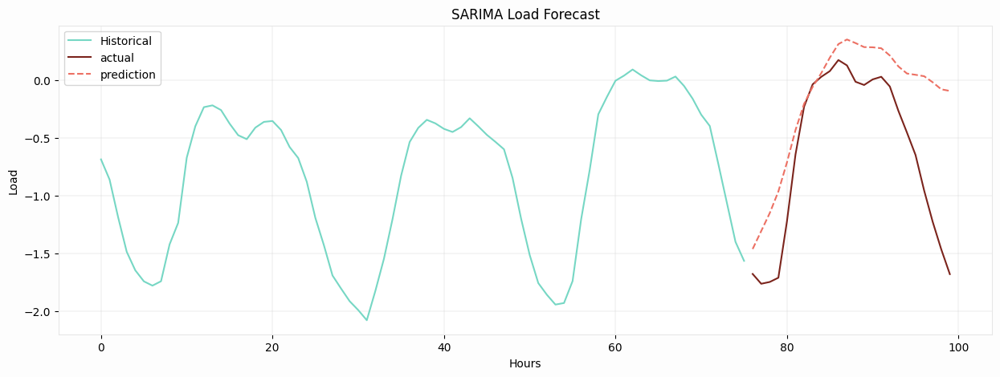

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
train_start_date_stats = "2019-01-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date_stats)]
  sarima_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[:-24]),
                                order=(7, 0, 7),
                                seasonal_order=(0, 0, 0, 365*24)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'Load_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/Load/models/Load_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'Load_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24]),len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])+len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24]),len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])+len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Load','SARIMA Load Forecast')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/load/models/load_0_forecast.pkl, None>
File load_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/load/models/load_0_forecast.pkl.


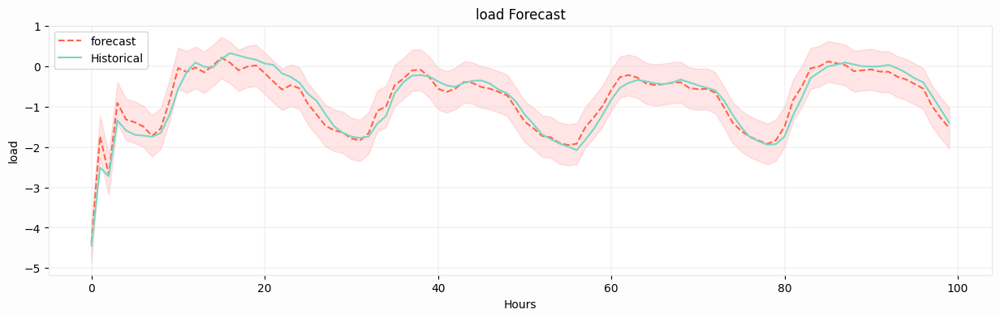

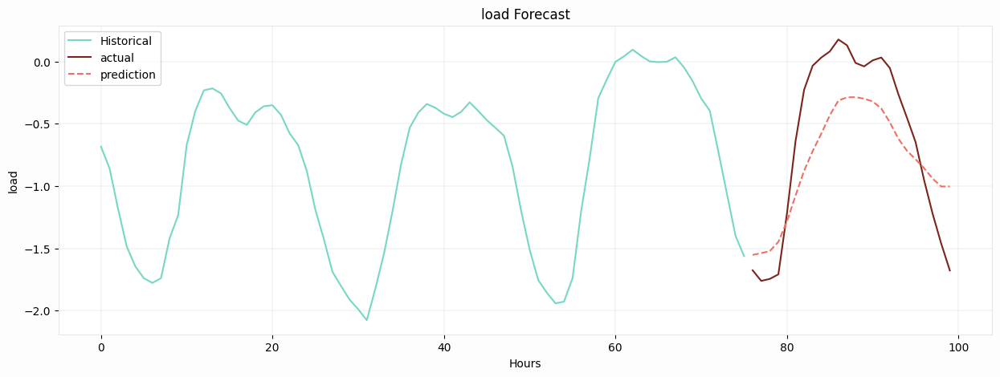

In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[1:-24]),
                                order=(7, 0, 7),
                                seasonal_order=(0, 0, 0, 365*24),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['temperature_2m_normalized']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'load_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/load/models/load_{ll}_forecast.pkl'

  source_file_name = f'load_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit.summary()
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:])), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','load','load Forecast')
plt.legend()
plt.show()
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['temperature_2m_normalized']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['temperature_2m_normalized']].iloc[-48:-24,:])
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24]),len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])+len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24]),len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-100:-24])+len(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','load','load Forecast')
plt.legend()
plt.show()

In [ ]:
# @title LSTM Model Load Base


def create_lstm_load(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'load_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        # time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(inputs[1])
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'load_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "load_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ load_input (InputLayer)   │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 2)              │             32 │ load_input[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 2)          │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 2)          │             40 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 168, 1)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 3)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 3)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              3 │ LSTM_Historic_Future_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 75 (300.00 B)

 Trainable params: 75 (300.00 B)

 Non-trainable params: 0 (0.00 B)

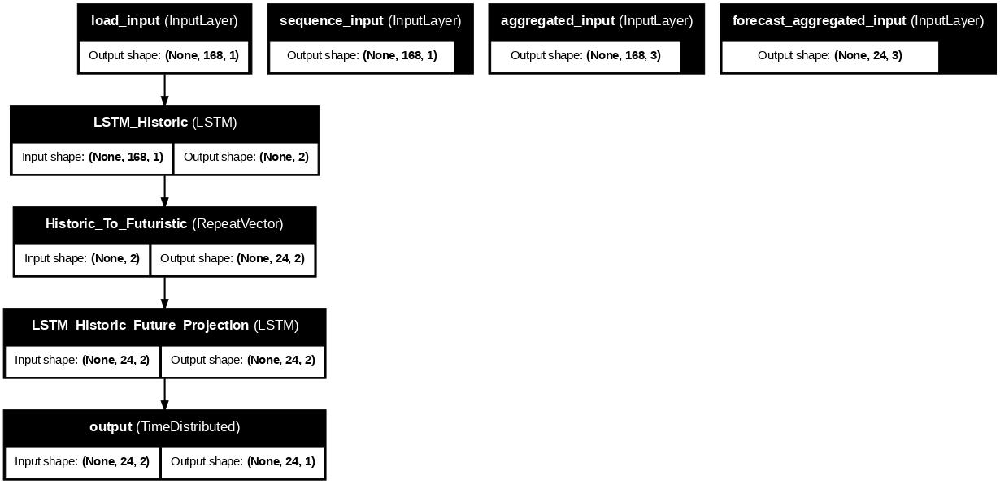

In [ ]:
import tensorflow as tf

model_bpp_lstm_l = create_lstm_load(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_lstm_l.summary()

tf.keras.utils.plot_model(
    model_bpp_lstm_l,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0,4,5,6,7,8,9])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 113/113 [00:00<00:00, 345.41it/s]


(77, 3, 16)

In [ ]:
history_bpp_lstm_l = model_bpp_lstm_l.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 1.1634 - rmse: 1.0757
Epoch 1: val_rmse improved from inf to 1.21979, saving model to outputs/best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 13s 93ms/step - loss: 1.1624 - rmse: 1.0753 - val_loss: 1.4879 - val_rmse: 1.2198 - learning_rate: 0.0010
Epoch 2/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 1.0369 - rmse: 1.0160
Epoch 2: val_rmse improved from 1.21979 to 1.12568, saving model to outputs/best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 1.0363 - rmse: 1.0157 - val_loss: 1.2672 - val_rmse: 1.1257 - learning_rate: 0.0010
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.9860 - rmse: 0.9907
Epoch 3: val_rmse improved from 1.12568 to 1.04521, saving model to outputs/best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - loss: 0.9853 - rmse: 0.9904 - val_loss: 1.0925 - val_rmse: 1.0452 - learning_rate: 0.0010
Epoch 4/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.9326 - rmse: 0.9637
Epoc

100%|██████████| 928/928 [00:02<00:00, 424.21it/s]


29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step


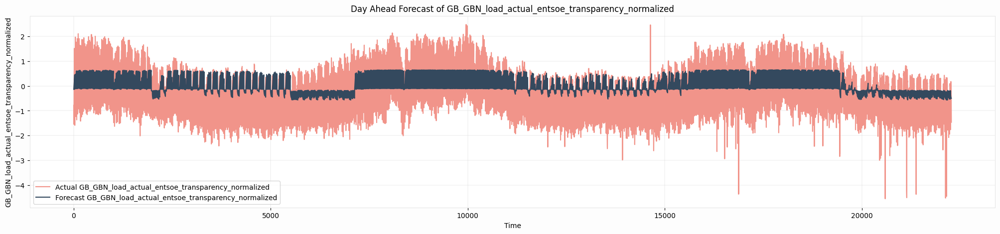

In [ ]:
X_train,y_train,d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtl = model_bpp_lstm_l.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,1)
y_pred_24wtl = y_pred_24wtl.reshape(len(y_pred_24wtl)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtl)),y_pred_24wtl, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 23/23 [00:00<00:00, 362.73it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


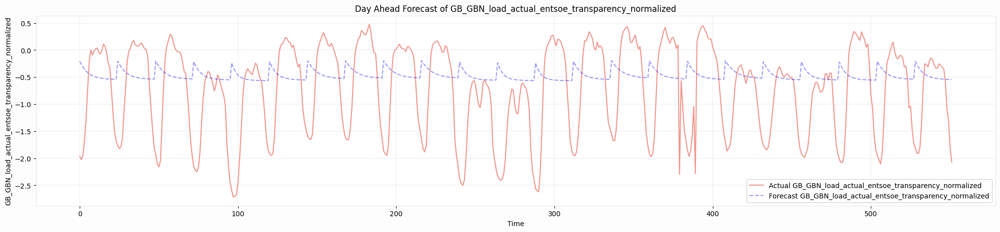

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wel = model_bpp_lstm_l.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24wel = y_pred_24wel.reshape(len(y_pred_24wel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wel)),y_pred_24wel, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24wel)),y_pred_24wel, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24wel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

100%|██████████| 113/113 [00:00<00:00, 443.81it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


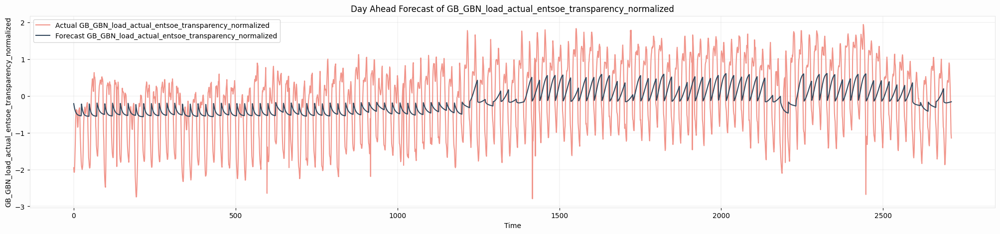

In [ ]:
X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtel = model_bpp_lstm_l.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wtel = y_pred_24wtel.reshape(len(y_pred_24wtel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtel)),y_pred_24wtel, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

test_prediction_df = pd.DataFrame(np.array([d_test.reshape(1,-1).tolist()[0],y_pred_24wtel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

In [ ]:
# @title GRU Model GHI Base


def create_gru_load(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'ghi_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = GRU(latent_dim, return_sequences=False, name="GRU_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = GRU(latent_dim, return_sequences=True, name="GRU_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'ghi_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "ghi_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 1)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ghi_input (InputLayer)    │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 3)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 5)         │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ ghi_input[0][0],       │
│                           │                        │                │ aggregated_input[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic (GRU)        │ (None, 2)              │             54 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 2)          │              0 │ GRU_Historic[0][0]     │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic_Future_Proj… │ (None, 24, 2)          │             36 │ Historic_To_Futuristi… │
│ (GRU)                     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 3)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              3 │ GRU_Historic_Future_P… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 93 (372.00 B)

 Trainable params: 93 (372.00 B)

 Non-trainable params: 0 (0.00 B)

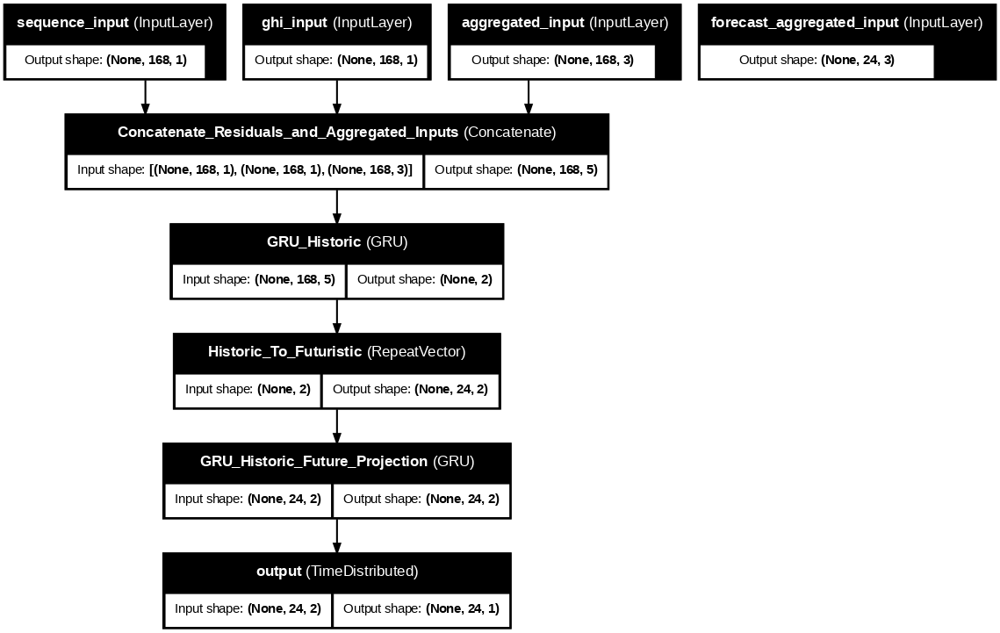

In [ ]:
import tensorflow as tf

model_bpp_gru = create_gru_load(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_gru.summary()

tf.keras.utils.plot_model(
    model_bpp_gru,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
history_bpp_gru = model_bpp_gru.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 1.0588 - rmse: 1.0285
Epoch 1: val_rmse improved from inf to 1.15069, saving model to outputs/best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 17s 117ms/step - loss: 1.0586 - rmse: 1.0284 - val_loss: 1.3241 - val_rmse: 1.1507 - learning_rate: 0.0010
Epoch 2/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.9350 - rmse: 0.9659
Epoch 2: val_rmse improved from 1.15069 to 1.03881, saving model to outputs/best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 8s 105ms/step - loss: 0.9348 - rmse: 0.9658 - val_loss: 1.0791 - val_rmse: 1.0388 - learning_rate: 0.0010
Epoch 3/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.8816 - rmse: 0.9378
Epoch 3: val_rmse improved from 1.03881 to 0.98087, saving model to outputs/best_model.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 7s 91ms/step - loss: 0.8814 - rmse: 0.9378 - val_loss: 0.9621 - val_rmse: 0.9809 - learning_rate: 0.0010
Epoch 4/10
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.8321 - rmse: 0.9115
E

100%|██████████| 23/23 [00:00<00:00, 365.20it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


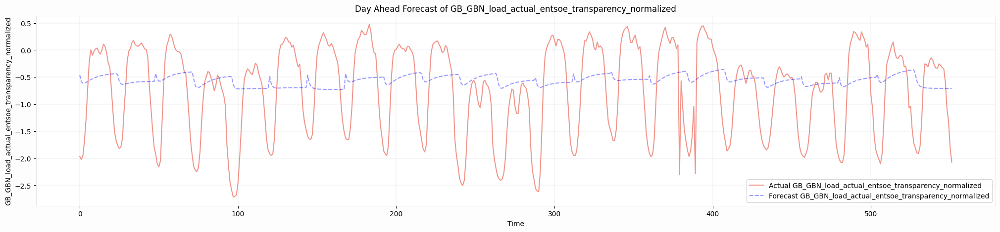

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24weg = model_bpp_gru.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24weg = y_pred_24weg.reshape(len(y_pred_24weg)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24weg)),y_pred_24weg, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24weg.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

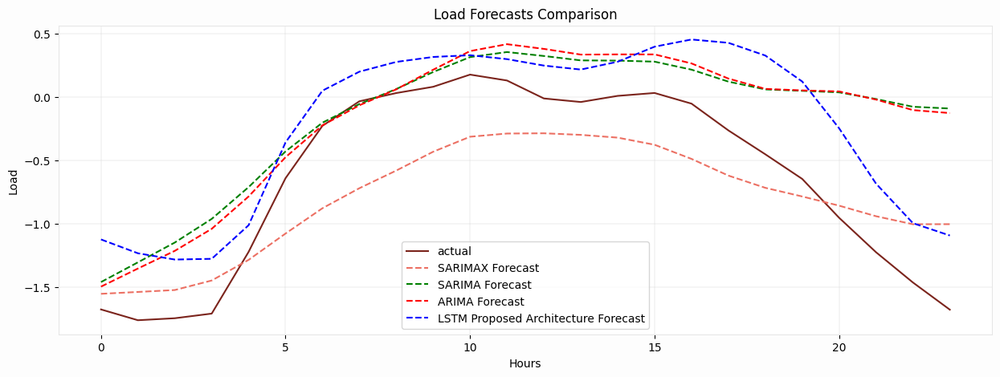

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(24), temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(24), predictions, color = '#EC7063',  linestyle = '--', label = 'SARIMAX Forecast')
plt.plot(range(24), predictions_sarima, color = 'green', linestyle = '--', label = 'SARIMA Forecast')
plt.plot(range(24), predictions_arima, color = 'red', linestyle = '--', label = 'ARIMA Forecast')
plt.plot(range(24), y_pred_24wt[-24:], color = 'blue', linestyle = '--', label = 'LSTM Proposed Architecture Forecast')
plot_cosmos(ax,'Hours','Load','Load Forecasts Comparison')
plt.legend()
plt.show()

In [203]:
# @title Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval_actual, y_pred_24wt)
print(f'MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval_actual, y_pred_24wt)
print(f'MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval_actual - y_pred_24wt) / y_eval_actual)) * 100
print(f'MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval_actual) - np.min(y_eval_actual))
print(f'NRMSE: {nrmse}')

MSE: 0.12163389874418831
RMSE: 0.3487605177542153
MAE: 0.2641226729687957
MAPE: 170.1016914631478%
NRMSE: 0.109241832864665


In [ ]:
# @title Statistical Models Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], predictions)
print(f'SARIMAX MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMAX RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], predictions)
print(f'SARIMAX MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:] - predictions) / temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])) * 100
print(f'SARIMAX MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:]) - np.min(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:]))
print(f'SARIMAX NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], predictions_sarima)
print(f'SARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], predictions_sarima)
print(f'SARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:] - predictions_sarima) / temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])) * 100
print(f'SARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:]) - np.min(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:]))
print(f'NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], predictions_arima)
print(f'ARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'ARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:], predictions_arima)
print(f'ARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:] - predictions_arima) / temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:])) * 100
print(f'ARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:]) - np.min(temp['GB_GBN_load_actual_entsoe_transparency_normalized'].iloc[-24:]))
print(f'ARIMA NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24wel)
print(f'MSE LSTM Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE LSTM Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24wel)
print(f'MAE LSTM Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24wel) / y_eval)) * 100
print(f'MAPE LSTM Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE LSTM Base: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24weg)
print(f'MSE GRU Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE GRU Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24weg)
print(f'MAE GRU Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24weg) / y_eval)) * 100
print(f'MAPE GRU Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE GRU Base: {nrmse}')

SARIMAX MSE: 0.16254401350163525
SARIMAX RMSE: 0.40316747574877027
SARIMAX MAE: 0.36157688205198807
SARIMAX MAPE: 617.2362916602458%
SARIMAX NRMSE: 0.20811031420527284
SARIMA MSE: 0.40670253523969363
SARIMA RMSE: 0.6377323382420665
SARIMA MAE: 0.4797586446656112
SARIMA MAPE: 403.29610052916644%
NRMSE: 0.3291899403441018
ARIMA MSE: 0.39555976301839707
ARIMA RMSE: 0.6289354203878146
ARIMA MAE: 0.47954679656295846
ARIMA MAPE: 466.5034834262495%
ARIMA NRMSE: 0.3246490747018863
MSE LSTM Base: 0.8546066591513719
RMSE LSTM Base: 0.924449381605814
MAE LSTM Base: 0.7368903152176423
MAPE LSTM Base: 655.5068390887943%
NRMSE LSTM Base: 0.2895641556203782
MSE GRU Base: 0.7115880718921779
RMSE GRU Base: 0.8435567982608984
MAE GRU Base: 0.6990254948956263
MAPE GRU Base: 644.2948804229803%
NRMSE GRU Base: 0.2642262701089685


# GHI Forecasting

## Data Loading and Preprocessing

In [14]:
# @title Data Loading and Peprocessing

QUERY = f'''SELECT
            0 AS ll_label,
            date_hour,
            hour,
            shortwave_radiation,
            LAG(shortwave_radiation,1) OVER(ORDER BY date_hour ASC) as ghi_lag_1,
            LAG(shortwave_radiation,2) OVER(ORDER BY date_hour ASC) as ghi_lag_2,
            LAG(shortwave_radiation,3) OVER(ORDER BY date_hour ASC) as ghi_lag_3,
            LAG(shortwave_radiation,4) OVER(ORDER BY date_hour ASC) as ghi_lag_4,
            LAG(shortwave_radiation,5) OVER(ORDER BY date_hour ASC) as ghi_lag_5,
            LAG(shortwave_radiation,6) OVER(ORDER BY date_hour ASC) as ghi_lag_6,
            LAG(shortwave_radiation,24) OVER(ORDER BY date_hour ASC) as ghi_lag_d1,
            LAG(shortwave_radiation,48) OVER(ORDER BY date_hour ASC) as ghi_lag_d2,
            LAG(shortwave_radiation,72) OVER(ORDER BY date_hour ASC) as ghi_lag_d3,
            LAG(shortwave_radiation,96) OVER(ORDER BY date_hour ASC) as ghi_lag_d4,
            LAG(shortwave_radiation,120) OVER(ORDER BY date_hour ASC) as ghi_lag_d5,
            LAG(shortwave_radiation,144) OVER(ORDER BY date_hour ASC) as ghi_lag_d6,
            LAG(shortwave_radiation,168) OVER(ORDER BY date_hour ASC) as ghi_lag_d7,
            LAG(shortwave_radiation,336) OVER(ORDER BY date_hour ASC) as ghi_lag_w2,
            LAG(shortwave_radiation,504) OVER(ORDER BY date_hour ASC) as ghi_lag_w3,
            LAG(shortwave_radiation,672) OVER(ORDER BY date_hour ASC) as ghi_lag_w4,
            relative_humidity_2m,dew_point_2m,vapour_pressure_deficit
            FROM (SELECT DISTINCT date_hour,hour,shortwave_radiation,relative_humidity_2m,dew_point_2m,vapour_pressure_deficit FROM Avishek_Explore.weather_data_UK_overall); '''
query_job = client.query(QUERY)  # API request
weather_data = query_job.result().to_dataframe()
weather_data.sort_values('date_hour', ascending = True, inplace = True)
weather_data.drop_duplicates(inplace = True)
weather_data.dropna(inplace = True)
weather_data['rolling_ghi_average_d'] = (weather_data['shortwave_radiation'] + weather_data['ghi_lag_d1'] + weather_data['ghi_lag_d2'] + weather_data['ghi_lag_d3'] + weather_data['ghi_lag_d4'] + weather_data['ghi_lag_d5'] + weather_data['ghi_lag_d6']  + weather_data['ghi_lag_d7'])/8
weather_data['rolling_ghi_average_dh'] = ( weather_data['ghi_lag_d1'] + weather_data['ghi_lag_d2'] + weather_data['ghi_lag_d3'] + weather_data['ghi_lag_d4'] + weather_data['ghi_lag_d5'] + weather_data['ghi_lag_d6']  + weather_data['ghi_lag_d7'])/7

weather_data['residual_01'] = weather_data['shortwave_radiation'] - weather_data['ghi_lag_1']
weather_data['residual_12'] = weather_data['ghi_lag_1'] - weather_data['ghi_lag_2']
weather_data['residual_23'] = weather_data['ghi_lag_2'] - weather_data['ghi_lag_3']
weather_data['residual_34'] = weather_data['ghi_lag_3'] - weather_data['ghi_lag_4']
weather_data['residual_45'] = weather_data['ghi_lag_4'] - weather_data['ghi_lag_5']
weather_data['rolling_residual_average'] = (weather_data['residual_01'] + weather_data['residual_12'] + weather_data['residual_23'] + weather_data['residual_34'] + weather_data['residual_45'])/5

weather_data['residual_d01'] = weather_data['shortwave_radiation'] - weather_data['ghi_lag_d1']
weather_data['residual_d12'] = weather_data['ghi_lag_d1'] - weather_data['ghi_lag_d2']
weather_data['residual_d23'] = weather_data['ghi_lag_d2'] - weather_data['ghi_lag_d3']
weather_data['residual_d34'] = weather_data['ghi_lag_d3'] - weather_data['ghi_lag_d4']
weather_data['residual_d45'] = weather_data['ghi_lag_d4'] - weather_data['ghi_lag_d5']
weather_data['residual_d56'] = weather_data['ghi_lag_d5'] - weather_data['ghi_lag_d6']
weather_data['residual_d67'] = weather_data['ghi_lag_d6'] - weather_data['ghi_lag_d7']
weather_data['d_rolling_residual_average'] = (weather_data['residual_d01'] + \
                                              weather_data['residual_d12'] + \
                                              weather_data['residual_d23'] + \
                                              weather_data['residual_d34'] + \
                                              weather_data['residual_d45'] + \
                                              weather_data['residual_d56'] + \
                                              weather_data['residual_d67'])/7

weather_data['dh_rolling_residual_average'] = (weather_data['residual_d12'] + \
                                              weather_data['residual_d23'] + \
                                              weather_data['residual_d34'] + \
                                              weather_data['residual_d45'] + \
                                              weather_data['residual_d56'] + \
                                              weather_data['residual_d67'])/6

weather_data['residual_w12'] = weather_data['ghi_lag_d7'] - weather_data['ghi_lag_w2']
weather_data['residual_w23'] = weather_data['ghi_lag_w2'] - weather_data['ghi_lag_w3']
weather_data['residual_w34'] = weather_data['ghi_lag_w3'] - weather_data['ghi_lag_w4']
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# feature_ss_r = dict()

for col in [c for c in weather_data.columns]:
  if col in ['date_hour','hour']:
    pass
  else:
    t_ss_r = StandardScaler()
    # feature_ss_r[col] = t_ss_r
    t_ss_r.fit(np.array(weather_data[f"{col}"]).reshape(-1,1))
    scaled_data = t_ss_r.transform(np.array(weather_data[f"{col}"]).reshape(-1,1))
    weather_data[f"{col}_normalized"] = scaled_data
weather_data['ll_label'] = 0
# from statsmodels.tsa.holtwinters import ExponentialSmoothing
# from scipy.ndimage import gaussian_filter1d
# def gaussian_smooth(data, sigma):
#     return gaussian_filter1d(data, sigma=sigma)

# # Fit the model
# for f in weather_data.columns:
#   if f in ['temp_mean','temp_std','date_hour','date','hour','ll_label']:
#     pass
#   else:
#     weather_data[f"{f}_smooth"] = gaussian_smooth(weather_data[f], 24)
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:180*24]))
signal = weather_data['shortwave_radiation'].iloc[:180*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 1  # The degree of the polynomial used to fit the samples
# smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Fit the model
for f in weather_data.columns:
  if f.find('smooth') == -1:
    if f in ['temp_mean','temp_std','date_hour','date','hour','ll_label']:
      pass
    else:
      weather_data[f"{f}_smooth"] = savgol_filter(weather_data[f], window_length, polyorder)

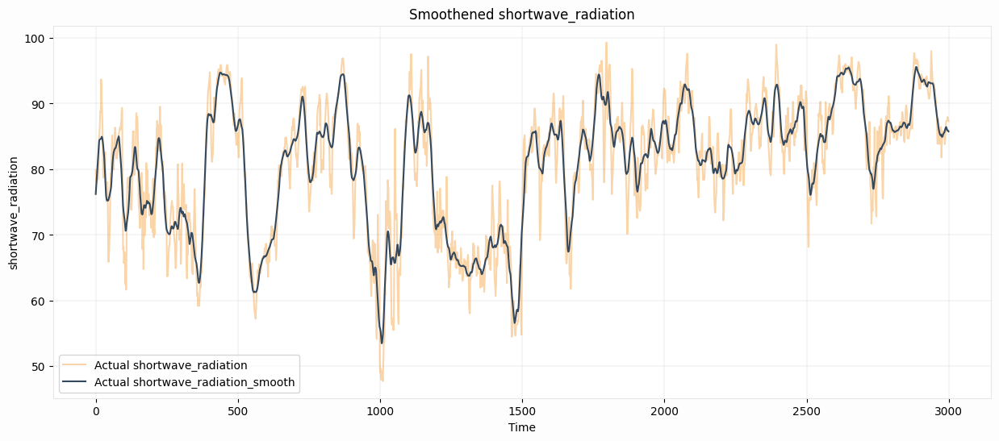

In [15]:
fig = plt.figure(figsize = (15,6))
ax = plt.axes()
ax.plot(range(len(weather_data))[0:3000],weather_data['shortwave_radiation'][0:3000], label = f'Actual shortwave_radiation', color = '#F1972A', alpha = 0.4)
ax.plot(range(len(weather_data))[0:3000],weather_data['shortwave_radiation_smooth'][0:3000], label = f'Actual shortwave_radiation_smooth', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel('shortwave_radiation')
ax.set_title(f'Smoothened shortwave_radiation')

plt.show()

## Model Development

In [31]:
def set_cloud_dirs(GCP_BUCKET, job_dir):
    relative_path = job_dir.split(GCP_BUCKET+"/")[1]
    output_path = relative_path+'/outputs/'
    log_path = relative_path+'/logs/profile/'
    return output_path, log_path
cloud_output_dir, cloud_log_dir = set_cloud_dirs(GCP_BUCKET, 'gs://affle-ds/avishek/body/Research/weather_forecast/experiment/wf_global_all_campaign/local')

In [32]:
def get_callbacks(log_path, GCP_BUCKET):
    import tensorflow as tf

    def scheduler(epoch, lr):

        if epoch % 2 == 0:

            if lr >= 0.0001:

                return lr

            else:

                return 0.01

        else:

            return lr

    cloud_log_dir = os.path.join("gs://", GCP_BUCKET, log_path)

    checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="outputs/best_temp_model.keras", verbose=1, save_best_only=True, monitor="val_rmse", mode="min")

    earlyStopper  = tf.keras.callbacks.EarlyStopping(
                                    monitor="loss",
                                    min_delta=0.001,
                                    patience=5,
                                    verbose=0,
                                    mode="min",
                                    restore_best_weights = True
                                )

    LRScheduler = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=0)

    plateau = tf.keras.callbacks.ReduceLROnPlateau(
                                                                                                    monitor="val_rmse",
                                                                                                    factor=0.5,
                                                                                                    patience=4,
                                                                                                    verbose=0,
                                                                                                    mode="min",
                                                                                                    min_delta=0.01,
                                                                                                    cooldown=0,
                                                                                                    min_lr=0.00001,
                                                                                                )
#     csv_logger = tf.keras.callbacks.CSVLogger("outputs/history.log")

    return [checkpointer,earlyStopper,LRScheduler,plateau]


In [16]:
features_residual = ['ghi_lag_2_normalized', 'ghi_lag_3_normalized',
                      'ghi_lag_4_normalized', 'ghi_lag_5_normalized',
                      'ghi_lag_6_normalized', 'ghi_lag_d1_normalized',
                      'ghi_lag_d2_normalized', 'ghi_lag_d3_normalized',
                      'ghi_lag_d4_normalized', 'ghi_lag_d5_normalized',
                      'ghi_lag_d6_normalized', 'ghi_lag_d7_normalized',
                      'ghi_lag_w2_normalized', 'ghi_lag_w3_normalized',
                      'ghi_lag_w4_normalized', 'rolling_ghi_average_d_normalized',
                      'rolling_ghi_average_dh_normalized', 'residual_01_normalized',
                      'residual_12_normalized', 'residual_23_normalized',
                      'residual_34_normalized', 'residual_45_normalized',
                      'rolling_residual_average_normalized', 'residual_d01_normalized',
                      'residual_d12_normalized', 'residual_d23_normalized',
                      'residual_d34_normalized', 'residual_d45_normalized',
                      'residual_d56_normalized', 'residual_d67_normalized',
                      'd_rolling_residual_average_normalized',
                      'dh_rolling_residual_average_normalized', 'residual_w12_normalized',
                      'residual_w23_normalized', 'residual_w34_normalized']
features_category =[ 'dh_rolling_residual_average_normalized','residual_w12_normalized','residual_w23_normalized', 'residual_w34_normalized','rolling_ghi_average_dh_normalized']
features_primary = [
                      'shortwave_radiation_normalized'
                      ]
TARGET = [
                      'shortwave_radiation_normalized'
                      ]
features_residual_smooth = ['ghi_lag_1_normalized_smooth','ghi_lag_2_normalized_smooth', 'ghi_lag_3_normalized_smooth',
                            'ghi_lag_d1_normalized_smooth', 'ghi_lag_d2_normalized_smooth', 'ghi_lag_d3_normalized_smooth']
features_category_smooth =[ 'ghi_lag_d1_normalized_smooth',
                            'ghi_lag_d2_normalized_smooth', 'ghi_lag_d3_normalized_smooth',
                          ]
features_primary_smooth = [
                      'shortwave_radiation_normalized_smooth'
                      ]
TARGET_smooth = [
                      'shortwave_radiation_normalized_smooth'
                      ]
feature_keys = list(set(features_category + features_residual + features_primary+TARGET+features_category_smooth + features_residual_smooth + features_primary_smooth+TARGET_smooth))
VOCABULARY_SIZE = 10
EMBEDDING_SIZE = 3
LATENT_DIM = 24
SEQ = 168
NUMERICAL_FEATURE_SIZE = len(features_residual_smooth)
PRIMARY_FEATURE_SIZE = len(features_primary_smooth)
NUM_VARS = len(features_category_smooth)
OUTPUT_DIM = len(TARGET_smooth)
LEARNING_RATE = 0.001
N_FUTURE = 24
TARGET_REPEAT = 1

BATCH_SIZE = 14
EPOCHS = 35
SAMPLE_SIZE = None
STEPS = 1
dense_unit = 2

TABLE_NAME = 'weather_data_UK_overall'
CAT_SPLIT = 'll_label'
GCP_BUCKET = 'affle-ds'

In [17]:
# @title LSTM Model GHI


def create_global_ghi_forecast_24w_model_v1(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'ghi_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(dense_unit, activation = 'tanh'), name = 'dense_historic')
        time_series_projection = dense_historic(time_series_projection)

        # time_series_futuristic = BatchNormalization(name = 'Batch_Normalization_2')(inputs[3])
        # time_series_futuristic = LSTM(latent_dim, return_sequences=True, name="LSTM_Futuristic")(time_series_futuristic)
        # dense_futuristic = TimeDistributed(Dense(1, activation = 'tanh'), name = 'dense_futuristic')
        # time_series_futuristic = dense_futuristic(time_series_futuristic)

        hf_concat= Concatenate(name = 'Concatenate_Historic_and_Futuristic_Inputs')([time_series_projection,inputs[3]])
        final_dense = TimeDistributed(Dense(1), name = 'output')
        output = final_dense(hf_concat)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'ghi_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

## Hyperparameter Tuning

In [37]:
ghi_hpt = gridrandomsearchcv(weather_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

Hyperparamet tuning in progess:   0%|          | 0/20 [00:00<?, ?it/s]

sequence : 55, batch : 14, latent dim : 14, dense unit : 86
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.64670, saving model to outputs/best_temp_model.keras
45/45 - 23s - 516ms/step - loss: 0.4560 - rmse: 0.6753 - val_loss: 0.4182 - val_rmse: 0.6467 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.64670
45/45 - 15s - 326ms/step - loss: 0.3903 - rmse: 0.6247 - val_loss: 0.4185 - val_rmse: 0.6469 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.64670
45/45 - 15s - 322ms/step - loss: 0.2942 - rmse: 0.5424 - val_loss: 0.4777 - val_rmse: 0.6912 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 300.02it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.58876, saving model to outputs/best_temp_model.keras
97/97 - 23s - 240ms/step - loss: 0.4397 - rmse: 0.6631 - val_loss: 0.3466 - val_rmse: 0.5888 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.58876
97/97 - 14s - 148ms/step - loss: 0.3716 - rmse: 0.6096 - val_loss: 0.3485 - val_rmse: 0.5903 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.58876
97/97 - 15s - 157ms/step - loss: 0.3592 - rmse: 0.5994 - val_loss: 0.4091 - val_rmse: 0.6396 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 283.33it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 347ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.71177, saving model to outputs/best_temp_model.keras
148/148 - 22s - 152ms/step - loss: 0.3583 - rmse: 0.5986 - val_loss: 0.5066 - val_rmse: 0.7118 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.71177 to 0.67572, saving model to outputs/best_temp_model.keras
148/148 - 14s - 93ms/step - loss: 0.3207 - rmse: 0.5663 - val_loss: 0.4566 - val_rmse: 0.6757 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.67572 to 0.62494, saving model to outputs/best_temp_model.keras
148/148 - 14s - 91ms/step - loss: 0.2816 - rmse: 0.5306 - val_loss: 0.3906 - val_rmse: 0.6249 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 285.59it/s]


1/3 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 795ms/step


Hyperparamet tuning in progess:   5%|▌         | 1/20 [02:47<53:05, 167.68s/it]

sequence : 161, batch : 12, latent dim : 12, dense unit : 87
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.68606, saving model to outputs/best_temp_model.keras
44/44 - 29s - 651ms/step - loss: 0.5305 - rmse: 0.7283 - val_loss: 0.4707 - val_rmse: 0.6861 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.68606
44/44 - 15s - 352ms/step - loss: 0.4220 - rmse: 0.6496 - val_loss: 0.6099 - val_rmse: 0.7810 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.68606
44/44 - 16s - 372ms/step - loss: 0.3058 - rmse: 0.5530 - val_loss: 0.5473 - val_rmse: 0.7398 - learning_rate: 0.0010



100%|██████████| 145/145 [00:00<00:00, 279.49it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 341ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.70793, saving model to outputs/best_temp_model.keras
104/104 - 30s - 288ms/step - loss: 0.5298 - rmse: 0.7279 - val_loss: 0.5012 - val_rmse: 0.7079 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.70793 to 0.64517, saving model to outputs/best_temp_model.keras
104/104 - 19s - 180ms/step - loss: 0.3852 - rmse: 0.6206 - val_loss: 0.4162 - val_rmse: 0.6452 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.64517 to 0.58859, saving model to outputs/best_temp_model.keras
104/104 - 19s - 180ms/step - loss: 0.3552 - rmse: 0.5960 - val_loss: 0.3464 - val_rmse: 0.5886 - learning_rate: 0.0010



100%|██████████| 115/115 [00:00<00:00, 318.31it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 382ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.76217, saving model to outputs/best_temp_model.keras
164/164 - 28s - 173ms/step - loss: 0.4040 - rmse: 0.6356 - val_loss: 0.5809 - val_rmse: 0.7622 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.76217 to 0.67286, saving model to outputs/best_temp_model.keras
164/164 - 22s - 132ms/step - loss: 0.3030 - rmse: 0.5505 - val_loss: 0.4527 - val_rmse: 0.6729 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.67286
164/164 - 22s - 134ms/step - loss: 0.2866 - rmse: 0.5353 - val_loss: 0.6176 - val_rmse: 0.7859 - learning_rate: 0.0010



100%|██████████| 85/85 [00:00<00:00, 363.01it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 516ms/step


Hyperparamet tuning in progess:  10%|█         | 2/20 [06:50<1:03:37, 212.11s/it]

sequence : 104, batch : 23, latent dim : 23, dense unit : 86
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.64819, saving model to outputs/best_temp_model.keras
25/25 - 19s - 758ms/step - loss: 0.4885 - rmse: 0.6990 - val_loss: 0.4202 - val_rmse: 0.6482 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.64819 to 0.62024, saving model to outputs/best_temp_model.keras
25/25 - 12s - 484ms/step - loss: 0.3553 - rmse: 0.5961 - val_loss: 0.3847 - val_rmse: 0.6202 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.62024
25/25 - 11s - 452ms/step - loss: 0.2672 - rmse: 0.5169 - val_loss: 0.6016 - val_rmse: 0.7756 - learning_rate: 0.0010



100%|██████████| 147/147 [00:00<00:00, 354.39it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 242ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.59342, saving model to outputs/best_temp_model.keras
57/57 - 19s - 340ms/step - loss: 0.4679 - rmse: 0.6840 - val_loss: 0.3521 - val_rmse: 0.5934 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.59342 to 0.57081, saving model to outputs/best_temp_model.keras
57/57 - 13s - 220ms/step - loss: 0.3977 - rmse: 0.6306 - val_loss: 0.3258 - val_rmse: 0.5708 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.57081 to 0.56220, saving model to outputs/best_temp_model.keras
57/57 - 12s - 211ms/step - loss: 0.3679 - rmse: 0.6066 - val_loss: 0.3161 - val_rmse: 0.5622 - learning_rate: 0.0010



100%|██████████| 117/117 [00:00<00:00, 360.73it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 310ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.57619, saving model to outputs/best_temp_model.keras
88/88 - 21s - 236ms/step - loss: 0.5538 - rmse: 0.7442 - val_loss: 0.3320 - val_rmse: 0.5762 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.57619
88/88 - 13s - 143ms/step - loss: 0.3827 - rmse: 0.6186 - val_loss: 0.3744 - val_rmse: 0.6119 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.57619
88/88 - 12s - 138ms/step - loss: 0.3373 - rmse: 0.5808 - val_loss: 0.3837 - val_rmse: 0.6194 - learning_rate: 0.0010



100%|██████████| 87/87 [00:00<00:00, 395.22it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 451ms/step


Hyperparamet tuning in progess:  15%|█▌        | 3/20 [09:17<51:41, 182.42s/it]  

sequence : 102, batch : 30, latent dim : 30, dense unit : 65
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.62510, saving model to outputs/best_temp_model.keras
19/19 - 18s - 939ms/step - loss: 0.4152 - rmse: 0.6444 - val_loss: 0.3907 - val_rmse: 0.6251 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.62510 to 0.60998, saving model to outputs/best_temp_model.keras
19/19 - 11s - 592ms/step - loss: 0.2725 - rmse: 0.5220 - val_loss: 0.3721 - val_rmse: 0.6100 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.60998
19/19 - 10s - 543ms/step - loss: 0.2326 - rmse: 0.4823 - val_loss: 0.4447 - val_rmse: 0.6668 - learning_rate: 0.0010



100%|██████████| 147/147 [00:00<00:00, 401.44it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 229ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.58159, saving model to outputs/best_temp_model.keras
43/43 - 18s - 422ms/step - loss: 0.4528 - rmse: 0.6729 - val_loss: 0.3382 - val_rmse: 0.5816 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.58159
43/43 - 11s - 261ms/step - loss: 0.4016 - rmse: 0.6337 - val_loss: 0.3438 - val_rmse: 0.5863 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.58159 to 0.57341, saving model to outputs/best_temp_model.keras
43/43 - 11s - 253ms/step - loss: 0.3779 - rmse: 0.6148 - val_loss: 0.3288 - val_rmse: 0.5734 - learning_rate: 0.0010



100%|██████████| 117/117 [00:00<00:00, 391.39it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 301ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.60517, saving model to outputs/best_temp_model.keras
67/67 - 18s - 276ms/step - loss: 0.4396 - rmse: 0.6630 - val_loss: 0.3662 - val_rmse: 0.6052 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.60517 to 0.58516, saving model to outputs/best_temp_model.keras
67/67 - 12s - 174ms/step - loss: 0.3452 - rmse: 0.5875 - val_loss: 0.3424 - val_rmse: 0.5852 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.58516 to 0.57985, saving model to outputs/best_temp_model.keras
67/67 - 11s - 161ms/step - loss: 0.3129 - rmse: 0.5593 - val_loss: 0.3362 - val_rmse: 0.5798 - learning_rate: 0.0010



100%|██████████| 87/87 [00:00<00:00, 416.83it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step


Hyperparamet tuning in progess:  20%|██        | 4/20 [11:27<43:02, 161.40s/it]

sequence : 70, batch : 7, latent dim : 7, dense unit : 35
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.74549, saving model to outputs/best_temp_model.keras
89/89 - 21s - 232ms/step - loss: 0.4220 - rmse: 0.6496 - val_loss: 0.5557 - val_rmse: 0.7455 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.74549 to 0.70733, saving model to outputs/best_temp_model.keras
89/89 - 14s - 156ms/step - loss: 0.3504 - rmse: 0.5920 - val_loss: 0.5003 - val_rmse: 0.7073 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.70733
89/89 - 14s - 155ms/step - loss: 0.2753 - rmse: 0.5247 - val_loss: 0.5954 - val_rmse: 0.7716 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 394.24it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.70836, saving model to outputs/best_temp_model.keras
192/192 - 22s - 114ms/step - loss: 0.4393 - rmse: 0.6628 - val_loss: 0.5018 - val_rmse: 0.7084 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.70836 to 0.65011, saving model to outputs/best_temp_model.keras
192/192 - 15s - 78ms/step - loss: 0.3230 - rmse: 0.5683 - val_loss: 0.4226 - val_rmse: 0.6501 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.65011
192/192 - 15s - 77ms/step - loss: 0.2980 - rmse: 0.5459 - val_loss: 0.4995 - val_rmse: 0.7068 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 409.58it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 292ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.71322, saving model to outputs/best_temp_model.keras
295/295 - 23s - 77ms/step - loss: 0.3784 - rmse: 0.6151 - val_loss: 0.5087 - val_rmse: 0.7132 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.71322
295/295 - 16s - 54ms/step - loss: 0.3136 - rmse: 0.5600 - val_loss: 0.5269 - val_rmse: 0.7259 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.71322 to 0.68320, saving model to outputs/best_temp_model.keras
295/295 - 16s - 54ms/step - loss: 0.2753 - rmse: 0.5247 - val_loss: 0.4668 - val_rmse: 0.6832 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 427.76it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 417ms/step


Hyperparamet tuning in progess:  25%|██▌       | 5/20 [14:11<40:35, 162.35s/it]

sequence : 24, batch : 24, latent dim : 24, dense unit : 16
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.96591, saving model to outputs/best_temp_model.keras
28/28 - 19s - 664ms/step - loss: 0.7077 - rmse: 0.8413 - val_loss: 0.9330 - val_rmse: 0.9659 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.96591 to 0.91425, saving model to outputs/best_temp_model.keras
28/28 - 11s - 379ms/step - loss: 0.3788 - rmse: 0.6154 - val_loss: 0.8358 - val_rmse: 0.9142 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.91425 to 0.90553, saving model to outputs/best_temp_model.keras
28/28 - 10s - 355ms/step - loss: 0.3639 - rmse: 0.6032 - val_loss: 0.8200 - val_rmse: 0.9055 - learning_rate: 0.0010



100%|██████████| 150/150 [00:00<00:00, 397.76it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.88328, saving model to outputs/best_temp_model.keras
58/58 - 17s - 301ms/step - loss: 1.0526 - rmse: 1.0259 - val_loss: 0.7802 - val_rmse: 0.8833 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.88328 to 0.77269, saving model to outputs/best_temp_model.keras
58/58 - 11s - 184ms/step - loss: 0.5582 - rmse: 0.7471 - val_loss: 0.5970 - val_rmse: 0.7727 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.77269 to 0.72347, saving model to outputs/best_temp_model.keras
58/58 - 10s - 174ms/step - loss: 0.4666 - rmse: 0.6831 - val_loss: 0.5234 - val_rmse: 0.7235 - learning_rate: 0.0010



100%|██████████| 120/120 [00:00<00:00, 400.15it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.61727, saving model to outputs/best_temp_model.keras
88/88 - 17s - 199ms/step - loss: 0.4158 - rmse: 0.6449 - val_loss: 0.3810 - val_rmse: 0.6173 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.61727 to 0.60744, saving model to outputs/best_temp_model.keras
88/88 - 11s - 123ms/step - loss: 0.3455 - rmse: 0.5878 - val_loss: 0.3690 - val_rmse: 0.6074 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.60744 to 0.59480, saving model to outputs/best_temp_model.keras
88/88 - 10s - 116ms/step - loss: 0.3165 - rmse: 0.5626 - val_loss: 0.3538 - val_rmse: 0.5948 - learning_rate: 0.0010



100%|██████████| 90/90 [00:00<00:00, 399.69it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 419ms/step


Hyperparamet tuning in progess:  30%|███       | 6/20 [16:14<34:46, 149.01s/it]

sequence : 127, batch : 22, latent dim : 22, dense unit : 118
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.59452, saving model to outputs/best_temp_model.keras
25/25 - 20s - 793ms/step - loss: 0.4948 - rmse: 0.7034 - val_loss: 0.3534 - val_rmse: 0.5945 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.59452 to 0.57210, saving model to outputs/best_temp_model.keras
25/25 - 13s - 528ms/step - loss: 0.3312 - rmse: 0.5755 - val_loss: 0.3273 - val_rmse: 0.5721 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.57210
25/25 - 13s - 511ms/step - loss: 0.2514 - rmse: 0.5014 - val_loss: 0.5775 - val_rmse: 0.7599 - learning_rate: 0.0010



100%|██████████| 146/146 [00:00<00:00, 339.29it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.60654, saving model to outputs/best_temp_model.keras
58/58 - 21s - 367ms/step - loss: 0.6075 - rmse: 0.7794 - val_loss: 0.3679 - val_rmse: 0.6065 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.60654 to 0.58217, saving model to outputs/best_temp_model.keras
58/58 - 15s - 250ms/step - loss: 0.5109 - rmse: 0.7148 - val_loss: 0.3389 - val_rmse: 0.5822 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.58217 to 0.54556, saving model to outputs/best_temp_model.keras
58/58 - 14s - 243ms/step - loss: 0.4444 - rmse: 0.6666 - val_loss: 0.2976 - val_rmse: 0.5456 - learning_rate: 0.0010



100%|██████████| 116/116 [00:00<00:00, 406.43it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 325ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.58486, saving model to outputs/best_temp_model.keras
91/91 - 24s - 268ms/step - loss: 0.4670 - rmse: 0.6834 - val_loss: 0.3421 - val_rmse: 0.5849 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.58486 to 0.56936, saving model to outputs/best_temp_model.keras
91/91 - 16s - 173ms/step - loss: 0.3885 - rmse: 0.6233 - val_loss: 0.3242 - val_rmse: 0.5694 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.56936
91/91 - 15s - 169ms/step - loss: 0.3324 - rmse: 0.5766 - val_loss: 0.3271 - val_rmse: 0.5719 - learning_rate: 0.0010



100%|██████████| 86/86 [00:00<00:00, 404.60it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 463ms/step


Hyperparamet tuning in progess:  35%|███▌      | 7/20 [18:57<33:18, 153.72s/it]

sequence : 31, batch : 24, latent dim : 24, dense unit : 58
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.67207, saving model to outputs/best_temp_model.keras
27/27 - 18s - 652ms/step - loss: 0.4637 - rmse: 0.6810 - val_loss: 0.4517 - val_rmse: 0.6721 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.67207
27/27 - 11s - 395ms/step - loss: 0.3411 - rmse: 0.5840 - val_loss: 0.4794 - val_rmse: 0.6924 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.67207
27/27 - 10s - 384ms/step - loss: 0.2632 - rmse: 0.5130 - val_loss: 0.4705 - val_rmse: 0.6859 - learning_rate: 0.0010



100%|██████████| 150/150 [00:00<00:00, 408.66it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 227ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.75824, saving model to outputs/best_temp_model.keras
57/57 - 18s - 310ms/step - loss: 0.5493 - rmse: 0.7411 - val_loss: 0.5749 - val_rmse: 0.7582 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.75824 to 0.66990, saving model to outputs/best_temp_model.keras
57/57 - 11s - 193ms/step - loss: 0.4328 - rmse: 0.6579 - val_loss: 0.4488 - val_rmse: 0.6699 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.66990
57/57 - 10s - 181ms/step - loss: 0.3955 - rmse: 0.6289 - val_loss: 0.5159 - val_rmse: 0.7183 - learning_rate: 0.0010



100%|██████████| 120/120 [00:00<00:00, 405.54it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.59710, saving model to outputs/best_temp_model.keras
87/87 - 18s - 205ms/step - loss: 0.3892 - rmse: 0.6239 - val_loss: 0.3565 - val_rmse: 0.5971 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.59710 to 0.58277, saving model to outputs/best_temp_model.keras
87/87 - 11s - 128ms/step - loss: 0.3154 - rmse: 0.5616 - val_loss: 0.3396 - val_rmse: 0.5828 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.58277 to 0.57709, saving model to outputs/best_temp_model.keras
87/87 - 10s - 120ms/step - loss: 0.2820 - rmse: 0.5310 - val_loss: 0.3330 - val_rmse: 0.5771 - learning_rate: 0.0010



100%|██████████| 90/90 [00:00<00:00, 423.34it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 444ms/step


Hyperparamet tuning in progess:  40%|████      | 8/20 [21:01<28:51, 144.31s/it]

sequence : 120, batch : 17, latent dim : 17, dense unit : 20
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.88632, saving model to outputs/best_temp_model.keras
33/33 - 18s - 545ms/step - loss: 0.6127 - rmse: 0.7828 - val_loss: 0.7856 - val_rmse: 0.8863 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.88632 to 0.88452, saving model to outputs/best_temp_model.keras
33/33 - 11s - 341ms/step - loss: 0.3956 - rmse: 0.6290 - val_loss: 0.7824 - val_rmse: 0.8845 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.88452
33/33 - 11s - 329ms/step - loss: 0.3342 - rmse: 0.5781 - val_loss: 0.7824 - val_rmse: 0.8845 - learning_rate: 0.0010



100%|██████████| 146/146 [00:00<00:00, 376.70it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.81798, saving model to outputs/best_temp_model.keras
76/76 - 21s - 271ms/step - loss: 0.7705 - rmse: 0.8778 - val_loss: 0.6691 - val_rmse: 0.8180 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.81798 to 0.76925, saving model to outputs/best_temp_model.keras
76/76 - 12s - 157ms/step - loss: 0.5052 - rmse: 0.7108 - val_loss: 0.5917 - val_rmse: 0.7693 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.76925 to 0.72002, saving model to outputs/best_temp_model.keras
76/76 - 11s - 151ms/step - loss: 0.4220 - rmse: 0.6496 - val_loss: 0.5184 - val_rmse: 0.7200 - learning_rate: 0.0010



100%|██████████| 116/116 [00:00<00:00, 395.79it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 300ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.95438, saving model to outputs/best_temp_model.keras
118/118 - 19s - 163ms/step - loss: 0.9691 - rmse: 0.9844 - val_loss: 0.9108 - val_rmse: 0.9544 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.95438 to 0.88111, saving model to outputs/best_temp_model.keras
118/118 - 12s - 106ms/step - loss: 0.5085 - rmse: 0.7131 - val_loss: 0.7764 - val_rmse: 0.8811 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.88111 to 0.84509, saving model to outputs/best_temp_model.keras
118/118 - 12s - 102ms/step - loss: 0.4119 - rmse: 0.6418 - val_loss: 0.7142 - val_rmse: 0.8451 - learning_rate: 0.0010



100%|██████████| 86/86 [00:00<00:00, 399.20it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 422ms/step


Hyperparamet tuning in progess:  45%|████▌     | 9/20 [23:16<25:55, 141.37s/it]

sequence : 120, batch : 21, latent dim : 21, dense unit : 19
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.66345, saving model to outputs/best_temp_model.keras
27/27 - 18s - 648ms/step - loss: 0.4963 - rmse: 0.7045 - val_loss: 0.4402 - val_rmse: 0.6634 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.66345 to 0.66086, saving model to outputs/best_temp_model.keras
27/27 - 11s - 409ms/step - loss: 0.4159 - rmse: 0.6449 - val_loss: 0.4367 - val_rmse: 0.6609 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.66086
27/27 - 10s - 381ms/step - loss: 0.3711 - rmse: 0.6092 - val_loss: 0.4484 - val_rmse: 0.6697 - learning_rate: 0.0010



100%|██████████| 146/146 [00:00<00:00, 392.40it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 219ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.92885, saving model to outputs/best_temp_model.keras
61/61 - 18s - 296ms/step - loss: 1.2908 - rmse: 1.1361 - val_loss: 0.8628 - val_rmse: 0.9288 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.92885 to 0.84046, saving model to outputs/best_temp_model.keras
61/61 - 11s - 187ms/step - loss: 0.7001 - rmse: 0.8367 - val_loss: 0.7064 - val_rmse: 0.8405 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.84046 to 0.79152, saving model to outputs/best_temp_model.keras
61/61 - 11s - 176ms/step - loss: 0.5664 - rmse: 0.7526 - val_loss: 0.6265 - val_rmse: 0.7915 - learning_rate: 0.0010



100%|██████████| 116/116 [00:00<00:00, 396.89it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 290ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.74731, saving model to outputs/best_temp_model.keras
96/96 - 19s - 195ms/step - loss: 0.5092 - rmse: 0.7136 - val_loss: 0.5585 - val_rmse: 0.7473 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.74731 to 0.73159, saving model to outputs/best_temp_model.keras
96/96 - 12s - 124ms/step - loss: 0.3772 - rmse: 0.6141 - val_loss: 0.5352 - val_rmse: 0.7316 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.73159
96/96 - 11s - 117ms/step - loss: 0.3247 - rmse: 0.5699 - val_loss: 0.5392 - val_rmse: 0.7343 - learning_rate: 0.0010



100%|██████████| 86/86 [00:00<00:00, 409.03it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 424ms/step


Hyperparamet tuning in progess:  50%|█████     | 10/20 [25:24<22:51, 137.20s/it]

sequence : 108, batch : 13, latent dim : 13, dense unit : 38
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.73929, saving model to outputs/best_temp_model.keras
45/45 - 19s - 417ms/step - loss: 0.4647 - rmse: 0.6817 - val_loss: 0.5466 - val_rmse: 0.7393 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.73929 to 0.66750, saving model to outputs/best_temp_model.keras
45/45 - 12s - 265ms/step - loss: 0.3903 - rmse: 0.6247 - val_loss: 0.4456 - val_rmse: 0.6675 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.66750
45/45 - 12s - 259ms/step - loss: 0.3101 - rmse: 0.5569 - val_loss: 0.5285 - val_rmse: 0.7270 - learning_rate: 0.0010



100%|██████████| 147/147 [00:00<00:00, 371.94it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 226ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.61440, saving model to outputs/best_temp_model.keras
100/100 - 22s - 218ms/step - loss: 0.4645 - rmse: 0.6816 - val_loss: 0.3775 - val_rmse: 0.6144 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.61440 to 0.59407, saving model to outputs/best_temp_model.keras
100/100 - 13s - 126ms/step - loss: 0.3956 - rmse: 0.6289 - val_loss: 0.3529 - val_rmse: 0.5941 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.59407
100/100 - 12s - 124ms/step - loss: 0.3706 - rmse: 0.6088 - val_loss: 0.3614 - val_rmse: 0.6011 - learning_rate: 0.0010



100%|██████████| 117/117 [00:00<00:00, 406.60it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 307ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.61767, saving model to outputs/best_temp_model.keras
156/156 - 20s - 129ms/step - loss: 0.3958 - rmse: 0.6291 - val_loss: 0.3815 - val_rmse: 0.6177 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.61767
156/156 - 13s - 85ms/step - loss: 0.3337 - rmse: 0.5777 - val_loss: 0.4229 - val_rmse: 0.6503 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.61767
156/156 - 13s - 85ms/step - loss: 0.2941 - rmse: 0.5423 - val_loss: 0.4544 - val_rmse: 0.6741 - learning_rate: 0.0010



100%|██████████| 87/87 [00:00<00:00, 413.05it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 431ms/step


Hyperparamet tuning in progess:  55%|█████▌    | 11/20 [27:47<20:50, 138.95s/it]

sequence : 64, batch : 28, latent dim : 28, dense unit : 6
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.36627, saving model to outputs/best_temp_model.keras
22/22 - 17s - 781ms/step - loss: 1.6895 - rmse: 1.2998 - val_loss: 1.8667 - val_rmse: 1.3663 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 1.36627 to 1.29408, saving model to outputs/best_temp_model.keras
22/22 - 11s - 482ms/step - loss: 1.1895 - rmse: 1.0906 - val_loss: 1.6746 - val_rmse: 1.2941 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 1.29408 to 1.22589, saving model to outputs/best_temp_model.keras
22/22 - 10s - 443ms/step - loss: 0.7755 - rmse: 0.8806 - val_loss: 1.5028 - val_rmse: 1.2259 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 408.98it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 218ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.78946, saving model to outputs/best_temp_model.keras
48/48 - 17s - 358ms/step - loss: 0.7213 - rmse: 0.8493 - val_loss: 0.6232 - val_rmse: 0.7895 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.78946 to 0.77201, saving model to outputs/best_temp_model.keras
48/48 - 11s - 222ms/step - loss: 0.6328 - rmse: 0.7955 - val_loss: 0.5960 - val_rmse: 0.7720 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.77201 to 0.74392, saving model to outputs/best_temp_model.keras
48/48 - 10s - 205ms/step - loss: 0.5836 - rmse: 0.7640 - val_loss: 0.5534 - val_rmse: 0.7439 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 413.16it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 295ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.66947, saving model to outputs/best_temp_model.keras
74/74 - 17s - 235ms/step - loss: 0.3821 - rmse: 0.6182 - val_loss: 0.4482 - val_rmse: 0.6695 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.66947 to 0.66659, saving model to outputs/best_temp_model.keras
74/74 - 11s - 147ms/step - loss: 0.3585 - rmse: 0.5987 - val_loss: 0.4443 - val_rmse: 0.6666 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.66659 to 0.66636, saving model to outputs/best_temp_model.keras
74/74 - 10s - 135ms/step - loss: 0.3467 - rmse: 0.5888 - val_loss: 0.4440 - val_rmse: 0.6664 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 405.75it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 414ms/step


Hyperparamet tuning in progess:  60%|██████    | 12/20 [29:48<17:46, 133.35s/it]

sequence : 71, batch : 21, latent dim : 21, dense unit : 92
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.63599, saving model to outputs/best_temp_model.keras
29/29 - 20s - 674ms/step - loss: 0.4688 - rmse: 0.6847 - val_loss: 0.4045 - val_rmse: 0.6360 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.63599
29/29 - 12s - 401ms/step - loss: 0.3759 - rmse: 0.6131 - val_loss: 0.4605 - val_rmse: 0.6786 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.63599 to 0.60008, saving model to outputs/best_temp_model.keras
29/29 - 11s - 392ms/step - loss: 0.2726 - rmse: 0.5221 - val_loss: 0.3601 - val_rmse: 0.6001 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 375.12it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 234ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.62560, saving model to outputs/best_temp_model.keras
64/64 - 19s - 294ms/step - loss: 0.4806 - rmse: 0.6932 - val_loss: 0.3914 - val_rmse: 0.6256 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.62560
64/64 - 12s - 188ms/step - loss: 0.4005 - rmse: 0.6329 - val_loss: 0.4580 - val_rmse: 0.6768 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.62560 to 0.55571, saving model to outputs/best_temp_model.keras
64/64 - 12s - 183ms/step - loss: 0.3634 - rmse: 0.6028 - val_loss: 0.3088 - val_rmse: 0.5557 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 395.42it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 293ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.59134, saving model to outputs/best_temp_model.keras
98/98 - 22s - 225ms/step - loss: 0.4143 - rmse: 0.6436 - val_loss: 0.3497 - val_rmse: 0.5913 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.59134
98/98 - 12s - 126ms/step - loss: 0.3411 - rmse: 0.5840 - val_loss: 0.6012 - val_rmse: 0.7754 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.59134
98/98 - 12s - 122ms/step - loss: 0.3128 - rmse: 0.5593 - val_loss: 0.5435 - val_rmse: 0.7373 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 396.82it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 464ms/step


Hyperparamet tuning in progess:  65%|██████▌   | 13/20 [32:07<15:45, 135.04s/it]

sequence : 48, batch : 24, latent dim : 24, dense unit : 96
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.62135, saving model to outputs/best_temp_model.keras
27/27 - 18s - 682ms/step - loss: 0.4520 - rmse: 0.6723 - val_loss: 0.3861 - val_rmse: 0.6214 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.62135 to 0.60277, saving model to outputs/best_temp_model.keras
27/27 - 12s - 428ms/step - loss: 0.4065 - rmse: 0.6376 - val_loss: 0.3633 - val_rmse: 0.6028 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.60277
27/27 - 11s - 401ms/step - loss: 0.3337 - rmse: 0.5776 - val_loss: 0.6788 - val_rmse: 0.8239 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 382.96it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 232ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.58010, saving model to outputs/best_temp_model.keras
57/57 - 19s - 327ms/step - loss: 0.4296 - rmse: 0.6555 - val_loss: 0.3365 - val_rmse: 0.5801 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.58010 to 0.55920, saving model to outputs/best_temp_model.keras
57/57 - 12s - 205ms/step - loss: 0.3664 - rmse: 0.6053 - val_loss: 0.3127 - val_rmse: 0.5592 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.55920
57/57 - 11s - 192ms/step - loss: 0.3422 - rmse: 0.5850 - val_loss: 0.3806 - val_rmse: 0.6169 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 395.78it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 302ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.62362, saving model to outputs/best_temp_model.keras
87/87 - 19s - 215ms/step - loss: 0.3832 - rmse: 0.6191 - val_loss: 0.3889 - val_rmse: 0.6236 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.62362 to 0.56118, saving model to outputs/best_temp_model.keras
87/87 - 12s - 139ms/step - loss: 0.3532 - rmse: 0.5943 - val_loss: 0.3149 - val_rmse: 0.5612 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.56118
87/87 - 11s - 129ms/step - loss: 0.3033 - rmse: 0.5507 - val_loss: 0.3860 - val_rmse: 0.6213 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 407.42it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 448ms/step


Hyperparamet tuning in progess:  70%|███████   | 14/20 [34:18<13:23, 133.99s/it]

sequence : 120, batch : 24, latent dim : 24, dense unit : 104
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.63913, saving model to outputs/best_temp_model.keras
24/24 - 19s - 796ms/step - loss: 0.6132 - rmse: 0.7831 - val_loss: 0.4085 - val_rmse: 0.6391 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.63913 to 0.60905, saving model to outputs/best_temp_model.keras
24/24 - 12s - 504ms/step - loss: 0.5022 - rmse: 0.7087 - val_loss: 0.3709 - val_rmse: 0.6091 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.60905
24/24 - 12s - 492ms/step - loss: 0.3232 - rmse: 0.5685 - val_loss: 0.3917 - val_rmse: 0.6258 - learning_rate: 0.0010



100%|██████████| 146/146 [00:00<00:00, 369.59it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 244ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.59785, saving model to outputs/best_temp_model.keras
54/54 - 20s - 364ms/step - loss: 0.4855 - rmse: 0.6968 - val_loss: 0.3574 - val_rmse: 0.5979 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.59785 to 0.53963, saving model to outputs/best_temp_model.keras
54/54 - 13s - 238ms/step - loss: 0.3873 - rmse: 0.6224 - val_loss: 0.2912 - val_rmse: 0.5396 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.53963
54/54 - 12s - 225ms/step - loss: 0.3445 - rmse: 0.5869 - val_loss: 0.3736 - val_rmse: 0.6112 - learning_rate: 0.0010



100%|██████████| 116/116 [00:00<00:00, 388.05it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 310ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.60153, saving model to outputs/best_temp_model.keras
84/84 - 20s - 240ms/step - loss: 0.4826 - rmse: 0.6947 - val_loss: 0.3618 - val_rmse: 0.6015 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.60153
84/84 - 13s - 156ms/step - loss: 0.3938 - rmse: 0.6275 - val_loss: 0.3815 - val_rmse: 0.6177 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.60153
84/84 - 13s - 152ms/step - loss: 0.3371 - rmse: 0.5806 - val_loss: 0.4300 - val_rmse: 0.6558 - learning_rate: 0.0010



100%|██████████| 86/86 [00:00<00:00, 411.00it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 453ms/step


Hyperparamet tuning in progess:  75%|███████▌  | 15/20 [36:39<11:20, 136.14s/it]

sequence : 46, batch : 18, latent dim : 18, dense unit : 39
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.72074, saving model to outputs/best_temp_model.keras
36/36 - 18s - 498ms/step - loss: 0.4859 - rmse: 0.6971 - val_loss: 0.5195 - val_rmse: 0.7207 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.72074 to 0.70480, saving model to outputs/best_temp_model.keras
36/36 - 11s - 309ms/step - loss: 0.4266 - rmse: 0.6531 - val_loss: 0.4967 - val_rmse: 0.7048 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.70480 to 0.68187, saving model to outputs/best_temp_model.keras
36/36 - 11s - 294ms/step - loss: 0.3265 - rmse: 0.5714 - val_loss: 0.4649 - val_rmse: 0.6819 - learning_rate: 0.0010



100%|██████████| 150/150 [00:00<00:00, 378.89it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 218ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.64302, saving model to outputs/best_temp_model.keras
76/76 - 21s - 281ms/step - loss: 0.5864 - rmse: 0.7658 - val_loss: 0.4135 - val_rmse: 0.6430 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.64302 to 0.61769, saving model to outputs/best_temp_model.keras
76/76 - 11s - 150ms/step - loss: 0.4877 - rmse: 0.6984 - val_loss: 0.3815 - val_rmse: 0.6177 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.61769 to 0.60469, saving model to outputs/best_temp_model.keras
76/76 - 11s - 144ms/step - loss: 0.4609 - rmse: 0.6789 - val_loss: 0.3656 - val_rmse: 0.6047 - learning_rate: 0.0010



100%|██████████| 120/120 [00:00<00:00, 380.45it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 310ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.01797, saving model to outputs/best_temp_model.keras
116/116 - 19s - 161ms/step - loss: 0.9520 - rmse: 0.9757 - val_loss: 1.0363 - val_rmse: 1.0180 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 1.01797 to 0.95437, saving model to outputs/best_temp_model.keras
116/116 - 12s - 102ms/step - loss: 0.5878 - rmse: 0.7667 - val_loss: 0.9108 - val_rmse: 0.9544 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.95437 to 0.90685, saving model to outputs/best_temp_model.keras
116/116 - 11s - 96ms/step - loss: 0.4778 - rmse: 0.6912 - val_loss: 0.8224 - val_rmse: 0.9069 - learning_rate: 0.0010



100%|██████████| 90/90 [00:00<00:00, 380.08it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 437ms/step


Hyperparamet tuning in progess:  80%|████████  | 16/20 [38:51<08:59, 134.98s/it]

sequence : 33, batch : 26, latent dim : 26, dense unit : 44
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.57623, saving model to outputs/best_temp_model.keras
25/25 - 18s - 705ms/step - loss: 0.4014 - rmse: 0.6336 - val_loss: 0.3320 - val_rmse: 0.5762 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.57623
25/25 - 10s - 420ms/step - loss: 0.3094 - rmse: 0.5563 - val_loss: 0.3387 - val_rmse: 0.5820 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.57623
25/25 - 10s - 408ms/step - loss: 0.2512 - rmse: 0.5012 - val_loss: 0.3768 - val_rmse: 0.6139 - learning_rate: 0.0010



100%|██████████| 150/150 [00:00<00:00, 402.79it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.68546, saving model to outputs/best_temp_model.keras
53/53 - 18s - 335ms/step - loss: 0.4410 - rmse: 0.6641 - val_loss: 0.4699 - val_rmse: 0.6855 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.68546 to 0.61894, saving model to outputs/best_temp_model.keras
53/53 - 11s - 207ms/step - loss: 0.3799 - rmse: 0.6164 - val_loss: 0.3831 - val_rmse: 0.6189 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.61894 to 0.60529, saving model to outputs/best_temp_model.keras
53/53 - 10s - 192ms/step - loss: 0.3719 - rmse: 0.6099 - val_loss: 0.3664 - val_rmse: 0.6053 - learning_rate: 0.0010



100%|██████████| 120/120 [00:00<00:00, 400.61it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 282ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.65162, saving model to outputs/best_temp_model.keras
80/80 - 18s - 222ms/step - loss: 0.4256 - rmse: 0.6524 - val_loss: 0.4246 - val_rmse: 0.6516 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.65162 to 0.63041, saving model to outputs/best_temp_model.keras
80/80 - 11s - 137ms/step - loss: 0.3763 - rmse: 0.6135 - val_loss: 0.3974 - val_rmse: 0.6304 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.63041 to 0.58908, saving model to outputs/best_temp_model.keras
80/80 - 10s - 127ms/step - loss: 0.2900 - rmse: 0.5385 - val_loss: 0.3470 - val_rmse: 0.5891 - learning_rate: 0.0010



100%|██████████| 90/90 [00:00<00:00, 409.11it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 419ms/step


Hyperparamet tuning in progess:  85%|████████▌ | 17/20 [40:55<06:34, 131.45s/it]

sequence : 27, batch : 7, latent dim : 7, dense unit : 101
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.98427, saving model to outputs/best_temp_model.keras
95/95 - 20s - 209ms/step - loss: 0.4023 - rmse: 0.6343 - val_loss: 0.9688 - val_rmse: 0.9843 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.98427 to 0.75670, saving model to outputs/best_temp_model.keras
95/95 - 13s - 137ms/step - loss: 0.3188 - rmse: 0.5646 - val_loss: 0.5726 - val_rmse: 0.7567 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.75670
95/95 - 13s - 136ms/step - loss: 0.2528 - rmse: 0.5028 - val_loss: 1.1695 - val_rmse: 1.0814 - learning_rate: 0.0010



100%|██████████| 150/150 [00:00<00:00, 371.25it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.05260, saving model to outputs/best_temp_model.keras
198/198 - 21s - 104ms/step - loss: 0.4225 - rmse: 0.6500 - val_loss: 1.1080 - val_rmse: 1.0526 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 1.05260
198/198 - 14s - 69ms/step - loss: 0.3422 - rmse: 0.5850 - val_loss: 1.3931 - val_rmse: 1.1803 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 1.05260
198/198 - 14s - 69ms/step - loss: 0.3290 - rmse: 0.5736 - val_loss: 1.1934 - val_rmse: 1.0924 - learning_rate: 0.0010



100%|██████████| 120/120 [00:00<00:00, 401.56it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 288ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.68528, saving model to outputs/best_temp_model.keras
301/301 - 21s - 71ms/step - loss: 0.4132 - rmse: 0.6428 - val_loss: 0.4696 - val_rmse: 0.6853 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.68528 to 0.64680, saving model to outputs/best_temp_model.keras
301/301 - 14s - 48ms/step - loss: 0.3415 - rmse: 0.5844 - val_loss: 0.4183 - val_rmse: 0.6468 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.64680
301/301 - 14s - 48ms/step - loss: 0.2970 - rmse: 0.5450 - val_loss: 0.4226 - val_rmse: 0.6501 - learning_rate: 0.0010



100%|██████████| 90/90 [00:00<00:00, 410.58it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 417ms/step


Hyperparamet tuning in progess:  90%|█████████ | 18/20 [43:26<04:34, 137.28s/it]

sequence : 111, batch : 30, latent dim : 30, dense unit : 47
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.70330, saving model to outputs/best_temp_model.keras
19/19 - 18s - 921ms/step - loss: 0.4630 - rmse: 0.6805 - val_loss: 0.4946 - val_rmse: 0.7033 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.70330 to 0.69997, saving model to outputs/best_temp_model.keras
19/19 - 11s - 569ms/step - loss: 0.3342 - rmse: 0.5781 - val_loss: 0.4900 - val_rmse: 0.7000 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.69997
19/19 - 10s - 517ms/step - loss: 0.2861 - rmse: 0.5349 - val_loss: 0.4963 - val_rmse: 0.7045 - learning_rate: 0.0010



100%|██████████| 147/147 [00:00<00:00, 383.94it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 221ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.57175, saving model to outputs/best_temp_model.keras
43/43 - 22s - 501ms/step - loss: 0.4684 - rmse: 0.6844 - val_loss: 0.3269 - val_rmse: 0.5717 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.57175 to 0.56251, saving model to outputs/best_temp_model.keras
43/43 - 11s - 259ms/step - loss: 0.3665 - rmse: 0.6054 - val_loss: 0.3164 - val_rmse: 0.5625 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.56251
43/43 - 10s - 240ms/step - loss: 0.3322 - rmse: 0.5764 - val_loss: 0.3201 - val_rmse: 0.5657 - learning_rate: 0.0010



100%|██████████| 117/117 [00:00<00:00, 405.85it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 309ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.58414, saving model to outputs/best_temp_model.keras
67/67 - 18s - 272ms/step - loss: 0.3906 - rmse: 0.6250 - val_loss: 0.3412 - val_rmse: 0.5841 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse did not improve from 0.58414
67/67 - 11s - 166ms/step - loss: 0.3074 - rmse: 0.5544 - val_loss: 0.3751 - val_rmse: 0.6124 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 0.58414 to 0.58371, saving model to outputs/best_temp_model.keras
67/67 - 11s - 160ms/step - loss: 0.2756 - rmse: 0.5250 - val_loss: 0.3407 - val_rmse: 0.5837 - learning_rate: 0.0010



100%|██████████| 87/87 [00:00<00:00, 391.03it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 445ms/step


Hyperparamet tuning in progess:  95%|█████████▌| 19/20 [45:34<02:14, 134.69s/it]

sequence : 62, batch : 26, latent dim : 26, dense unit : 91
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.53956, saving model to outputs/best_temp_model.keras
24/24 - 18s - 756ms/step - loss: 1.9773 - rmse: 1.4062 - val_loss: 2.3702 - val_rmse: 1.5396 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 1.53956 to 1.49609, saving model to outputs/best_temp_model.keras
24/24 - 11s - 475ms/step - loss: 1.8066 - rmse: 1.3441 - val_loss: 2.2383 - val_rmse: 1.4961 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 1.49609 to 1.45575, saving model to outputs/best_temp_model.keras
24/24 - 11s - 443ms/step - loss: 1.6615 - rmse: 1.2890 - val_loss: 2.1192 - val_rmse: 1.4557 - learning_rate: 0.0010



100%|██████████| 149/149 [00:00<00:00, 403.84it/s]


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 1.41949, saving model to outputs/best_temp_model.keras
52/52 - 19s - 359ms/step - loss: 2.5869 - rmse: 1.6084 - val_loss: 2.0150 - val_rmse: 1.4195 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 1.41949 to 1.35953, saving model to outputs/best_temp_model.keras
52/52 - 12s - 224ms/step - loss: 2.2708 - rmse: 1.5069 - val_loss: 1.8483 - val_rmse: 1.3595 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse improved from 1.35953 to 1.30537, saving model to outputs/best_temp_model.keras
52/52 - 11s - 209ms/step - loss: 2.0440 - rmse: 1.4297 - val_loss: 1.7040 - val_rmse: 1.3054 - learning_rate: 0.0010



100%|██████████| 119/119 [00:00<00:00, 403.57it/s]


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 302ms/step
Epoch 1/3

Epoch 1: val_rmse improved from inf to 0.79767, saving model to outputs/best_temp_model.keras
79/79 - 18s - 234ms/step - loss: 0.8103 - rmse: 0.9002 - val_loss: 0.6363 - val_rmse: 0.7977 - learning_rate: 0.0010
Epoch 2/3

Epoch 2: val_rmse improved from 0.79767 to 0.78043, saving model to outputs/best_temp_model.keras
79/79 - 12s - 150ms/step - loss: 0.6588 - rmse: 0.8117 - val_loss: 0.6091 - val_rmse: 0.7804 - learning_rate: 0.0010
Epoch 3/3

Epoch 3: val_rmse did not improve from 0.78043
79/79 - 11s - 140ms/step - loss: 0.5822 - rmse: 0.7630 - val_loss: 0.6596 - val_rmse: 0.8121 - learning_rate: 0.0010



100%|██████████| 89/89 [00:00<00:00, 396.43it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 429ms/step


Hyperparamet tuning in progess: 100%|██████████| 20/20 [47:44<00:00, 143.24s/it]


In [52]:
hp_df = pd.DataFrame(np.array(ghi_hpt).reshape(20,6), columns = ['sequence','batch','latent dim','dense unit','kfold','RMSE'])
hp_df[hp_df['RMSE'] == hp_df['RMSE'].min()]

,sequence,batch,latent dim,dense unit,kfold,RMSE
0,168.0,14.0,24.0,2.0,3.0,0.440557


In [ ]:
# @title Genetic Optimization

import random
from deap import base, creator, tools, algorithms
import numpy as np

# Define the bounds of the hyperparameters
parameter_bounds = {
    'dense_units': (1, 10),
    # 'dropout_rate': (0.1, 0.5),
    'batch_size': (7, 30),
    'latent_dim': (10, 50)
}

# Define fitness function
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)

# Define how to initialize individuals and population
def create_individual():
    return [
        random.randint(*parameter_bounds['dense_units']),  # LSTM units
        # random.uniform(*parameter_bounds['dropout_rate']),  # Dropout rate
        random.randint(*parameter_bounds['batch_size']),  # Batch size
        random.randint(*parameter_bounds['latent_dim'])  # Number of epochs
    ]

# Register genetic algorithm components
toolbox = base.Toolbox()
toolbox.register("individual", tools.initIterate, creator.Individual, create_individual)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.1, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

# Evaluation function using cross-validation
def evaluate(individual, X, y):

    dense_units = individual[0],
    batch_size = individual[1],
    latent_dim = individual[2]

    score = time_series_k_fold_validation(4,weather_data,feature_keys,features_residual_smooth,features_primary_smooth,
                                          TARGET_smooth , SEQ ,batch_size, features_category_smooth,
                                          N_FUTURE,8,CAT_SPLIT,
                                          VOCABULARY_SIZE,EMBEDDING_SIZE,latent_dim,
                                          NUMERICAL_FEATURE_SIZE,PRIMARY_FEATURE_SIZE,NUM_VARS,
                                          OUTPUT_DIM,LEARNING_RATE,dense_units,steps = 1)
    return (score,)

toolbox.register("evaluate", evaluate, X=X, y=y)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=0.1, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

# Run genetic algorithm
def genetic_algorithm_optimization(X, y, n_population=20, n_generations=10):
    population = toolbox.population(n=n_population)
    algorithms.eaSimple(population, toolbox, cxpb=0.5, mutpb=0.2, ngen=n_generations, verbose=True)

    best_individual = tools.selBest(population, 1)[0]
    best_params = {
        'units': best_individual[0],
        'dropout_rate': best_individual[1],
        'batch_size': best_individual[2],
        'epochs': best_individual[3]
    }
    return best_params



## Model Training

In [19]:
train_start_date = '2022-11-01'
train_end_date = '2024-02-01'
eval_end_date = '2024-05-01'
weather_data['ll_label'] = weather_data['ll_label'].astype(int)
weather_data['hour'] = weather_data['hour'].astype(int)
train_df, eval_df = weather_data[(weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date)][feature_keys+['ll_label','date_hour']], \
                                       weather_data[(weather_data['date_hour'] > train_end_date) & (weather_data['date_hour'] <= eval_end_date)][feature_keys+['ll_label','date_hour']]

test_df = weather_data[weather_data['date_hour'] > eval_end_date][feature_keys+['ll_label','date_hour']]

In [20]:
# from statsmodels.tsa.holtwinters import ExponentialSmoothing

# # Fit the model
# model_exp_train = ExponentialSmoothing(train_df[TARGET[0]], trend='add')
# fit = model_exp_train.fit(smoothing_level=1.0, smoothing_slope=1.0, optimized=True)
# train_df[f"{TARGET[0]}_smooth"] = fit.fittedvalues

# model_exp_train_norm = ExponentialSmoothing(train_df[features_primary[0]], trend='add')
# fit = model_exp_train_norm.fit(smoothing_level=1.0, smoothing_slope=1.0, optimized=True)
# train_df[f"{features_primary[0]}_smooth"] = fit.fittedvalues

# model_exp_eval = ExponentialSmoothing(eval_df[TARGET[0]], trend='add')
# fit = model_exp_eval.fit(smoothing_level=1.0, smoothing_slope=1.0, optimized=True)
# eval_df[f"{TARGET[0]}_smooth"] = fit.fittedvalues

# model_exp_eval_norm = ExponentialSmoothing(eval_df[features_primary[0]], trend='add')
# fit = model_exp_eval_norm.fit(smoothing_level=1.0, smoothing_slope=1.0, optimized=True)
# eval_df[f"{features_primary[0]}_smooth"] = fit.fittedvalues

In [21]:
# fig,ax = plt.subplots(1,1,figsize = (25,5))
# # ax = plt.axes()
# ax.plot(range(len(train_df[f"{TARGET[0]}"])),train_df[f"{TARGET[0]}_smooth"], label = f'Smooth {TARGET[0]}', color = '#F1948A')
# ax.plot(range(len(train_df[f"{TARGET[0]}"])),train_df[f"{TARGET[0]}"], label = f'Actual {TARGET[0]}', color = '#34495E', alpha = 0.3, linestyle = '--')

# plot_cosmos(ax,'Time','GHI',f'GHI Smoothening')
# ax.legend()

# ax.set_xlabel('Time')
# ax.set_ylabel(TARGET[0])
# ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

# plt.show()

In [30]:
eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0,4,5,6,7,8,9])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 54/54 [00:00<00:00, 349.20it/s]


(769, 140, 92)

In [33]:
try:
  del history_bpp
except Exception as e:
  print("Model does not exist")

Model does not exist


Model: "ghi_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 6)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ghi_input (InputLayer)    │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 7)         │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ ghi_input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 24)             │          3,072 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 24)         │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 24)         │          4,704 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_historic            │ (None, 24, 2)          │             50 │ LSTM_Historic_Future_… │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 3)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Historic_and… │ (None, 24, 5)          │              0 │ dense_historic[0][0],  │
│ (Concatenate)             │                        │                │ forecast_aggregated_i… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 3)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              6 │ Concatenate_Historic_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 7,832 (30.59 KB)

 Trainable params: 7,832 (30.59 KB)

 Non-trainable params: 0 (0.00 B)

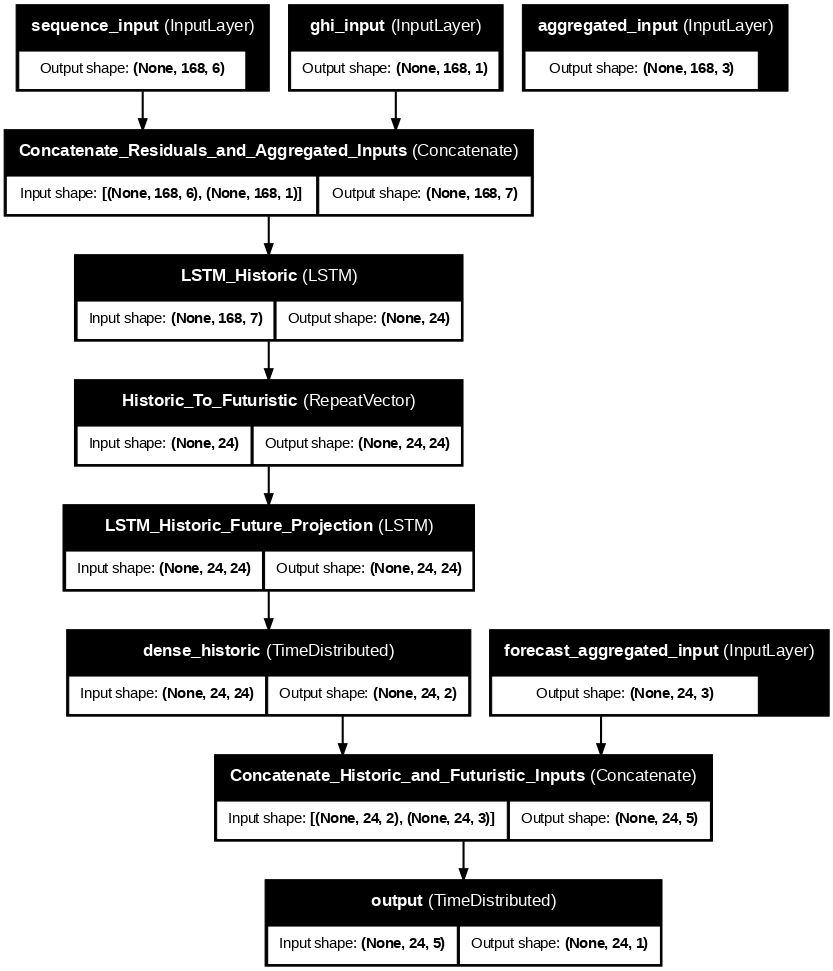

In [34]:
import tensorflow as tf

model_bpp_1 = create_global_ghi_forecast_24w_model_v1(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        dense_unit
                                                            )

model_bpp_1.summary()

tf.keras.utils.plot_model(
    model_bpp_1,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [199]:
history_bpp_1 = model_bpp_1.fit(
            train_loader,
            epochs=EPOCHS,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/35
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.8470 - rmse: 0.9171
Epoch 1: val_rmse improved from inf to 0.59067, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 85s 97ms/step - loss: 0.8469 - rmse: 0.9171 - val_loss: 0.3489 - val_rmse: 0.5907 - learning_rate: 0.0010
Epoch 2/35
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - loss: 0.4543 - rmse: 0.6713
Epoch 2: val_rmse improved from 0.59067 to 0.49786, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 66s 86ms/step - loss: 0.4543 - rmse: 0.6713 - val_loss: 0.2479 - val_rmse: 0.4979 - learning_rate: 0.0010
Epoch 3/35
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.3071 - rmse: 0.5519
Epoch 3: val_rmse improved from 0.49786 to 0.46761, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 78s 101ms/step - loss: 0.3071 - rmse: 0.5519 - val_loss: 0.2187 - val_rmse: 0.4676 - learning_rate: 0.0010
Epoch 4/35
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - 

## Model Evaluation

100%|██████████| 450/450 [00:02<00:00, 189.09it/s]


15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step


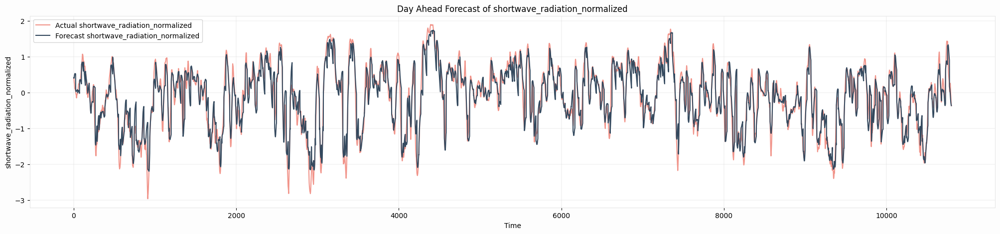

In [201]:
X_train,y_train,d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wt = model_bpp_1.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,1)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 82/82 [00:00<00:00, 410.26it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


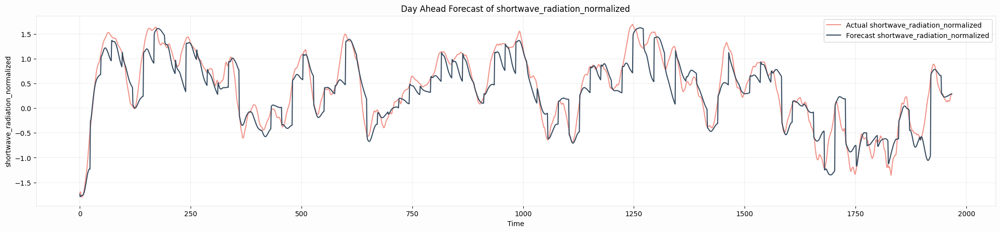

In [202]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24we = model_bpp_1.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24we = y_pred_24we.reshape(len(y_pred_24we)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24we.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

100%|██████████| 54/54 [00:00<00:00, 423.40it/s]


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


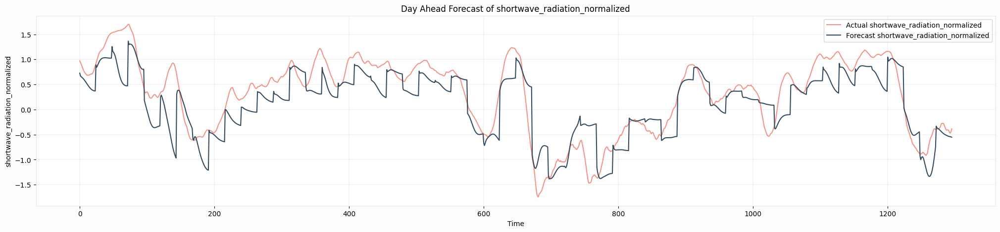

In [ ]:
X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wte = model_bpp_1.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wte = y_pred_24wte.reshape(len(y_pred_24wte)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wte)),y_pred_24wte, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

test_prediction_df = pd.DataFrame(np.array([d_test.reshape(1,-1).tolist()[0],y_pred_24wte.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

In [ ]:
ghi_forecasts = y_pred_24wt + y_pred_24we + y_pred_24wte

## Model Comparison

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMA.pkl, None>
File GHI_0_forecast_ARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_ARIMA.pkl.


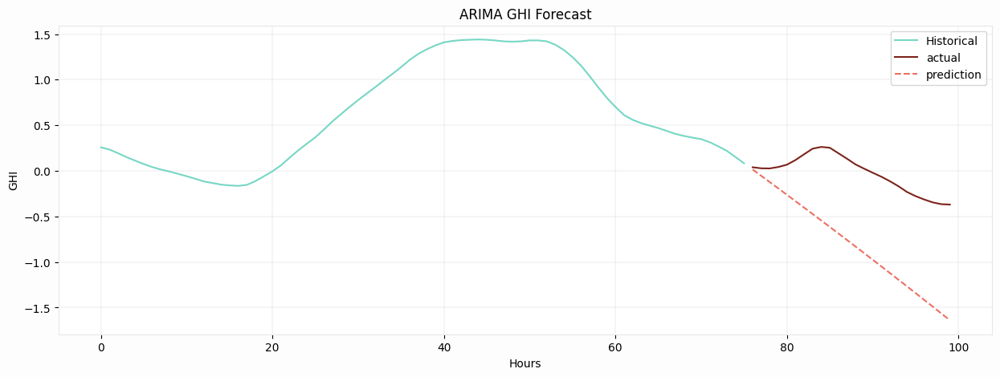

In [ ]:
# @title ARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
train_start_date_stats = "2023-06-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date_stats)]
  arima_model = sm.tsa.SARIMAX(np.array(temp['shortwave_radiation_normalized_smooth'].iloc[:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 0)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_arima = arima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_ARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_ARIMA.pkl'

  source_file_name = f'GHI_{ll}_forecast_ARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_arima.summary()
# Make predictions
predictions_arima = sarimax_fit_arima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])), temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24]),len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])+len(temp['shortwave_radiation_normalized_smooth'].iloc[-24:])), temp['shortwave_radiation_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24]),len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])+len(temp['shortwave_radiation_normalized_smooth'].iloc[-24:])), predictions_arima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','ARIMA GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl, None>
File GHI_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast_SARIMAA.pkl.


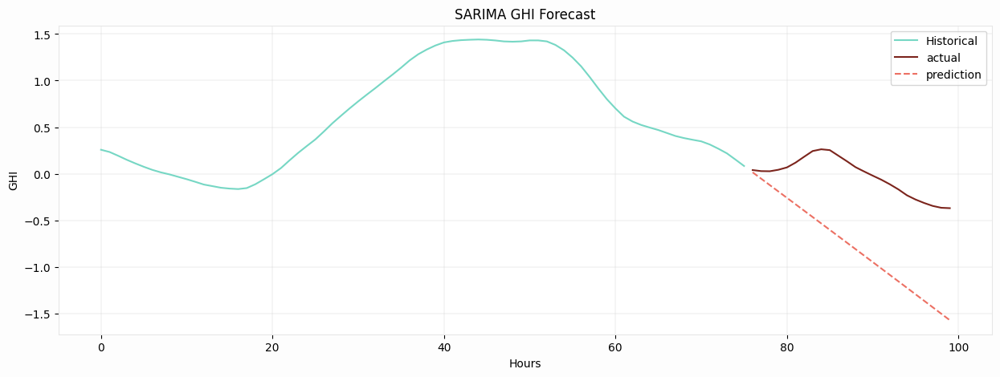

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
train_start_date_stats = "2023-01-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date_stats)]
  sarima_model = sm.tsa.SARIMAX(np.array(temp['shortwave_radiation_normalized_smooth'].iloc[:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 365*24)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'GHI_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])), temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24]),len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])+len(temp['shortwave_radiation_normalized_smooth'].iloc[-24:])), temp['shortwave_radiation_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24]),len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])+len(temp['shortwave_radiation_normalized_smooth'].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','SARIMA GHI Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast.pkl, None>
File GHI_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_0_forecast.pkl.


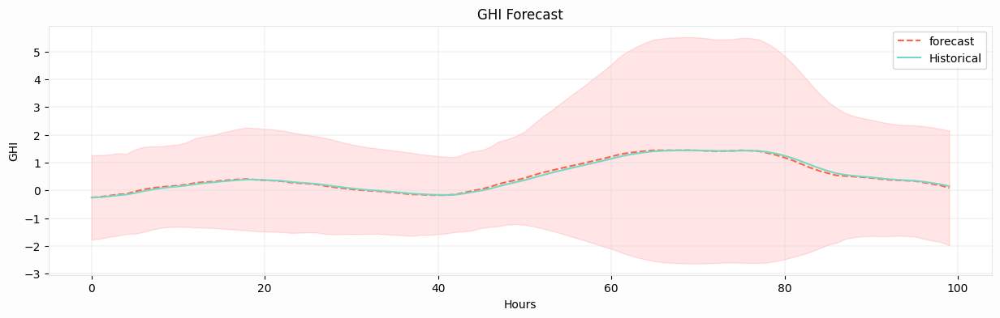

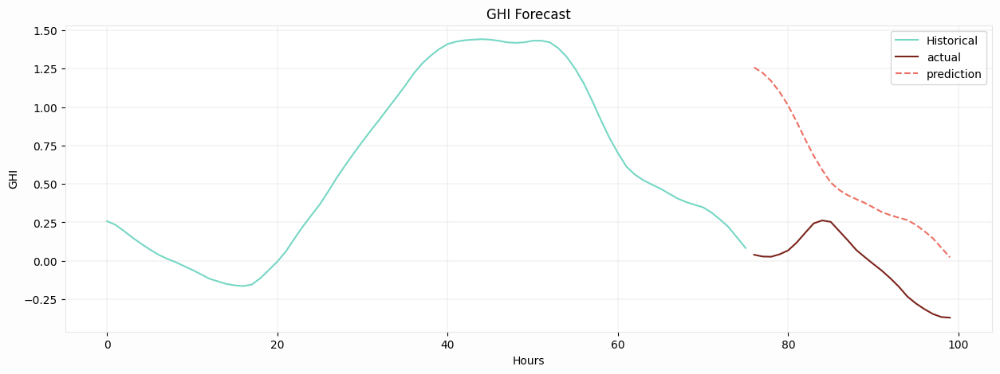

In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date)]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp['shortwave_radiation_normalized_smooth'].iloc[1:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 365*24),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['relative_humidity_2m_normalized_smooth','dew_point_2m_normalized_smooth','vapour_pressure_deficit_normalized_smooth']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'GHI_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/GHI/models/GHI_{ll}_forecast.pkl'

  source_file_name = f'GHI_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit.summary()
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:])), temp['shortwave_radiation_normalized_smooth'].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['relative_humidity_2m_normalized_smooth','dew_point_2m_normalized_smooth','vapour_pressure_deficit_normalized_smooth']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['relative_humidity_2m_normalized_smooth','dew_point_2m_normalized_smooth','vapour_pressure_deficit_normalized_smooth']].iloc[-48:-24,:])
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])), temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24]),len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])+len(temp['shortwave_radiation_normalized_smooth'].iloc[-24:])), temp['shortwave_radiation_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24]),len(temp['shortwave_radiation_normalized_smooth'].iloc[-100:-24])+len(temp['shortwave_radiation_normalized_smooth'].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','GHI','GHI Forecast')
plt.legend()
plt.show()

In [ ]:
# @title LSTM Model GHI Base


def create_lstm_ghi(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'ghi_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        # time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(inputs[1])
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'ghi_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "ghi_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ ghi_input (InputLayer)    │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 24)             │          2,496 │ ghi_input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 24)         │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 24)         │          4,704 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 168, 5)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 2)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 2)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             25 │ LSTM_Historic_Future_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 7,225 (28.22 KB)

 Trainable params: 7,225 (28.22 KB)

 Non-trainable params: 0 (0.00 B)

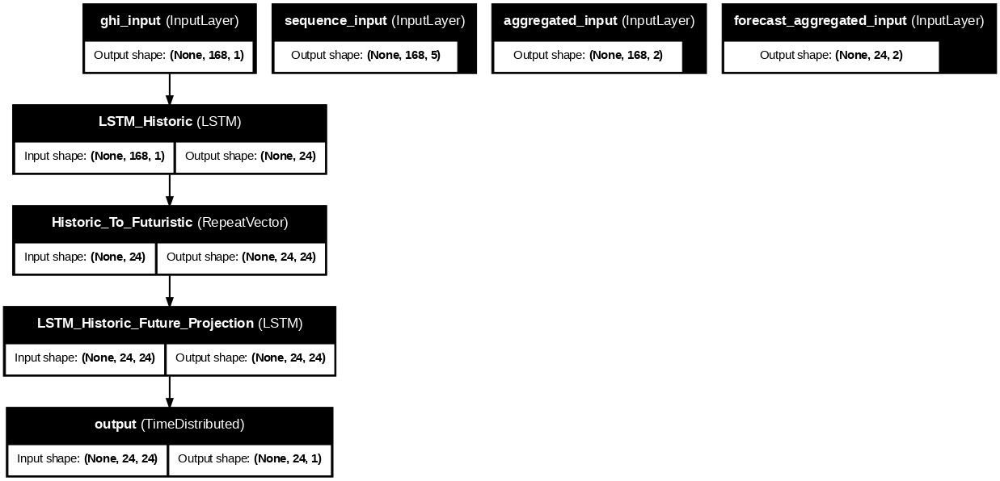

In [ ]:
import tensorflow as tf

model_bpp_lstm = create_lstm_ghi(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        dense_unit
                                                            )

model_bpp_lstm.summary()

tf.keras.utils.plot_model(
    model_bpp_lstm,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual_smooth,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0,4,5,6,7,8,9])]  , features_residual_smooth,features_primary, TARGET , SEQ , BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 54/54 [00:00<00:00, 420.55it/s]


(769, 140, 92)

In [ ]:
history_bpp_lstm = model_bpp_lstm.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.7327 - rmse: 0.8524
Epoch 1: val_rmse improved from inf to 0.75745, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 80s 98ms/step - loss: 0.7326 - rmse: 0.8524 - val_loss: 0.5737 - val_rmse: 0.7574 - learning_rate: 0.0010
Epoch 2/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.6668 - rmse: 0.8128
Epoch 2: val_rmse improved from 0.75745 to 0.73481, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 65s 84ms/step - loss: 0.6668 - rmse: 0.8128 - val_loss: 0.5399 - val_rmse: 0.7348 - learning_rate: 0.0010
Epoch 3/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.6487 - rmse: 0.8019
Epoch 3: val_rmse improved from 0.73481 to 0.73018, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 62s 81ms/step - loss: 0.6487 - rmse: 0.8019 - val_loss: 0.5332 - val_rmse: 0.7302 - learning_rate: 0.0010
Epoch 4/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - l

100%|██████████| 450/450 [00:01<00:00, 327.65it/s]


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step


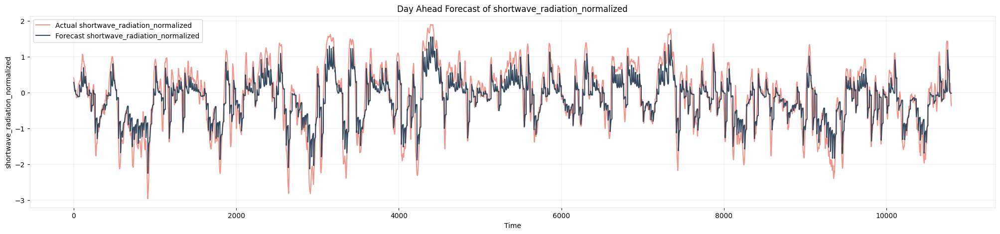

In [ ]:
X_train,y_train,d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtl = model_bpp_lstm.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,1)
y_pred_24wtl = y_pred_24wtl.reshape(len(y_pred_24wtl)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtl)),y_pred_24wtl, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 82/82 [00:00<00:00, 441.84it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


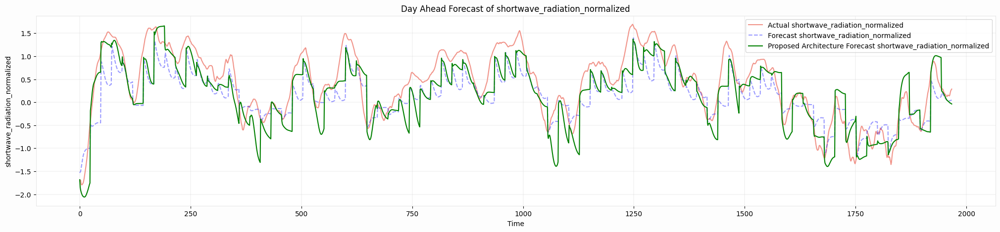

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wel = model_bpp_lstm.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24wel = y_pred_24wel.reshape(len(y_pred_24wel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wel)),y_pred_24wel, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24wel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

100%|██████████| 54/54 [00:00<00:00, 394.16it/s]


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


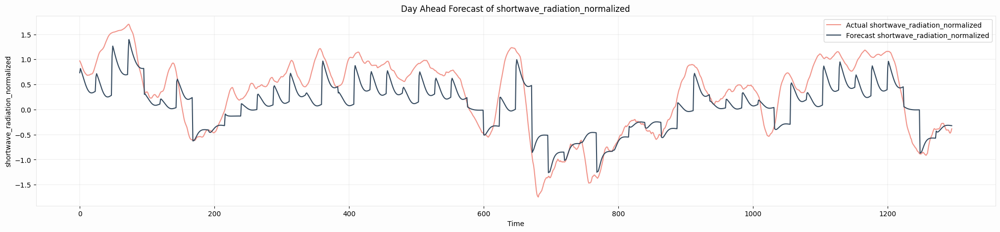

In [ ]:
X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtel = model_bpp_lstm.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wtel = y_pred_24wtel.reshape(len(y_pred_24wtel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtel)),y_pred_24wtel, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

test_prediction_df = pd.DataFrame(np.array([d_test.reshape(1,-1).tolist()[0],y_pred_24wtel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

In [ ]:
# @title GRU Model GHI Base


def create_gru_ghi(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'ghi_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = GRU(latent_dim, return_sequences=False, name="GRU_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = GRU(latent_dim, return_sequences=True, name="GRU_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'ghi_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "ghi_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 5)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ghi_input (InputLayer)    │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 2)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 8)         │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ ghi_input[0][0],       │
│                           │                        │                │ aggregated_input[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic (GRU)        │ (None, 24)             │          2,448 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 24)         │              0 │ GRU_Historic[0][0]     │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic_Future_Proj… │ (None, 24, 24)         │          3,600 │ Historic_To_Futuristi… │
│ (GRU)                     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 2)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             25 │ GRU_Historic_Future_P… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,073 (23.72 KB)

 Trainable params: 6,073 (23.72 KB)

 Non-trainable params: 0 (0.00 B)

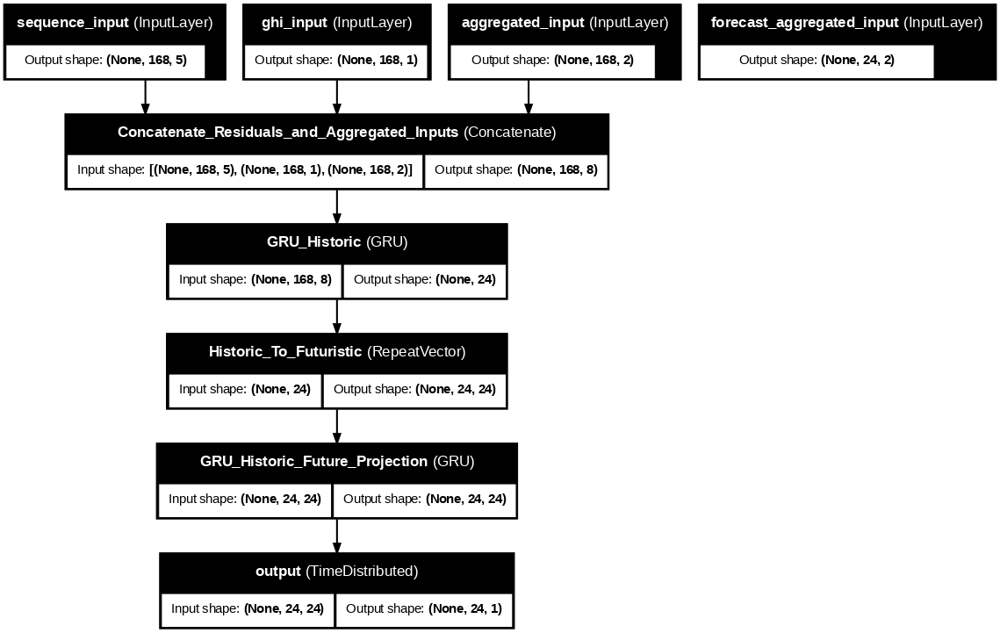

In [ ]:
import tensorflow as tf

model_bpp_gru = create_gru_ghi(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        dense_unit
                                                            )

model_bpp_gru.summary()

tf.keras.utils.plot_model(
    model_bpp_gru,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
history_bpp_gru = model_bpp_gru.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.6435 - rmse: 0.7992
Epoch 1: val_rmse improved from inf to 0.66071, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 70s 85ms/step - loss: 0.6434 - rmse: 0.7991 - val_loss: 0.4365 - val_rmse: 0.6607 - learning_rate: 0.0010
Epoch 2/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.4914 - rmse: 0.6978
Epoch 2: val_rmse improved from 0.66071 to 0.64650, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 64s 84ms/step - loss: 0.4914 - rmse: 0.6978 - val_loss: 0.4180 - val_rmse: 0.6465 - learning_rate: 0.0010
Epoch 3/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.4501 - rmse: 0.6681
Epoch 3: val_rmse improved from 0.64650 to 0.64068, saving model to outputs/best_temp_model.keras
769/769 ━━━━━━━━━━━━━━━━━━━━ 65s 84ms/step - loss: 0.4501 - rmse: 0.6681 - val_loss: 0.4105 - val_rmse: 0.6407 - learning_rate: 0.0010
Epoch 4/10
769/769 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - l

100%|██████████| 82/82 [00:00<00:00, 293.10it/s]


3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 476ms/step


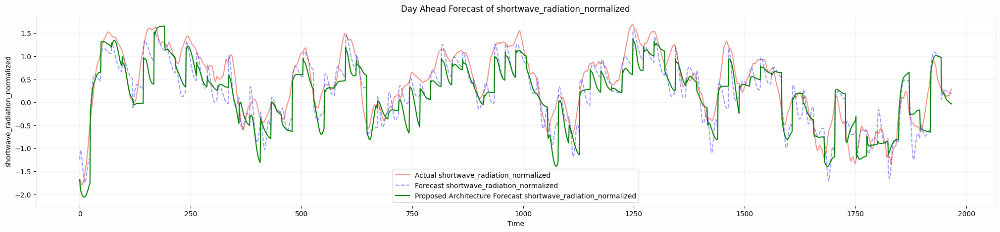

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24weg = model_bpp_gru.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24weg = y_pred_24weg.reshape(len(y_pred_24weg)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24weg)),y_pred_24weg, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24weg.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

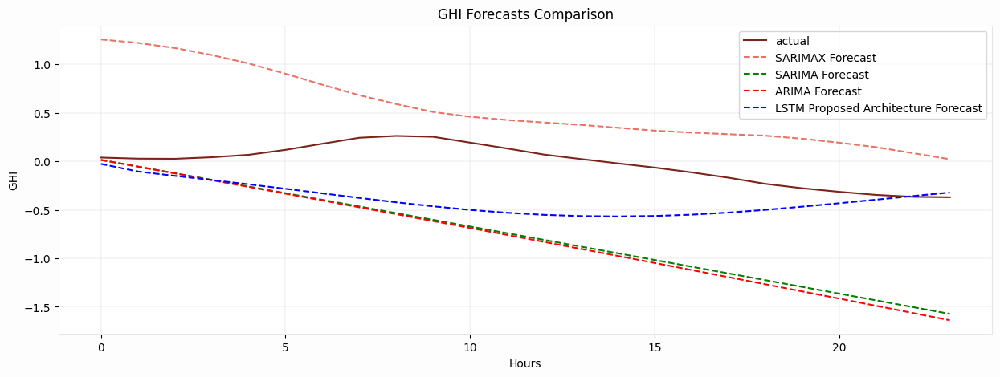

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(24), temp['shortwave_radiation_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(24), predictions, color = '#EC7063',  linestyle = '--', label = 'SARIMAX Forecast')
plt.plot(range(24), predictions_sarima, color = 'green', linestyle = '--', label = 'SARIMA Forecast')
plt.plot(range(24), predictions_arima, color = 'red', linestyle = '--', label = 'ARIMA Forecast')
plt.plot(range(24), y_pred_24wt[-24:], color = 'blue', linestyle = '--', label = 'LSTM Proposed Architecture Forecast')
plot_cosmos(ax,'Hours','GHI','GHI Forecasts Comparison')
plt.legend()
plt.show()

In [203]:
# @title Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24we)
print(f'MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24we)
print(f'MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24we) / y_eval)) * 100
print(f'MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE: {nrmse}')

MSE: 0.10076933510999944
RMSE: 0.3174418609918979
MAE: 0.2221464094117581
MAPE: 116.54056564148641%
NRMSE: 0.09096216004194414


In [ ]:
# @title Statistical Models Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['shortwave_radiation_normalized_smooth'].iloc[-24:], predictions)
print(f'SARIMAX MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMAX RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['shortwave_radiation_normalized_smooth'].iloc[-24:], predictions)
print(f'SARIMAX MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['shortwave_radiation_normalized_smooth'].iloc[-24:] - predictions) / temp['shortwave_radiation_normalized_smooth'].iloc[-24:])) * 100
print(f'SARIMAX MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['shortwave_radiation_normalized_smooth'].iloc[-24:]) - np.min(temp['shortwave_radiation_normalized_smooth'].iloc[-24:]))
print(f'SARIMAX NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['shortwave_radiation_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['shortwave_radiation_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['shortwave_radiation_normalized_smooth'].iloc[-24:] - predictions_sarima) / temp['shortwave_radiation_normalized_smooth'].iloc[-24:])) * 100
print(f'SARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['shortwave_radiation_normalized_smooth'].iloc[-24:]) - np.min(temp['shortwave_radiation_normalized_smooth'].iloc[-24:]))
print(f'NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['shortwave_radiation_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'ARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['shortwave_radiation_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['shortwave_radiation_normalized_smooth'].iloc[-24:] - predictions_arima) / temp['shortwave_radiation_normalized_smooth'].iloc[-24:])) * 100
print(f'ARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['shortwave_radiation_normalized_smooth'].iloc[-24:]) - np.min(temp['shortwave_radiation_normalized_smooth'].iloc[-24:]))
print(f'ARIMA NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24wel)
print(f'MSE LSTM Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE LSTM Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24wel)
print(f'MAE LSTM Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24wel) / y_eval)) * 100
print(f'MAPE LSTM Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE LSTM Base: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24weg)
print(f'MSE GRU Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE GRU Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24weg)
print(f'MAE GRU Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24weg) / y_eval)) * 100
print(f'MAPE GRU Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE GRU Base: {nrmse}')

SARIMAX MSE: 0.41552818001872255
SARIMAX RMSE: 0.6446147531810938
SARIMAX MAE: 0.5695044117154604
SARIMAX MAPE: 963.3084910592677%
SARIMAX NRMSE: 1.019529051318683
SARIMA MSE: 0.6847971163786702
SARIMA RMSE: 0.8275246923075288
SARIMA MAE: 0.7521820412707019
SARIMA MAPE: 799.8524219414925%
NRMSE: 1.3088212150398308
ARIMA MSE: 0.7340474749135198
ARIMA RMSE: 0.8567657059625576
ARIMA MAE: 0.7764501227763243
ARIMA MAPE: 821.7531552700245%
ARIMA NRMSE: 1.3550690906340355
MSE LSTM Base: 0.24676320706668392
RMSE LSTM Base: 0.4967526618616995
MAE LSTM Base: 0.3927116357511893
MAPE LSTM Base: 122.42427858389652%
NRMSE LSTM Base: 0.1423432151901319
MSE GRU Base: 0.16246557327785666
RMSE GRU Base: 0.40307018405962086
MAE GRU Base: 0.31352502417832745
MAPE GRU Base: 174.29365105044818%
NRMSE GRU Base: 0.11549873881158633


In [ ]:
forecast_df = pd.concat([prediction_df,eval_prediction_df,test_prediction_df])

In [ ]:
forecast_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14064 entries, 0 to 1295
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date_hour     14064 non-null  datetime64[ns]
 1   ghi_forecast  14064 non-null  object        
dtypes: datetime64[ns](1), object(1)
memory usage: 329.6+ KB


In [ ]:
weather_data['date_hour'] = pd.to_datetime(weather_data['date_hour'], utc=True)
forecast_df['date_hour'] = pd.to_datetime(forecast_df['date_hour'], utc=True)

In [ ]:
weather_data = weather_data.merge(forecast_df,how = 'left',on = 'date_hour')

In [ ]:
weather_data['date_hour'].min(),weather_data['date_hour'].max()

(Timestamp('2013-01-29 00:00:00+0000', tz='UTC'),
 Timestamp('2024-07-01 23:00:00+0000', tz='UTC'))

In [ ]:
weather_data['ghi_forecast'] = weather_data['ghi_forecast'].astype(float)

In [ ]:
weather_data.shape,prediction_df.shape

((100128, 154), (10800, 2))

In [ ]:
import pandas as pd
import pandas_gbq
from google.cloud import bigquery

# Set your BigQuery project ID and destination table
project_id = 'revx-259410'
destination_table = 'Avishek_Explore.ghi_forecast_data_UK_overall'

# Upload DataFrame to BigQuery
pandas_gbq.to_gbq(weather_data, destination_table, project_id=project_id, if_exists='replace')

100%|██████████| 1/1 [00:00<00:00, 6326.25it/s]


In [ ]:
QUERY = f'''SELECT DISTINCT date_hour,ghi_forecast,shortwave_radiation, shortwave_radiation_normalized FROM Avishek_Explore.ghi_forecast_data_UK_overall; '''
query_job = client.query(QUERY)  # API request
ghi_forecast = query_job.result().to_dataframe()
ghi_forecast.sort_values('date_hour', ascending = True, inplace = True)
ghi_forecast.drop_duplicates(inplace = True)

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# feature_ss_r = dict()

for col in ['shortwave_radiation']:
  if col in ['date_hour','hour']:
    pass
  else:
    t_ss_r = StandardScaler()
    # feature_ss_r[col] = t_ss_r
    t_ss_r.fit(np.array(ghi_forecast[f"{col}"]).reshape(-1,1))
    scaled_data = t_ss_r.transform(np.array(ghi_forecast[f"{col}"]).reshape(-1,1))
    ghi_forecast[f"{col}_normalized_v1"] = scaled_data

In [ ]:
nominal_ghi_forecast = t_ss_r.inverse_transform(np.array(ghi_forecast['ghi_forecast'].dropna()).reshape(-1,1))

In [ ]:
from sklearn.metrics import r2_score
print(f"RMSE > {np.power(np.mean(np.power(np.array(nominal_ghi_forecast - np.array(ghi_forecast['shortwave_radiation'][-1*len(nominal_ghi_forecast):]).reshape(-1,1)),2)),0.5)}")
print(f"R2 Score > {r2_score(np.array(nominal_ghi_forecast),np.array(ghi_forecast['shortwave_radiation'][-1*len(nominal_ghi_forecast):]).reshape(-1,1))}")

RMSE > 11.357655866546994
R2 Score > -1.5569135199467148


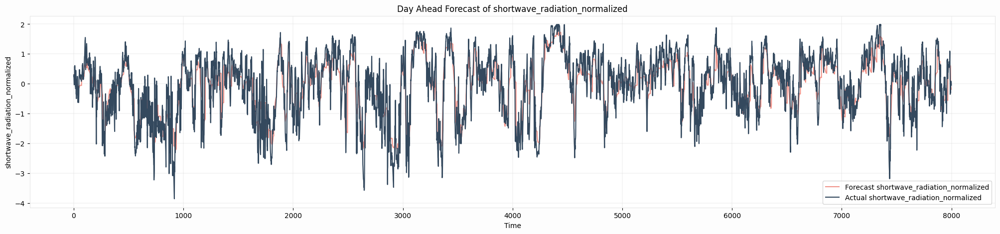

In [ ]:
fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(ghi_forecast['ghi_forecast'].dropna()))[:8000],ghi_forecast['ghi_forecast'].dropna()[:8000], label = f'Forecast {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(ghi_forecast['ghi_forecast'].dropna()))[:8000],ghi_forecast[~ghi_forecast['ghi_forecast'].isnull()]['shortwave_radiation_normalized'].dropna()[:8000], label = f'Actual {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

# Solar Supply

## Data Loading and Preprocessing

In [4]:
# @title Data Load Query

QUERY = f'''SELECT TIMESTAMP(a.utc_timestamp) AS utc_timestamp,
                    GB_GBN_load_actual_entsoe_transparency,
                    GB_GBN_load_forecast_entsoe_transparency,
                    GB_GBN_price_day_ahead,
                    GB_GBN_solar_capacity,
                    GB_GBN_solar_generation_actual,
                    GB_GBN_solar_profile,
                    GB_GBN_wind_capacity,
                    GB_GBN_wind_generation_actual,
                    GB_GBN_wind_profile,
                    GB_GBN_wind_offshore_capacity,
                    GB_GBN_wind_offshore_generation_actual,
                    GB_GBN_wind_offshore_profile,
                    GB_GBN_wind_onshore_capacity,
                    GB_GBN_wind_onshore_generation_actual,
                    GB_GBN_wind_onshore_profile,
  LAG(GB_GBN_solar_generation_actual,1) OVER(ORDER BY date_hour ASC) as solar_supply_lag_1,
            LAG(GB_GBN_solar_generation_actual,2) OVER(ORDER BY date_hour ASC) as solar_supply_lag_2,
            LAG(GB_GBN_solar_generation_actual,3) OVER(ORDER BY date_hour ASC) as solar_supply_lag_3,
            LAG(GB_GBN_solar_generation_actual,4) OVER(ORDER BY date_hour ASC) as solar_supply_lag_4,
            LAG(GB_GBN_solar_generation_actual,5) OVER(ORDER BY date_hour ASC) as solar_supply_lag_5,
            LAG(GB_GBN_solar_generation_actual,6) OVER(ORDER BY date_hour ASC) as solar_supply_lag_6,
            LAG(GB_GBN_solar_generation_actual,24) OVER(ORDER BY date_hour ASC) as solar_supply_lag_d1,
            LAG(GB_GBN_solar_generation_actual,48) OVER(ORDER BY date_hour ASC) as solar_supply_lag_d2,
            LAG(GB_GBN_solar_generation_actual,72) OVER(ORDER BY date_hour ASC) as solar_supply_lag_d3,
            LAG(GB_GBN_solar_generation_actual,96) OVER(ORDER BY date_hour ASC) as solar_supply_lag_d4,
            LAG(GB_GBN_solar_generation_actual,120) OVER(ORDER BY date_hour ASC) as solar_supply_lag_d5,
            LAG(GB_GBN_solar_generation_actual,144) OVER(ORDER BY date_hour ASC) as solar_supply_lag_d6,
            LAG(GB_GBN_solar_generation_actual,168) OVER(ORDER BY date_hour ASC) as solar_supply_lag_d7,
            LAG(GB_GBN_solar_generation_actual,336) OVER(ORDER BY date_hour ASC) as solar_supply_lag_w2,
            LAG(GB_GBN_solar_generation_actual,504) OVER(ORDER BY date_hour ASC) as solar_supply_lag_w3,
            LAG(GB_GBN_solar_generation_actual,672) OVER(ORDER BY date_hour ASC) as solar_supply_lag_w4,

              LAG(shortwave_radiation,1) OVER(ORDER BY date_hour ASC) as ghi_lag_1,
            LAG(shortwave_radiation,2) OVER(ORDER BY date_hour ASC) as ghi_lag_2,
            LAG(shortwave_radiation,3) OVER(ORDER BY date_hour ASC) as ghi_lag_3,
            LAG(shortwave_radiation,4) OVER(ORDER BY date_hour ASC) as ghi_lag_4,
            LAG(shortwave_radiation,5) OVER(ORDER BY date_hour ASC) as ghi_lag_5,
            LAG(shortwave_radiation,6) OVER(ORDER BY date_hour ASC) as ghi_lag_6,
            LAG(shortwave_radiation,24) OVER(ORDER BY date_hour ASC) as ghi_lag_d1,
            LAG(shortwave_radiation,48) OVER(ORDER BY date_hour ASC) as ghi_lag_d2,
            LAG(shortwave_radiation,72) OVER(ORDER BY date_hour ASC) as ghi_lag_d3,
            LAG(shortwave_radiation,96) OVER(ORDER BY date_hour ASC) as ghi_lag_d4,
            LAG(shortwave_radiation,120) OVER(ORDER BY date_hour ASC) as ghi_lag_d5,
            LAG(shortwave_radiation,144) OVER(ORDER BY date_hour ASC) as ghi_lag_d6,
            LAG(shortwave_radiation,168) OVER(ORDER BY date_hour ASC) as ghi_lag_d7,
            LAG(shortwave_radiation,336) OVER(ORDER BY date_hour ASC) as ghi_lag_w2,
            LAG(shortwave_radiation,504) OVER(ORDER BY date_hour ASC) as ghi_lag_w3,
            LAG(shortwave_radiation,672) OVER(ORDER BY date_hour ASC) as ghi_lag_w4,

              LAG(temperature_2m,1) OVER(ORDER BY date_hour ASC) as temp_lag_1,
            LAG(temperature_2m,2) OVER(ORDER BY date_hour ASC) as temp_lag_2,
            LAG(temperature_2m,3) OVER(ORDER BY date_hour ASC) as temp_lag_3,
            LAG(temperature_2m,4) OVER(ORDER BY date_hour ASC) as temp_lag_4,
            LAG(temperature_2m,5) OVER(ORDER BY date_hour ASC) as temp_lag_5,
            LAG(temperature_2m,6) OVER(ORDER BY date_hour ASC) as temp_lag_6,
            LAG(temperature_2m,24) OVER(ORDER BY date_hour ASC) as temp_lag_d1,
            LAG(temperature_2m,48) OVER(ORDER BY date_hour ASC) as temp_lag_d2,
            LAG(temperature_2m,72) OVER(ORDER BY date_hour ASC) as temp_lag_d3,
            LAG(temperature_2m,96) OVER(ORDER BY date_hour ASC) as temp_lag_d4,
            LAG(temperature_2m,120) OVER(ORDER BY date_hour ASC) as temp_lag_d5,
            LAG(temperature_2m,144) OVER(ORDER BY date_hour ASC) as temp_lag_d6,
            LAG(temperature_2m,168) OVER(ORDER BY date_hour ASC) as temp_lag_d7,
            LAG(temperature_2m,336) OVER(ORDER BY date_hour ASC) as temp_lag_w2,
            LAG(temperature_2m,504) OVER(ORDER BY date_hour ASC) as temp_lag_w3,
            LAG(temperature_2m,672) OVER(ORDER BY date_hour ASC) as temp_lag_w4,
                    b.*
FROM revx-259410.Avishek_Explore.load_supply_timeseries a
LEFT JOIN revx-259410.Avishek_Explore.weather_data_UK_overall b
ON TIMESTAMP(a.utc_timestamp) = b.date_hour; '''
query_job = client.query(QUERY)  # API request
lsw_data = query_job.result().to_dataframe()

In [5]:
lsw_data.head()

,utc_timestamp,GB_GBN_load_actual_entsoe_transparency,GB_GBN_load_forecast_entsoe_transparency,GB_GBN_price_day_ahead,GB_GBN_solar_capacity,GB_GBN_solar_generation_actual,GB_GBN_solar_profile,GB_GBN_wind_capacity,GB_GBN_wind_generation_actual,GB_GBN_wind_profile,...,shortwave_radiation_instant,direct_radiation_instant,diffuse_radiation_instant,direct_normal_irradiance_instant,global_tilted_irradiance_instant,terrestrial_radiation_instant,lat,lon,country,hour
0,2014-12-31 23:00:00+00:00,NaN,NaN,NaN,2664.0,NaN,NaN,11554.0,NaN,NaN,...,NaN,3.0,1024.300049,1024.300049,90.000000,43.0,55.3781,3.436,UK,23
1,2015-01-01 00:00:00+00:00,26758.0,32057.0,NaN,2669.0,NaN,NaN,11555.0,NaN,NaN,...,NaN,1.0,1023.900024,1023.900024,46.800003,26.0,55.3781,3.436,UK,0
2,2015-01-01 01:00:00+00:00,27166.0,31738.0,NaN,2669.0,NaN,NaN,11555.0,782.0,0.0676,...,NaN,1.0,1022.900024,1022.900024,39.900002,21.0,55.3781,3.436,UK,1
3,2015-01-01 02:00:00+00:00,24472.0,30690.0,NaN,2669.0,NaN,NaN,11555.0,785.0,0.0680,...,NaN,1.0,1023.700012,1023.700012,37.200001,11.0,55.3781,3.436,UK,2
4,2015-01-01 03:00:00+00:00,23003.0,28442.0,NaN,2669.0,NaN,NaN,11555.0,776.0,0.0672,...,NaN,0.0,1021.400024,1021.400024,8.099999,9.0,55.3781,3.436,UK,3


In [6]:
lsw_data.shape

(50401, 111)

In [7]:
lsw_data.fillna(method='ffill', inplace=True)
lsw_data.sort_values('utc_timestamp', ascending = True, inplace = True)

In [8]:
lsw_data['rolling_temp_average_d'] = (lsw_data['temperature_2m'] + lsw_data['temp_lag_d1'] + lsw_data['temp_lag_d2'] + lsw_data['temp_lag_d3'] + lsw_data['temp_lag_d4'] + lsw_data['temp_lag_d5'] + lsw_data['temp_lag_d6']  + lsw_data['temp_lag_d7'])/8
lsw_data['rolling_temp_average_dh'] = ( lsw_data['temp_lag_d1'] + lsw_data['temp_lag_d2'] + lsw_data['temp_lag_d3'] + lsw_data['temp_lag_d4'] + lsw_data['temp_lag_d5'] + lsw_data['temp_lag_d6']  + lsw_data['temp_lag_d7'])/7

lsw_data['residual_01'] = lsw_data['temperature_2m'] - lsw_data['temp_lag_1']
lsw_data['residual_12'] = lsw_data['temp_lag_1'] - lsw_data['temp_lag_2']
lsw_data['residual_23'] = lsw_data['temp_lag_2'] - lsw_data['temp_lag_3']
lsw_data['residual_34'] = lsw_data['temp_lag_3'] - lsw_data['temp_lag_4']
lsw_data['residual_45'] = lsw_data['temp_lag_4'] - lsw_data['temp_lag_5']
lsw_data['rolling_residual_average'] = (lsw_data['residual_01'] + lsw_data['residual_12'] + lsw_data['residual_23'] + lsw_data['residual_34'] + lsw_data['residual_45'])/5

lsw_data['residual_d01'] = lsw_data['temperature_2m'] - lsw_data['temp_lag_d1']
lsw_data['residual_d12'] = lsw_data['temp_lag_d1'] - lsw_data['temp_lag_d2']
lsw_data['residual_d23'] = lsw_data['temp_lag_d2'] - lsw_data['temp_lag_d3']
lsw_data['residual_d34'] = lsw_data['temp_lag_d3'] - lsw_data['temp_lag_d4']
lsw_data['residual_d45'] = lsw_data['temp_lag_d4'] - lsw_data['temp_lag_d5']
lsw_data['residual_d56'] = lsw_data['temp_lag_d5'] - lsw_data['temp_lag_d6']
lsw_data['residual_d67'] = lsw_data['temp_lag_d6'] - lsw_data['temp_lag_d7']
lsw_data['d_rolling_residual_average'] = (lsw_data['residual_d01'] + \
                                              lsw_data['residual_d12'] + \
                                              lsw_data['residual_d23'] + \
                                              lsw_data['residual_d34'] + \
                                              lsw_data['residual_d45'] + \
                                              lsw_data['residual_d56'] + \
                                              lsw_data['residual_d67'])/7

lsw_data['dh_rolling_residual_average'] = (lsw_data['residual_d12'] + \
                                              lsw_data['residual_d23'] + \
                                              lsw_data['residual_d34'] + \
                                              lsw_data['residual_d45'] + \
                                              lsw_data['residual_d56'] + \
                                              lsw_data['residual_d67'])/6

lsw_data['residual_w12'] = lsw_data['temp_lag_d7'] - lsw_data['temp_lag_w2']
lsw_data['residual_w23'] = lsw_data['temp_lag_w2'] - lsw_data['temp_lag_w3']
lsw_data['residual_w34'] = lsw_data['temp_lag_w3'] - lsw_data['temp_lag_w4']

In [9]:
lsw_data['rolling_ghi_average_d'] = (lsw_data['shortwave_radiation'] + lsw_data['ghi_lag_d1'] + lsw_data['ghi_lag_d2'] + lsw_data['ghi_lag_d3'] + lsw_data['ghi_lag_d4'] + lsw_data['ghi_lag_d5'] + lsw_data['ghi_lag_d6']  + lsw_data['ghi_lag_d7'])/8
lsw_data['rolling_ghi_average_dh'] = ( lsw_data['ghi_lag_d1'] + lsw_data['ghi_lag_d2'] + lsw_data['ghi_lag_d3'] + lsw_data['ghi_lag_d4'] + lsw_data['ghi_lag_d5'] + lsw_data['ghi_lag_d6']  + lsw_data['ghi_lag_d7'])/7

lsw_data['residual_ghi_01'] = lsw_data['shortwave_radiation'] - lsw_data['ghi_lag_1']
lsw_data['residual_ghi_12'] = lsw_data['ghi_lag_1'] - lsw_data['ghi_lag_2']
lsw_data['residual_ghi_23'] = lsw_data['ghi_lag_2'] - lsw_data['ghi_lag_3']
lsw_data['residual_ghi_34'] = lsw_data['ghi_lag_3'] - lsw_data['ghi_lag_4']
lsw_data['residual_ghi_45'] = lsw_data['ghi_lag_4'] - lsw_data['ghi_lag_5']
lsw_data['rolling_residual_ghi_average'] = (lsw_data['residual_ghi_01'] + lsw_data['residual_ghi_12'] + lsw_data['residual_ghi_23'] + lsw_data['residual_ghi_34'] + lsw_data['residual_ghi_45'])/5

lsw_data['residual_ghi_d01'] = lsw_data['shortwave_radiation'] - lsw_data['ghi_lag_d1']
lsw_data['residual_ghi_d12'] = lsw_data['ghi_lag_d1'] - lsw_data['ghi_lag_d2']
lsw_data['residual_ghi_d23'] = lsw_data['ghi_lag_d2'] - lsw_data['ghi_lag_d3']
lsw_data['residual_ghi_d34'] = lsw_data['ghi_lag_d3'] - lsw_data['ghi_lag_d4']
lsw_data['residual_ghi_d45'] = lsw_data['ghi_lag_d4'] - lsw_data['ghi_lag_d5']
lsw_data['residual_ghi_d56'] = lsw_data['ghi_lag_d5'] - lsw_data['ghi_lag_d6']
lsw_data['residual_ghi_d67'] = lsw_data['ghi_lag_d6'] - lsw_data['ghi_lag_d7']
lsw_data['d_rolling_residual_ghi_average'] = (lsw_data['residual_ghi_d01'] + \
                                              lsw_data['residual_ghi_d12'] + \
                                              lsw_data['residual_ghi_d23'] + \
                                              lsw_data['residual_ghi_d34'] + \
                                              lsw_data['residual_ghi_d45'] + \
                                              lsw_data['residual_ghi_d56'] + \
                                              lsw_data['residual_ghi_d67'])/7

lsw_data['dh_rolling_residual_ghi_average'] = (lsw_data['residual_ghi_d12'] + \
                                              lsw_data['residual_ghi_d23'] + \
                                              lsw_data['residual_ghi_d34'] + \
                                              lsw_data['residual_ghi_d45'] + \
                                              lsw_data['residual_ghi_d56'] + \
                                              lsw_data['residual_ghi_d67'])/6

lsw_data['residual_ghi_w12'] = lsw_data['ghi_lag_d7'] - lsw_data['ghi_lag_w2']
lsw_data['residual_ghi_w23'] = lsw_data['ghi_lag_w2'] - lsw_data['ghi_lag_w3']
lsw_data['residual_ghi_w34'] = lsw_data['ghi_lag_w3'] - lsw_data['ghi_lag_w4']

In [10]:
lsw_data['rolling_solar_supply_average_d'] = (lsw_data['GB_GBN_solar_generation_actual'] + lsw_data['solar_supply_lag_d1'] + lsw_data['solar_supply_lag_d2'] + lsw_data['solar_supply_lag_d3'] + lsw_data['solar_supply_lag_d4'] + lsw_data['solar_supply_lag_d5'] + lsw_data['solar_supply_lag_d6']  + lsw_data['solar_supply_lag_d7'])/8
lsw_data['rolling_solar_supply_average_dh'] = ( lsw_data['solar_supply_lag_d1'] + lsw_data['solar_supply_lag_d2'] + lsw_data['solar_supply_lag_d3'] + lsw_data['solar_supply_lag_d4'] + lsw_data['solar_supply_lag_d5'] + lsw_data['solar_supply_lag_d6']  + lsw_data['solar_supply_lag_d7'])/7

lsw_data['residual_ss_01'] = lsw_data['GB_GBN_solar_generation_actual'] - lsw_data['solar_supply_lag_1']
lsw_data['residual_ss_12'] = lsw_data['solar_supply_lag_1'] - lsw_data['solar_supply_lag_2']
lsw_data['residual_ss_23'] = lsw_data['solar_supply_lag_2'] - lsw_data['solar_supply_lag_3']
lsw_data['residual_ss_34'] = lsw_data['solar_supply_lag_3'] - lsw_data['solar_supply_lag_4']
lsw_data['residual_ss_45'] = lsw_data['solar_supply_lag_4'] - lsw_data['solar_supply_lag_5']
lsw_data['rolling_residual_ss_average'] = (lsw_data['residual_ss_01'] + lsw_data['residual_ss_12'] + lsw_data['residual_ss_23'] + lsw_data['residual_ss_34'] + lsw_data['residual_ss_45'])/5

lsw_data['residual_ss_d01'] = lsw_data['GB_GBN_solar_generation_actual'] - lsw_data['solar_supply_lag_d1']
lsw_data['residual_ss_d12'] = lsw_data['solar_supply_lag_d1'] - lsw_data['solar_supply_lag_d2']
lsw_data['residual_ss_d23'] = lsw_data['solar_supply_lag_d2'] - lsw_data['solar_supply_lag_d3']
lsw_data['residual_ss_d34'] = lsw_data['solar_supply_lag_d3'] - lsw_data['solar_supply_lag_d4']
lsw_data['residual_ss_d45'] = lsw_data['solar_supply_lag_d4'] - lsw_data['solar_supply_lag_d5']
lsw_data['residual_ss_d56'] = lsw_data['solar_supply_lag_d5'] - lsw_data['solar_supply_lag_d6']
lsw_data['residual_ss_d67'] = lsw_data['solar_supply_lag_d6'] - lsw_data['solar_supply_lag_d7']
lsw_data['d_rolling_residual_ss_average'] = (lsw_data['residual_ss_d01'] + \
                                              lsw_data['residual_ss_d12'] + \
                                              lsw_data['residual_ss_d23'] + \
                                              lsw_data['residual_ss_d34'] + \
                                              lsw_data['residual_ss_d45'] + \
                                              lsw_data['residual_ss_d56'] + \
                                              lsw_data['residual_ss_d67'])/7

lsw_data['dh_rolling_residual_ss_average'] = (lsw_data['residual_ss_d12'] + \
                                              lsw_data['residual_ss_d23'] + \
                                              lsw_data['residual_ss_d34'] + \
                                              lsw_data['residual_ss_d45'] + \
                                              lsw_data['residual_ss_d56'] + \
                                              lsw_data['residual_ss_d67'])/6

lsw_data['residual_ss_w12'] = lsw_data['solar_supply_lag_d7'] - lsw_data['solar_supply_lag_w2']
lsw_data['residual_ss_w23'] = lsw_data['solar_supply_lag_w2'] - lsw_data['solar_supply_lag_w3']
lsw_data['residual_ss_w34'] = lsw_data['solar_supply_lag_w3'] - lsw_data['solar_supply_lag_w4']

In [11]:
i = 0
for c in lsw_data.columns:
  print(f"'{c}'",end = ',')
  i += 1
  if i%5 == 0:
    print('')

'utc_timestamp','GB_GBN_load_actual_entsoe_transparency','GB_GBN_load_forecast_entsoe_transparency','GB_GBN_price_day_ahead','GB_GBN_solar_capacity',
'GB_GBN_solar_generation_actual','GB_GBN_solar_profile','GB_GBN_wind_capacity','GB_GBN_wind_generation_actual','GB_GBN_wind_profile',
'GB_GBN_wind_offshore_capacity','GB_GBN_wind_offshore_generation_actual','GB_GBN_wind_offshore_profile','GB_GBN_wind_onshore_capacity','GB_GBN_wind_onshore_generation_actual',
'GB_GBN_wind_onshore_profile','solar_supply_lag_1','solar_supply_lag_2','solar_supply_lag_3','solar_supply_lag_4',
'solar_supply_lag_5','solar_supply_lag_6','solar_supply_lag_d1','solar_supply_lag_d2','solar_supply_lag_d3',
'solar_supply_lag_d4','solar_supply_lag_d5','solar_supply_lag_d6','solar_supply_lag_d7','solar_supply_lag_w2',
'solar_supply_lag_w3','solar_supply_lag_w4','ghi_lag_1','ghi_lag_2','ghi_lag_3',
'ghi_lag_4','ghi_lag_5','ghi_lag_6','ghi_lag_d1','ghi_lag_d2',
'ghi_lag_d3','ghi_lag_d4','ghi_lag_d5','ghi_lag_d6','ghi_lag_

In [12]:
FEATURES_LSW = ['GB_GBN_load_actual_entsoe_transparency','GB_GBN_load_forecast_entsoe_transparency','GB_GBN_price_day_ahead','GB_GBN_solar_capacity',
                'GB_GBN_solar_generation_actual','GB_GBN_solar_profile','GB_GBN_wind_capacity','GB_GBN_wind_generation_actual','GB_GBN_wind_profile',
                'GB_GBN_wind_offshore_capacity','GB_GBN_wind_offshore_generation_actual','GB_GBN_wind_offshore_profile','GB_GBN_wind_onshore_capacity',
                'GB_GBN_wind_onshore_generation_actual',
                'GB_GBN_wind_onshore_profile','solar_supply_lag_1','solar_supply_lag_2','solar_supply_lag_3','solar_supply_lag_4',
                'solar_supply_lag_5','solar_supply_lag_6','solar_supply_lag_d1','solar_supply_lag_d2','solar_supply_lag_d3',
                'solar_supply_lag_d4','solar_supply_lag_d5','solar_supply_lag_d6','solar_supply_lag_d7','solar_supply_lag_w2',
                'solar_supply_lag_w3','solar_supply_lag_w4','ghi_lag_1','ghi_lag_2','ghi_lag_3',
                'ghi_lag_4','ghi_lag_5','ghi_lag_6','ghi_lag_d1','ghi_lag_d2',
                'ghi_lag_d3','ghi_lag_d4','ghi_lag_d5','ghi_lag_d6','ghi_lag_d7',
                'ghi_lag_w2','ghi_lag_w3','ghi_lag_w4','temp_lag_1','temp_lag_2',
                'temp_lag_3','temp_lag_4','temp_lag_5','temp_lag_6','temp_lag_d1',
                'temp_lag_d2','temp_lag_d3','temp_lag_d4','temp_lag_d5','temp_lag_d6',
                'temp_lag_d7','temp_lag_w2','temp_lag_w3','temp_lag_w4',
                'temperature_2m','relative_humidity_2m','dew_point_2m','apparent_temperature','precipitation',
                'rain','snowfall','snow_depth','weather_code','pressure_msl',
                'surface_pressure','cloud_cover','cloud_cover_low','cloud_cover_mid','cloud_cover_high',
                'et0_fao_evapotranspiration','vapour_pressure_deficit','wind_speed_10m','wind_speed_100m','wind_direction_10m',
                'wind_direction_100m','wind_gusts_10m','soil_temperature_0_to_7cm','soil_temperature_7_to_28cm','soil_temperature_28_to_100cm',
                'soil_temperature_100_to_255cm','soil_moisture_0_to_7cm','soil_moisture_7_to_28cm','soil_moisture_28_to_100cm','soil_moisture_100_to_255cm',
                'shortwave_radiation','direct_radiation','diffuse_radiation','direct_normal_irradiance','global_tilted_irradiance',
                'terrestrial_radiation','shortwave_radiation_instant','direct_radiation_instant','diffuse_radiation_instant','direct_normal_irradiance_instant',
                'global_tilted_irradiance_instant','terrestrial_radiation_instant',
                'rolling_temp_average_d','rolling_temp_average_dh','residual_01','residual_12',
                'residual_23','residual_34','residual_45','rolling_residual_average','residual_d01',
                'residual_d12','residual_d23','residual_d34','residual_d45','residual_d56',
                'residual_d67','d_rolling_residual_average','dh_rolling_residual_average','residual_w12','residual_w23',
                'residual_w34','rolling_ghi_average_d','rolling_ghi_average_dh','residual_ghi_01','residual_ghi_12',
                'residual_ghi_23','residual_ghi_34','residual_ghi_45','rolling_residual_ghi_average','residual_ghi_d01',
                'residual_ghi_d12','residual_ghi_d23','residual_ghi_d34','residual_ghi_d45','residual_ghi_d56',
                'residual_ghi_d67','d_rolling_residual_ghi_average','dh_rolling_residual_ghi_average','residual_ghi_w12','residual_ghi_w23',
                'residual_ghi_w34','rolling_solar_supply_average_d','rolling_solar_supply_average_dh','residual_ss_01','residual_ss_12',
                'residual_ss_23','residual_ss_34','residual_ss_45','rolling_residual_ss_average','residual_ss_d01',
                'residual_ss_d12','residual_ss_d23','residual_ss_d34','residual_ss_d45','residual_ss_d56',
                'residual_ss_d67','d_rolling_residual_ss_average','dh_rolling_residual_ss_average','residual_ss_w12','residual_ss_w23',
                'residual_ss_w34']

In [13]:
from sklearn.preprocessing import StandardScaler

feature_ss = dict()

for col in FEATURES_LSW:
  t_ss = StandardScaler()
  feature_ss[col] = t_ss
  t_ss.fit(np.array(lsw_data[col]).reshape(-1,1))
  scaled_data = t_ss.transform(np.array(lsw_data[col]).reshape(-1,1))
  lsw_data[f"{col}_normalized"] = scaled_data

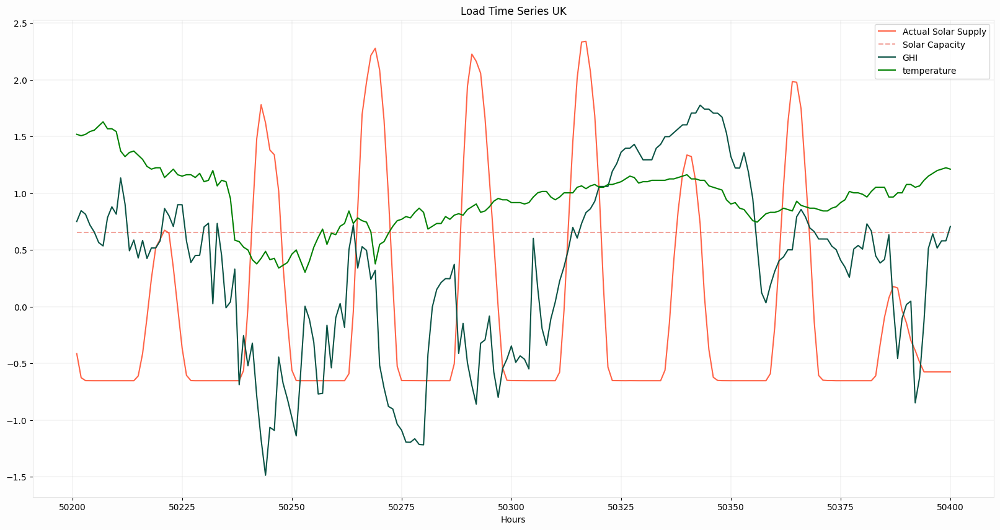

In [ ]:
# @title Exploratory Data Analysis

fig = plt.figure(figsize = (20,10))
ax = plt.axes()
plt.plot(range(len(lsw_data))[-200:],lsw_data['GB_GBN_solar_generation_actual_normalized'][-200:],label = 'Actual Solar Supply',color = 'tomato')
plt.plot(range(len(lsw_data))[-200:],lsw_data['GB_GBN_solar_capacity_normalized'][-200:], label = 'Solar Capacity',  linestyle = '--', color = '#E74C3C', alpha = 0.5)
plt.plot(range(len(lsw_data))[-200:],lsw_data['shortwave_radiation_normalized'][-200:], label = 'GHI', color = '#0B5345')
plt.plot(range(len(lsw_data))[-200:],lsw_data['temperature_2m_normalized'][-200:], label = 'temperature', color = 'green')
plt.legend()
plot_cosmos(ax,'Hours','','Load Time Series UK')
plt.show()

In [ ]:
lsw_data['forecast_ghi'] = ghi_forecasts

In [ ]:
import pandas as pd
import pandas_gbq
from google.cloud import bigquery

# Set your BigQuery project ID and destination table
project_id = 'revx-259410'
destination_table = 'Avishek_Explore.supply_weather_normalized_residual'

# Upload DataFrame to BigQuery
pandas_gbq.to_gbq(lsw_data, destination_table, project_id=project_id, if_exists='replace')

100%|██████████| 1/1 [00:00<00:00, 8097.11it/s]


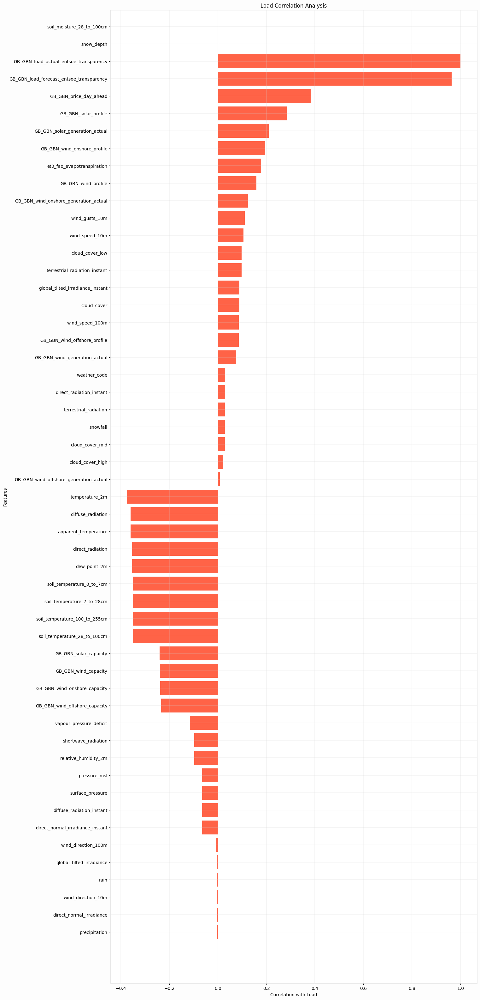

In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES_LSW:
  corr_list.append(pearsonr(lsw_data[col],lsw_data['GB_GBN_load_actual_entsoe_transparency'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Load'])
corr_df.sort_values('Correlation with Load',ascending = True,inplace = True)
corr_df['Correlation with Load'] = corr_df['Correlation with Load'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Load'], color = 'tomato')
plot_cosmos(ax,'Correlation with Load','Features','Load Correlation Analysis')

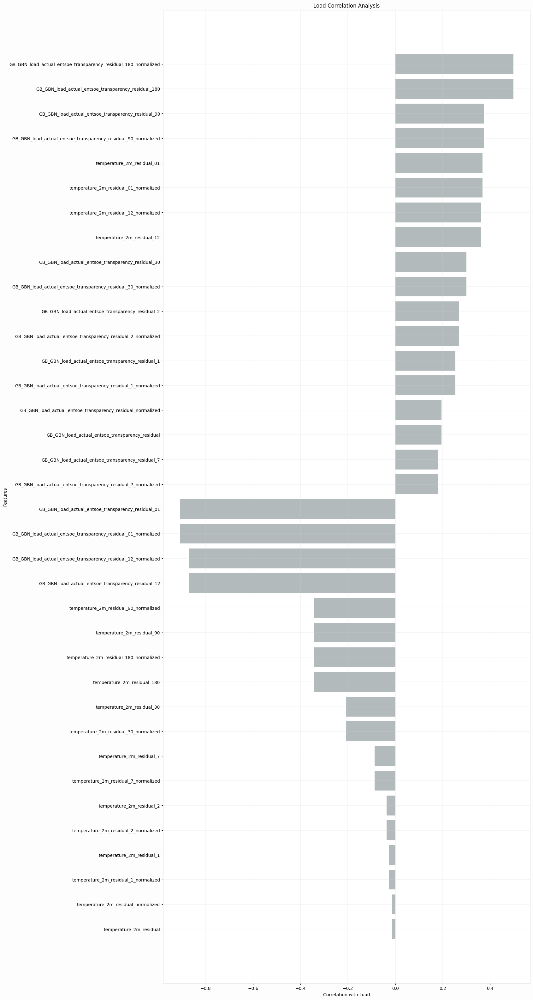

In [ ]:
# @title Residual Percentage Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in [c for c in lsw_data.columns if c.find('residual') > -1]:
  corr_list.append(pearsonr(lsw_data[col],lsw_data['GB_GBN_load_actual_entsoe_transparency'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Load'])
corr_df.sort_values('Correlation with Load',ascending = True,inplace = True)
corr_df['Correlation with Load'] = corr_df['Correlation with Load'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Load'], color = '#B2BABB')
plot_cosmos(ax,'Correlation with Load','Features','Load Correlation Analysis')

In [ ]:
QUERY = f'''SELECT * FROM revx-259410.Avishek_Explore.supply_weather_normalized_residual; '''
query_job = client.query(QUERY)  # API request
lsw_data = query_job.result().to_dataframe()

In [14]:
# Import label encoder
from sklearn import preprocessing

lsw_data['lat-lon'] = lsw_data['lat'].astype(str)+'-'+lsw_data['lon'].astype(str)

# label_encoder object knows
# how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'species'.
lsw_data['ll_label']= label_encoder.fit_transform(lsw_data['lat-lon'])

In [15]:
lsw_data.fillna(0, inplace = True)
lsw_data.replace([np.inf, -np.inf],0,inplace = True)
lsw_data_hour_mean = lsw_data.groupby(['ll_label','hour']).agg({'GB_GBN_solar_generation_actual_normalized' : 'mean'}).reset_index().rename(columns = {'GB_GBN_solar_generation_actual_normalized' : 'supply_mean'})
lsw_data_hour_std = lsw_data.groupby(['ll_label','hour']).agg({'GB_GBN_solar_generation_actual_normalized' : 'std'}).reset_index().rename(columns = {'GB_GBN_solar_generation_actual_normalized' : 'supply_std'})
lsw_data = pd.merge(lsw_data, lsw_data_hour_mean, on=['ll_label', 'hour'], how='left').fillna(0)
lsw_data = pd.merge(lsw_data, lsw_data_hour_std, on=['ll_label', 'hour'], how='left').fillna(0)

## Model Development

In [56]:
features_residual = [
                      'solar_supply_lag_1_normalized','solar_supply_lag_2_normalized','solar_supply_lag_3_normalized','solar_supply_lag_4_normalized',
                'solar_supply_lag_5_normalized','solar_supply_lag_6_normalized','solar_supply_lag_d1_normalized','solar_supply_lag_d2_normalized','solar_supply_lag_d3_normalized',
                'solar_supply_lag_d4_normalized','solar_supply_lag_d5_normalized','solar_supply_lag_d6_normalized','solar_supply_lag_d7']
features_category =['solar_supply_lag_d1_normalized','solar_supply_lag_d2_normalized',
                    'solar_supply_lag_d3_normalized',
                    'solar_supply_lag_d4_normalized',
                    'solar_supply_lag_d5_normalized',
                    'solar_supply_lag_d6_normalized',
                    'solar_supply_lag_d7_normalized',
                    'residual_ss_d12_normalized','residual_ss_d23_normalized',
                    'residual_ss_d34_normalized','residual_ss_d45_normalized','residual_ss_d56_normalized',
                      'residual_ss_d67_normalized',
                    'temperature_2m_normalized',
                    'shortwave_radiation_normalized',
                    'supply_mean','supply_std']

features_primary = [
                      'GB_GBN_solar_generation_actual_normalized'
                      ]

TARGET = [
                      'GB_GBN_solar_generation_actual_normalized'
                      ]

features_category_forecast = ['solar_supply_lag_d1_normalized','solar_supply_lag_d2_normalized',
                    'solar_supply_lag_d3_normalized',
                    'solar_supply_lag_d4_normalized',
                    'solar_supply_lag_d5_normalized',
                    'solar_supply_lag_d6_normalized',
                    'solar_supply_lag_d7_normalized',
                    'residual_ss_d12_normalized','residual_ss_d23_normalized',
                    'residual_ss_d34_normalized','residual_ss_d45_normalized','residual_ss_d56_normalized',
                      'residual_ss_d67_normalized',
                    'forecast_ghi',
                    'supply_mean','supply_std']

feature_keys = list(set(features_residual + features_category + features_primary + TARGET + features_category_forecast))


VOCABULARY_SIZE = 10
EMBEDDING_SIZE = 3
LATENT_DIM = 3
SEQ = 168
NUMERICAL_FEATURE_SIZE = len(features_residual)
PRIMARY_FEATURE_SIZE = len(features_primary)
NUM_VARS = len(features_category)
OUTPUT_DIM = len(TARGET)
LEARNING_RATE = 0.001
N_FUTURE = 24
TARGET_REPEAT = 1

BATCH_SIZE = 30
EPOCHS = 20
SAMPLE_SIZE = 180*3*24
STEPS = 1

TABLE_NAME = 'supply_weather_normalized_residual'
CAT_SPLIT = 'll_label'
GCP_BUCKET = 'affle-ds'

In [57]:
lsw_data[features_residual].shape

(50401, 13)

In [58]:
len(features_residual)

13

In [59]:
# @title LSTM Model Supply

def create_global_supply_forecast_24w_model_v1(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'supply_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(2, activation = 'tanh'), name = 'dense_historic')
        time_series_projection = dense_historic(time_series_projection)

        time_series_futuristic = BatchNormalization(name = 'Batch_Normalization_2')(inputs[3])
        time_series_futuristic = LSTM(latent_dim, return_sequences=True, name="LSTM_Futuristic")(time_series_futuristic)
        dense_futuristic = TimeDistributed(Dense(2, activation = 'tanh'), name = 'dense_futuristic')
        time_series_futuristic = dense_futuristic(time_series_futuristic)

        hf_concat= Concatenate(name = 'Concatenate_Historic_and_Futuristic_Inputs')([time_series_projection,inputs[3]])
        final_dense = TimeDistributed(Dense(1), name = 'output')
        output = final_dense(hf_concat)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'supply_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

In [68]:
def set_cloud_dirs(GCP_BUCKET, job_dir):
    relative_path = job_dir.split(GCP_BUCKET+"/")[1]
    output_path = relative_path+'/outputs/'
    log_path = relative_path+'/logs/profile/'
    return output_path, log_path
cloud_output_dir, cloud_log_dir = set_cloud_dirs(GCP_BUCKET, 'gs://affle-ds/avishek/body/Research/supply_forecast/experiment/supply_solar_global_all_campaign/local')

In [69]:
def get_callbacks(log_path, GCP_BUCKET):
    import tensorflow as tf

    def scheduler(epoch, lr):

        if epoch % 2 == 0:

            if lr >= 0.00001:

                return lr

            else:

                return 0.0001

        else:

            return lr

    cloud_log_dir = os.path.join("gs://", GCP_BUCKET, log_path)

    checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="outputs/best_model.keras", verbose=1, save_best_only=True, monitor="val_rmse", mode="min")

    earlyStopper  = tf.keras.callbacks.EarlyStopping(
                                    monitor="val_rmse",
                                    min_delta=0.001,
                                    patience=5,
                                    verbose=0,
                                    mode="min",
                                    restore_best_weights = True
                                )

    LRScheduler = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=0)

    plateau = tf.keras.callbacks.ReduceLROnPlateau(
                                                                                                    monitor="val_rmse",
                                                                                                    factor=0.5,
                                                                                                    patience=1,
                                                                                                    verbose=0,
                                                                                                    mode="min",
                                                                                                    min_delta=0.01,
                                                                                                    cooldown=0,
                                                                                                    min_lr=0.00001,
                                                                                                )
#     csv_logger = tf.keras.callbacks.CSVLogger("outputs/history.log")

    return [checkpointer,earlyStopper,LRScheduler,plateau]


## Hyperparameter Tuning

In [ ]:
features_residual_smooth = [
                      'solar_supply_lag_1_normalized','solar_supply_lag_2_normalized','solar_supply_lag_3_normalized','solar_supply_lag_4_normalized',
                'solar_supply_lag_5_normalized','solar_supply_lag_6_normalized','solar_supply_lag_d1_normalized','solar_supply_lag_d2_normalized','solar_supply_lag_d3_normalized',
                'solar_supply_lag_d4_normalized','solar_supply_lag_d5_normalized','solar_supply_lag_d6_normalized','solar_supply_lag_d7']
features_category_smooth =['solar_supply_lag_d1_normalized','solar_supply_lag_d2_normalized',
                    'solar_supply_lag_d3_normalized',
                    'solar_supply_lag_d4_normalized',
                    'solar_supply_lag_d5_normalized',
                    'solar_supply_lag_d6_normalized',
                    'solar_supply_lag_d7_normalized',
                    'residual_ss_d12_normalized','residual_ss_d23_normalized',
                    'residual_ss_d34_normalized','residual_ss_d45_normalized','residual_ss_d56_normalized',
                      'residual_ss_d67_normalized',
                    'temperature_2m_normalized',
                    'shortwave_radiation_normalized',
                    'supply_mean','supply_std']

features_primary_smooth = [
                      'GB_GBN_solar_generation_actual_normalized'
                      ]

TARGET_smooth = [
                      'GB_GBN_solar_generation_actual_normalized'
                      ]

feature_keys = list(set(features_residual_smooth + features_category_smooth + features_primary_smooth + TARGET_smooth))

ssup_hpt = gridrandomsearchcv(lsw_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

In [88]:
hp_df = pd.DataFrame(np.array(ssup_hpt).reshape(20,6), columns = ['sequence','batch','latent dim','dense unit','kfold','RMSE'])
hp_df[hp_df['RMSE'] == hp_df['RMSE'].min()]

,sequence,batch,latent dim,dense unit,kfold,RMSE
0,168.0,30.0,3.0,2.0,3.0,0.270388


In [60]:
# QUERY = f'''SELECT * FROM Avishek_Explore.{TABLE_NAME} ORDER BY ll_label,date_hour; '''
# query_job = client.query(QUERY)  # API request
# weather_data = query_job.result().to_dataframe()

In [61]:
# list(weather_data.columns)

## Model Training

In [62]:
lsw_data['date_hour'].min(),lsw_data['date_hour'].max()

(Timestamp('2014-12-31 23:00:00+0000', tz='UTC'),
 Timestamp('2020-09-30 23:00:00+0000', tz='UTC'))

In [63]:
train_start_date = '2018-01-01'
train_end_date = '2020-07-31'
eval_end_date = '2020-08-31'
lsw_data['ll_label'] = 0
lsw_data['hour'] = lsw_data['hour'].astype(int)
train_df, eval_df = lsw_data[(lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)][feature_keys+['ll_label','date_hour']], \
                                       lsw_data[(lsw_data['date_hour'] > train_end_date) & (lsw_data['date_hour'] <= eval_end_date)][feature_keys+['ll_label','date_hour']]

test_df = lsw_data[lsw_data['date_hour'] > eval_end_date][feature_keys+['ll_label','date_hour']]

In [64]:
# from statsmodels.tsa.holtwinters import ExponentialSmoothing

# # Fit the model
# model_exp_train = ExponentialSmoothing(train_df[TARGET[0]], trend='add')
# fit = model_exp_train.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[TARGET[0]] = fit.fittedvalues

# model_exp_train_norm = ExponentialSmoothing(train_df[features_primary[0]], trend='add')
# fit = model_exp_train_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[features_primary[0]] = fit.fittedvalues

# model_exp_eval = ExponentialSmoothing(eval_df[TARGET[0]], trend='add')
# fit = model_exp_eval.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[TARGET[0]] = fit.fittedvalues

# model_exp_eval_norm = ExponentialSmoothing(eval_df[features_primary[0]], trend='add')
# fit = model_exp_eval_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[features_primary[0]] = fit.fittedvalues

# model_exp_test = ExponentialSmoothing(test_df[TARGET[0]], trend='add')
# fit = model_exp_test.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[TARGET[0]] = fit.fittedvalues

# model_exp_test_norm = ExponentialSmoothing(test_df[features_primary[0]], trend='add')
# fit = model_exp_test_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[features_primary[0]] = fit.fittedvalues

In [65]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22609 entries, 26305 to 48913
Data columns (total 27 columns):
 #   Column                                     Non-Null Count  Dtype              
---  ------                                     --------------  -----              
 0   solar_supply_lag_6_normalized              22609 non-null  float64            
 1   residual_ss_d23_normalized                 22609 non-null  float64            
 2   shortwave_radiation_normalized             22609 non-null  float64            
 3   solar_supply_lag_4_normalized              22609 non-null  float64            
 4   solar_supply_lag_2_normalized              22609 non-null  float64            
 5   solar_supply_lag_1_normalized              22609 non-null  float64            
 6   residual_ss_d12_normalized                 22609 non-null  float64            
 7   solar_supply_lag_d7_normalized             22609 non-null  float64            
 8   solar_supply_lag_d5_normalized             2260

In [66]:
# ,4,5,6,7,8,9

eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS,target_repeater = TARGET_REPEAT)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

X_test,y_test,_ = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

# y_test = y_test.reshape(len(y_test)*N_FUTURE,1)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 23/23 [00:00<00:00, 382.55it/s]


(432, 18, 18)

In [67]:
X_test[0].shape

(23, 168, 13)

In [70]:
try:
  del history_lf
  del model_load_forecast
except Exception as e:
  print("Model does not exist")

Model does not exist


In [ ]:
solar_supply_hpt = gridrandomsearchcv(weather_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

Model: "supply_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 13)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ supply_input (InputLayer) │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 14)        │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ supply_input[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 3)              │            216 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 3)          │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 3)          │             84 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_historic            │ (None, 24, 2)          │              8 │ LSTM_Historic_Future_… │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 23)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Historic_and… │ (None, 24, 25)         │              0 │ dense_historic[0][0],  │
│ (Concatenate)             │                        │                │ forecast_aggregated_i… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 23)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             26 │ Concatenate_Historic_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 334 (1.30 KB)

 Trainable params: 334 (1.30 KB)

 Non-trainable params: 0 (0.00 B)

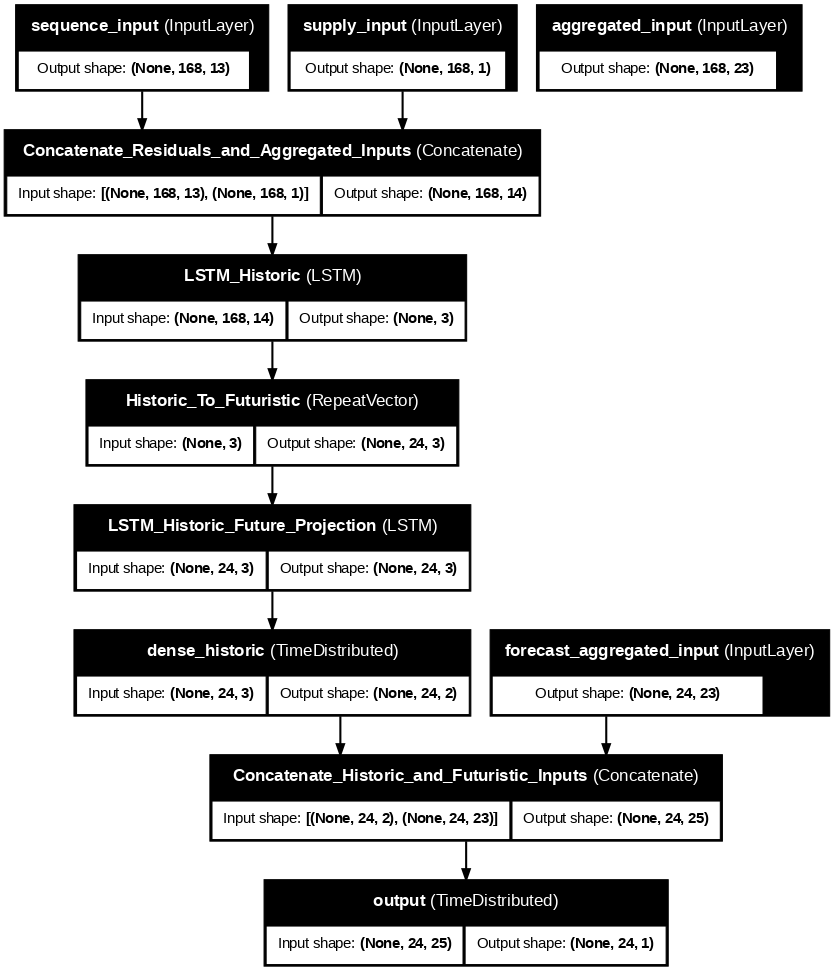

In [71]:
import tensorflow as tf

model_supply_forecast = create_global_supply_forecast_24w_model_v1(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE
                                                            )

model_supply_forecast.summary()

tf.keras.utils.plot_model(
    model_supply_forecast,
    to_file='model.png',
    show_layer_names=True,
    show_shapes=True,
    dpi=75)

In [72]:
history_sf = model_supply_forecast.fit(
            train_loader,
            epochs=EPOCHS,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.7843 - rmse: 0.8758
Epoch 1: val_rmse improved from inf to 0.39098, saving model to outputs/best_model.keras
432/432 ━━━━━━━━━━━━━━━━━━━━ 63s 133ms/step - loss: 0.7837 - rmse: 0.8754 - val_loss: 0.1529 - val_rmse: 0.3910 - learning_rate: 0.0010
Epoch 2/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.1505 - rmse: 0.3865
Epoch 2: val_rmse improved from 0.39098 to 0.31929, saving model to outputs/best_model.keras
432/432 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.1504 - rmse: 0.3865 - val_loss: 0.1019 - val_rmse: 0.3193 - learning_rate: 0.0010
Epoch 3/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0944 - rmse: 0.3066
Epoch 3: val_rmse improved from 0.31929 to 0.29273, saving model to outputs/best_model.keras
432/432 ━━━━━━━━━━━━━━━━━━━━ 56s 130ms/step - loss: 0.0944 - rmse: 0.3066 - val_loss: 0.0857 - val_rmse: 0.2927 - learning_rate: 0.0010
Epoch 4/20
432/432 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 0.0

## Model Evaluation

100%|██████████| 23/23 [00:00<00:00, 468.47it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step


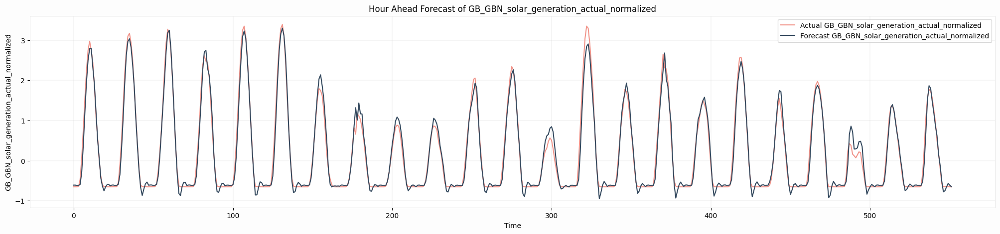

In [73]:
X_eval,y_eval,_ = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] ,
                                                            features_residual,
                                                            features_primary,
                                                            TARGET ,
                                                            SEQ ,
                                                            BATCH_SIZE,
                                                            features_category_forecast,
                                                            N_FUTURE,
                                                            EPOCHS,
                                                            CAT_SPLIT)
y_pred_24wt = model_supply_forecast.predict(X_eval)
y_eval_actual = y_eval[:,:,0].reshape(len(y_eval)*N_FUTURE,OUTPUT_DIM)
# y_eval_forecast = y_eval[:,:,1].reshape(len(y_eval)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_eval_actual)),y_eval_actual, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')
# ax.plot(range(len(y_eval_forecast))[-120:],y_eval_forecast[-120:], label = f'Forecast Previous {TARGET[0]}', color = '#CB4335',linestyle = '--')

plot_cosmos(ax,'Time',TARGET[0],f'Hour Ahead Forecast of {TARGET[0]}')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



100%|██████████| 23/23 [00:00<00:00, 480.76it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


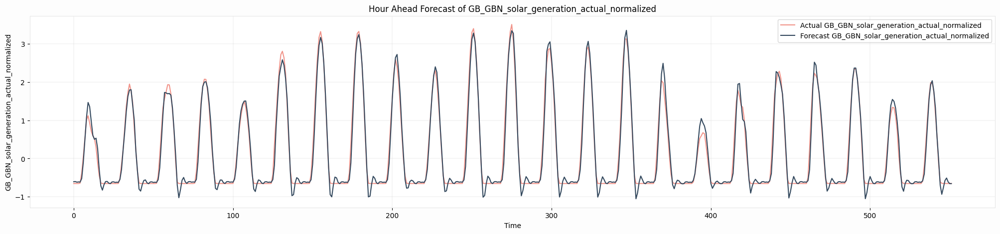

In [74]:
X_test,y_test,_ = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] ,
                                                            features_residual,
                                                            features_primary,
                                                            TARGET ,
                                                            SEQ ,
                                                            BATCH_SIZE,
                                                            features_category_forecast,
                                                            N_FUTURE,
                                                            EPOCHS,
                                                            CAT_SPLIT)
y_pred_24wt = model_supply_forecast.predict(X_test)
y_test_actual = y_test[:,:,0].reshape(len(y_test)*N_FUTURE,OUTPUT_DIM)
# y_test_forecast = y_test[:,:,1].reshape(len(y_test)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_test_actual)),y_test_actual, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')
# ax.plot(range(len(y_test_forecast)),y_test_forecast, label = f'Forecast Previous {TARGET[0]}', color = '#CB4335',linestyle = '--')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



## Model Comparison

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast_ARIMA.pkl, None>
File Solar Power_0_forecast_ARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast_ARIMA.pkl.


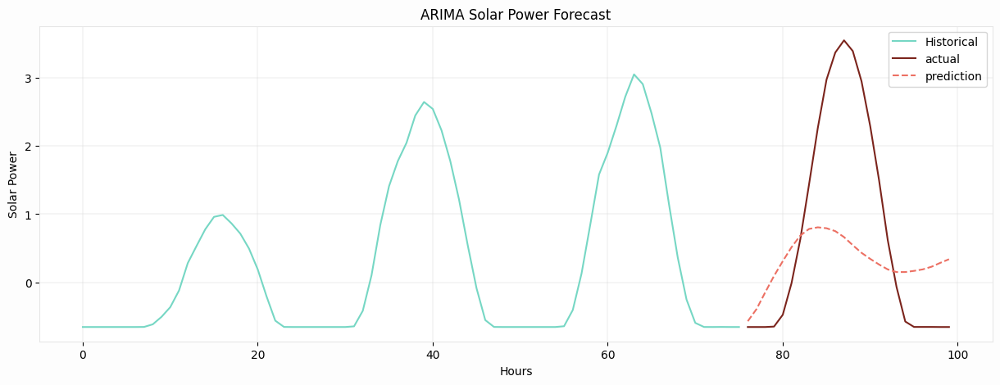

In [ ]:
# @title ARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
# train_start_date_stats = "2023-06-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)]
  arima_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_solar_generation_actual_normalized'].iloc[:-24]),
                                order=(7, 1, 7),
                                seasonal_order=(0, 0, 0, 0)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_arima = arima_model.fit(disp=True)

  with open(f'Solar Power_{ll}_forecast_ARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_{ll}_forecast_ARIMA.pkl'

  source_file_name = f'Solar Power_{ll}_forecast_ARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_arima.summary()
# Make predictions
predictions_arima = sarimax_fit_arima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])), temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:])), temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:])), predictions_arima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Solar Power','ARIMA Solar Power Forecast')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast_SARIMAA.pkl, None>
File Solar Power_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast_SARIMAA.pkl.


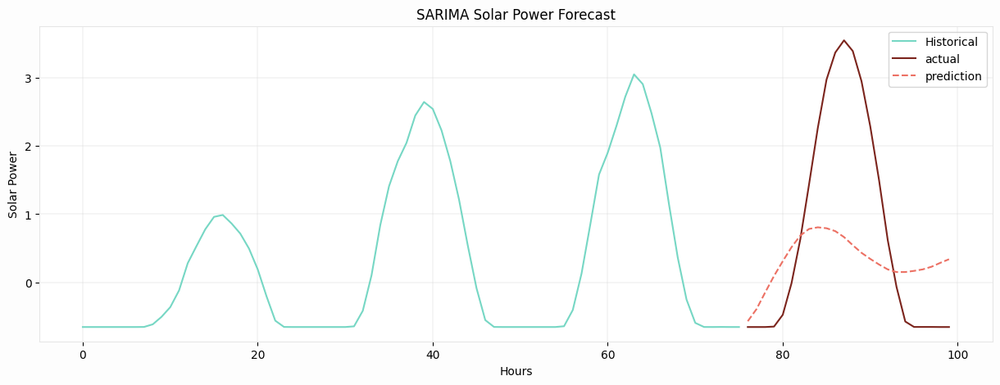

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
# train_start_date_stats = "2023-01-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)]
  sarima_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_solar_generation_actual_normalized'].iloc[:-24]),
                                order=(7, 1, 7),
                                seasonal_order=(0, 0, 0, 365*24)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'Solar Power_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'Solar Power_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])), temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:])), temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Solar Power','SARIMA Solar Power Forecast')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast.pkl, None>
File Solar Power_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast.pkl.


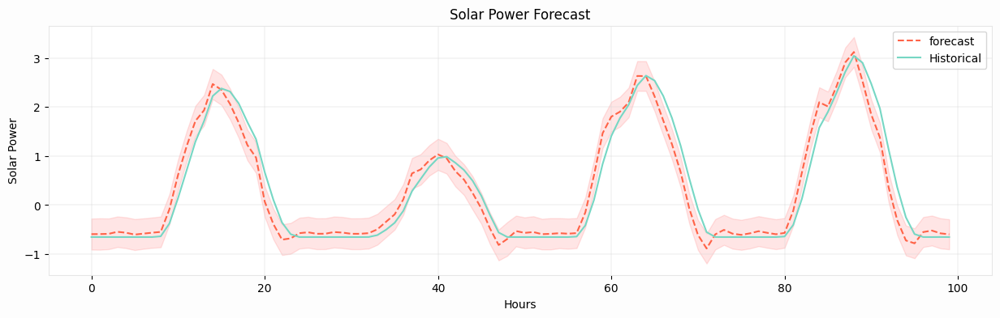

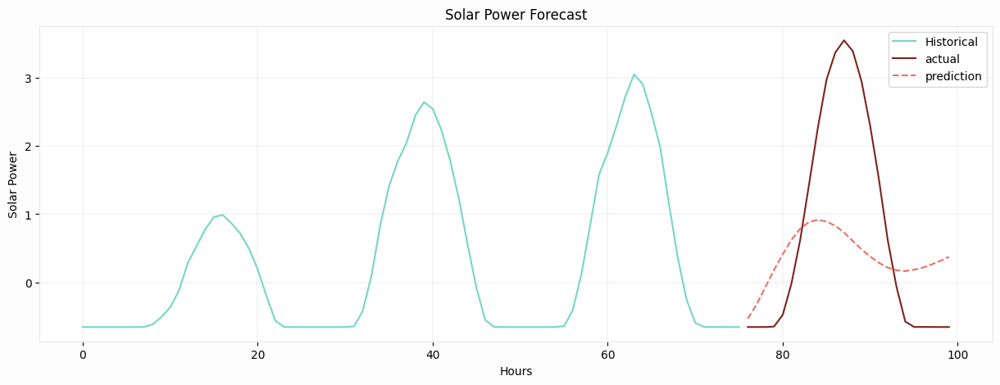

In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_solar_generation_actual_normalized'].iloc[1:-24]),
                                order=(7, 1, 7),
                                seasonal_order=(0, 0, 0, 365*24),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['temperature_2m_normalized','shortwave_radiation_normalized']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'Solar Power_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_{ll}_forecast.pkl'

  source_file_name = f'Solar Power_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit.summary()
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:])), temp['GB_GBN_solar_generation_actual_normalized'].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','Solar Power','Solar Power Forecast')
plt.legend()
plt.show()
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['temperature_2m_normalized','shortwave_radiation_normalized']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['temperature_2m_normalized','shortwave_radiation_normalized']].iloc[-48:-24,:])
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])), temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:])), temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_solar_generation_actual_normalized'].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Solar Power','Solar Power Forecast')
plt.legend()
plt.show()

In [ ]:
# @title LSTM Model GHI Base


def create_lstm_wsp(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'wsp_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        # time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(inputs[1])
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'wsp_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "wsp_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ wsp_input (InputLayer)    │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 3)              │             60 │ wsp_input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 3)          │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 3)          │             84 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 168, 7)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 10)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 10)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              4 │ LSTM_Historic_Future_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 148 (592.00 B)

 Trainable params: 148 (592.00 B)

 Non-trainable params: 0 (0.00 B)

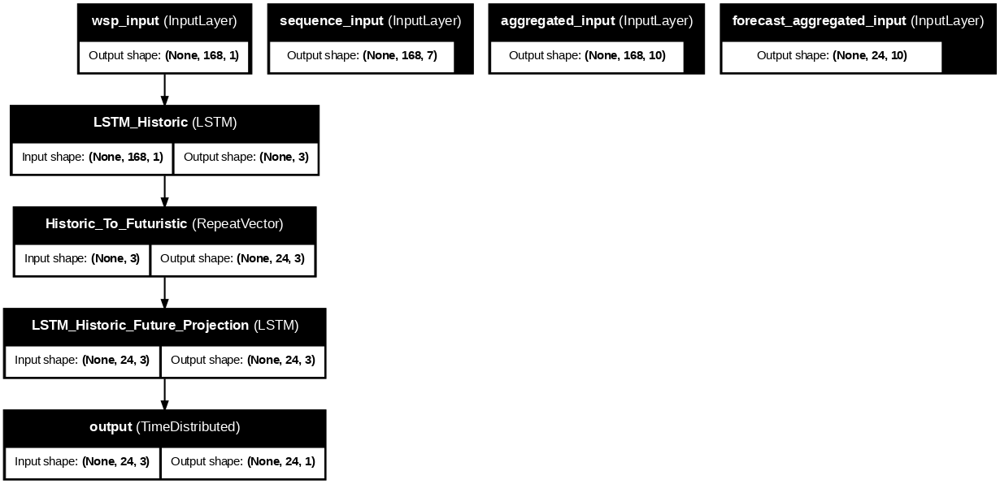

In [ ]:
import tensorflow as tf

model_bpp_lstm = create_lstm_wsp(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_lstm.summary()

tf.keras.utils.plot_model(
    model_bpp_lstm,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0,4,5,6,7,8,9])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 23/23 [00:00<00:00, 377.03it/s]


(1851, 78, 78)

In [ ]:
history_bpp_lstm = model_bpp_lstm.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.9083 - rmse: 0.9476
Epoch 1: val_rmse improved from inf to 0.67286, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 174s 90ms/step - loss: 0.9082 - rmse: 0.9476 - val_loss: 0.4527 - val_rmse: 0.6729 - learning_rate: 0.0010
Epoch 2/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.4367 - rmse: 0.6591
Epoch 2: val_rmse improved from 0.67286 to 0.59295, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 165s 89ms/step - loss: 0.4367 - rmse: 0.6591 - val_loss: 0.3516 - val_rmse: 0.5929 - learning_rate: 0.0010
Epoch 3/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3343 - rmse: 0.5763
Epoch 3: val_rmse improved from 0.59295 to 0.56267, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 129s 69ms/step - loss: 0.3343 - rmse: 0.5763 - val_loss: 0.3166 - val_rmse: 0.5627 - learning_rate: 0.0010
Epoch 4/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step -

100%|██████████| 935/935 [00:03<00:00, 244.27it/s]


30/30 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


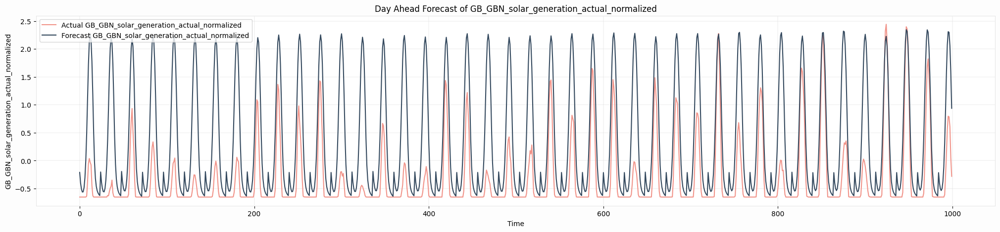

In [ ]:
X_train,y_train,d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtl = model_bpp_lstm.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,1)
y_pred_24wtl = y_pred_24wtl.reshape(len(y_pred_24wtl)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_train))[0:1000],y_train[0:1000], label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtl))[0:1000],y_pred_24wtl[0:1000], label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 23/23 [00:00<00:00, 296.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


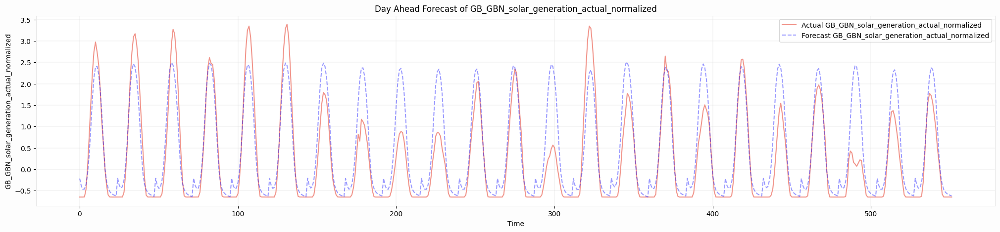

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wel = model_bpp_lstm.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24wel = y_pred_24wel.reshape(len(y_pred_24wel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wel)),y_pred_24wel, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24wel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

100%|██████████| 23/23 [00:00<00:00, 278.76it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


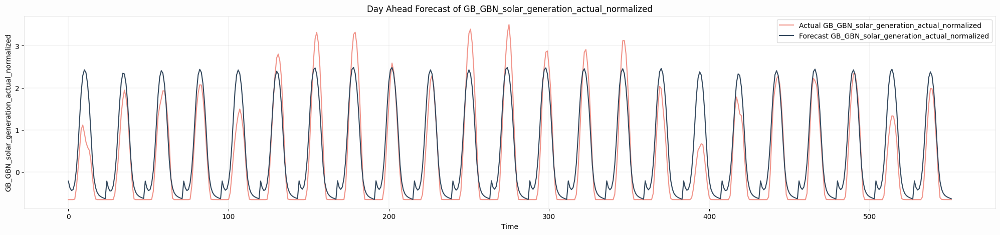

In [ ]:
X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtel = model_bpp_lstm.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wtel = y_pred_24wtel.reshape(len(y_pred_24wtel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtel)),y_pred_24wtel, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

test_prediction_df = pd.DataFrame(np.array([d_test.reshape(1,-1).tolist()[0],y_pred_24wtel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

In [ ]:
# @title GRU Model ws Base


def create_gru_ws(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'ws_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = GRU(latent_dim, return_sequences=False, name="GRU_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = GRU(latent_dim, return_sequences=True, name="GRU_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'ws_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "ws_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 7)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ws_input (InputLayer)     │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 10)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 18)        │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ ws_input[0][0],        │
│                           │                        │                │ aggregated_input[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic (GRU)        │ (None, 3)              │            207 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 3)          │              0 │ GRU_Historic[0][0]     │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic_Future_Proj… │ (None, 24, 3)          │             72 │ Historic_To_Futuristi… │
│ (GRU)                     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 10)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              4 │ GRU_Historic_Future_P… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 283 (1.11 KB)

 Trainable params: 283 (1.11 KB)

 Non-trainable params: 0 (0.00 B)

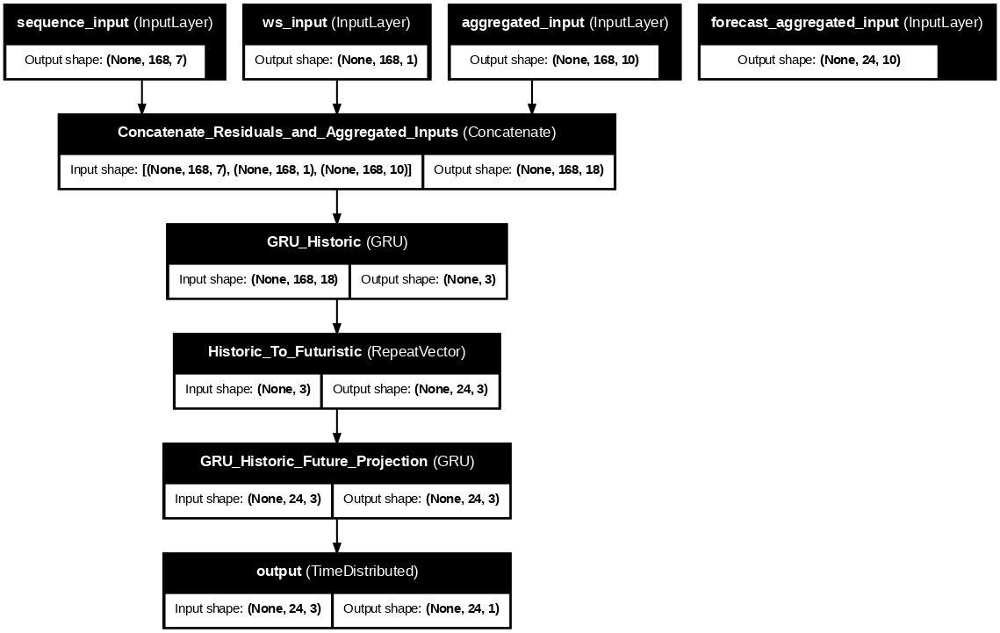

In [ ]:
import tensorflow as tf

model_bpp_gru = create_gru_ws(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_gru.summary()

tf.keras.utils.plot_model(
    model_bpp_gru,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
history_bpp_gru = model_bpp_gru.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1240/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.3216 - rmse: 0.5627
Epoch 1: val_rmse improved from inf to 0.66237, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 54s 39ms/step - loss: 0.3215 - rmse: 0.5626 - val_loss: 0.4387 - val_rmse: 0.6624 - learning_rate: 0.0010
Epoch 2/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2458 - rmse: 0.4940
Epoch 2: val_rmse improved from 0.66237 to 0.61839, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.2457 - rmse: 0.4940 - val_loss: 0.3824 - val_rmse: 0.6184 - learning_rate: 0.0010
Epoch 3/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2178 - rmse: 0.4655
Epoch 3: val_rmse improved from 0.61839 to 0.57937, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2178 - rmse: 0.4655 - val_loss: 0.3357 - val_rmse: 0.5794 - learning_rate: 0.0010
Epoch 4/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s

100%|██████████| 23/23 [00:00<00:00, 378.37it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 901ms/step


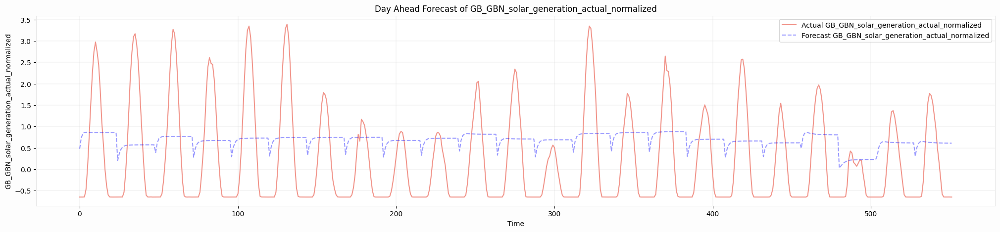

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24weg = model_bpp_gru.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24weg = y_pred_24weg.reshape(len(y_pred_24weg)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24weg)),y_pred_24weg, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24weg.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

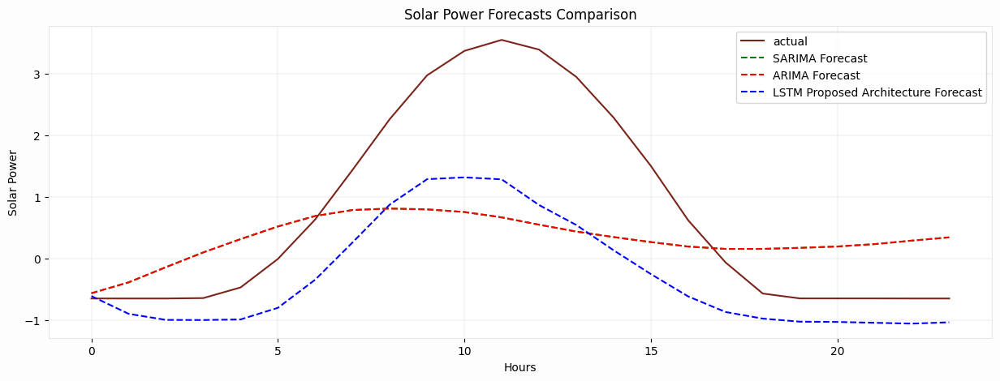

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(24), temp[TARGET[0]].iloc[-24:], color = '#7B241C', label = 'actual')
# plt.plot(range(24), predictions, color = '#EC7063',  linestyle = '--', label = 'SARIMAX Forecast')
plt.plot(range(24), predictions_sarima, color = 'green', linestyle = '--', label = 'SARIMA Forecast')
plt.plot(range(24), predictions_arima, color = 'red', linestyle = '--', label = 'ARIMA Forecast')
plt.plot(range(24), y_pred_24wt[-24:], color = 'blue', linestyle = '--', label = 'LSTM Proposed Architecture Forecast')
plot_cosmos(ax,'Hours','Solar Power','Solar Power Forecasts Comparison')
plt.legend()
plt.show()

In [76]:
# @title Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
# from dtw import *

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval_actual, y_pred_24wt)
print(f'MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval_actual, y_pred_24wt)
print(f'MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval_actual - y_pred_24wt) / y_eval_actual)) * 100
print(f'MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval_actual) - np.min(y_eval_actual))
print(f'NRMSE: {nrmse}')

MSE: 0.42842356438912527
RMSE: 0.6545407278306868
MAE: 0.4098374417387563
MAPE: 219.10188422338558%
NRMSE: 0.16190339480124294


In [ ]:
# @title Statistical Models Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(temp[TARGET[0]].iloc[-24:], predictions)
print(f'SARIMAX MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMAX RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp[TARGET[0]].iloc[-24:], predictions)
print(f'SARIMAX MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp[TARGET[0]].iloc[-24:] - predictions) / temp[TARGET[0]].iloc[-24:])) * 100
print(f'SARIMAX MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp[TARGET[0]].iloc[-24:]) - np.min(temp[TARGET[0]].iloc[-24:]))
print(f'SARIMAX NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp[TARGET[0]].iloc[-24:], predictions_sarima)
print(f'SARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp[TARGET[0]].iloc[-24:], predictions_sarima)
print(f'SARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp[TARGET[0]].iloc[-24:] - predictions_sarima) / temp[TARGET[0]].iloc[-24:])) * 100
print(f'SARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp[TARGET[0]].iloc[-24:]) - np.min(temp[TARGET[0]].iloc[-24:]))
print(f'NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp[TARGET[0]].iloc[-24:], predictions_arima)
print(f'ARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'ARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp[TARGET[0]].iloc[-24:], predictions_arima)
print(f'ARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp[TARGET[0]].iloc[-24:] - predictions_arima) / temp[TARGET[0]].iloc[-24:])) * 100
print(f'ARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp[TARGET[0]].iloc[-24:]) - np.min(temp[TARGET[0]].iloc[-24:]))
print(f'ARIMA NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24wel)
print(f'MSE LSTM Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE LSTM Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24wel)
print(f'MAE LSTM Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24wel) / y_eval)) * 100
print(f'MAPE LSTM Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE LSTM Base: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24weg)
print(f'MSE GRU Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE GRU Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24weg)
print(f'MAE GRU Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24weg) / y_eval)) * 100
print(f'MAPE GRU Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE GRU Base: {nrmse}')

SARIMAX MSE: 1.9609338453191703
SARIMAX RMSE: 1.4003334764687911
SARIMAX MAE: 1.1341278877604346
SARIMAX MAPE: 366.3223556460236%
SARIMAX NRMSE: 0.3336588921111584
SARIMA MSE: 2.0262819145433184
SARIMA RMSE: 1.4234752946726257
SARIMA MAE: 1.129710669126688
SARIMA MAPE: 316.1479765493313%
NRMSE: 0.33917291684389594
ARIMA MSE: 2.0262819145433184
ARIMA RMSE: 1.4234752946726257
ARIMA MAE: 1.129710669126688
ARIMA MAPE: 316.1479765493313%
ARIMA NRMSE: 0.33917291684389594
MSE LSTM Base: 0.29261755196404166
RMSE LSTM Base: 0.5409413572320402
MAE LSTM Base: 0.3671567176288388
MAPE LSTM Base: 178.09764094477217%
NRMSE LSTM Base: 0.13380411393882582
MSE GRU Base: 1.3774272084766686
RMSE GRU Base: 1.1736384487893488
MAE GRU Base: 1.048907452388113
MAPE GRU Base: 309.61140289725574%
NRMSE GRU Base: 0.2903043936746632


# Wind Speed Forecasting

## Data Loading and Preprocessing

In [266]:
QUERY = f'''SELECT
            0 AS ll_label,
            date_hour,
            hour,
            wind_speed_100m,
            LAG(wind_speed_100m,1) OVER(ORDER BY date_hour ASC) as ws100_lag_1,
            LAG(wind_speed_100m,2) OVER(ORDER BY date_hour ASC) as ws100_lag_2,
            LAG(wind_speed_100m,3) OVER(ORDER BY date_hour ASC) as ws100_lag_3,
            LAG(wind_speed_100m,4) OVER(ORDER BY date_hour ASC) as ws100_lag_4,
            LAG(wind_speed_100m,5) OVER(ORDER BY date_hour ASC) as ws100_lag_5,
            LAG(wind_speed_100m,6) OVER(ORDER BY date_hour ASC) as ws100_lag_6,
            LAG(wind_speed_100m,24) OVER(ORDER BY date_hour ASC) as ws100_lag_d1,
            LAG(wind_speed_100m,48) OVER(ORDER BY date_hour ASC) as ws100_lag_d2,
            LAG(wind_speed_100m,72) OVER(ORDER BY date_hour ASC) as ws100_lag_d3,
            LAG(wind_speed_100m,96) OVER(ORDER BY date_hour ASC) as ws100_lag_d4,
            LAG(wind_speed_100m,120) OVER(ORDER BY date_hour ASC) as ws100_lag_d5,
            LAG(wind_speed_100m,144) OVER(ORDER BY date_hour ASC) as ws100_lag_d6,
            LAG(wind_speed_100m,168) OVER(ORDER BY date_hour ASC) as ws100_lag_d7,
            LAG(wind_speed_100m,336) OVER(ORDER BY date_hour ASC) as ws100_lag_w2,
            LAG(wind_speed_100m,504) OVER(ORDER BY date_hour ASC) as ws100_lag_w3,
            LAG(wind_speed_100m,672) OVER(ORDER BY date_hour ASC) as ws100_lag_w4
            FROM (SELECT DISTINCT date_hour,hour,wind_speed_100m FROM Avishek_Explore.weather_data_UK_overall); '''
query_job = client.query(QUERY)  # API request
weather_data = query_job.result().to_dataframe()
weather_data.sort_values('date_hour', ascending = True, inplace = True)
weather_data.drop_duplicates(inplace = True)
weather_data.dropna(inplace = True)

In [267]:
weather_data['rolling_ws100_average_d'] = (weather_data['wind_speed_100m'] + weather_data['ws100_lag_d1'] + weather_data['ws100_lag_d2'] + weather_data['ws100_lag_d3'] + weather_data['ws100_lag_d4'] + weather_data['ws100_lag_d5'] + weather_data['ws100_lag_d6']  + weather_data['ws100_lag_d7'])/8
weather_data['rolling_ws100_average_dh'] = ( weather_data['ws100_lag_d1'] + weather_data['ws100_lag_d2'] + weather_data['ws100_lag_d3'] + weather_data['ws100_lag_d4'] + weather_data['ws100_lag_d5'] + weather_data['ws100_lag_d6']  + weather_data['ws100_lag_d7'])/7

weather_data['residual_01'] = weather_data['wind_speed_100m'] - weather_data['ws100_lag_1']
weather_data['residual_12'] = weather_data['ws100_lag_1'] - weather_data['ws100_lag_2']
weather_data['residual_23'] = weather_data['ws100_lag_2'] - weather_data['ws100_lag_3']
weather_data['residual_34'] = weather_data['ws100_lag_3'] - weather_data['ws100_lag_4']
weather_data['residual_45'] = weather_data['ws100_lag_4'] - weather_data['ws100_lag_5']
weather_data['rolling_residual_average'] = (weather_data['residual_01'] + weather_data['residual_12'] + weather_data['residual_23'] + weather_data['residual_34'] + weather_data['residual_45'])/5

weather_data['residual_d01'] = weather_data['wind_speed_100m'] - weather_data['ws100_lag_d1']
weather_data['residual_d12'] = weather_data['ws100_lag_d1'] - weather_data['ws100_lag_d2']
weather_data['residual_d23'] = weather_data['ws100_lag_d2'] - weather_data['ws100_lag_d3']
weather_data['residual_d34'] = weather_data['ws100_lag_d3'] - weather_data['ws100_lag_d4']
weather_data['residual_d45'] = weather_data['ws100_lag_d4'] - weather_data['ws100_lag_d5']
weather_data['residual_d56'] = weather_data['ws100_lag_d5'] - weather_data['ws100_lag_d6']
weather_data['residual_d67'] = weather_data['ws100_lag_d6'] - weather_data['ws100_lag_d7']
weather_data['d_rolling_residual_average'] = (weather_data['residual_d01'] + \
                                              weather_data['residual_d12'] + \
                                              weather_data['residual_d23'] + \
                                              weather_data['residual_d34'] + \
                                              weather_data['residual_d45'] + \
                                              weather_data['residual_d56'] + \
                                              weather_data['residual_d67'])/7

weather_data['dh_rolling_residual_average'] = (weather_data['residual_d12'] + \
                                              weather_data['residual_d23'] + \
                                              weather_data['residual_d34'] + \
                                              weather_data['residual_d45'] + \
                                              weather_data['residual_d56'] + \
                                              weather_data['residual_d67'])/6

weather_data['residual_w12'] = weather_data['ws100_lag_d7'] - weather_data['ws100_lag_w2']
weather_data['residual_w23'] = weather_data['ws100_lag_w2'] - weather_data['ws100_lag_w3']
weather_data['residual_w34'] = weather_data['ws100_lag_w3'] - weather_data['ws100_lag_w4']

In [268]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
# feature_ss_r = dict()

for col in [c for c in weather_data.columns]:
  if col in ['date_hour','hour']:
    pass
  else:
    t_ss_r = StandardScaler()
    # feature_ss_r[col] = t_ss_r
    t_ss_r.fit(np.array(weather_data[f"{col}"]).reshape(-1,1))
    scaled_data = t_ss_r.transform(np.array(weather_data[f"{col}"]).reshape(-1,1))
    weather_data[f"{col}_normalized"] = scaled_data

In [269]:
# @title Initial Features
initial_features =  ['temperature_2m',
 'relative_humidity_2m',
 'dew_point_2m',
 'apparent_temperature',
 'precipitation',
 'rain',
 'snowfall',
 'snow_depth',
 'weather_code',
 'pressure_msl',
 'surface_pressure',
 'cloud_cover',
 'cloud_cover_low',
 'cloud_cover_mid',
 'cloud_cover_high',
 'et0_fao_evapotranspiration',
 'vapour_pressure_deficit',
 'wind_speed_10m',
 'wind_speed_100m',
 'wind_direction_10m',
 'wind_direction_100m',
 'wind_gusts_10m',
 'soil_temperature_0_to_7cm',
 'soil_temperature_7_to_28cm',
 'soil_temperature_28_to_100cm',
 'soil_temperature_100_to_255cm',
 'soil_moisture_0_to_7cm',
 'soil_moisture_7_to_28cm',
 'soil_moisture_28_to_100cm',
 'soil_moisture_100_to_255cm',
 'shortwave_radiation',
 'direct_radiation',
 'diffuse_radiation',
 'direct_normal_irradiance',
 'global_tilted_irradiance',
 'terrestrial_radiation',
 'shortwave_radiation_instant',
 'direct_radiation_instant',
 'diffuse_radiation_instant',
 'direct_normal_irradiance_instant',
 'global_tilted_irradiance_instant',
 'terrestrial_radiation_instant']

In [270]:
# for c in initial_features:
#   try:
#     weather_data[f'{c}_residual_percentage'] = weather_data[f'{c}_residual']/weather_data[f'{c}_lag1']
#   except Exception as e:
#     pass
# weather_data[[c for c in weather_data.columns if c.find('percentage') > -1]]
weather_data.fillna(0, inplace = True)
weather_data.replace([np.inf, -np.inf],0,inplace = True)
weather_data_hour_mean = weather_data.groupby(['ll_label','hour']).agg({'wind_speed_100m_normalized' : 'mean'}).reset_index().rename(columns = {'wind_speed_100m_normalized' : 'ws100_mean'})
weather_data_hour_std = weather_data.groupby(['ll_label','hour']).agg({'wind_speed_100m_normalized' : 'std'}).reset_index().rename(columns = {'wind_speed_100m_normalized' : 'ws100_std'})
weather_data = pd.merge(weather_data, weather_data_hour_mean, on=['ll_label', 'hour'], how='left').fillna(0)
weather_data = pd.merge(weather_data, weather_data_hour_std, on=['ll_label', 'hour'], how='left').fillna(0)

In [271]:
from scipy.signal import savgol_filter

# Generate a noisy sine wave signal
np.random.seed(0)  # For reproducibility
t = range(len(weather_data.iloc[:180*24]))
signal = weather_data['wind_speed_100m'].iloc[:180*24]

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 1  # The degree of the polynomial used to fit the samples
# smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Fit the model
for f in weather_data.columns:
  if f.find('smooth') == -1:
    if f in ['temp_mean','temp_std','date_hour','date','hour','ll_label']:
      pass
    else:
      weather_data[f"{f}_smooth"] = savgol_filter(weather_data[f], window_length, polyorder)

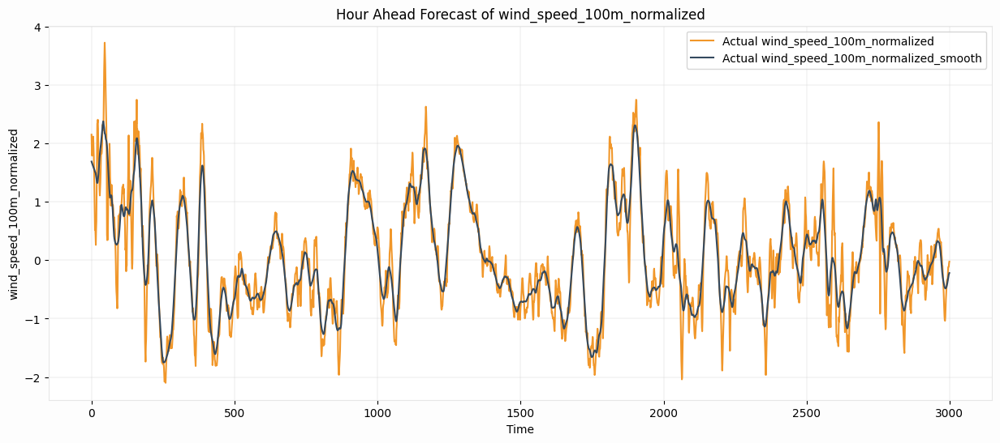

In [272]:
fig = plt.figure(figsize = (15,6))
ax = plt.axes()
ax.plot(range(len(weather_data))[0:3000],weather_data[TARGET[0]][0:3000], label = f'Actual {TARGET[0]}', color = '#F1972A')
ax.plot(range(len(weather_data))[0:3000],weather_data[TARGET_smooth[0]][0:3000], label = f'Actual {TARGET_smooth[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Wind Speed',f'Wind Speed Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()

In [273]:
# from statsmodels.tsa.holtwinters import ExponentialSmoothing
# from scipy.ndimage import gaussian_filter1d
# def gaussian_smooth(data, sigma):
#     return gaussian_filter1d(data, sigma=sigma)

# # Fit the model
# for f in weather_data.columns:
#   if f in ['temp_mean','temp_std','date_hour','date','hour','ll_label']:
#     pass
#   else:
#     weather_data[f"{f}_smooth"] = gaussian_smooth(weather_data[f], 24)

## Model Development

In [ ]:
features_residual_smooth = [
                            'ws100_lag_d1_normalized_smooth',
                          'ws100_lag_d2_normalized_smooth', 'ws100_lag_d3_normalized_smooth']
features_category_smooth =['ws100_lag_d1_normalized_smooth',
                          'ws100_lag_d2_normalized_smooth', 'ws100_lag_d3_normalized_smooth']
features_primary_smooth = [
                      'wind_speed_100m_normalized_smooth'
                      ]
TARGET_smooth = [
                      'wind_speed_100m_normalized_smooth'
                      ]

features_residual = ['ws100_lag_2_normalized', 'ws100_lag_3_normalized',
                  'ws100_lag_4_normalized', 'ws100_lag_5_normalized',
                  'ws100_lag_6_normalized', 'ws100_lag_d1_normalized',
                  'ws100_lag_d2_normalized', 'ws100_lag_d3_normalized',
                  'ws100_lag_d4_normalized', 'ws100_lag_d5_normalized',
                  'ws100_lag_d6_normalized', 'ws100_lag_d7_normalized',
                  'ws100_lag_w2_normalized', 'ws100_lag_w3_normalized',
                  'ws100_lag_w4_normalized', 'rolling_ws100_average_d_normalized',
                  'rolling_ws100_average_dh_normalized', 'residual_01_normalized',
                  'residual_12_normalized', 'residual_23_normalized',
                  'residual_34_normalized', 'residual_45_normalized',
                  'rolling_residual_average_normalized', 'residual_d01_normalized',
                  'residual_d12_normalized', 'residual_d23_normalized',
                  'residual_d34_normalized', 'residual_d45_normalized',
                  'residual_d56_normalized', 'residual_d67_normalized',
                  'd_rolling_residual_average_normalized',
                  'dh_rolling_residual_average_normalized', 'residual_w12_normalized',
                  'residual_w23_normalized', 'residual_w34_normalized']
features_category =[ 'dh_rolling_residual_average_normalized','residual_w12_normalized',
                    'residual_w23_normalized', 'residual_w34_normalized',
                    'rolling_ws100_average_dh_normalized']
features_primary = [
                      'wind_speed_100m_normalized'
                      ]
TARGET = [
                      'wind_speed_100m_normalized'
                      ]

feature_keys = list(set(features_residual + features_category + features_primary + TARGET))
VOCABULARY_SIZE = 10
EMBEDDING_SIZE = 3
LATENT_DIM = 12
SEQ = 168
NUMERICAL_FEATURE_SIZE = len(features_residual_smooth)
PRIMARY_FEATURE_SIZE = len(features_primary_smooth)
NUM_VARS = len(features_category_smooth)
OUTPUT_DIM = len(TARGET_smooth)
LEARNING_RATE = 0.001
N_FUTURE = 24
TARGET_REPEAT = 1

BATCH_SIZE = 14
EPOCHS = 20
SAMPLE_SIZE = None
STEPS = 1

TABLE_NAME = 'weather_data_UK_normalized_residual_wind'
CAT_SPLIT = 'll_label'
GCP_BUCKET = 'affle-ds'



feature_keys_smooth = list(set(features_residual_smooth + features_category_smooth + features_primary_smooth + TARGET_smooth))

In [ ]:
# @title LSTM Model Wind Speed

def create_global_windspeed_forecast_24w_model_v1(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'wind_speed_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1), name = 'historic_dense')
        time_series_projection = dense_historic(time_series_projection)

        # time_series_futuristic = BatchNormalization(name = 'Batch_Normalization_2')(inputs[3])
        time_series_futuristic = LSTM(latent_dim, return_sequences=True, name="LSTM_Futuristic")(inputs[3])
        dense_futuristic = TimeDistributed(Dense(2, activation = 'tanh'), name = 'dense_futuristic')
        time_series_futuristic = dense_futuristic(time_series_futuristic)

        hf_concat= Concatenate(name = 'Concatenate_Historic_and_Futuristic_Inputs')([time_series_projection,inputs[3]])
        final_dense = TimeDistributed(Dense(1), name = 'output')
        output = final_dense(hf_concat)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'wind_speed_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

## Hyperparameter Tuning

In [ ]:
feature_keys = list(set(features_residual_smooth + features_category_smooth + features_primary_smooth + TARGET_smooth))

ss_hpt = gridrandomsearchcv(lsw_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

In [89]:
hp_df = pd.DataFrame(np.array(ss_hpt).reshape(20,6), columns = ['sequence','batch','latent dim','dense unit','kfold','RMSE'])
hp_df[hp_df['RMSE'] == hp_df['RMSE'].min()]

,sequence,batch,latent dim,dense unit,kfold,RMSE
0,168.0,14.0,12.0,2.0,3.0,0.330387


## Model Training

In [ ]:
# QUERY = f'''SELECT * FROM Avishek_Explore.{TABLE_NAME} ORDER BY ll_label,date_hour; '''
# query_job = client.query(QUERY)  # API request
# weather_data = query_job.result().to_dataframe()

In [ ]:
# list(weather_data.columns)

In [ ]:
train_start_date = '2022-11-01'
train_end_date = '2023-11-01'
eval_end_date = '2023-12-01'
weather_data['ll_label'] = weather_data['ll_label'].astype(int)
weather_data['hour'] = weather_data['hour'].astype(int)
train_df, eval_df = weather_data[(weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date)][feature_keys_smooth+['ll_label','date_hour']], \
                                       weather_data[(weather_data['date_hour'] > train_end_date) & (weather_data['date_hour'] <= eval_end_date)][feature_keys_smooth+['ll_label','date_hour']]

test_df = weather_data[weather_data['date_hour'] > eval_end_date][feature_keys_smooth+['ll_label','date_hour']]

In [276]:
# ,4,5,6,7,8,9

eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0])], features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS,target_repeater = TARGET_REPEAT)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0])]  , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ , BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

# y_test = y_test.reshape(len(y_test)*N_FUTURE,1)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 206/206 [00:00<00:00, 349.06it/s]


(612, 37, 353)

In [277]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8761 entries, 85512 to 94272
Data columns (total 6 columns):
 #   Column                             Non-Null Count  Dtype              
---  ------                             --------------  -----              
 0   ws100_lag_d1_normalized_smooth     8761 non-null   float64            
 1   ws100_lag_d3_normalized_smooth     8761 non-null   float64            
 2   ws100_lag_d2_normalized_smooth     8761 non-null   float64            
 3   wind_speed_100m_normalized_smooth  8761 non-null   float64            
 4   ll_label                           8761 non-null   int64              
 5   date_hour                          8761 non-null   datetime64[us, UTC]
dtypes: datetime64[us, UTC](1), float64(4), int64(1)
memory usage: 479.1 KB


In [278]:
def set_cloud_dirs(GCP_BUCKET, job_dir):
    relative_path = job_dir.split(GCP_BUCKET+"/")[1]
    output_path = relative_path+'/outputs/'
    log_path = relative_path+'/logs/profile/'
    return output_path, log_path
cloud_output_dir, cloud_log_dir = set_cloud_dirs(GCP_BUCKET, 'gs://affle-ds/avishek/body/Research/weather_forecast/experiment/wind_speed_global_all_campaign/local')

In [ ]:
wind_speed_hpt = gridrandomsearchcv(weather_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

Model: "wind_speed_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 3)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ wind_speed_input          │ (None, 168, 1)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 4)         │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ wind_speed_input[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 12)             │            816 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 12)         │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 12)         │          1,200 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ historic_dense            │ (None, 24, 1)          │             13 │ LSTM_Historic_Future_… │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 3)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Historic_and… │ (None, 24, 4)          │              0 │ historic_dense[0][0],  │
│ (Concatenate)             │                        │                │ forecast_aggregated_i… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 3)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              5 │ Concatenate_Historic_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,034 (7.95 KB)

 Trainable params: 2,034 (7.95 KB)

 Non-trainable params: 0 (0.00 B)

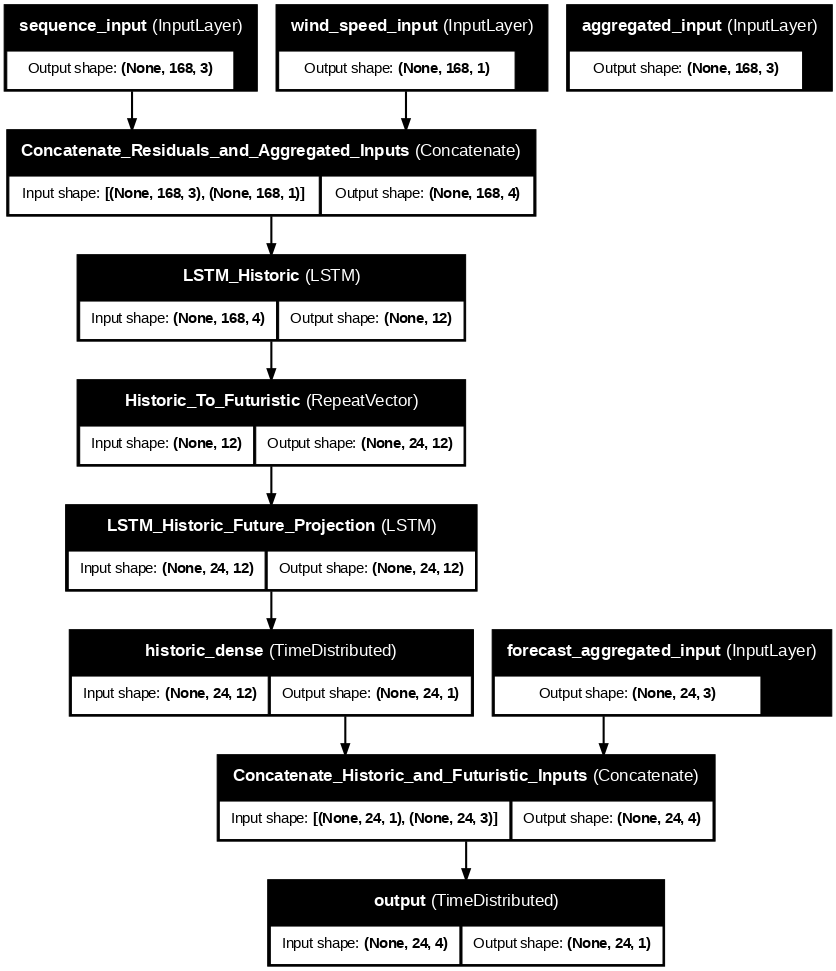

In [279]:
import tensorflow as tf

model_bpp_3 = create_global_windspeed_forecast_24w_model_v1(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE
                                                            )

model_bpp_3.summary()

tf.keras.utils.plot_model(
    model_bpp_3,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [280]:
def get_callbacks(log_path, GCP_BUCKET):
    import tensorflow as tf

    def scheduler(epoch, lr):

        if epoch % 2 == 0:

            if lr >= 0.00001:

                return lr

            else:

                return 0.001

        else:

            return lr

    cloud_log_dir = os.path.join("gs://", GCP_BUCKET, log_path)

    checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="outputs/best_temp_model.keras", verbose=1, save_best_only=True, monitor="val_rmse", mode="min")

    earlyStopper  = tf.keras.callbacks.EarlyStopping(
                                    monitor="loss",
                                    min_delta=0.001,
                                    patience=5,
                                    verbose=0,
                                    mode="min",
                                    restore_best_weights = True
                                )

    LRScheduler = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=0)

    plateau = tf.keras.callbacks.ReduceLROnPlateau(
                                                                                                    monitor="val_rmse",
                                                                                                    factor=0.5,
                                                                                                    patience=1,
                                                                                                    verbose=0,
                                                                                                    mode="min",
                                                                                                    min_delta=0.01,
                                                                                                    cooldown=0,
                                                                                                    min_lr=0.00001,
                                                                                                )
#     csv_logger = tf.keras.callbacks.CSVLogger("outputs/history.log")

    return [checkpointer,earlyStopper,LRScheduler,plateau]


In [281]:
# try:
#   del history_bpp
# except Exception as e:
#   print("Model does not exist")

In [282]:
history_windspeed = model_bpp_3.fit(
            train_loader,
            epochs=EPOCHS,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/20
612/612 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 1.0168 - rmse: 0.9855
Epoch 1: val_rmse improved from inf to 0.82813, saving model to outputs/best_temp_model.keras
612/612 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step - loss: 1.0162 - rmse: 0.9852 - val_loss: 0.6858 - val_rmse: 0.8281 - learning_rate: 0.0010
Epoch 2/20
612/612 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 0.4846 - rmse: 0.6898
Epoch 2: val_rmse improved from 0.82813 to 0.74948, saving model to outputs/best_temp_model.keras
612/612 ━━━━━━━━━━━━━━━━━━━━ 44s 72ms/step - loss: 0.4844 - rmse: 0.6897 - val_loss: 0.5617 - val_rmse: 0.7495 - learning_rate: 0.0010
Epoch 3/20
612/612 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.3957 - rmse: 0.6247
Epoch 3: val_rmse improved from 0.74948 to 0.72561, saving model to outputs/best_temp_model.keras
612/612 ━━━━━━━━━━━━━━━━━━━━ 43s 71ms/step - loss: 0.3956 - rmse: 0.6246 - val_loss: 0.5265 - val_rmse: 0.7256 - learning_rate: 0.0010
Epoch 4/20
612/612 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - l

## Model Evaluation

100%|██████████| 358/358 [00:01<00:00, 322.16it/s]


12/12 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step


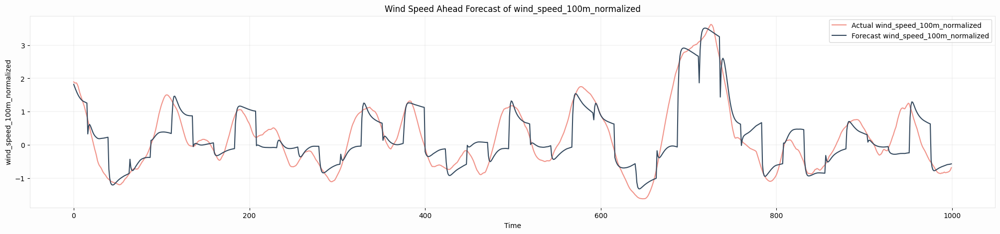

In [259]:
X_train,y_train,_ = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wt = model_bpp_3.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_train))[0:1000],y_train[-1000:], label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt))[0:1000],y_pred_24wt[-1000:], label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Wind Speed',f'Wind Speed Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Wind Speed Ahead Forecast of {TARGET[0]}')

plt.show()



100%|██████████| 22/22 [00:00<00:00, 411.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


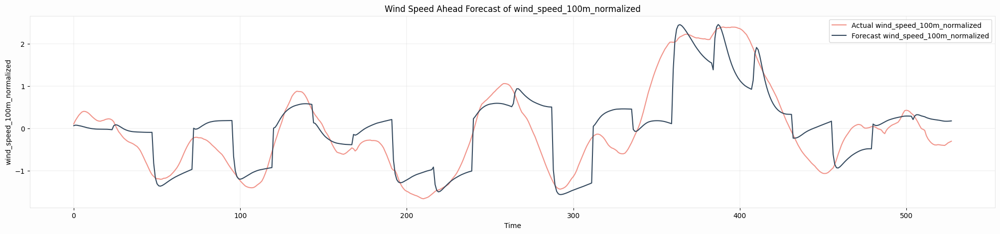

In [260]:
X_eval,y_eval,_ = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24we = model_bpp_3.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24we = y_pred_24we.reshape(len(y_pred_24we)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Wind Speed',f'Wind Speed Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Wind Speed Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 27/27 [00:00<00:00, 356.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


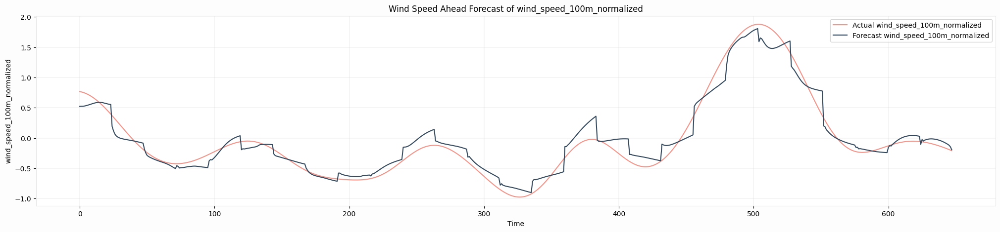

In [ ]:
X_eval,y_eval,_ = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24we = model_bpp_3.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24we = y_pred_24we.reshape(len(y_pred_24we)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Wind Speed',f'Wind Speed Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Wind Speed Ahead Forecast of {TARGET[0]}')

plt.show()

In [262]:
y_pred_24w = model_bpp_3.predict(X_test)
y_pred_24w_te = y_pred_24w.reshape(len(y_pred_24w)*N_FUTURE,1)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


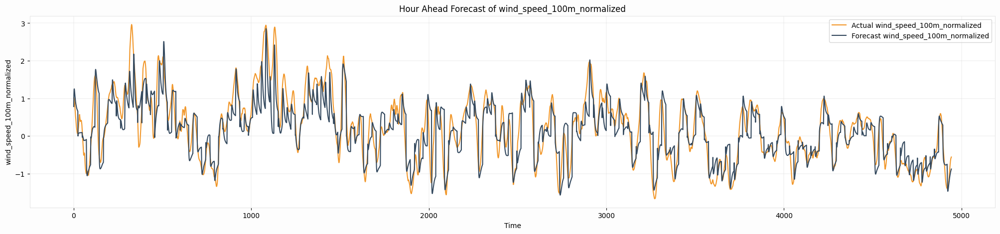

In [263]:
fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1972A')
ax.plot(range(len(y_pred_24w_te)),y_pred_24w_te, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()

In [ ]:
forecasted_wind_speed = y_pred_24wt + y_pred_24we + y_pred_24w_te

100%|██████████| 363/363 [00:01<00:00, 353.02it/s]


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


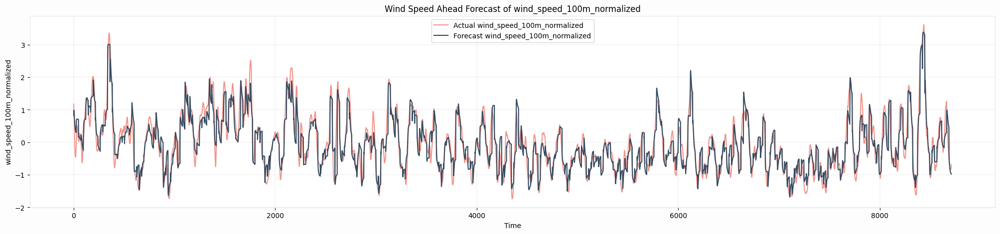

In [ ]:
X_train,y_train,_ = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wt = model_bpp_3.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Wind Speed',f'Wind Speed Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Wind Speed Ahead Forecast of {TARGET[0]}')

plt.show()



100%|██████████| 363/363 [00:01<00:00, 306.66it/s]


12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


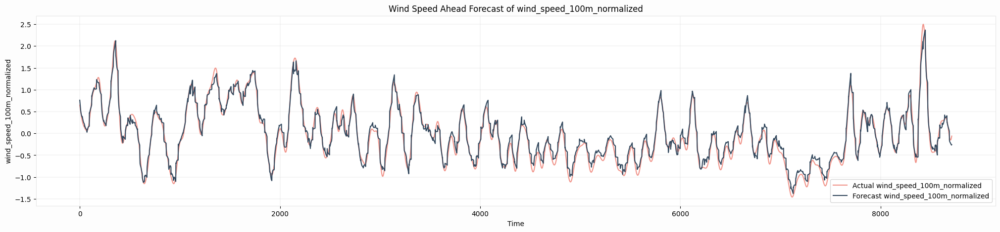

In [ ]:
X_train,y_train,_ = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wt = model_bpp_3.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','Wind Speed',f'Wind Speed Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Wind Speed Ahead Forecast of {TARGET[0]}')

plt.show()



In [ ]:
forecasted_wind_supply = y_pred_24wt.reshape(1,-1).tolist()[0]
forecasted_wind_supply.extend(y_pred_24we.reshape(1,-1).tolist()[0])
forecasted_wind_supply.extend(y_pred_24w_te.reshape(1,-1).tolist()[0])
weather_data.shape,len(forecasted_wind_supply)
weather_data['date_hour'].min(),weather_data['date_hour'].max()
weather_data['forecasted_wind_supply'] = np.nan
weather_data['forecasted_wind_supply'].iloc[-1*len(forecasted_wind_supply):] = forecasted_wind_supply
import pandas as pd
import pandas_gbq
from google.cloud import bigquery

# Set your BigQuery project ID and destination table
project_id = 'revx-259410'
destination_table = 'Avishek_Explore.wind_speed_forecast_data_UK_overall'

# Upload DataFrame to BigQuery
pandas_gbq.to_gbq(weather_data, destination_table, project_id=project_id, if_exists='replace')

100%|██████████| 1/1 [00:00<00:00, 7710.12it/s]


## Model Comparison

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_0_forecast_ARIMA.pkl, None>
File WindSpeed_0_forecast_ARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_0_forecast_ARIMA.pkl.


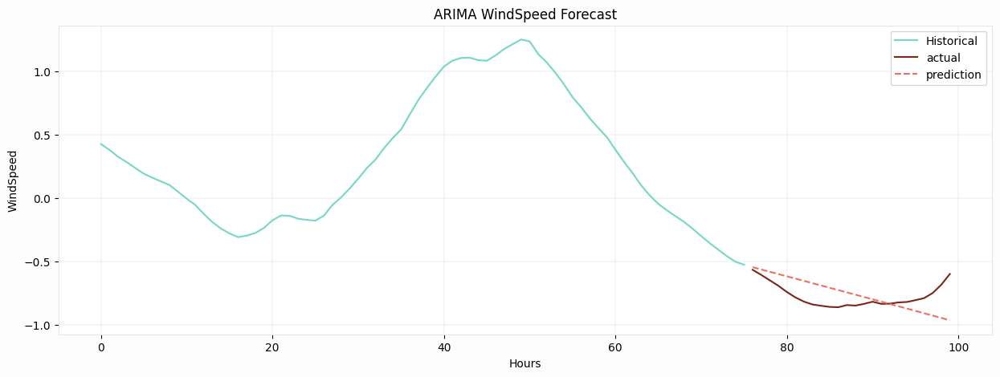

In [ ]:
# @title ARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
train_start_date_stats = "2023-06-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date_stats)]
  arima_model = sm.tsa.SARIMAX(np.array(temp['wind_speed_100m_normalized_smooth'].iloc[:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 0)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_arima = arima_model.fit(disp=True)

  with open(f'WindSpeed_{ll}_forecast_ARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_{ll}_forecast_ARIMA.pkl'

  source_file_name = f'WindSpeed_{ll}_forecast_ARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_arima.summary()
# Make predictions
predictions_arima = sarimax_fit_arima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24])), temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24]),len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24])+len(temp['wind_speed_100m_normalized_smooth'].iloc[-24:])), temp['wind_speed_100m_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24]),len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24])+len(temp['wind_speed_100m_normalized_smooth'].iloc[-24:])), predictions_arima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','WindSpeed','ARIMA WindSpeed Forecast')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_0_forecast_SARIMAA.pkl, None>
File WindSpeed_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_0_forecast_SARIMAA.pkl.


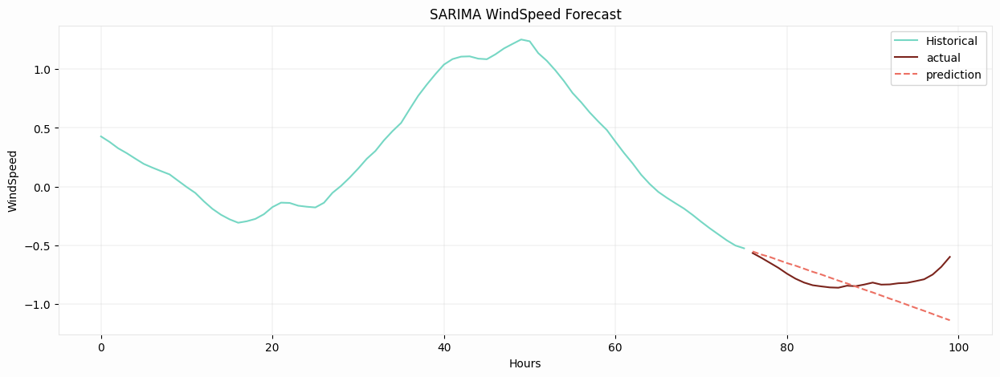

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = weather_data['ll_label'].unique()
train_start_date_stats = "2023-01-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = weather_data[(weather_data['ll_label'] == ll) & (weather_data['date_hour'] <= train_end_date) & (weather_data['date_hour'] >= train_start_date_stats)]
  sarima_model = sm.tsa.SARIMAX(np.array(temp['wind_speed_100m_normalized_smooth'].iloc[:-24]),
                                order=(3, 3, 3),
                                seasonal_order=(0, 0, 0, 365*24)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'WindSpeed_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'WindSpeed_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24])), temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24]),len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24])+len(temp['wind_speed_100m_normalized_smooth'].iloc[-24:])), temp['wind_speed_100m_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24]),len(temp['wind_speed_100m_normalized_smooth'].iloc[-100:-24])+len(temp['wind_speed_100m_normalized_smooth'].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','WindSpeed','SARIMA WindSpeed Forecast')
plt.legend()
plt.show()

In [ ]:
# @title LSTM Model GHI Base


def create_lstm_wsp(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'wsp_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        # time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(inputs[1])
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'wsp_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "wsp_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ wsp_input (InputLayer)    │ (None, 48, 1)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 24)             │          2,496 │ wsp_input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 24)         │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 24)         │          4,704 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 48, 12)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 48, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             25 │ LSTM_Historic_Future_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 7,225 (28.22 KB)

 Trainable params: 7,225 (28.22 KB)

 Non-trainable params: 0 (0.00 B)

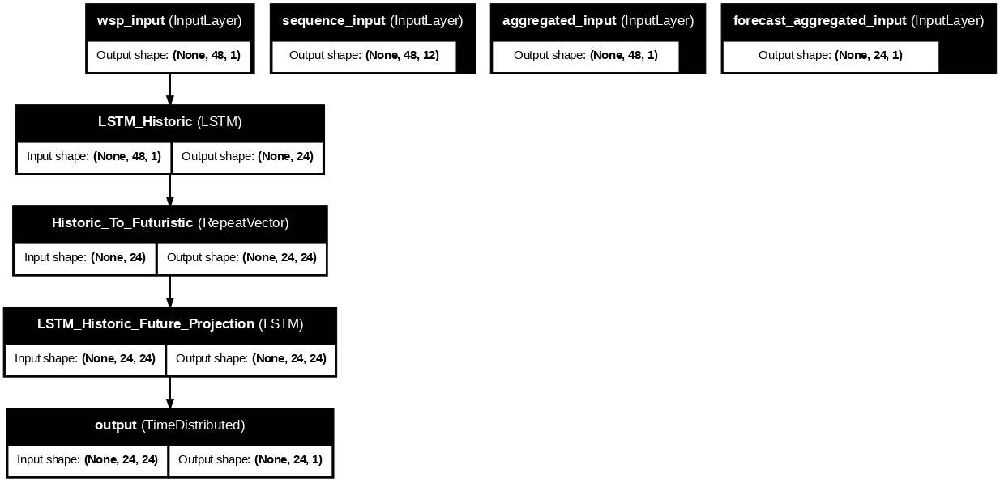

In [ ]:
import tensorflow as tf

model_bpp_lstm = create_lstm_wsp(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_lstm.summary()

tf.keras.utils.plot_model(
    model_bpp_lstm,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0,4,5,6,7,8,9])]  , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ , BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 211/211 [00:00<00:00, 660.79it/s]


(1241, 92, 723)

In [ ]:
history_bpp_lstm = model_bpp_lstm.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.4409 - rmse: 0.6577
Epoch 1: val_rmse improved from inf to 0.55005, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 53s 38ms/step - loss: 0.4408 - rmse: 0.6577 - val_loss: 0.3026 - val_rmse: 0.5500 - learning_rate: 0.0010
Epoch 2/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3005 - rmse: 0.5455
Epoch 2: val_rmse improved from 0.55005 to 0.52903, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 47s 38ms/step - loss: 0.3004 - rmse: 0.5455 - val_loss: 0.2799 - val_rmse: 0.5290 - learning_rate: 0.0010
Epoch 3/10
1240/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2678 - rmse: 0.5154
Epoch 3: val_rmse improved from 0.52903 to 0.52592, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 43s 35ms/step - loss: 0.2677 - rmse: 0.5153 - val_loss: 0.2766 - val_rmse: 0.5259 - learning_rate: 0.0010
Epoch 4/10
1240/1241 ━━━━━━━━━━━━━━━━━━━━ 0s

100%|██████████| 363/363 [00:00<00:00, 598.46it/s]


12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step


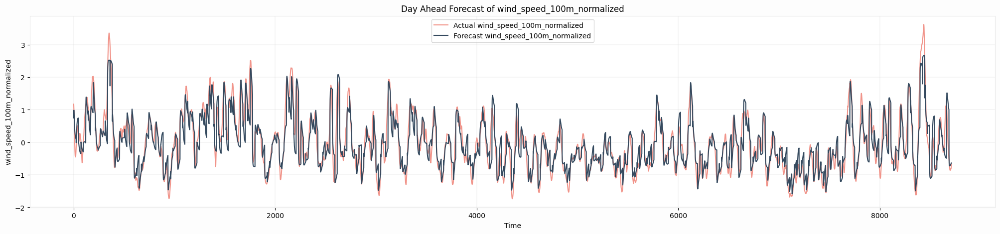

In [ ]:
X_train,y_train,d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtl = model_bpp_lstm.predict(X_train)
y_train = y_train.reshape(len(y_train)*N_FUTURE,1)
y_pred_24wtl = y_pred_24wtl.reshape(len(y_pred_24wtl)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtl)),y_pred_24wtl, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

100%|██████████| 27/27 [00:00<00:00, 495.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


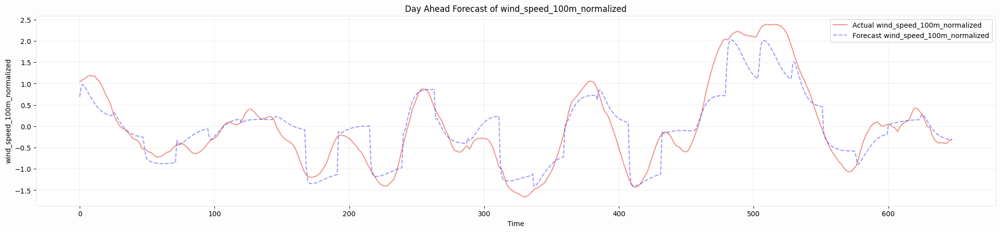

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wel = model_bpp_lstm.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24wel = y_pred_24wel.reshape(len(y_pred_24wel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wel)),y_pred_24wel, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24wel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

100%|██████████| 211/211 [00:00<00:00, 666.17it/s]


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


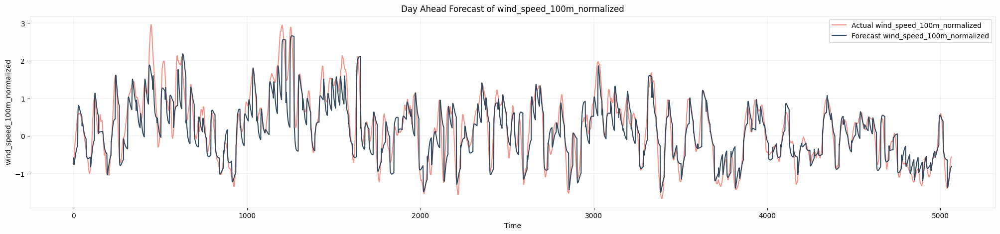

In [ ]:
X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtel = model_bpp_lstm.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wtel = y_pred_24wtel.reshape(len(y_pred_24wtel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtel)),y_pred_24wtel, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

test_prediction_df = pd.DataFrame(np.array([d_test.reshape(1,-1).tolist()[0],y_pred_24wtel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

In [ ]:
# @title GRU Model ws Base


def create_gru_ws(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'ws_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = GRU(latent_dim, return_sequences=False, name="GRU_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = GRU(latent_dim, return_sequences=True, name="GRU_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'ws_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "ws_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 48, 12)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ws_input (InputLayer)     │ (None, 48, 1)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 48, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 48, 14)         │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ ws_input[0][0],        │
│                           │                        │                │ aggregated_input[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic (GRU)        │ (None, 24)             │          2,880 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 24)         │              0 │ GRU_Historic[0][0]     │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic_Future_Proj… │ (None, 24, 24)         │          3,600 │ Historic_To_Futuristi… │
│ (GRU)                     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 1)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │             25 │ GRU_Historic_Future_P… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 6,505 (25.41 KB)

 Trainable params: 6,505 (25.41 KB)

 Non-trainable params: 0 (0.00 B)

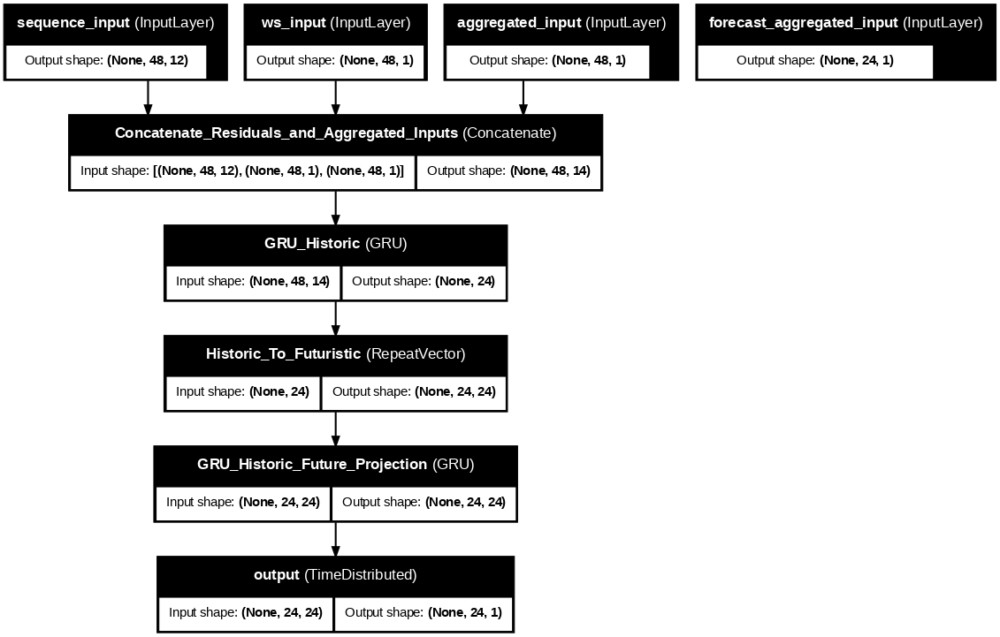

In [ ]:
import tensorflow as tf

model_bpp_gru = create_gru_ws(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_gru.summary()

tf.keras.utils.plot_model(
    model_bpp_gru,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
history_bpp_gru = model_bpp_gru.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1240/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.3216 - rmse: 0.5627
Epoch 1: val_rmse improved from inf to 0.66237, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 54s 39ms/step - loss: 0.3215 - rmse: 0.5626 - val_loss: 0.4387 - val_rmse: 0.6624 - learning_rate: 0.0010
Epoch 2/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2458 - rmse: 0.4940
Epoch 2: val_rmse improved from 0.66237 to 0.61839, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 42s 34ms/step - loss: 0.2457 - rmse: 0.4940 - val_loss: 0.3824 - val_rmse: 0.6184 - learning_rate: 0.0010
Epoch 3/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2178 - rmse: 0.4655
Epoch 3: val_rmse improved from 0.61839 to 0.57937, saving model to outputs/best_temp_model.keras
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 40s 32ms/step - loss: 0.2178 - rmse: 0.4655 - val_loss: 0.3357 - val_rmse: 0.5794 - learning_rate: 0.0010
Epoch 4/10
1241/1241 ━━━━━━━━━━━━━━━━━━━━ 0s

100%|██████████| 27/27 [00:00<00:00, 550.67it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


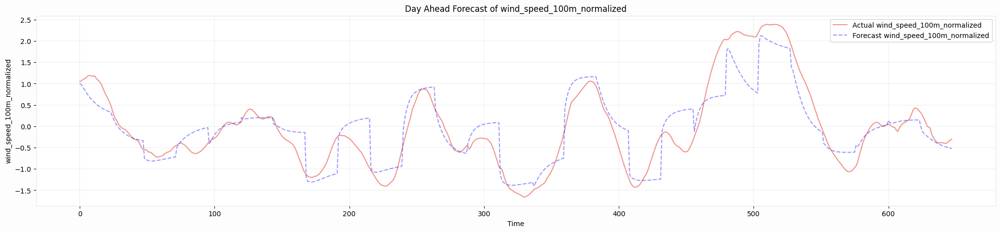

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual_smooth,features_primary_smooth, TARGET_smooth , SEQ ,BATCH_SIZE, features_category_smooth,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24weg = model_bpp_gru.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24weg = y_pred_24weg.reshape(len(y_pred_24weg)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24weg)),y_pred_24weg, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24weg.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

KeyError: 'wind_speed_100m_normalized_smooth'

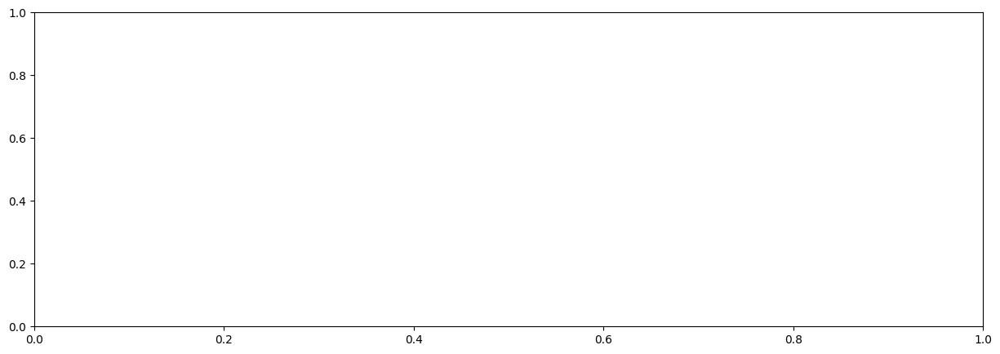

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(24), temp['wind_speed_100m_normalized_smooth'].iloc[-24:], color = '#7B241C', label = 'actual')
# plt.plot(range(24), predictions, color = '#EC7063',  linestyle = '--', label = 'SARIMAX Forecast')
plt.plot(range(24), predictions_sarima, color = 'green', linestyle = '--', label = 'SARIMA Forecast')
plt.plot(range(24), predictions_arima, color = 'red', linestyle = '--', label = 'ARIMA Forecast')
plt.plot(range(24), y_pred_24wt[-24:], color = 'blue', linestyle = '--', label = 'LSTM Proposed Architecture Forecast')
plot_cosmos(ax,'Hours','Wind Speed','GHI Forecasts Comparison')
plt.legend()
plt.show()

In [264]:
# @title Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
# from dtw import *

# Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred_24w_te)
print(f'MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred_24w_te)
print(f'MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_test - y_pred_24w_te) / y_test)) * 100
print(f'MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_test) - np.min(y_test))
print(f'NRMSE: {nrmse}')

MSE: 0.2424684580393426
RMSE: 0.49241086303953796
MAE: 0.34993875479054687
MAPE: 162.43358272958832%
NRMSE: 0.10640467635051853


In [ ]:
# @title Statistical Models Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# # Mean Squared Error (MSE)
# mse = mean_squared_error(temp['wind_speed_100m_normalized_smooth'].iloc[-24:], predictions)
# print(f'SARIMAX MSE: {mse}')

# # Root Mean Squared Error (RMSE)
# rmse = np.sqrt(mse)
# print(f'SARIMAX RMSE: {rmse}')

# # Mean Absolute Error (MAE)
# mae = mean_absolute_error(temp['wind_speed_100m_normalized_smooth'].iloc[-24:], predictions)
# print(f'SARIMAX MAE: {mae}')

# # Mean Absolute Percentage Error (MAPE)
# mape = np.mean(np.abs((temp['wind_speed_100m_normalized_smooth'].iloc[-24:] - predictions) / temp['wind_speed_100m_normalized_smooth'].iloc[-24:])) * 100
# print(f'SARIMAX MAPE: {mape}%')

# # Normalized Root Mean Squared Error (NRMSE)
# # You can normalize by the range (max-min) or the mean
# nrmse = rmse / (np.max(temp['wind_speed_100m_normalized_smooth'].iloc[-24:]) - np.min(temp['wind_speed_100m_normalized_smooth'].iloc[-24:]))
# print(f'SARIMAX NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['wind_speed_100m_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['wind_speed_100m_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['wind_speed_100m_normalized_smooth'].iloc[-24:] - predictions_sarima) / temp['wind_speed_100m_normalized_smooth'].iloc[-24:])) * 100
print(f'SARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['wind_speed_100m_normalized_smooth'].iloc[-24:]) - np.min(temp['wind_speed_100m_normalized_smooth'].iloc[-24:]))
print(f'NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['wind_speed_100m_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'ARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['wind_speed_100m_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['wind_speed_100m_normalized_smooth'].iloc[-24:] - predictions_arima) / temp['wind_speed_100m_normalized_smooth'].iloc[-24:])) * 100
print(f'ARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['wind_speed_100m_normalized_smooth'].iloc[-24:]) - np.min(temp['wind_speed_100m_normalized_smooth'].iloc[-24:]))
print(f'ARIMA NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24wel)
print(f'MSE LSTM Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE LSTM Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24wel)
print(f'MAE LSTM Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24wel) / y_eval)) * 100
print(f'MAPE LSTM Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE LSTM Base: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24weg)
print(f'MSE GRU Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE GRU Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24weg)
print(f'MAE GRU Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24weg) / y_eval)) * 100
print(f'MAPE GRU Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE GRU Base: {nrmse}')

SARIMA MSE: 0.03666673529450907
SARIMA RMSE: 0.19148560074979284
SARIMA MAE: 0.13923900777320294
SARIMA MAPE: 18.853855118637295%
NRMSE: 0.6482231764733134
ARIMA MSE: 0.018943806251541864
ARIMA RMSE: 0.1376365004333584
ARIMA MAE: 0.11022971063032842
ARIMA MAPE: 14.763180005311236%
ARIMA NRMSE: 0.4659314808018465
MSE LSTM Base: 0.16001266744023387
RMSE LSTM Base: 0.40001583398689844
MAE LSTM Base: 0.29905469685422853
MAPE LSTM Base: 151.16090387074857%
NRMSE LSTM Base: 0.09872181300675036
MSE GRU Base: 0.18289585474154393
RMSE GRU Base: 0.42766324922951227
MAE GRU Base: 0.31535206713951797
MAPE GRU Base: 110.51997933487927%
NRMSE GRU Base: 0.10554505030337871


# Wind Supply

## Data Loading and Preprocessing

In [31]:
# @title Data Load Query

QUERY = f'''SELECT TIMESTAMP(a.utc_timestamp) AS utc_timestamp,
                    GB_GBN_load_actual_entsoe_transparency,
                    GB_GBN_load_forecast_entsoe_transparency,
                    GB_GBN_price_day_ahead,
                    GB_GBN_solar_capacity,
                    GB_GBN_solar_generation_actual,
                    GB_GBN_solar_profile,
                    GB_GBN_wind_capacity,
                    GB_GBN_wind_generation_actual,
                    GB_GBN_wind_profile,
                    GB_GBN_wind_offshore_capacity,
                    GB_GBN_wind_offshore_generation_actual,
                    GB_GBN_wind_offshore_profile,
                    GB_GBN_wind_onshore_capacity,
                    GB_GBN_wind_onshore_generation_actual,
                    GB_GBN_wind_onshore_profile,
  LAG(GB_GBN_wind_generation_actual,1) OVER(ORDER BY date_hour ASC) as wind_supply_lag_1,
            LAG(GB_GBN_wind_generation_actual,2) OVER(ORDER BY date_hour ASC) as wind_supply_lag_2,
            LAG(GB_GBN_wind_generation_actual,3) OVER(ORDER BY date_hour ASC) as wind_supply_lag_3,
            LAG(GB_GBN_wind_generation_actual,4) OVER(ORDER BY date_hour ASC) as wind_supply_lag_4,
            LAG(GB_GBN_wind_generation_actual,5) OVER(ORDER BY date_hour ASC) as wind_supply_lag_5,
            LAG(GB_GBN_wind_generation_actual,6) OVER(ORDER BY date_hour ASC) as wind_supply_lag_6,
            LAG(GB_GBN_wind_generation_actual,24) OVER(ORDER BY date_hour ASC) as wind_supply_lag_d1,
            LAG(GB_GBN_wind_generation_actual,48) OVER(ORDER BY date_hour ASC) as wind_supply_lag_d2,
            LAG(GB_GBN_wind_generation_actual,72) OVER(ORDER BY date_hour ASC) as wind_supply_lag_d3,
            LAG(GB_GBN_wind_generation_actual,96) OVER(ORDER BY date_hour ASC) as wind_supply_lag_d4,
            LAG(GB_GBN_wind_generation_actual,120) OVER(ORDER BY date_hour ASC) as wind_supply_lag_d5,
            LAG(GB_GBN_wind_generation_actual,144) OVER(ORDER BY date_hour ASC) as wind_supply_lag_d6,
            LAG(GB_GBN_wind_generation_actual,168) OVER(ORDER BY date_hour ASC) as wind_supply_lag_d7,
            LAG(GB_GBN_wind_generation_actual,336) OVER(ORDER BY date_hour ASC) as wind_supply_lag_w2,
            LAG(GB_GBN_wind_generation_actual,504) OVER(ORDER BY date_hour ASC) as wind_supply_lag_w3,
            LAG(GB_GBN_wind_generation_actual,672) OVER(ORDER BY date_hour ASC) as wind_supply_lag_w4,

              LAG(wind_speed_10m,1) OVER(ORDER BY date_hour ASC) as ws10_lag_1,
            LAG(wind_speed_10m,2) OVER(ORDER BY date_hour ASC) as ws10_lag_2,
            LAG(wind_speed_10m,3) OVER(ORDER BY date_hour ASC) as ws10_lag_3,
            LAG(wind_speed_10m,4) OVER(ORDER BY date_hour ASC) as ws10_lag_4,
            LAG(wind_speed_10m,5) OVER(ORDER BY date_hour ASC) as ws10_lag_5,
            LAG(wind_speed_10m,6) OVER(ORDER BY date_hour ASC) as ws10_lag_6,
            LAG(wind_speed_10m,24) OVER(ORDER BY date_hour ASC) as ws10_lag_d1,
            LAG(wind_speed_10m,48) OVER(ORDER BY date_hour ASC) as ws10_lag_d2,
            LAG(wind_speed_10m,72) OVER(ORDER BY date_hour ASC) as ws10_lag_d3,
            LAG(wind_speed_10m,96) OVER(ORDER BY date_hour ASC) as ws10_lag_d4,
            LAG(wind_speed_10m,120) OVER(ORDER BY date_hour ASC) as ws10_lag_d5,
            LAG(wind_speed_10m,144) OVER(ORDER BY date_hour ASC) as ws10_lag_d6,
            LAG(wind_speed_10m,168) OVER(ORDER BY date_hour ASC) as ws10_lag_d7,
            LAG(wind_speed_10m,336) OVER(ORDER BY date_hour ASC) as ws10_lag_w2,
            LAG(wind_speed_10m,504) OVER(ORDER BY date_hour ASC) as ws10_lag_w3,
            LAG(wind_speed_10m,672) OVER(ORDER BY date_hour ASC) as ws10_lag_w4,

              LAG(wind_speed_100m,1) OVER(ORDER BY date_hour ASC) as ws100_lag_1,
            LAG(wind_speed_100m,2) OVER(ORDER BY date_hour ASC) as ws100_lag_2,
            LAG(wind_speed_100m,3) OVER(ORDER BY date_hour ASC) as ws100_lag_3,
            LAG(wind_speed_100m,4) OVER(ORDER BY date_hour ASC) as ws100_lag_4,
            LAG(wind_speed_100m,5) OVER(ORDER BY date_hour ASC) as ws100_lag_5,
            LAG(wind_speed_100m,6) OVER(ORDER BY date_hour ASC) as ws100_lag_6,
            LAG(wind_speed_100m,24) OVER(ORDER BY date_hour ASC) as ws100_lag_d1,
            LAG(wind_speed_100m,48) OVER(ORDER BY date_hour ASC) as ws100_lag_d2,
            LAG(wind_speed_100m,72) OVER(ORDER BY date_hour ASC) as ws100_lag_d3,
            LAG(wind_speed_100m,96) OVER(ORDER BY date_hour ASC) as ws100_lag_d4,
            LAG(wind_speed_100m,120) OVER(ORDER BY date_hour ASC) as ws100_lag_d5,
            LAG(wind_speed_100m,144) OVER(ORDER BY date_hour ASC) as ws100_lag_d6,
            LAG(wind_speed_100m,168) OVER(ORDER BY date_hour ASC) as ws100_lag_d7,
            LAG(wind_speed_100m,336) OVER(ORDER BY date_hour ASC) as ws100_lag_w2,
            LAG(wind_speed_100m,504) OVER(ORDER BY date_hour ASC) as ws100_lag_w3,
            LAG(wind_speed_100m,672) OVER(ORDER BY date_hour ASC) as ws100_lag_w4,
                    b.*
FROM revx-259410.Avishek_Explore.load_supply_timeseries a
LEFT JOIN revx-259410.Avishek_Explore.weather_data_UK_overall b
ON TIMESTAMP(a.utc_timestamp) = b.date_hour; '''
query_job = client.query(QUERY)  # API request
lsw_data = query_job.result().to_dataframe()

In [32]:
lsw_data.head()

,utc_timestamp,GB_GBN_load_actual_entsoe_transparency,GB_GBN_load_forecast_entsoe_transparency,GB_GBN_price_day_ahead,GB_GBN_solar_capacity,GB_GBN_solar_generation_actual,GB_GBN_solar_profile,GB_GBN_wind_capacity,GB_GBN_wind_generation_actual,GB_GBN_wind_profile,...,shortwave_radiation_instant,direct_radiation_instant,diffuse_radiation_instant,direct_normal_irradiance_instant,global_tilted_irradiance_instant,terrestrial_radiation_instant,lat,lon,country,hour
0,2014-12-31 23:00:00+00:00,NaN,NaN,NaN,2664.0,NaN,NaN,11554.0,NaN,NaN,...,NaN,3.0,1024.300049,1024.300049,90.000000,43.0,55.3781,3.436,UK,23
1,2015-01-01 00:00:00+00:00,26758.0,32057.0,NaN,2669.0,NaN,NaN,11555.0,NaN,NaN,...,NaN,1.0,1023.900024,1023.900024,46.800003,26.0,55.3781,3.436,UK,0
2,2015-01-01 01:00:00+00:00,27166.0,31738.0,NaN,2669.0,NaN,NaN,11555.0,782.0,0.0676,...,NaN,1.0,1022.900024,1022.900024,39.900002,21.0,55.3781,3.436,UK,1
3,2015-01-01 02:00:00+00:00,24472.0,30690.0,NaN,2669.0,NaN,NaN,11555.0,785.0,0.0680,...,NaN,1.0,1023.700012,1023.700012,37.200001,11.0,55.3781,3.436,UK,2
4,2015-01-01 03:00:00+00:00,23003.0,28442.0,NaN,2669.0,NaN,NaN,11555.0,776.0,0.0672,...,NaN,0.0,1021.400024,1021.400024,8.099999,9.0,55.3781,3.436,UK,3


In [33]:
lsw_data.shape

(50401, 111)

In [34]:
lsw_data.fillna(method='ffill', inplace=True)
lsw_data.sort_values('utc_timestamp', ascending = True, inplace = True)

In [35]:
lsw_data['rolling_wind_supply_average_d'] = (lsw_data['GB_GBN_wind_generation_actual'] + lsw_data['wind_supply_lag_d1'] + lsw_data['wind_supply_lag_d2'] + lsw_data['wind_supply_lag_d3'] + lsw_data['wind_supply_lag_d4'] + lsw_data['wind_supply_lag_d5'] + lsw_data['wind_supply_lag_d6']  + lsw_data['wind_supply_lag_d7'])/8
lsw_data['rolling_wind_supply_average_dh'] = ( lsw_data['wind_supply_lag_d1'] + lsw_data['wind_supply_lag_d2'] + lsw_data['wind_supply_lag_d3'] + lsw_data['wind_supply_lag_d4'] + lsw_data['wind_supply_lag_d5'] + lsw_data['wind_supply_lag_d6']  + lsw_data['wind_supply_lag_d7'])/7

lsw_data['residual_01'] = lsw_data['GB_GBN_wind_generation_actual'] - lsw_data['wind_supply_lag_1']
lsw_data['residual_12'] = lsw_data['wind_supply_lag_1'] - lsw_data['wind_supply_lag_2']
lsw_data['residual_23'] = lsw_data['wind_supply_lag_2'] - lsw_data['wind_supply_lag_3']
lsw_data['residual_34'] = lsw_data['wind_supply_lag_3'] - lsw_data['wind_supply_lag_4']
lsw_data['residual_45'] = lsw_data['wind_supply_lag_4'] - lsw_data['wind_supply_lag_5']
lsw_data['rolling_residual_average'] = (lsw_data['residual_01'] + lsw_data['residual_12'] + lsw_data['residual_23'] + lsw_data['residual_34'] + lsw_data['residual_45'])/5

lsw_data['residual_d01'] = lsw_data['GB_GBN_wind_generation_actual'] - lsw_data['wind_supply_lag_d1']
lsw_data['residual_d12'] = lsw_data['wind_supply_lag_d1'] - lsw_data['wind_supply_lag_d2']
lsw_data['residual_d23'] = lsw_data['wind_supply_lag_d2'] - lsw_data['wind_supply_lag_d3']
lsw_data['residual_d34'] = lsw_data['wind_supply_lag_d3'] - lsw_data['wind_supply_lag_d4']
lsw_data['residual_d45'] = lsw_data['wind_supply_lag_d4'] - lsw_data['wind_supply_lag_d5']
lsw_data['residual_d56'] = lsw_data['wind_supply_lag_d5'] - lsw_data['wind_supply_lag_d6']
lsw_data['residual_d67'] = lsw_data['wind_supply_lag_d6'] - lsw_data['wind_supply_lag_d7']
lsw_data['d_rolling_residual_average'] = (lsw_data['residual_d01'] + \
                                              lsw_data['residual_d12'] + \
                                              lsw_data['residual_d23'] + \
                                              lsw_data['residual_d34'] + \
                                              lsw_data['residual_d45'] + \
                                              lsw_data['residual_d56'] + \
                                              lsw_data['residual_d67'])/7

lsw_data['dh_rolling_residual_average'] = (lsw_data['residual_d12'] + \
                                              lsw_data['residual_d23'] + \
                                              lsw_data['residual_d34'] + \
                                              lsw_data['residual_d45'] + \
                                              lsw_data['residual_d56'] + \
                                              lsw_data['residual_d67'])/6

lsw_data['residual_w12'] = lsw_data['wind_supply_lag_d7'] - lsw_data['wind_supply_lag_w2']
lsw_data['residual_w23'] = lsw_data['wind_supply_lag_w2'] - lsw_data['wind_supply_lag_w3']
lsw_data['residual_w34'] = lsw_data['wind_supply_lag_w3'] - lsw_data['wind_supply_lag_w4']

In [36]:
lsw_data['rolling_ws10_average_d'] = (lsw_data['wind_speed_10m'] + lsw_data['ws10_lag_d1'] + lsw_data['ws10_lag_d2'] + lsw_data['ws10_lag_d3'] + lsw_data['ws10_lag_d4'] + lsw_data['ws10_lag_d5'] + lsw_data['ws10_lag_d6']  + lsw_data['ws10_lag_d7'])/8
lsw_data['rolling_ws10_average_dh'] = ( lsw_data['ws10_lag_d1'] + lsw_data['ws10_lag_d2'] + lsw_data['ws10_lag_d3'] + lsw_data['ws10_lag_d4'] + lsw_data['ws10_lag_d5'] + lsw_data['ws10_lag_d6']  + lsw_data['ws10_lag_d7'])/7

lsw_data['residual_ws10_01'] = lsw_data['wind_speed_10m'] - lsw_data['ws10_lag_1']
lsw_data['residual_ws10_12'] = lsw_data['ws10_lag_1'] - lsw_data['ws10_lag_2']
lsw_data['residual_ws10_23'] = lsw_data['ws10_lag_2'] - lsw_data['ws10_lag_3']
lsw_data['residual_ws10_34'] = lsw_data['ws10_lag_3'] - lsw_data['ws10_lag_4']
lsw_data['residual_ws10_45'] = lsw_data['ws10_lag_4'] - lsw_data['ws10_lag_5']
lsw_data['rolling_residual_ws10_average'] = (lsw_data['residual_ws10_01'] + lsw_data['residual_ws10_12'] + lsw_data['residual_ws10_23'] + lsw_data['residual_ws10_34'] + lsw_data['residual_ws10_45'])/5

lsw_data['residual_ws10_d01'] = lsw_data['wind_speed_10m'] - lsw_data['ws10_lag_d1']
lsw_data['residual_ws10_d12'] = lsw_data['ws10_lag_d1'] - lsw_data['ws10_lag_d2']
lsw_data['residual_ws10_d23'] = lsw_data['ws10_lag_d2'] - lsw_data['ws10_lag_d3']
lsw_data['residual_ws10_d34'] = lsw_data['ws10_lag_d3'] - lsw_data['ws10_lag_d4']
lsw_data['residual_ws10_d45'] = lsw_data['ws10_lag_d4'] - lsw_data['ws10_lag_d5']
lsw_data['residual_ws10_d56'] = lsw_data['ws10_lag_d5'] - lsw_data['ws10_lag_d6']
lsw_data['residual_ws10_d67'] = lsw_data['ws10_lag_d6'] - lsw_data['ws10_lag_d7']
lsw_data['d_rolling_residual_ws10_average'] = (lsw_data['residual_ws10_d01'] + \
                                              lsw_data['residual_ws10_d12'] + \
                                              lsw_data['residual_ws10_d23'] + \
                                              lsw_data['residual_ws10_d34'] + \
                                              lsw_data['residual_ws10_d45'] + \
                                              lsw_data['residual_ws10_d56'] + \
                                              lsw_data['residual_ws10_d67'])/7

lsw_data['dh_rolling_residual_ws10_average'] = (lsw_data['residual_ws10_d12'] + \
                                              lsw_data['residual_ws10_d23'] + \
                                              lsw_data['residual_ws10_d34'] + \
                                              lsw_data['residual_ws10_d45'] + \
                                              lsw_data['residual_ws10_d56'] + \
                                              lsw_data['residual_ws10_d67'])/6

lsw_data['residual_ws10_w12'] = lsw_data['ws10_lag_d7'] - lsw_data['ws10_lag_w2']
lsw_data['residual_ws10_w23'] = lsw_data['ws10_lag_w2'] - lsw_data['ws10_lag_w3']
lsw_data['residual_ws10_w34'] = lsw_data['ws10_lag_w3'] - lsw_data['ws10_lag_w4']

In [37]:
lsw_data['rolling_ws100_average_d'] = (lsw_data['wind_speed_100m'] + lsw_data['ws100_lag_d1'] + lsw_data['ws100_lag_d2'] + lsw_data['ws100_lag_d3'] + lsw_data['ws100_lag_d4'] + lsw_data['ws100_lag_d5'] + lsw_data['ws100_lag_d6']  + lsw_data['ws100_lag_d7'])/8
lsw_data['rolling_ws100_average_dh'] = ( lsw_data['ws100_lag_d1'] + lsw_data['ws100_lag_d2'] + lsw_data['ws100_lag_d3'] + lsw_data['ws100_lag_d4'] + lsw_data['ws100_lag_d5'] + lsw_data['ws100_lag_d6']  + lsw_data['ws100_lag_d7'])/7

lsw_data['residual_ss_01'] = lsw_data['wind_speed_100m'] - lsw_data['ws100_lag_1']
lsw_data['residual_ss_12'] = lsw_data['ws100_lag_1'] - lsw_data['ws100_lag_2']
lsw_data['residual_ss_23'] = lsw_data['ws100_lag_2'] - lsw_data['ws100_lag_3']
lsw_data['residual_ss_34'] = lsw_data['ws100_lag_3'] - lsw_data['ws100_lag_4']
lsw_data['residual_ss_45'] = lsw_data['ws100_lag_4'] - lsw_data['ws100_lag_5']
lsw_data['rolling_residual_ss_average'] = (lsw_data['residual_ss_01'] + lsw_data['residual_ss_12'] + lsw_data['residual_ss_23'] + lsw_data['residual_ss_34'] + lsw_data['residual_ss_45'])/5

lsw_data['residual_ss_d01'] = lsw_data['wind_speed_100m'] - lsw_data['ws100_lag_d1']
lsw_data['residual_ss_d12'] = lsw_data['ws100_lag_d1'] - lsw_data['ws100_lag_d2']
lsw_data['residual_ss_d23'] = lsw_data['ws100_lag_d2'] - lsw_data['ws100_lag_d3']
lsw_data['residual_ss_d34'] = lsw_data['ws100_lag_d3'] - lsw_data['ws100_lag_d4']
lsw_data['residual_ss_d45'] = lsw_data['ws100_lag_d4'] - lsw_data['ws100_lag_d5']
lsw_data['residual_ss_d56'] = lsw_data['ws100_lag_d5'] - lsw_data['ws100_lag_d6']
lsw_data['residual_ss_d67'] = lsw_data['ws100_lag_d6'] - lsw_data['ws100_lag_d7']
lsw_data['d_rolling_residual_ss_average'] = (lsw_data['residual_ss_d01'] + \
                                              lsw_data['residual_ss_d12'] + \
                                              lsw_data['residual_ss_d23'] + \
                                              lsw_data['residual_ss_d34'] + \
                                              lsw_data['residual_ss_d45'] + \
                                              lsw_data['residual_ss_d56'] + \
                                              lsw_data['residual_ss_d67'])/7

lsw_data['dh_rolling_residual_ss_average'] = (lsw_data['residual_ss_d12'] + \
                                              lsw_data['residual_ss_d23'] + \
                                              lsw_data['residual_ss_d34'] + \
                                              lsw_data['residual_ss_d45'] + \
                                              lsw_data['residual_ss_d56'] + \
                                              lsw_data['residual_ss_d67'])/6

lsw_data['residual_ss_w12'] = lsw_data['ws100_lag_d7'] - lsw_data['ws100_lag_w2']
lsw_data['residual_ss_w23'] = lsw_data['ws100_lag_w2'] - lsw_data['ws100_lag_w3']
lsw_data['residual_ss_w34'] = lsw_data['ws100_lag_w3'] - lsw_data['ws100_lag_w4']

In [38]:
i = 0
for c in lsw_data.columns:
  print(f"'{c}'",end = ',')
  i += 1
  if i%5 == 0:
    print('')

'utc_timestamp','GB_GBN_load_actual_entsoe_transparency','GB_GBN_load_forecast_entsoe_transparency','GB_GBN_price_day_ahead','GB_GBN_solar_capacity',
'GB_GBN_solar_generation_actual','GB_GBN_solar_profile','GB_GBN_wind_capacity','GB_GBN_wind_generation_actual','GB_GBN_wind_profile',
'GB_GBN_wind_offshore_capacity','GB_GBN_wind_offshore_generation_actual','GB_GBN_wind_offshore_profile','GB_GBN_wind_onshore_capacity','GB_GBN_wind_onshore_generation_actual',
'GB_GBN_wind_onshore_profile','wind_supply_lag_1','wind_supply_lag_2','wind_supply_lag_3','wind_supply_lag_4',
'wind_supply_lag_5','wind_supply_lag_6','wind_supply_lag_d1','wind_supply_lag_d2','wind_supply_lag_d3',
'wind_supply_lag_d4','wind_supply_lag_d5','wind_supply_lag_d6','wind_supply_lag_d7','wind_supply_lag_w2',
'wind_supply_lag_w3','wind_supply_lag_w4','ws10_lag_1','ws10_lag_2','ws10_lag_3',
'ws10_lag_4','ws10_lag_5','ws10_lag_6','ws10_lag_d1','ws10_lag_d2',
'ws10_lag_d3','ws10_lag_d4','ws10_lag_d5','ws10_lag_d6','ws10_lag_d7'

In [39]:
from sklearn.preprocessing import StandardScaler

feature_ss = dict()

for col in lsw_data.columns:
  try:
    t_ss = StandardScaler()
    feature_ss[col] = t_ss
    t_ss.fit(np.array(lsw_data[col]).reshape(-1,1))
    scaled_data = t_ss.transform(np.array(lsw_data[col]).reshape(-1,1))
    lsw_data[f"{col}_normalized"] = scaled_data
  except Exception as e:
    pass

In [40]:
lsw_data.columns

Index(['utc_timestamp', 'GB_GBN_load_actual_entsoe_transparency',
       'GB_GBN_load_forecast_entsoe_transparency', 'GB_GBN_price_day_ahead',
       'GB_GBN_solar_capacity', 'GB_GBN_solar_generation_actual',
       'GB_GBN_solar_profile', 'GB_GBN_wind_capacity',
       'GB_GBN_wind_generation_actual', 'GB_GBN_wind_profile',
       ...
       'residual_ss_d23_normalized', 'residual_ss_d34_normalized',
       'residual_ss_d45_normalized', 'residual_ss_d56_normalized',
       'residual_ss_d67_normalized',
       'd_rolling_residual_ss_average_normalized',
       'dh_rolling_residual_ss_average_normalized',
       'residual_ss_w12_normalized', 'residual_ss_w23_normalized',
       'residual_ss_w34_normalized'],
      dtype='object', length=339)

In [ ]:
lsw_data['forecasted_wind_speed'] = forecasted_wind_speed

In [43]:
from scipy.signal import savgol_filter

# Apply the Savitzky-Golay filter
window_length = 24  # Must be an odd number
polyorder = 2  # The degree of the polynomial used to fit the samples
# smoothed_signal = savgol_filter(signal, window_length, polyorder)

# Fit the model
for f in lsw_data.columns:
  if f.find('smooth') == -1:
    if f in ['load_mean','load_std','date_hour','date','hour','ll_label']:
      pass
    else:
      try:
        lsw_data[f"{f}_smooth"] = savgol_filter(lsw_data[f], window_length, polyorder)
      except Exception as e:
        pass

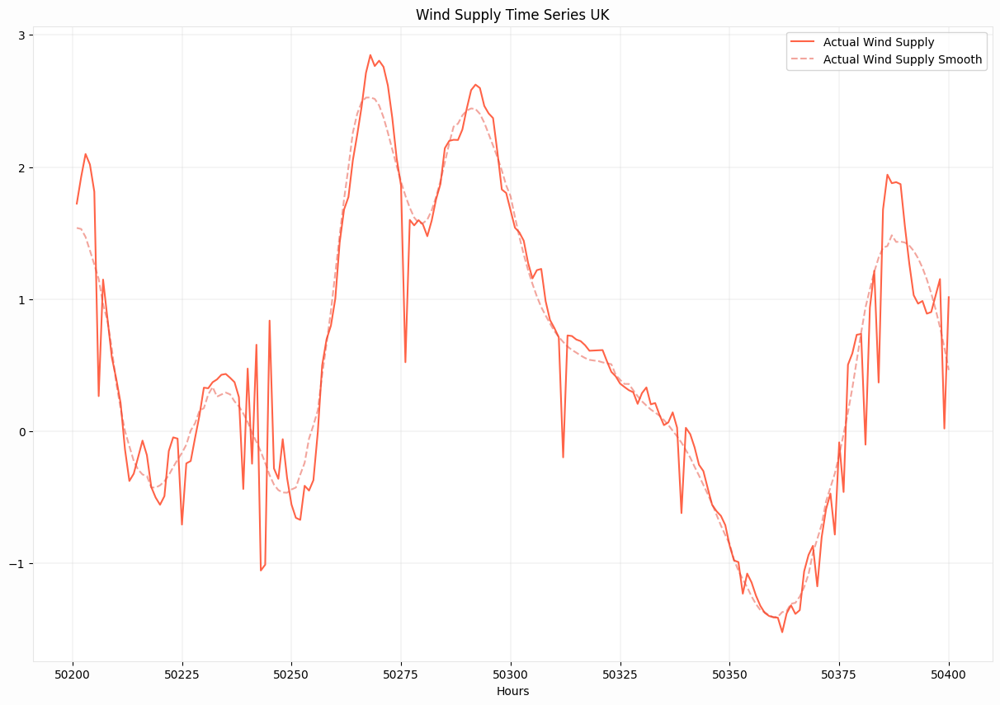

In [44]:
fig = plt.figure(figsize = (15,10))
ax = plt.axes()
plt.plot(range(len(lsw_data))[-200:],lsw_data['GB_GBN_wind_generation_actual_normalized'][-200:],label = 'Actual Wind Supply',color = 'tomato')
plt.plot(range(len(lsw_data))[-200:],lsw_data['GB_GBN_wind_generation_actual_normalized_smooth'][-200:], label = 'Actual Wind Supply Smooth',  linestyle = '--', color = '#E74C3C', alpha = 0.5)
plt.legend()
plot_cosmos(ax,'Hours','','Wind Supply Time Series UK')
plt.show()

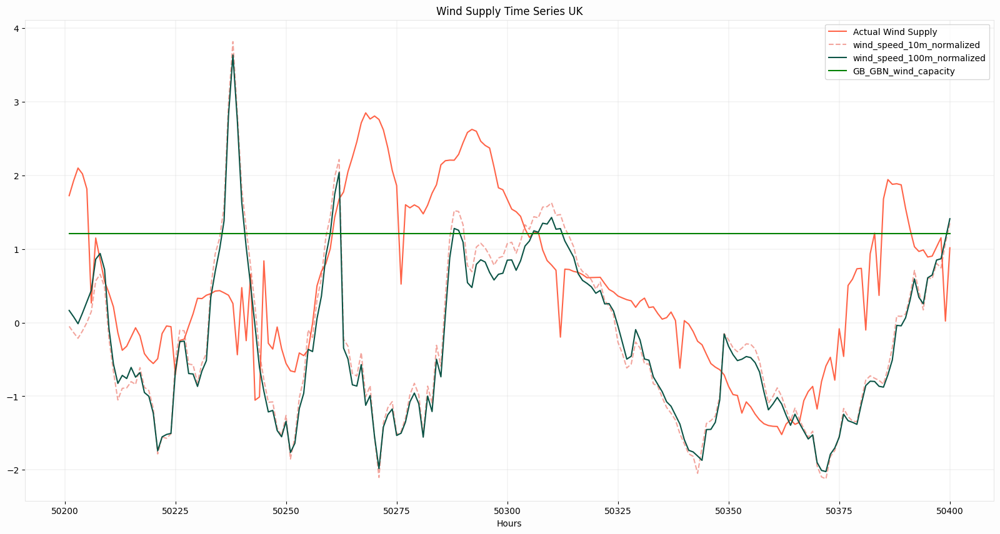

In [27]:
# @title Exploratory Data Analysis

fig = plt.figure(figsize = (20,10))
ax = plt.axes()
plt.plot(range(len(lsw_data))[-200:],lsw_data['GB_GBN_wind_generation_actual_normalized'][-200:],label = 'Actual Wind Supply',color = 'tomato')
plt.plot(range(len(lsw_data))[-200:],lsw_data['wind_speed_10m_normalized'][-200:], label = 'wind_speed_10m_normalized',  linestyle = '--', color = '#E74C3C', alpha = 0.5)
plt.plot(range(len(lsw_data))[-200:],lsw_data['wind_speed_100m_normalized'][-200:], label = 'wind_speed_100m_normalized', color = '#0B5345')
plt.plot(range(len(lsw_data))[-200:],lsw_data['GB_GBN_wind_capacity_normalized'][-200:], label = 'GB_GBN_wind_capacity', color = 'green')
plt.legend()
plot_cosmos(ax,'Hours','','Wind Supply Time Series UK')
plt.show()

In [ ]:
import pandas as pd
import pandas_gbq
from google.cloud import bigquery

# Set your BigQuery project ID and destination table
project_id = 'revx-259410'
destination_table = 'Avishek_Explore.wind_supply_weather_normalized_residual'

# Upload DataFrame to BigQuery
pandas_gbq.to_gbq(lsw_data, destination_table, project_id=project_id, if_exists='replace')

100%|██████████| 1/1 [00:00<00:00, 483.16it/s]


In [ ]:
# @title Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in FEATURES_LSW:
  corr_list.append(pearsonr(lsw_data[col],lsw_data['GB_GBN_load_actual_entsoe_transparency'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Load'])
corr_df.sort_values('Correlation with Load',ascending = True,inplace = True)
corr_df['Correlation with Load'] = corr_df['Correlation with Load'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Load'], color = 'tomato')
plot_cosmos(ax,'Correlation with Load','Features','Load Correlation Analysis')

In [ ]:
# @title Residual Percentage Features Importance Analysis
# @markdown Which features can help us determine Temperature accuartely?

from scipy.stats import pearsonr

# # Calculate Pearson correlation coefficient
# pearson_correlation, p_value = pearsonr(x, y)

# print("Pearson Correlation Coefficient:", pearson_correlation)
# print("P-value:", p_value)

corr_list = []
corr_col = []

for col in [c for c in lsw_data.columns if c.find('residual') > -1]:
  corr_list.append(pearsonr(lsw_data[col],lsw_data['GB_GBN_load_actual_entsoe_transparency'])[0])
  corr_col.append(col)

corr_df = pd.DataFrame(np.array([corr_col,corr_list]).T , columns = ['Features','Correlation with Load'])
corr_df.sort_values('Correlation with Load',ascending = True,inplace = True)
corr_df['Correlation with Load'] = corr_df['Correlation with Load'].astype(float)

fig = plt.figure(figsize = (15,40))
ax = plt.axes()
plt.barh(corr_df['Features'],corr_df['Correlation with Load'], color = '#B2BABB')
plot_cosmos(ax,'Correlation with Load','Features','Load Correlation Analysis')

In [ ]:
QUERY = f'''SELECT * FROM revx-259410.Avishek_Explore.wind_supply_weather_normalized_residual; '''
query_job = client.query(QUERY)  # API request
lsw_data = query_job.result().to_dataframe()

In [45]:
# Import label encoder
from sklearn import preprocessing

lsw_data['lat-lon'] = lsw_data['lat'].astype(str)+'-'+lsw_data['lon'].astype(str)

# label_encoder object knows
# how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'species'.
lsw_data['ll_label']= label_encoder.fit_transform(lsw_data['lat-lon'])

In [46]:
lsw_data.fillna(0, inplace = True)
lsw_data.replace([np.inf, -np.inf],0,inplace = True)
lsw_data_hour_mean = lsw_data.groupby(['ll_label','hour']).agg({'GB_GBN_wind_generation_actual_normalized' : 'mean'}).reset_index().rename(columns = {'GB_GBN_wind_generation_actual_normalized' : 'wind_supply_mean'})
lsw_data_hour_std = lsw_data.groupby(['ll_label','hour']).agg({'GB_GBN_wind_generation_actual_normalized' : 'std'}).reset_index().rename(columns = {'GB_GBN_wind_generation_actual_normalized' : 'wind_supply_std'})
lsw_data = pd.merge(lsw_data, lsw_data_hour_mean, on=['ll_label', 'hour'], how='left').fillna(0)
lsw_data = pd.merge(lsw_data, lsw_data_hour_std, on=['ll_label', 'hour'], how='left').fillna(0)

In [47]:
i = 0
for c in [c for c in lsw_data.columns if c.find('smooth') > -1 ]:
  i += 1
  print(f"'{c}'",end = ',')
  if i%5 == 0:
    print('')

'GB_GBN_load_actual_entsoe_transparency_smooth','GB_GBN_load_forecast_entsoe_transparency_smooth','GB_GBN_price_day_ahead_smooth','GB_GBN_solar_capacity_smooth','GB_GBN_solar_generation_actual_smooth',
'GB_GBN_solar_profile_smooth','GB_GBN_wind_capacity_smooth','GB_GBN_wind_generation_actual_smooth','GB_GBN_wind_profile_smooth','GB_GBN_wind_offshore_capacity_smooth',
'GB_GBN_wind_offshore_generation_actual_smooth','GB_GBN_wind_offshore_profile_smooth','GB_GBN_wind_onshore_capacity_smooth','GB_GBN_wind_onshore_generation_actual_smooth','GB_GBN_wind_onshore_profile_smooth',
'wind_supply_lag_1_smooth','wind_supply_lag_2_smooth','wind_supply_lag_3_smooth','wind_supply_lag_4_smooth','wind_supply_lag_5_smooth',
'wind_supply_lag_6_smooth','wind_supply_lag_d1_smooth','wind_supply_lag_d2_smooth','wind_supply_lag_d3_smooth','wind_supply_lag_d4_smooth',
'wind_supply_lag_d5_smooth','wind_supply_lag_d6_smooth','wind_supply_lag_d7_smooth','wind_supply_lag_w2_smooth','wind_supply_lag_w3_smooth',
'win

## Model Development

In [148]:
features_residual = [ 'wind_supply_lag_1_normalized_smooth','wind_supply_lag_2_normalized_smooth',
                     'wind_supply_lag_3_normalized_smooth','wind_supply_lag_4_normalized_smooth',
                      'wind_supply_lag_5_normalized_smooth', 'wind_supply_lag_6_normalized_smooth',
                      'wind_supply_lag_d1_normalized_smooth','wind_supply_lag_d2_normalized_smooth',
                      'wind_supply_lag_d3_normalized_smooth']

features_category =['wind_supply_lag_d1_normalized_smooth',
                    'wind_supply_lag_d2_normalized_smooth',
                    'wind_speed_100m_normalized_smooth']

features_category_forecast =['wind_supply_lag_d1_normalized_smooth',
                    'wind_supply_lag_d2_normalized_smooth',
                    'forecasted_wind_speed']
features_primary = [
                      'GB_GBN_wind_generation_actual_normalized_smooth'
                      ]
TARGET = [
                      'GB_GBN_wind_generation_actual_normalized_smooth'
                      ]

feature_keys = list(set(features_residual + features_category + features_primary + TARGET + features_category_forecast))

VOCABULARY_SIZE = 10
EMBEDDING_SIZE = 3
LATENT_DIM = 24
SEQ = 168
NUMERICAL_FEATURE_SIZE = len(features_residual)
PRIMARY_FEATURE_SIZE = len(features_primary)
NUM_VARS = len(features_category)
OUTPUT_DIM = len(TARGET)
LEARNING_RATE = 0.001
N_FUTURE = 24
TARGET_REPEAT = 1

BATCH_SIZE = 7
EPOCHS = 20
SAMPLE_SIZE = 180*3*24
STEPS = 1

TABLE_NAME = 'wind_supply_weather_normalized_smooth_residual'
CAT_SPLIT = 'll_label'
GCP_BUCKET = 'affle-ds'

In [149]:
lsw_data[features_residual].shape

(50401, 9)

In [150]:
len(features_residual)

9

In [151]:
# @title LSTM Model Supply

def create_global_wind_supply_forecast_24w_model_v1(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'supply_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(2, activation = 'tanh'), name = 'dense_historic')
        time_series_projection = dense_historic(time_series_projection)

        # time_series_futuristic = BatchNormalization(name = 'Batch_Normalization_2')(inputs[3])
        # time_series_futuristic = LSTM(latent_dim, return_sequences=True, name="LSTM_Futuristic")(time_series_futuristic)
        # dense_futuristic = TimeDistributed(Dense(2, activation = 'tanh'), name = 'dense_futuristic')
        # time_series_futuristic = dense_futuristic(time_series_futuristic)

        hf_concat= Concatenate(name = 'Concatenate_Historic_and_Futuristic_Inputs')([time_series_projection,inputs[3]])
        final_dense = TimeDistributed(Dense(1), name = 'output')
        output = final_dense(hf_concat)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'supply_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

In [160]:
def set_cloud_dirs(GCP_BUCKET, job_dir):
    relative_path = job_dir.split(GCP_BUCKET+"/")[1]
    output_path = relative_path+'/outputs/'
    log_path = relative_path+'/logs/profile/'
    return output_path, log_path
cloud_output_dir, cloud_log_dir = set_cloud_dirs(GCP_BUCKET, 'gs://affle-ds/avishek/body/Research/supply_forecast/experiment/supply_wind_global_all_campaign/local')

In [161]:
def get_callbacks(log_path, GCP_BUCKET):
    import tensorflow as tf

    def scheduler(epoch, lr):

        if epoch % 2 == 0:

            if lr >= 0.00001:

                return lr

            else:

                return 0.0001

        else:

            return lr

    cloud_log_dir = os.path.join("gs://", GCP_BUCKET, log_path)

    checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath="outputs/best_model.keras", verbose=1, save_best_only=True, monitor="val_rmse", mode="min")

    earlyStopper  = tf.keras.callbacks.EarlyStopping(
                                    monitor="val_rmse",
                                    min_delta=0.001,
                                    patience=5,
                                    verbose=0,
                                    mode="min",
                                    restore_best_weights = True
                                )

    LRScheduler = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=0)

    plateau = tf.keras.callbacks.ReduceLROnPlateau(
                                                                                                    monitor="val_rmse",
                                                                                                    factor=0.5,
                                                                                                    patience=1,
                                                                                                    verbose=0,
                                                                                                    mode="min",
                                                                                                    min_delta=0.01,
                                                                                                    cooldown=0,
                                                                                                    min_lr=0.00001,
                                                                                                )
#     csv_logger = tf.keras.callbacks.CSVLogger("outputs/history.log")

    return [checkpointer,earlyStopper,LRScheduler,plateau]


## Hyperparameter Tuning

In [ ]:
features_residual_smooth = [ 'wind_supply_lag_1_normalized_smooth','wind_supply_lag_2_normalized_smooth',
                     'wind_supply_lag_3_normalized_smooth','wind_supply_lag_4_normalized_smooth',
                      'wind_supply_lag_5_normalized_smooth', 'wind_supply_lag_6_normalized_smooth',
                      'wind_supply_lag_d1_normalized_smooth','wind_supply_lag_d2_normalized_smooth',
                      'wind_supply_lag_d3_normalized_smooth']

features_category_smooth =['wind_supply_lag_d1_normalized_smooth',
                    'wind_supply_lag_d2_normalized_smooth',
                    'wind_speed_100m_normalized_smooth']
features_primary_smooth = [
                      'GB_GBN_wind_generation_actual_normalized_smooth'
                      ]
TARGET_smooth = [
                      'GB_GBN_wind_generation_actual_normalized_smooth'
                      ]

feature_keys = list(set(features_residual_smooth + features_category_smooth + features_primary_smooth + TARGET_smooth))

wsup_hpt = gridrandomsearchcv(lsw_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

In [90]:
hp_df = pd.DataFrame(np.array(wsup_hpt).reshape(20,6), columns = ['sequence','batch','latent dim','dense unit','kfold','RMSE'])
hp_df = pd.concat([hp_df,pd.DataFrame([{'sequence':168.0,'batch':7.0,'latent dim':24.0,'dense unit':2.0,'kfold':3.0,'RMSE':0.6648387417231}])])
hp_df[hp_df['RMSE'] == hp_df['RMSE'].min()]

,sequence,batch,latent dim,dense unit,kfold,RMSE
0,168.0,7.0,24.0,2.0,3.0,0.664839


## Model Training

In [152]:
# QUERY = f'''SELECT * FROM Avishek_Explore.{TABLE_NAME} ORDER BY ll_label,date_hour; '''
# query_job = client.query(QUERY)  # API request
# weather_data = query_job.result().to_dataframe()

In [153]:
# list(weather_data.columns)

In [154]:
lsw_data['date_hour'].min(),lsw_data['date_hour'].max()

(Timestamp('2014-12-31 23:00:00+0000', tz='UTC'),
 Timestamp('2020-09-30 23:00:00+0000', tz='UTC'))

In [155]:
train_start_date = '2018-01-01'
train_end_date = '2020-07-31'
eval_end_date = '2020-08-31'
lsw_data['ll_label'] = 0
lsw_data['hour'] = lsw_data['hour'].astype(int)
train_df, eval_df = lsw_data[(lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)][feature_keys+['ll_label','date_hour']], \
                                       lsw_data[(lsw_data['date_hour'] > train_end_date) & (lsw_data['date_hour'] <= eval_end_date)][feature_keys+['ll_label','date_hour']]

test_df = lsw_data[lsw_data['date_hour'] > eval_end_date][feature_keys+['ll_label','date_hour']]

In [156]:
# from statsmodels.tsa.holtwinters import ExponentialSmoothing

# # Fit the model
# model_exp_train = ExponentialSmoothing(train_df[TARGET[0]], trend='add')
# fit = model_exp_train.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[TARGET[0]] = fit.fittedvalues

# model_exp_train_norm = ExponentialSmoothing(train_df[features_primary[0]], trend='add')
# fit = model_exp_train_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# train_df[features_primary[0]] = fit.fittedvalues

# model_exp_eval = ExponentialSmoothing(eval_df[TARGET[0]], trend='add')
# fit = model_exp_eval.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[TARGET[0]] = fit.fittedvalues

# model_exp_eval_norm = ExponentialSmoothing(eval_df[features_primary[0]], trend='add')
# fit = model_exp_eval_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# eval_df[features_primary[0]] = fit.fittedvalues

# model_exp_test = ExponentialSmoothing(test_df[TARGET[0]], trend='add')
# fit = model_exp_test.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[TARGET[0]] = fit.fittedvalues

# model_exp_test_norm = ExponentialSmoothing(test_df[features_primary[0]], trend='add')
# fit = model_exp_test_norm.fit(smoothing_level=0.5, smoothing_slope=0.5, optimized=True)
# test_df[features_primary[0]] = fit.fittedvalues

In [157]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22609 entries, 26305 to 48913
Data columns (total 13 columns):
 #   Column                                           Non-Null Count  Dtype              
---  ------                                           --------------  -----              
 0   wind_supply_lag_1_normalized_smooth              22609 non-null  float64            
 1   wind_supply_lag_d1_normalized_smooth             22609 non-null  float64            
 2   wind_supply_lag_5_normalized_smooth              22609 non-null  float64            
 3   wind_supply_lag_3_normalized_smooth              22609 non-null  float64            
 4   wind_supply_lag_4_normalized_smooth              22609 non-null  float64            
 5   wind_supply_lag_d3_normalized_smooth             22609 non-null  float64            
 6   GB_GBN_wind_generation_actual_normalized_smooth  22609 non-null  float64            
 7   wind_speed_100m_normalized_smooth                22609 non-null  float64     

In [158]:
# ,4,5,6,7,8,9

eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS,target_repeater = TARGET_REPEAT)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS,target_repeater = TARGET_REPEAT)

X_test,y_test,_ = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

# y_test = y_test.reshape(len(y_test)*N_FUTURE,1)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 23/23 [00:00<00:00, 461.30it/s]


(1851, 78, 78)

In [159]:
X_test[0].shape

(23, 168, 9)

In [162]:
try:
  del history_lf
  del model_load_forecast
except Exception as e:
  print("Model does not exist")

Model does not exist


In [ ]:
wind_supply_hpt = gridrandomsearchcv(weather_data,4, [1,32], [1,128],[24,168],[7,30],3, 20,3)

Model: "supply_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ supply_input (InputLayer) │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 24)             │          2,496 │ supply_input[0][0]     │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 24)         │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 24)         │          4,704 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_historic            │ (None, 24, 2)          │             50 │ LSTM_Historic_Future_… │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 3)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Historic_and… │ (None, 24, 5)          │              0 │ dense_historic[0][0],  │
│ (Concatenate)             │                        │                │ forecast_aggregated_i… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 168, 9)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 3)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              6 │ Concatenate_Historic_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 7,256 (28.34 KB)

 Trainable params: 7,256 (28.34 KB)

 Non-trainable params: 0 (0.00 B)

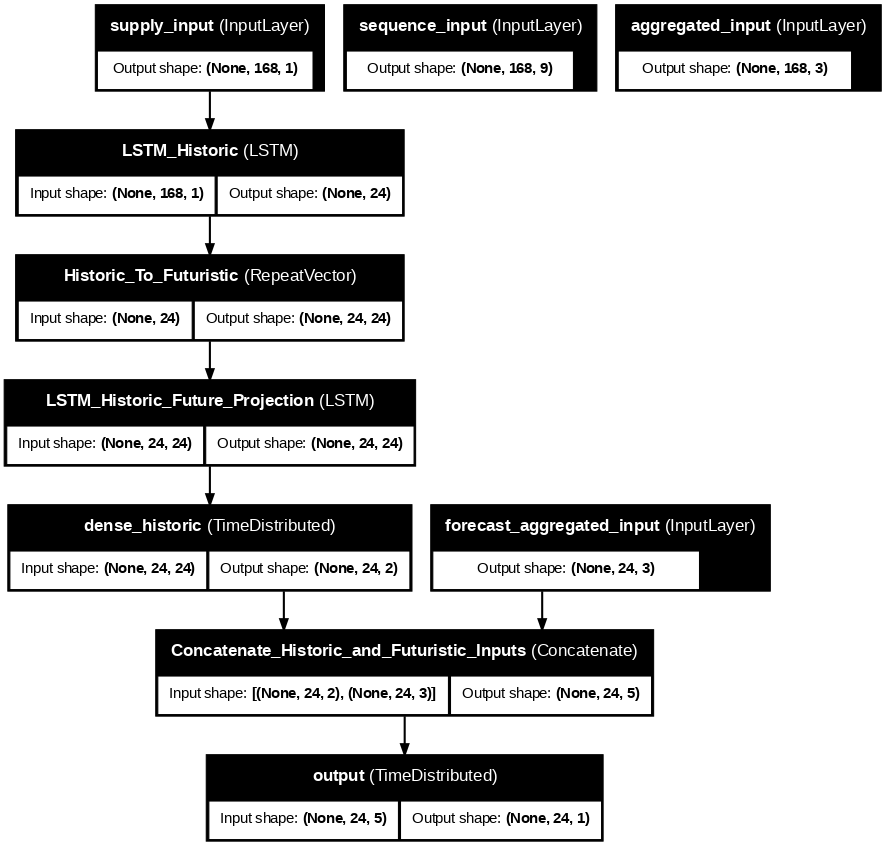

In [163]:
import tensorflow as tf

model_wind_forecast = create_global_wind_supply_forecast_24w_model_v1(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE
                                                            )

model_wind_forecast.summary()

tf.keras.utils.plot_model(
    model_wind_forecast,
    to_file='model.png',
    show_layer_names=True,
    show_shapes=True,
    dpi=75)

In [164]:
history_wf = model_wind_forecast.fit(
            train_loader,
            epochs=EPOCHS,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/20
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.8651 - rmse: 0.9143
Epoch 1: val_rmse improved from inf to 0.72767, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 102s 53ms/step - loss: 0.8650 - rmse: 0.9143 - val_loss: 0.5295 - val_rmse: 0.7277 - learning_rate: 0.0010
Epoch 2/20
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.4132 - rmse: 0.6413
Epoch 2: val_rmse improved from 0.72767 to 0.71721, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 91s 49ms/step - loss: 0.4132 - rmse: 0.6413 - val_loss: 0.5144 - val_rmse: 0.7172 - learning_rate: 0.0010
Epoch 3/20
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.3718 - rmse: 0.6090
Epoch 3: val_rmse improved from 0.71721 to 0.70963, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 87s 47ms/step - loss: 0.3718 - rmse: 0.6090 - val_loss: 0.5036 - val_rmse: 0.7096 - learning_rate: 0.0010
Epoch 4/20
1850/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - l

## Model Evaluation

100%|██████████| 23/23 [00:00<00:00, 445.53it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step


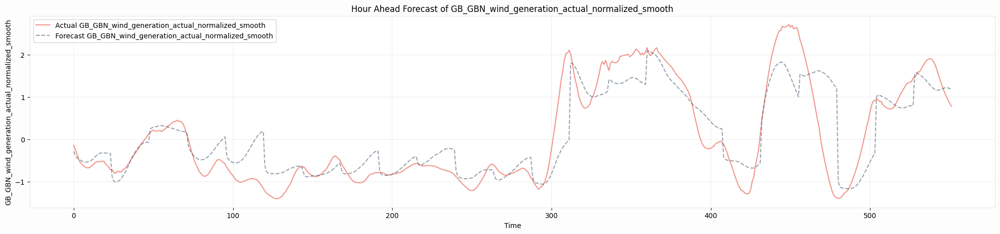

In [165]:
X_eval,y_eval,_ = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] ,
                                                            features_residual,
                                                            features_primary,
                                                            TARGET ,
                                                            SEQ ,
                                                            BATCH_SIZE,
                                                            features_category_forecast,
                                                            N_FUTURE,
                                                            EPOCHS,
                                                            CAT_SPLIT)
y_pred_24wt = model_wind_forecast.predict(X_eval)
y_eval_actual = y_eval[:,:,0].reshape(len(y_eval)*N_FUTURE,OUTPUT_DIM)
# y_eval_forecast = y_eval[:,:,1].reshape(len(y_eval)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_eval_actual)),y_eval_actual, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E',linestyle = '--',alpha = 0.5)
# ax.plot(range(len(y_eval_forecast))[-120:],y_eval_forecast[-120:], label = f'Forecast Previous {TARGET[0]}', color = '#CB4335',linestyle = '--')

plot_cosmos(ax,'Time',TARGET[0],f'Hour Ahead Forecast of {TARGET[0]}')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



100%|██████████| 23/23 [00:00<00:00, 386.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


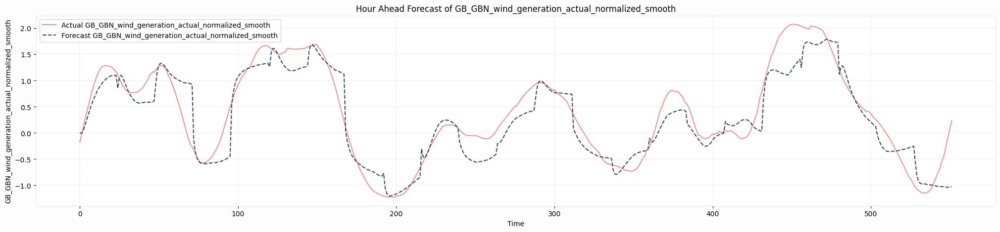

In [319]:
X_test,y_test,_ = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] ,
                                                            features_residual,
                                                            features_primary,
                                                            TARGET ,
                                                            SEQ ,
                                                            BATCH_SIZE,
                                                            features_category_forecast,
                                                            N_FUTURE,
                                                            EPOCHS,
                                                            CAT_SPLIT)
y_pred_24wt = model_wind_forecast.predict(X_test)
y_test_actual = y_test[:,:,0].reshape(len(y_test)*N_FUTURE,OUTPUT_DIM)
# y_test_forecast = y_test[:,:,1].reshape(len(y_test)*N_FUTURE,OUTPUT_DIM)
y_pred_24wt = y_pred_24wt.reshape(len(y_pred_24wt)*N_FUTURE,OUTPUT_DIM)

fig,ax = plt.subplots(1,1,figsize = (25,5))

# ax = plt.axes()
ax.plot(range(len(y_test_actual)),y_test_actual, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wt)),y_pred_24wt, label = f'Forecast {TARGET[0]}', color = '#34495E',linestyle = '--')
# ax.plot(range(len(y_test_forecast)),y_test_forecast, label = f'Forecast Previous {TARGET[0]}', color = '#CB4335',linestyle = '--')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Hour Ahead Forecast of {TARGET[0]}')

plt.show()



## Model Comparison

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/WindSupply/models/WindSupply_0_forecast_ARIMA.pkl, None>
File WindSupply_0_forecast_ARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/WindSupply/models/WindSupply_0_forecast_ARIMA.pkl.


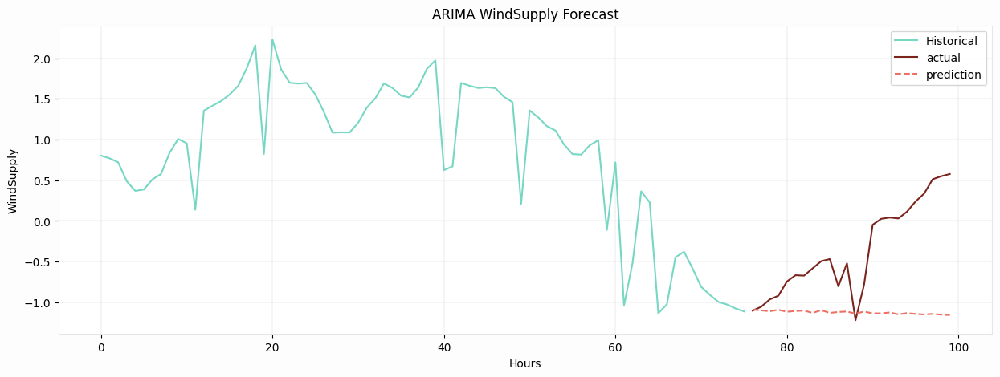

In [ ]:
# @title ARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
# train_start_date_stats = "2023-06-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)]
  arima_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_wind_generation_actual_normalized'].iloc[:-24]),
                                order=(7, 3, 7),
                                seasonal_order=(0, 0, 0, 0)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_arima = arima_model.fit(disp=True)

  with open(f'WindSupply_{ll}_forecast_ARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_arima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/WindSupply/models/WindSupply_{ll}_forecast_ARIMA.pkl'

  source_file_name = f'WindSupply_{ll}_forecast_ARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_arima.summary()
# Make predictions
predictions_arima = sarimax_fit_arima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), predictions_arima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','WindSupply','ARIMA WindSupply Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_0_forecast_SARIMAA.pkl, None>
File WindSpeed_0_forecast_SARIMA.pkl uploaded to avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_0_forecast_SARIMAA.pkl.


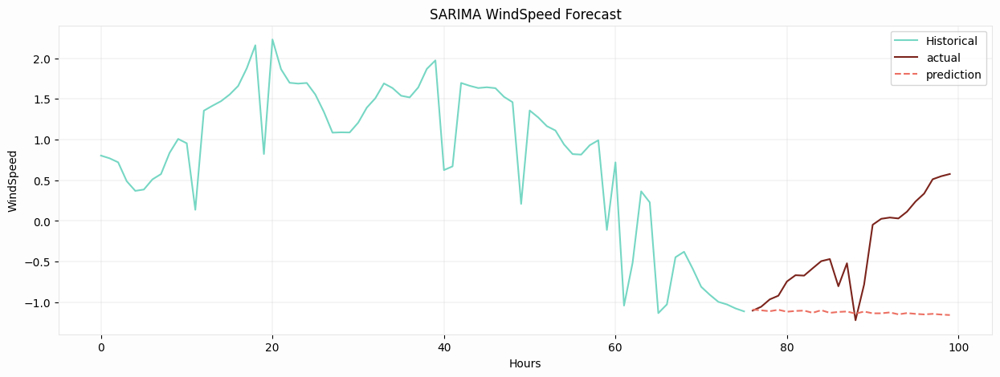

In [ ]:
# @title SARIMA modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
# train_start_date_stats = "2023-01-01"
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)]
  sarima_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_wind_generation_actual_normalized'].iloc[:-24]),
                                order=(7, 3, 7),
                                seasonal_order=(0, 0, 0, 365*24)
                                # exog=np.array(temp[['relative_humidity_2m','et0_fao_evapotranspiration','vapour_pressure_deficit']].iloc[-2000:-24,:])
                                )
  sarimax_fit_sarima = sarima_model.fit(disp=True)

  with open(f'WindSpeed_{ll}_forecast_SARIMA.pkl', 'wb') as file:
      pickle.dump(sarimax_fit_sarima, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/WindSpeed/models/WindSpeed_{ll}_forecast_SARIMAA.pkl'

  source_file_name = f'WindSpeed_{ll}_forecast_SARIMA.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit_sarima.summary()
# Make predictions
predictions_sarima = sarimax_fit_sarima.forecast(steps=24)
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), predictions_sarima, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','WindSpeed','SARIMA WindSpeed Forecast')
plt.legend()
plt.show()

<Blob: affle-ds, avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast.pkl, None>
File Solar Power_0_forecast.pkl uploaded to avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_0_forecast.pkl.


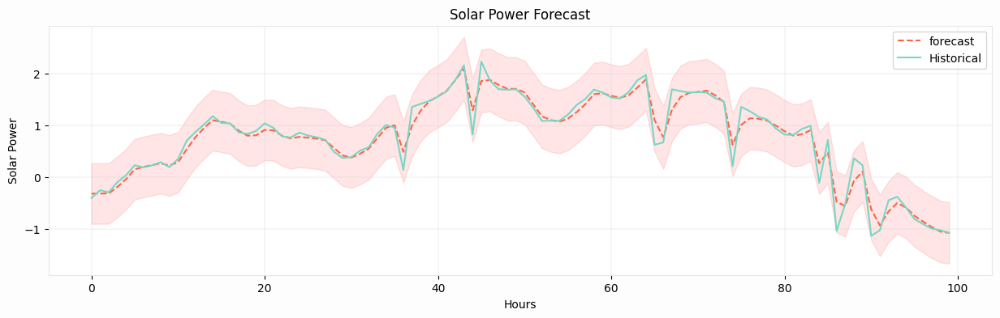

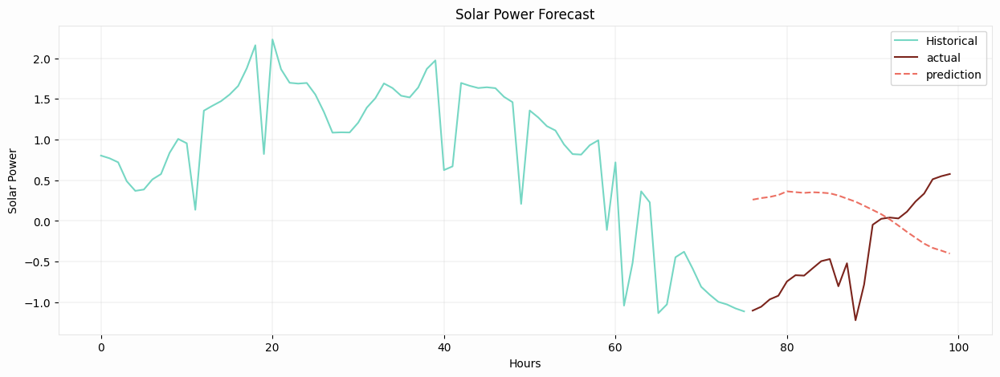

In [ ]:
# @title SARIMAX modeling
import statsmodels.api as sm


# Get unique latitude and longitude combinations
unique_locations = lsw_data['ll_label'].unique()
# Fit a SARIMAX model
i = 0
for ll in unique_locations:
  temp = lsw_data[(lsw_data['ll_label'] == ll) & (lsw_data['date_hour'] <= train_end_date) & (lsw_data['date_hour'] >= train_start_date)]
  sarimax_model = sm.tsa.SARIMAX(np.array(temp['GB_GBN_wind_generation_actual_normalized'].iloc[1:-24]),
                                order=(7, 1, 7),
                                seasonal_order=(0, 0, 0, 365*24),
                                enforce_stationarity=True,
                                enforce_invertibility=True,
                                time_varying_regression = True,
                                mle_regression = False,
                                exog=np.array(temp[['wind_speed_10m_normalized_smooth','wind_speed_100m_normalized_smooth']].iloc[0:-25,:]))
  sarimax_fit = sarimax_model.fit(disp=True)

  with open(f'Solar Power_{ll}_forecast.pkl', 'wb') as file:
      pickle.dump(sarimax_model, file)

  bucket_name = 'affle-ds'

  destination_blob_name = f'avishek/body/Research/weather_forecast/experiment/Solar Power/models/Solar Power_{ll}_forecast.pkl'

  source_file_name = f'Solar Power_{ll}_forecast.pkl'

  upload_to_gcs(bucket_name, source_file_name, destination_blob_name)
  i += 1
  if i > 0:
    break
sarimax_fit.summary()
res = sarimax_model.filter(sarimax_fit.params)
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# In-sample one-step-ahead predictions
predict = res.get_prediction()
predict_ci = predict.conf_int()
# Graph
fig, ax = plt.subplots(figsize=(15,4))
npre = 4

# Plot predictions
# predict.predicted_mean[-100:].plot(ax=ax, style='r--', label='One-step-ahead forecast')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:])), predict.predicted_mean[-100:], color = 'tomato', label = 'forecast', linestyle = '--')
ci = predict_ci[-100:]
ax.fill_between(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:])), ci[:,0], ci[:,1], color='r', alpha=0.1)
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-125:-25], color = '#76D7C4', label = 'Historical')
legend = ax.legend(loc='lower right')
plot_cosmos(ax,'Hours','Solar Power','Solar Power Forecast')
plt.legend()
plt.show()
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['wind_speed_10m_normalized_smooth','wind_speed_100m_normalized_smooth']].iloc[-48:-24,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['wind_speed_10m_normalized_smooth','wind_speed_100m_normalized_smooth']].iloc[-48:-24,:])
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Solar Power','Solar Power Forecast')
plt.legend()
plt.show()

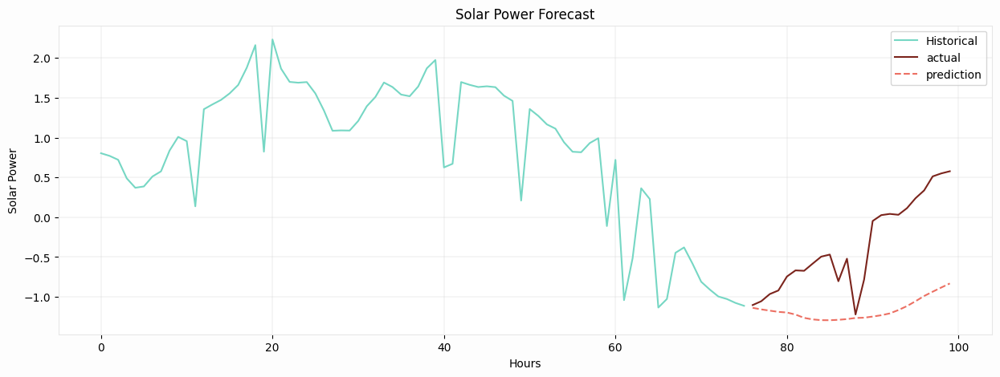

In [ ]:
# Make predictions
predictions = sarimax_fit.forecast(steps=24, exog = temp[['wind_speed_10m_normalized_smooth','wind_speed_100m_normalized_smooth']].iloc[-24:,:])
predict = sarimax_fit.predict(steps=24, exog = temp[['wind_speed_10m_normalized_smooth','wind_speed_100m_normalized_smooth']].iloc[-24:,:])
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24], color = '#76D7C4', label = 'Historical')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24]),len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-100:-24])+len(temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:])), predictions, color = '#EC7063', label = 'prediction', linestyle = '--')
plot_cosmos(ax,'Hours','Solar Power','Solar Power Forecast')
plt.legend()
plt.show()

In [ ]:
# @title LSTM Model GHI Base


def create_lstm_wsp(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'wsp_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        # time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = LSTM(latent_dim, return_sequences=False, name="LSTM_Historic")(inputs[1])
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = LSTM(latent_dim, return_sequences=True, name="LSTM_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'wsp_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "wsp_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ wsp_input (InputLayer)    │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic (LSTM)      │ (None, 3)              │             60 │ wsp_input[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 3)          │              0 │ LSTM_Historic[0][0]    │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ LSTM_Historic_Future_Pro… │ (None, 24, 3)          │             84 │ Historic_To_Futuristi… │
│ (LSTM)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequence_input            │ (None, 168, 88)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 8)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 8)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              4 │ LSTM_Historic_Future_… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 148 (592.00 B)

 Trainable params: 148 (592.00 B)

 Non-trainable params: 0 (0.00 B)

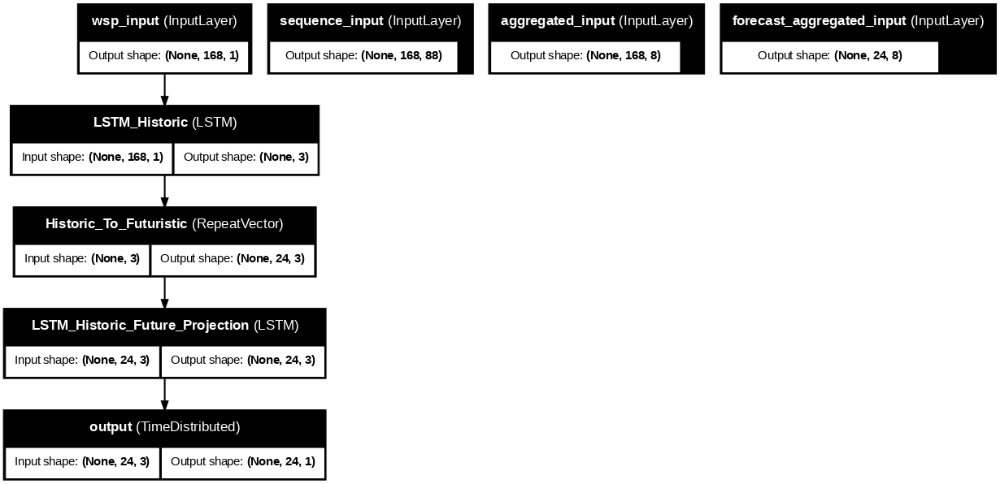

In [ ]:
import tensorflow as tf

model_bpp_lstm = create_lstm_wsp(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_lstm.summary()

tf.keras.utils.plot_model(
    model_bpp_lstm,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
eval_loader = timeseries_generator_by_category_24w(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

train_loader = timeseries_generator_by_category_24w(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])], features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_loader = timeseries_generator_by_category_24w(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)

validation_steps = get_steps_per_epoch(eval_df[eval_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch = get_steps_per_epoch(train_df[train_df['ll_label'].isin([0,4,5,6,7,8,9])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,sample_size = SAMPLE_SIZE,steps = STEPS)

test_epoch = get_steps_per_epoch(test_df[test_df['ll_label'].isin([0,4,5,6,7,8,9])]  , features_residual,features_primary, TARGET , SEQ , BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT,steps = STEPS)

steps_per_epoch, validation_steps, test_epoch

100%|██████████| 23/23 [00:00<00:00, 242.44it/s]


(1851, 78, 78)

In [ ]:
history_bpp_lstm = model_bpp_lstm.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 0.4269 - rmse: 0.6481
Epoch 1: val_rmse improved from inf to 0.64917, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 161s 83ms/step - loss: 0.4269 - rmse: 0.6481 - val_loss: 0.4214 - val_rmse: 0.6492 - learning_rate: 0.0010
Epoch 2/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.2323 - rmse: 0.4813
Epoch 2: val_rmse improved from 0.64917 to 0.60918, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 156s 84ms/step - loss: 0.2323 - rmse: 0.4813 - val_loss: 0.3711 - val_rmse: 0.6092 - learning_rate: 0.0010
Epoch 3/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 0.2042 - rmse: 0.4510
Epoch 3: val_rmse improved from 0.60918 to 0.58027, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 155s 84ms/step - loss: 0.2042 - rmse: 0.4510 - val_loss: 0.3367 - val_rmse: 0.5803 - learning_rate: 0.0010
Epoch 4/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step -

In [ ]:
# X_train,y_train,d_train = timeseries_generator_by_category_24w_test(train_df[train_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
# y_pred_24wtl = model_bpp_lstm.predict(X_train)
# y_train = y_train.reshape(len(y_train)*N_FUTURE,1)
# y_pred_24wtl = y_pred_24wtl.reshape(len(y_pred_24wtl)*N_FUTURE,1)

# fig,ax = plt.subplots(1,1,figsize = (25,5))
# # ax = plt.axes()
# ax.plot(range(len(y_train)),y_train, label = f'Actual {TARGET[0]}', color = '#F1948A')
# ax.plot(range(len(y_pred_24wtl)),y_pred_24wtl, label = f'Forecast {TARGET[0]}', color = '#34495E')

# plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
# ax.legend()

# ax.set_xlabel('Time')
# ax.set_ylabel(TARGET[0])
# ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

# plt.show()

 70%|██████▉   | 650/935 [00:25<00:13, 20.45it/s]

100%|██████████| 23/23 [00:00<00:00, 335.26it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


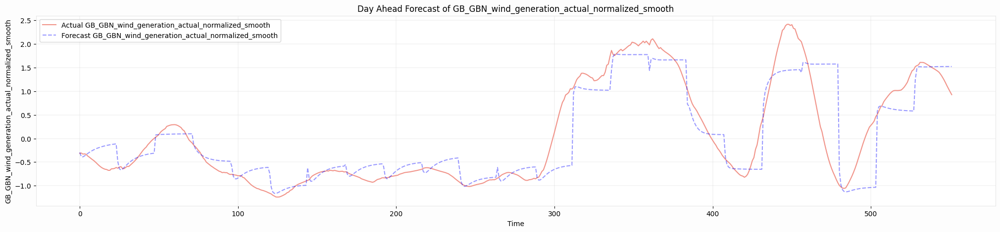

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wel = model_bpp_lstm.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24wel = y_pred_24wel.reshape(len(y_pred_24wel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wel)),y_pred_24wel, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24wel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

100%|██████████| 23/23 [00:00<00:00, 299.43it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


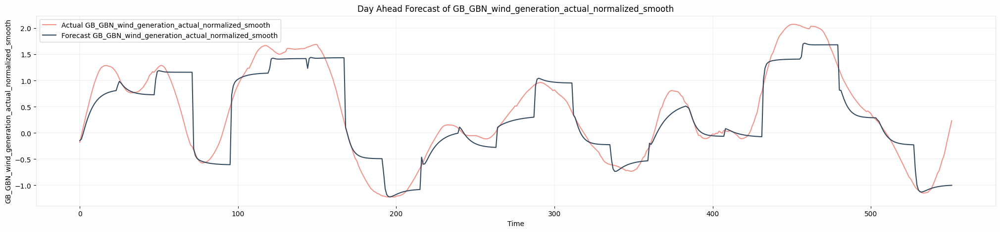

In [ ]:
X_test,y_test,d_test = timeseries_generator_by_category_24w_test(test_df[test_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24wtel = model_bpp_lstm.predict(X_test)
y_test = y_test.reshape(len(y_test)*N_FUTURE,1)
y_pred_24wtel = y_pred_24wtel.reshape(len(y_pred_24wtel)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_test)),y_test, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24wtel)),y_pred_24wtel, label = f'Forecast {TARGET[0]}', color = '#34495E')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

test_prediction_df = pd.DataFrame(np.array([d_test.reshape(1,-1).tolist()[0],y_pred_24wtel.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

In [ ]:
# @title GRU Model ws Base


def create_gru_ws(
                                                  vocabulary_size,
                                                  embedding_size,
                                                  latent_dim,
                                                  seq,
                                                  numerical_feature_size,
                                                  primary_feature_size,
                                                  num_vars,
                                                  output_dim,
                                                  learning_rate,
                                                  n_future,
                                                  dense_unit
                                                        ):


    import tensorflow as tf
    from tensorflow.keras.layers import Embedding, Dense, Flatten, Dropout, BatchNormalization,Dot,LSTM,RepeatVector,TimeDistributed,Concatenate,Reshape,GRU,LayerNormalization
    from tensorflow.keras import Sequential, regularizers
    from tensorflow.keras.constraints import NonNeg
    from tensorflow.python.framework import dtypes
    from tensorflow.keras.regularizers import l2


    def custom_loss(y_true, y_pred):

            # You can use the mean value or any other property of the input tensor
            # in the loss computation
            loss1 = tf.keras.losses.MeanSquaredLogarithmicError(reduction="auto", name="mean_squared_logarithmic_error")
            loss2 = tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")

            return 0.2*loss2 + loss1


    class ScalingLayer(tf.keras.layers.Layer):
        def __init__(self, scale_factor, **kwargs):
            super(ScalingLayer, self).__init__(**kwargs)
            self.scale_factor = scale_factor

        def call(self, inputs):
            expanded_inputs = tf.expand_dims(inputs, axis=-1)
            inl = []
            j = 0
            for i in self.scale_factor:
                inl.append(tf.divide(tf.subtract(expanded_inputs[:, j],i[1]), i[0]))
                j += 1
            scaled_inputs = tf.concat(inl, axis=1)
            return scaled_inputs

        def get_config(self):
            config = super(ScalingLayer, self).get_config()
            config['scale_factor'] = self.scale_factor
            return config

    def _create_model():

        # Define input layers

        input_1 = tf.keras.layers.Input(shape=(seq,numerical_feature_size),name = 'sequence_input')
        input_2 = tf.keras.layers.Input(shape=(seq,primary_feature_size),name = 'ws_input')
        input_3 = tf.keras.layers.Input(shape=(seq,num_vars),name = 'aggregated_input')
        input_4 = tf.keras.layers.Input(shape=(n_future,num_vars),name = 'forecast_aggregated_input')

        inputs = (input_1,input_2, input_3,input_4)

        # z_value = (inputs[1] - tf.expand_dims(inputs[2][:, :, 0], axis=-1))/tf.expand_dims(inputs[2][:, :, 1], axis=-1)

        # LSTM for temp_input

        time_series_historic = Concatenate(name = 'Concatenate_Residuals_and_Aggregated_Inputs')([inputs[0],inputs[1],inputs[2]])
        # time_series_historic = BatchNormalization(name = 'Batch_Normalization_1')(time_series_historic)
        time_series_historic = GRU(latent_dim, return_sequences=False, name="GRU_Historic")(time_series_historic)
        time_series_projection = RepeatVector(n_future, name = 'Historic_To_Futuristic')(time_series_historic)
        time_series_projection = GRU(latent_dim, return_sequences=True, name="GRU_Historic_Future_Projection")(time_series_projection)
        dense_historic = TimeDistributed(Dense(1),  name = 'output')
        output = dense_historic(time_series_projection)

        model = tf.keras.Model(inputs=inputs,outputs=output,name = 'ws_forecast')

        return model

    model = _create_model()

    METRICS = []; METRICS.append(tf.keras.metrics.RootMeanSquaredError(name="rmse"));

    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate),
                  loss = {
                          'output': 'mse'
                          } ,
                  metrics={
                          'output': tf.keras.metrics.RootMeanSquaredError(name="rmse")
                          })

    return model

Model: "ws_forecast"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ sequence_input            │ (None, 168, 88)        │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ws_input (InputLayer)     │ (None, 168, 1)         │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ aggregated_input          │ (None, 168, 8)         │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Concatenate_Residuals_an… │ (None, 168, 97)        │              0 │ sequence_input[0][0],  │
│ (Concatenate)             │                        │                │ ws_input[0][0],        │
│                           │                        │                │ aggregated_input[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic (GRU)        │ (None, 3)              │            918 │ Concatenate_Residuals… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Historic_To_Futuristic    │ (None, 24, 3)          │              0 │ GRU_Historic[0][0]     │
│ (RepeatVector)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ GRU_Historic_Future_Proj… │ (None, 24, 3)          │             72 │ Historic_To_Futuristi… │
│ (GRU)                     │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ forecast_aggregated_input │ (None, 24, 8)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ output (TimeDistributed)  │ (None, 24, 1)          │              4 │ GRU_Historic_Future_P… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 994 (3.88 KB)

 Trainable params: 994 (3.88 KB)

 Non-trainable params: 0 (0.00 B)

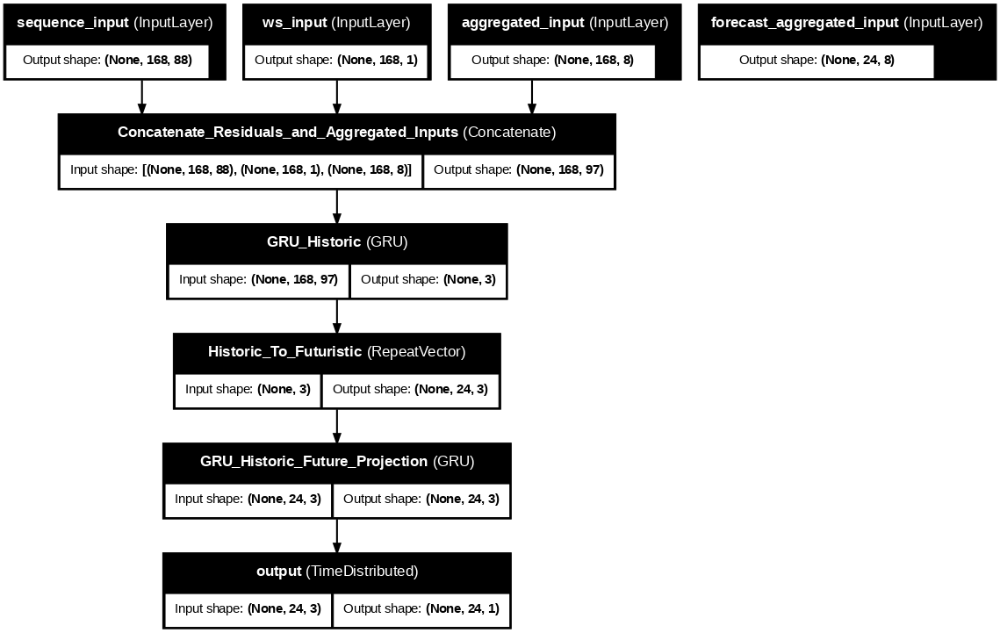

In [ ]:
import tensorflow as tf

model_bpp_gru = create_gru_ws(
                                                        VOCABULARY_SIZE,
                                                        EMBEDDING_SIZE,
                                                        LATENT_DIM,
                                                        SEQ,
                                                        NUMERICAL_FEATURE_SIZE,
                                                        PRIMARY_FEATURE_SIZE,
                                                        NUM_VARS,
                                                        OUTPUT_DIM,
                                                        LEARNING_RATE,
                                                        N_FUTURE,
                                                        2
                                                            )

model_bpp_gru.summary()

tf.keras.utils.plot_model(
    model_bpp_gru,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=True,
    dpi=75)

In [ ]:
history_bpp_gru = model_bpp_gru.fit(
            train_loader,
            epochs=10,
            verbose=1,
            validation_data = eval_loader,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            callbacks= get_callbacks(cloud_log_dir, GCP_BUCKET)
            )

Epoch 1/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.4615 - rmse: 0.6762
Epoch 1: val_rmse improved from inf to 0.68541, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 176s 91ms/step - loss: 0.4615 - rmse: 0.6762 - val_loss: 0.4698 - val_rmse: 0.6854 - learning_rate: 0.0010
Epoch 2/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.2938 - rmse: 0.5407
Epoch 2: val_rmse improved from 0.68541 to 0.67480, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 168s 91ms/step - loss: 0.2939 - rmse: 0.5407 - val_loss: 0.4554 - val_rmse: 0.6748 - learning_rate: 0.0010
Epoch 3/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.2696 - rmse: 0.5175
Epoch 3: val_rmse improved from 0.67480 to 0.66795, saving model to outputs/best_model.keras
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 175s 95ms/step - loss: 0.2696 - rmse: 0.5175 - val_loss: 0.4462 - val_rmse: 0.6679 - learning_rate: 0.0010
Epoch 4/10
1851/1851 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step -

100%|██████████| 23/23 [00:00<00:00, 295.13it/s]


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 747ms/step


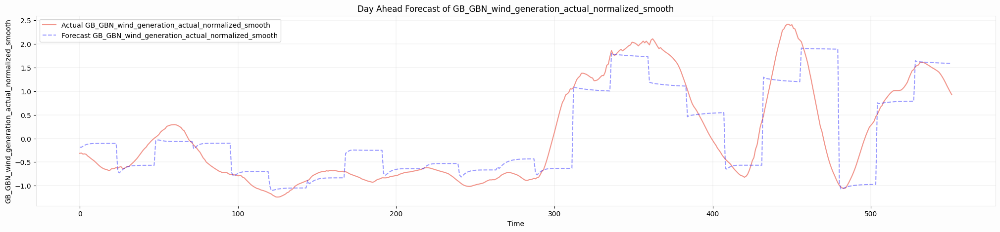

In [ ]:
X_eval,y_eval,d_eval = timeseries_generator_by_category_24w_test(eval_df[eval_df['ll_label'].isin([0])] , features_residual,features_primary, TARGET , SEQ ,BATCH_SIZE, features_category,N_FUTURE,EPOCHS,CAT_SPLIT)
y_pred_24weg = model_bpp_gru.predict(X_eval)
y_eval = y_eval.reshape(len(y_eval)*N_FUTURE,1)
y_pred_24weg = y_pred_24weg.reshape(len(y_pred_24weg)*N_FUTURE,1)

fig,ax = plt.subplots(1,1,figsize = (25,5))
# ax = plt.axes()
ax.plot(range(len(y_eval)),y_eval, label = f'Actual {TARGET[0]}', color = '#F1948A')
ax.plot(range(len(y_pred_24weg)),y_pred_24weg, label = f'Forecast {TARGET[0]}', color = 'blue', linestyle = '--', alpha = 0.4)
# ax.plot(range(len(y_pred_24we)),y_pred_24we, label = f'Proposed Architecture Forecast {TARGET[0]}', color = 'green')

plot_cosmos(ax,'Time','GHI',f'GHI Forecast')
ax.legend()

ax.set_xlabel('Time')
ax.set_ylabel(TARGET[0])
ax.set_title(f'Day Ahead Forecast of {TARGET[0]}')

plt.show()

eval_prediction_df = pd.DataFrame(np.array([d_eval.reshape(1,-1).tolist()[0],y_pred_24weg.reshape(1,-1).tolist()[0]]).T,columns = ['date_hour','ghi_forecast'])

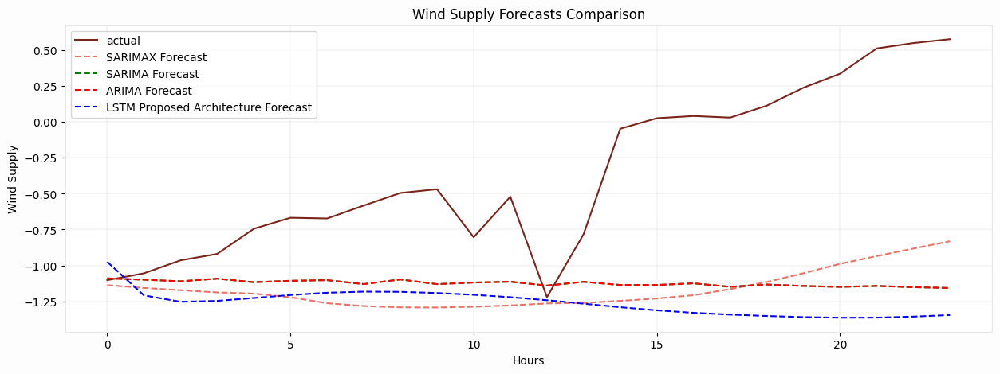

In [ ]:
fig = plt.figure(figsize = (15,5))
ax = plt.axes()
plt.plot(range(24), temp['GB_GBN_wind_generation_actual_normalized'].iloc[-24:], color = '#7B241C', label = 'actual')
plt.plot(range(24), predictions, color = '#EC7063',  linestyle = '--', label = 'SARIMAX Forecast')
plt.plot(range(24), predictions_sarima, color = 'green', linestyle = '--', label = 'SARIMA Forecast')
plt.plot(range(24), predictions_arima, color = 'red', linestyle = '--', label = 'ARIMA Forecast')
plt.plot(range(24), y_pred_24wt[-24:], color = 'blue', linestyle = '--', label = 'LSTM Proposed Architecture Forecast')
plot_cosmos(ax,'Hours','Wind Supply','Wind Supply Forecasts Comparison')
plt.legend()
plt.show()

In [321]:
# @title Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
# from dtw import *

# Mean Squared Error (MSE)
mse = mean_squared_error(y_test_actual, y_pred_24wt)
print(f'MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_actual, y_pred_24wt)
print(f'MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_test_actual - y_pred_24wt) / y_test_actual)) * 100
print(f'MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_test_actual) - np.min(y_test_actual))
print(f'NRMSE: {nrmse}')

MSE: 0.11021637987728579
RMSE: 0.33198852371322385
MAE: 0.24901357100915453
MAPE: 281.16073133802576%
NRMSE: 0.10056838619781022


In [ ]:
# @title Statistical Models Evaluation Metrics

import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:], predictions)
print(f'SARIMAX MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMAX RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:], predictions)
print(f'SARIMAX MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:] - predictions) / temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:])) * 100
print(f'SARIMAX MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:]) - np.min(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:]))
print(f'SARIMAX NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'SARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:], predictions_sarima)
print(f'SARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:] - predictions_sarima) / temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:])) * 100
print(f'SARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:]) - np.min(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:]))
print(f'NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MSE: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'ARIMA RMSE: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:], predictions_arima)
print(f'ARIMA MAE: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:] - predictions_arima) / temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:])) * 100
print(f'ARIMA MAPE: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:]) - np.min(temp['GB_GBN_wind_generation_actual_normalized_smooth'].iloc[-24:]))
print(f'ARIMA NRMSE: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24wel)
print(f'MSE LSTM Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE LSTM Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24wel)
print(f'MAE LSTM Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24wel) / y_eval)) * 100
print(f'MAPE LSTM Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE LSTM Base: {nrmse}')

# Mean Squared Error (MSE)
mse = mean_squared_error(y_eval, y_pred_24weg)
print(f'MSE GRU Base: {mse}')

# Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'RMSE GRU Base: {rmse}')

# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_eval, y_pred_24weg)
print(f'MAE GRU Base: {mae}')

# Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((y_eval - y_pred_24weg) / y_eval)) * 100
print(f'MAPE GRU Base: {mape}%')

# Normalized Root Mean Squared Error (NRMSE)
# You can normalize by the range (max-min) or the mean
nrmse = rmse / (np.max(y_eval) - np.min(y_eval))
print(f'NRMSE GRU Base: {nrmse}')

SARIMAX MSE: 0.8850244717303788
SARIMAX RMSE: 0.9407573925993772
SARIMAX MAE: 0.8814064083276651
SARIMAX MAPE: 648.4652692226857%
SARIMAX NRMSE: 0.78181612565196
SARIMA MSE: 0.8844205805096973
SARIMA RMSE: 0.9404363777043598
SARIMA MAE: 0.8410804613083135
SARIMA MAPE: 622.020805420519%
NRMSE: 0.7815493463276907
ARIMA MSE: 0.8844205805096973
ARIMA RMSE: 0.9404363777043598
ARIMA MAE: 0.8410804613083135
ARIMA MAPE: 622.020805420519%
ARIMA NRMSE: 0.7815493463276907
MSE LSTM Base: 0.24083893841865633
RMSE LSTM Base: 0.49075343953828415
MAE LSTM Base: 0.3006448411607034
MAPE LSTM Base: 149.85256877705356%
NRMSE LSTM Base: 0.13420337771947902
MSE GRU Base: 0.3377848574637933
RMSE GRU Base: 0.5811926164911193
MAE GRU Base: 0.39096760766465183
MAPE GRU Base: 200.57890071423884%
NRMSE GRU Base: 0.15893523295957518
